## Predicting White Wine Quality

In [31]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import scipy 
from scipy.stats.stats import pearsonr
import seaborn as sns
import warnings; warnings.simplefilter('ignore')
from keras.models import Sequential
from keras.layers import Dense
import matplotlib.pyplot as plt
import numpy

from graphviz import Source
from sklearn.tree import export_graphviz
import os

%tensorflow_version 2.x
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

%tensorflow_version 2.x
import tensorflow as tf
import timeit

import tensorflow as tf
from tensorflow import keras

device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  print(
      '\n\nThis error most likely means that this notebook is not '
      'configured to use a GPU.  Change this in Notebook Settings via the '
      'command palette (cmd/ctrl-shift-P) or the Edit menu.\n\n')
  raise SystemError('GPU device not found')

def cpu():
  with tf.device('/cpu:0'):
    random_image_cpu = tf.random.normal((100, 100, 100, 3))
    net_cpu = tf.keras.layers.Conv2D(32, 7)(random_image_cpu)
    return tf.math.reduce_sum(net_cpu)

def gpu():
  with tf.device('/device:GPU:0'):
    random_image_gpu = tf.random.normal((100, 100, 100, 3))
    net_gpu = tf.keras.layers.Conv2D(32, 7)(random_image_gpu)
    return tf.math.reduce_sum(net_gpu)
  
# We run each op once to warm up; see: https://stackoverflow.com/a/45067900
cpu()
gpu()

# Run the op several times.
print('Time (s) to convolve 32x7x7x3 filter over random 100x100x100x3 images '
      '(batch x height x width x channel). Sum of ten runs.')
print('CPU (s):')
cpu_time = timeit.timeit('cpu()', number=10, setup="from __main__ import cpu")
print(cpu_time)
print('GPU (s):')
gpu_time = timeit.timeit('gpu()', number=10, setup="from __main__ import gpu")
print(gpu_time)
print('GPU speedup over CPU: {}x'.format(int(cpu_time/gpu_time)))

UsageError: Line magic function `%tensorflow_version` not found.


In [32]:
def sigmoid(z):
    return 1 / (1 + np.exp(-z))

def relu(z):
    return np.maximum(0, z)

def derivative(f, z, eps=0.000001):
    return (f(z + eps) - f(z - eps))/(2 * eps)


def Average(lst): 
    return sum(lst) / len(lst) 

In [33]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.preprocessing import StandardScaler
#from google.colab import drive
#drive.mount('/content/gdrive')

wineWhite = pd.read_csv('./processeddata/WhiteWine.csv', skipinitialspace=True, index_col=0)

wineWhite = wineWhite.loc[:, wineWhite.columns != "Categorical Quality"]
wineWhite['Categorical Quality'] = wineWhite['quality']
cleanup_nums = {"Categorical Quality": {3: "Low", 4:"Low" , 5: "Low", 6: "High",
                                  7: "High", 8: "High", 9:"High"}}
wineWhite = wineWhite.replace(cleanup_nums)
cleanup_nums = {"Categorical Quality": {"Low": 0, "High":1}}
wineWhite = wineWhite.replace(cleanup_nums)

In [34]:
X_wineWhite_help = wineWhite.loc[:, wineWhite.columns != "Categorical Quality"]
X_wineWhite = X_wineWhite_help.loc[:, X_wineWhite_help.columns != "quality"]
y_wineWhite = wineWhite["Categorical Quality"]

In [35]:
X_trainWhite, X_testWhite, y_trainWhite, y_testWhite = train_test_split(X_wineWhite, y_wineWhite, test_size=0.2, random_state=42)

# Define the scaler 
scaler = StandardScaler().fit(X_trainWhite)
X_trainWhite = scaler.transform(X_trainWhite)
X_testWhite = scaler.transform(X_testWhite)

In [36]:
X_trainWhite = np.asarray(X_trainWhite)
y_trainWhite = np.asarray(y_trainWhite)
X_testWhite = np.asarray(X_testWhite)
y_testWhite = np.asarray(y_testWhite)

### (a) Analysis of neural network models with varying number of hidden layers and number of units (nodes) in the hidden layers

### Architecture 1

In [37]:
from sklearn import metrics
from sklearn.model_selection import KFold
from tensorflow import keras
import pandas as pd

kf = KFold(n_splits=10, random_state=None, shuffle=True)
i = 1
Average_1_Unit = []
AverageTesting_1 = []

for train_index, test_index in kf.split(X_trainWhite):
    print("CV: {:.1f}".format(i))  
    X_train_cv, X_test_cv = X_trainWhite[train_index], X_trainWhite[test_index]
    y_train_cv, y_test_cv = y_trainWhite[train_index], y_trainWhite[test_index]
    
    for j in range(1,20):
        print("Number of Units: ", j)
        model_1 = keras.models.Sequential([
            keras.layers.Dense(j, activation = 'relu', input_shape=(11,)), 
            keras.layers.Dense(1, activation = 'sigmoid')])
        
        model_1.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])  
        fit_score = model_1.fit(X_train_cv, y_train_cv, epochs=30, batch_size=10, verbose=1)
        model_1.evaluate(X_test_cv, y_test_cv,verbose=1)
        AverageTesting_1.append(model_1.evaluate(X_test_cv, y_test_cv,verbose=1))
        Average_1_Unit.append(Average(fit_score.history['accuracy']))
        print('\n')
    i = i + 1
print(Average_1_Unit)

CV: 1.0
Number of Units:  1
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 354us/sample - loss: 0.6737 - accuracy: 0.6629
Epoch 2/30
2851/2851 [==============================] - 0s 143us/sample - loss: 0.6358 - accuracy: 0.7229
Epoch 3/30
2851/2851 [==============================] - 0s 147us/sample - loss: 0.6115 - accuracy: 0.7327
Epoch 4/30
2851/2851 [==============================] - 0s 147us/sample - loss: 0.5916 - accuracy: 0.7390
Epoch 5/30
2851/2851 [==============================] - 0s 142us/sample - loss: 0.5755 - accuracy: 0.7439
Epoch 6/30
2851/2851 [==============================] - 0s 144us/sample - loss: 0.5622 - accuracy: 0.7471
Epoch 7/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.5517 - accuracy: 0.7489
Epoch 8/30
2851/2851 [==============================] - 0s 144us/sample - loss: 0.5426 - accuracy: 0.7520
Epoch 9/30
2851/2851 [==============================] - 0s 149us/sample - loss: 0.5353 - accuracy: 0.7

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  2
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 367us/sample - loss: 0.7794 - accuracy: 0.4875
Epoch 2/30
2851/2851 [==============================] - 0s 142us/sample - loss: 0.6379 - accuracy: 0.6450
Epoch 3/30
2851/2851 [==============================] - 0s 145us/sample - loss: 0.5757 - accuracy: 0.6847
Epoch 4/30
2851/2851 [==============================] - 0s 143us/sample - loss: 0.5516 - accuracy: 0.7008
Epoch 5/30
2851/2851 [==============================] - 0s 144us/sample - loss: 0.5383 - accuracy: 0.7085
Epoch 6/30
2851/2851 [==============================] - 0s 142us/sample - loss: 0.5287 - accuracy: 0.7134
Epoch 7/30
2851/2851 [==============================] - 0s 144us/sample - loss: 0.5213 - accuracy: 0.7173
Epoch 8/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.5152 - accuracy: 0.7180
Epoch 9/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.5106 - accuracy: 0.7320
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  3
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 441us/sample - loss: 0.6581 - accuracy: 0.6163
Epoch 2/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.5990 - accuracy: 0.6973
Epoch 3/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.5616 - accuracy: 0.7247
Epoch 4/30
2851/2851 [==============================] - 0s 155us/sample - loss: 0.5357 - accuracy: 0.7401
Epoch 5/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.5196 - accuracy: 0.7439
Epoch 6/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.5082 - accuracy: 0.7534
Epoch 7/30
2851/2851 [==============================] - 0s 152us/sample - loss: 0.5002 - accuracy: 0.7594
Epoch 8/30
2851/2851 [==============================] - 0s 150us/sample - loss: 0.4945 - accuracy: 0.7597
Epoch 9/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.4904 - accuracy: 0.7611
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  4
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 410us/sample - loss: 0.6991 - accuracy: 0.6012
Epoch 2/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.5859 - accuracy: 0.7061
Epoch 3/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.5491 - accuracy: 0.7250
Epoch 4/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.5291 - accuracy: 0.7341
Epoch 5/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.5168 - accuracy: 0.7404
Epoch 6/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.5083 - accuracy: 0.7517
Epoch 7/30
2851/2851 [==============================] - 1s 186us/sample - loss: 0.5020 - accuracy: 0.7562
Epoch 8/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.4968 - accuracy: 0.7569
Epoch 9/30
2851/2851 [==============================] - 0s 155us/sample - loss: 0.4930 - accuracy: 0.7576
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  5
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 416us/sample - loss: 0.7356 - accuracy: 0.6212
Epoch 2/30
2851/2851 [==============================] - 0s 156us/sample - loss: 0.6467 - accuracy: 0.6727
Epoch 3/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.5790 - accuracy: 0.7166
Epoch 4/30
2851/2851 [==============================] - 0s 155us/sample - loss: 0.5323 - accuracy: 0.7366
Epoch 5/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.5079 - accuracy: 0.7401
Epoch 6/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.4965 - accuracy: 0.7471
Epoch 7/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.4910 - accuracy: 0.7555
Epoch 8/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.4880 - accuracy: 0.7587
Epoch 9/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.4850 - accuracy: 0.7597
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  6
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 383us/sample - loss: 0.7859 - accuracy: 0.5353
Epoch 2/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.6517 - accuracy: 0.6640
Epoch 3/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.5860 - accuracy: 0.7071
Epoch 4/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.5430 - accuracy: 0.7285
Epoch 5/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.5176 - accuracy: 0.7454
Epoch 6/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.5040 - accuracy: 0.7527
Epoch 7/30
2851/2851 [==============================] - 0s 163us/sample - loss: 0.4966 - accuracy: 0.7548
Epoch 8/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.4916 - accuracy: 0.7531
Epoch 9/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.4876 - accuracy: 0.7590
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  7
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 400us/sample - loss: 0.6381 - accuracy: 0.6626
Epoch 2/30
2851/2851 [==============================] - 0s 151us/sample - loss: 0.5662 - accuracy: 0.6850
Epoch 3/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.5387 - accuracy: 0.7187
Epoch 4/30
2851/2851 [==============================] - 0s 155us/sample - loss: 0.5237 - accuracy: 0.7394
Epoch 5/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.5132 - accuracy: 0.7562
Epoch 6/30
2851/2851 [==============================] - 0s 163us/sample - loss: 0.5074 - accuracy: 0.7650
Epoch 7/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.5038 - accuracy: 0.7682
Epoch 8/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.5009 - accuracy: 0.7685
Epoch 9/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.4986 - accuracy: 0.7689
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  8
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 397us/sample - loss: 0.6355 - accuracy: 0.6528
Epoch 2/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.5337 - accuracy: 0.7345
Epoch 3/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.5051 - accuracy: 0.7587
Epoch 4/30
2851/2851 [==============================] - 0s 163us/sample - loss: 0.4926 - accuracy: 0.7667
Epoch 5/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.4859 - accuracy: 0.7734
Epoch 6/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.4812 - accuracy: 0.7734
Epoch 7/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.4783 - accuracy: 0.7748
Epoch 8/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.4757 - accuracy: 0.7776
Epoch 9/30
2851/2851 [==============================] - 0s 156us/sample - loss: 0.4737 - accuracy: 0.7783
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  9
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 426us/sample - loss: 0.6100 - accuracy: 0.6741
Epoch 2/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.5377 - accuracy: 0.7299
Epoch 3/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.5108 - accuracy: 0.7538
Epoch 4/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.4973 - accuracy: 0.7667
Epoch 5/30
2851/2851 [==============================] - 1s 181us/sample - loss: 0.4908 - accuracy: 0.7685
Epoch 6/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.4862 - accuracy: 0.7773
Epoch 7/30
2851/2851 [==============================] - 1s 182us/sample - loss: 0.4829 - accuracy: 0.7731
Epoch 8/30
2851/2851 [==============================] - 1s 186us/sample - loss: 0.4801 - accuracy: 0.7745
Epoch 9/30
2851/2851 [==============================] - 1s 182us/sample - loss: 0.4780 - accuracy: 0.7804
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  10
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 507us/sample - loss: 0.6330 - accuracy: 0.6356
Epoch 2/30
2851/2851 [==============================] - 1s 205us/sample - loss: 0.5319 - accuracy: 0.7261
Epoch 3/30
2851/2851 [==============================] - 1s 209us/sample - loss: 0.5036 - accuracy: 0.7534
Epoch 4/30
2851/2851 [==============================] - 1s 213us/sample - loss: 0.4932 - accuracy: 0.7587
Epoch 5/30
2851/2851 [==============================] - 1s 212us/sample - loss: 0.4868 - accuracy: 0.7594
Epoch 6/30
2851/2851 [==============================] - 1s 210us/sample - loss: 0.4834 - accuracy: 0.7650
Epoch 7/30
2851/2851 [==============================] - 1s 206us/sample - loss: 0.4804 - accuracy: 0.7678
Epoch 8/30
2851/2851 [==============================] - 1s 198us/sample - loss: 0.4789 - accuracy: 0.7713
Epoch 9/30
2851/2851 [==============================] - 1s 197us/sample - loss: 0.4766 - accuracy: 0.7720
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  11
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 4s 1ms/sample - loss: 0.6278 - accuracy: 0.6475
Epoch 2/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.5404 - accuracy: 0.7250
Epoch 3/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.5095 - accuracy: 0.7503
Epoch 4/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4942 - accuracy: 0.7653
Epoch 5/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.4841 - accuracy: 0.7696
Epoch 6/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.4782 - accuracy: 0.7727
Epoch 7/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.4741 - accuracy: 0.7780
Epoch 8/30
2851/2851 [==============================] - 1s 191us/sample - loss: 0.4718 - accuracy: 0.7766
Epoch 9/30
2851/2851 [==============================] - 1s 186us/sample - loss: 0.4690 - accuracy: 0.7815
Epo

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  12
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 458us/sample - loss: 0.6119 - accuracy: 0.6577
Epoch 2/30
2851/2851 [==============================] - 1s 206us/sample - loss: 0.5314 - accuracy: 0.7278
Epoch 3/30
2851/2851 [==============================] - 1s 189us/sample - loss: 0.5054 - accuracy: 0.7499
Epoch 4/30
2851/2851 [==============================] - 1s 190us/sample - loss: 0.4912 - accuracy: 0.7629
Epoch 5/30
2851/2851 [==============================] - 1s 188us/sample - loss: 0.4834 - accuracy: 0.7692
Epoch 6/30
2851/2851 [==============================] - 1s 190us/sample - loss: 0.4791 - accuracy: 0.7748
Epoch 7/30
2851/2851 [==============================] - 1s 187us/sample - loss: 0.4760 - accuracy: 0.7738
Epoch 8/30
2851/2851 [==============================] - 1s 188us/sample - loss: 0.4733 - accuracy: 0.7738
Epoch 9/30
2851/2851 [==============================] - 1s 194us/sample - loss: 0.4713 - accuracy: 0.7773
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  13
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 435us/sample - loss: 0.6462 - accuracy: 0.6608
Epoch 2/30
2851/2851 [==============================] - 1s 183us/sample - loss: 0.5547 - accuracy: 0.7047
Epoch 3/30
2851/2851 [==============================] - 1s 186us/sample - loss: 0.5205 - accuracy: 0.7461
Epoch 4/30
2851/2851 [==============================] - 1s 183us/sample - loss: 0.5035 - accuracy: 0.7594
Epoch 5/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.4940 - accuracy: 0.7629
Epoch 6/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.4888 - accuracy: 0.7653
Epoch 7/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.4852 - accuracy: 0.7671
Epoch 8/30
2851/2851 [==============================] - 1s 183us/sample - loss: 0.4825 - accuracy: 0.7685
Epoch 9/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.4809 - accuracy: 0.7692
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  14
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 461us/sample - loss: 0.6606 - accuracy: 0.6300
Epoch 2/30
2851/2851 [==============================] - 1s 185us/sample - loss: 0.5214 - accuracy: 0.7450
Epoch 3/30
2851/2851 [==============================] - 1s 180us/sample - loss: 0.4919 - accuracy: 0.7611
Epoch 4/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.4814 - accuracy: 0.7678
Epoch 5/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4756 - accuracy: 0.7734
Epoch 6/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.4718 - accuracy: 0.7776
Epoch 7/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.4688 - accuracy: 0.7794
Epoch 8/30
2851/2851 [==============================] - 1s 191us/sample - loss: 0.4666 - accuracy: 0.7832
Epoch 9/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.4638 - accuracy: 0.7832
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  15
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 445us/sample - loss: 0.6675 - accuracy: 0.6159
Epoch 2/30
2851/2851 [==============================] - 1s 181us/sample - loss: 0.5282 - accuracy: 0.7376
Epoch 3/30
2851/2851 [==============================] - 1s 192us/sample - loss: 0.4982 - accuracy: 0.7590
Epoch 4/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.4856 - accuracy: 0.7689
Epoch 5/30
2851/2851 [==============================] - 1s 184us/sample - loss: 0.4790 - accuracy: 0.7731
Epoch 6/30
2851/2851 [==============================] - 1s 195us/sample - loss: 0.4748 - accuracy: 0.7766
Epoch 7/30
2851/2851 [==============================] - 1s 197us/sample - loss: 0.4718 - accuracy: 0.7738
Epoch 8/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.4688 - accuracy: 0.7787
Epoch 9/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.4665 - accuracy: 0.7829
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  16
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 439us/sample - loss: 0.5872 - accuracy: 0.6766
Epoch 2/30
2851/2851 [==============================] - 1s 193us/sample - loss: 0.5171 - accuracy: 0.7496
Epoch 3/30
2851/2851 [==============================] - 1s 191us/sample - loss: 0.4957 - accuracy: 0.7696
Epoch 4/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.4854 - accuracy: 0.7773
Epoch 5/30
2851/2851 [==============================] - 1s 189us/sample - loss: 0.4788 - accuracy: 0.7776
Epoch 6/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.4747 - accuracy: 0.7755
Epoch 7/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.4714 - accuracy: 0.7776
Epoch 8/30
2851/2851 [==============================] - 1s 190us/sample - loss: 0.4689 - accuracy: 0.7808
Epoch 9/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.4667 - accuracy: 0.7829
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  17
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 435us/sample - loss: 0.7326 - accuracy: 0.5349
Epoch 2/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.5386 - accuracy: 0.7439
Epoch 3/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.5043 - accuracy: 0.7576
Epoch 4/30
2851/2851 [==============================] - 0s 163us/sample - loss: 0.4921 - accuracy: 0.7604
Epoch 5/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.4849 - accuracy: 0.7594
Epoch 6/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.4800 - accuracy: 0.7678
Epoch 7/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.4763 - accuracy: 0.7682
Epoch 8/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.4729 - accuracy: 0.7724
Epoch 9/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.4699 - accuracy: 0.7731
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  18
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 432us/sample - loss: 0.5978 - accuracy: 0.6675
Epoch 2/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.5129 - accuracy: 0.7408
Epoch 3/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.4877 - accuracy: 0.7653
Epoch 4/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.4786 - accuracy: 0.7769
Epoch 5/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.4730 - accuracy: 0.7759
Epoch 6/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.4687 - accuracy: 0.7794
Epoch 7/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.4653 - accuracy: 0.7839
Epoch 8/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.4636 - accuracy: 0.7801
Epoch 9/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.4609 - accuracy: 0.7832
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  19
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 426us/sample - loss: 0.6020 - accuracy: 0.6647
Epoch 2/30
2851/2851 [==============================] - 1s 186us/sample - loss: 0.5287 - accuracy: 0.7204
Epoch 3/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.4992 - accuracy: 0.7597
Epoch 4/30
2851/2851 [==============================] - 1s 180us/sample - loss: 0.4841 - accuracy: 0.7738
Epoch 5/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.4765 - accuracy: 0.7850
Epoch 6/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.4721 - accuracy: 0.7811
Epoch 7/30
2851/2851 [==============================] - 1s 186us/sample - loss: 0.4684 - accuracy: 0.7808
Epoch 8/30
2851/2851 [==============================] - 1s 182us/sample - loss: 0.4658 - accuracy: 0.7843
Epoch 9/30
2851/2851 [==============================] - 1s 182us/sample - loss: 0.4638 - accuracy: 0.7839
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



CV: 2.0
Number of Units:  1
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 423us/sample - loss: 0.6340 - accuracy: 0.6552
Epoch 2/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.6058 - accuracy: 0.6559
Epoch 3/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.5901 - accuracy: 0.6559
Epoch 4/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.5783 - accuracy: 0.6559
Epoch 5/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.5686 - accuracy: 0.6559
Epoch 6/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.5605 - accuracy: 0.6559
Epoch 7/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.5536 - accuracy: 0.6559
Epoch 8/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.5473 - accuracy: 0.6559
Epoch 9/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.5413 - accuracy: 0

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  2
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 440us/sample - loss: 0.6629 - accuracy: 0.7012
Epoch 2/30
2851/2851 [==============================] - 1s 184us/sample - loss: 0.6246 - accuracy: 0.7313
Epoch 3/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.5877 - accuracy: 0.7443
Epoch 4/30
2851/2851 [==============================] - 1s 181us/sample - loss: 0.5549 - accuracy: 0.7538
Epoch 5/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.5320 - accuracy: 0.7538
Epoch 6/30
2851/2851 [==============================] - 1s 183us/sample - loss: 0.5188 - accuracy: 0.7534
Epoch 7/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.5112 - accuracy: 0.7569
Epoch 8/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.5062 - accuracy: 0.7608
Epoch 9/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.5031 - accuracy: 0.7636
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  3
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 428us/sample - loss: 0.6966 - accuracy: 0.5451
Epoch 2/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.5961 - accuracy: 0.6984
Epoch 3/30
2851/2851 [==============================] - 1s 178us/sample - loss: 0.5454 - accuracy: 0.7194
Epoch 4/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.5191 - accuracy: 0.7401
Epoch 5/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.5063 - accuracy: 0.7510
Epoch 6/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.4997 - accuracy: 0.7527
Epoch 7/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.4964 - accuracy: 0.7548
Epoch 8/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.4943 - accuracy: 0.7545
Epoch 9/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4926 - accuracy: 0.7559
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  4
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 428us/sample - loss: 0.6783 - accuracy: 0.6005
Epoch 2/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.5846 - accuracy: 0.6910
Epoch 3/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.5504 - accuracy: 0.7180
Epoch 4/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.5346 - accuracy: 0.7352
Epoch 5/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.5240 - accuracy: 0.7422
Epoch 6/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.5168 - accuracy: 0.7464
Epoch 7/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.5120 - accuracy: 0.7464
Epoch 8/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.5088 - accuracy: 0.7492
Epoch 9/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.5063 - accuracy: 0.7520
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  5
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 430us/sample - loss: 0.6200 - accuracy: 0.6559 - loss: 0.6340 - accuracy
Epoch 2/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.5784 - accuracy: 0.6885
Epoch 3/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.5571 - accuracy: 0.7047
Epoch 4/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.5406 - accuracy: 0.7131
Epoch 5/30
2851/2851 [==============================] - 0s 163us/sample - loss: 0.5276 - accuracy: 0.7264
Epoch 6/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.5180 - accuracy: 0.7366
Epoch 7/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.5119 - accuracy: 0.7408
Epoch 8/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.5072 - accuracy: 0.7482
Epoch 9/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  6
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 427us/sample - loss: 0.6125 - accuracy: 0.6805
Epoch 2/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.5533 - accuracy: 0.7190
Epoch 3/30
2851/2851 [==============================] - 1s 188us/sample - loss: 0.5315 - accuracy: 0.7369
Epoch 4/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.5176 - accuracy: 0.7499
Epoch 5/30
2851/2851 [==============================] - 1s 182us/sample - loss: 0.5073 - accuracy: 0.7597
Epoch 6/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4996 - accuracy: 0.7639
Epoch 7/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.4941 - accuracy: 0.7685
Epoch 8/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.4899 - accuracy: 0.7713
Epoch 9/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.4869 - accuracy: 0.7703
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  7
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 454us/sample - loss: 0.7137 - accuracy: 0.5328
Epoch 2/30
2851/2851 [==============================] - 1s 193us/sample - loss: 0.6119 - accuracy: 0.6984
Epoch 3/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.5542 - accuracy: 0.7282
Epoch 4/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.5267 - accuracy: 0.7422
Epoch 5/30
2851/2851 [==============================] - 1s 183us/sample - loss: 0.5142 - accuracy: 0.7482
Epoch 6/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.5071 - accuracy: 0.7520
Epoch 7/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.5028 - accuracy: 0.7510
Epoch 8/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.4995 - accuracy: 0.7534
Epoch 9/30
2851/2851 [==============================] - 1s 189us/sample - loss: 0.4968 - accuracy: 0.7576
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  8
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 402us/sample - loss: 0.7068 - accuracy: 0.5570
Epoch 2/30
2851/2851 [==============================] - 0s 163us/sample - loss: 0.5576 - accuracy: 0.7131
Epoch 3/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.5216 - accuracy: 0.7499
Epoch 4/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.5064 - accuracy: 0.7604
Epoch 5/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.4971 - accuracy: 0.7667
Epoch 6/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.4910 - accuracy: 0.7692
Epoch 7/30
2851/2851 [==============================] - 0s 163us/sample - loss: 0.4868 - accuracy: 0.7734
Epoch 8/30
2851/2851 [==============================] - 1s 182us/sample - loss: 0.4840 - accuracy: 0.7783
Epoch 9/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.4819 - accuracy: 0.7773
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  9
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 442us/sample - loss: 0.6624 - accuracy: 0.6636
Epoch 2/30
2851/2851 [==============================] - 1s 213us/sample - loss: 0.5598 - accuracy: 0.7068
Epoch 3/30
2851/2851 [==============================] - 1s 207us/sample - loss: 0.5210 - accuracy: 0.7482
Epoch 4/30
2851/2851 [==============================] - 1s 205us/sample - loss: 0.5058 - accuracy: 0.7625
Epoch 5/30
2851/2851 [==============================] - 1s 200us/sample - loss: 0.4989 - accuracy: 0.7646
Epoch 6/30
2851/2851 [==============================] - 1s 183us/sample - loss: 0.4948 - accuracy: 0.7660
Epoch 7/30
2851/2851 [==============================] - 1s 195us/sample - loss: 0.4922 - accuracy: 0.7660
Epoch 8/30
2851/2851 [==============================] - 1s 195us/sample - loss: 0.4898 - accuracy: 0.7689
Epoch 9/30
2851/2851 [==============================] - 1s 183us/sample - loss: 0.4882 - accuracy: 0.7664
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  10
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 395us/sample - loss: 0.6331 - accuracy: 0.6447
Epoch 2/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.5580 - accuracy: 0.7054
Epoch 3/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.5304 - accuracy: 0.7341
Epoch 4/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.5142 - accuracy: 0.7454
Epoch 5/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.5040 - accuracy: 0.7622
Epoch 6/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.4976 - accuracy: 0.7660
Epoch 7/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.4928 - accuracy: 0.7706
Epoch 8/30
2851/2851 [==============================] - 0s 163us/sample - loss: 0.4900 - accuracy: 0.7748
Epoch 9/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.4870 - accuracy: 0.7780
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  11
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 429us/sample - loss: 0.6554 - accuracy: 0.6201
Epoch 2/30
2851/2851 [==============================] - 1s 185us/sample - loss: 0.5432 - accuracy: 0.7219
Epoch 3/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.5183 - accuracy: 0.7408
Epoch 4/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.5048 - accuracy: 0.7576
Epoch 5/30
2851/2851 [==============================] - 1s 178us/sample - loss: 0.4962 - accuracy: 0.7660
Epoch 6/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.4901 - accuracy: 0.7682
Epoch 7/30
2851/2851 [==============================] - 1s 178us/sample - loss: 0.4849 - accuracy: 0.7646
Epoch 8/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.4812 - accuracy: 0.7671
Epoch 9/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.4782 - accuracy: 0.7724
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  12
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 435us/sample - loss: 0.5923 - accuracy: 0.6934
Epoch 2/30
2851/2851 [==============================] - 1s 187us/sample - loss: 0.5264 - accuracy: 0.7454
Epoch 3/30
2851/2851 [==============================] - 1s 187us/sample - loss: 0.5055 - accuracy: 0.7555
Epoch 4/30
2851/2851 [==============================] - 1s 183us/sample - loss: 0.4943 - accuracy: 0.7597
Epoch 5/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.4886 - accuracy: 0.7632
Epoch 6/30
2851/2851 [==============================] - 1s 186us/sample - loss: 0.4847 - accuracy: 0.7696
Epoch 7/30
2851/2851 [==============================] - 1s 245us/sample - loss: 0.4814 - accuracy: 0.7713
Epoch 8/30
2851/2851 [==============================] - 1s 187us/sample - loss: 0.4793 - accuracy: 0.7741
Epoch 9/30
2851/2851 [==============================] - 1s 183us/sample - loss: 0.4778 - accuracy: 0.7738
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  13
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 427us/sample - loss: 0.5892 - accuracy: 0.6906
Epoch 2/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.5220 - accuracy: 0.7429
Epoch 3/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.5055 - accuracy: 0.7548
Epoch 4/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.4972 - accuracy: 0.7639
Epoch 5/30
2851/2851 [==============================] - 1s 175us/sample - loss: 0.4916 - accuracy: 0.7706
Epoch 6/30
2851/2851 [==============================] - 1s 193us/sample - loss: 0.4881 - accuracy: 0.7741
Epoch 7/30
2851/2851 [==============================] - 1s 197us/sample - loss: 0.4846 - accuracy: 0.7720
Epoch 8/30
2851/2851 [==============================] - 1s 184us/sample - loss: 0.4815 - accuracy: 0.7755
Epoch 9/30
2851/2851 [==============================] - 1s 191us/sample - loss: 0.4787 - accuracy: 0.7780
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  14
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 434us/sample - loss: 0.5928 - accuracy: 0.6752
Epoch 2/30
2851/2851 [==============================] - 1s 182us/sample - loss: 0.5207 - accuracy: 0.7447
Epoch 3/30
2851/2851 [==============================] - 1s 181us/sample - loss: 0.5021 - accuracy: 0.7625
Epoch 4/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.4937 - accuracy: 0.7646
Epoch 5/30
2851/2851 [==============================] - 1s 178us/sample - loss: 0.4890 - accuracy: 0.7738
Epoch 6/30
2851/2851 [==============================] - 1s 190us/sample - loss: 0.4841 - accuracy: 0.7734
Epoch 7/30
2851/2851 [==============================] - 1s 175us/sample - loss: 0.4813 - accuracy: 0.7766
Epoch 8/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.4786 - accuracy: 0.7731
Epoch 9/30
2851/2851 [==============================] - 1s 180us/sample - loss: 0.4758 - accuracy: 0.7769
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  15
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 411us/sample - loss: 0.7191 - accuracy: 0.5679
Epoch 2/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.5446 - accuracy: 0.7369
Epoch 3/30
2851/2851 [==============================] - 1s 182us/sample - loss: 0.5093 - accuracy: 0.7492
Epoch 4/30
2851/2851 [==============================] - 1s 200us/sample - loss: 0.4934 - accuracy: 0.7653
Epoch 5/30
2851/2851 [==============================] - 1s 180us/sample - loss: 0.4848 - accuracy: 0.7731
Epoch 6/30
2851/2851 [==============================] - 1s 183us/sample - loss: 0.4807 - accuracy: 0.7762
Epoch 7/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4780 - accuracy: 0.7734 - loss: 0.4771 - accuracy: 0.77
Epoch 8/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.4761 - accuracy: 0.7766
Epoch 9/30
2851/2851 [==============================] - 0s 172us/sample - l

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  16
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 432us/sample - loss: 0.6440 - accuracy: 0.6271
Epoch 2/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.5449 - accuracy: 0.7233
Epoch 3/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.5127 - accuracy: 0.7552
Epoch 4/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4970 - accuracy: 0.7678
Epoch 5/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.4882 - accuracy: 0.7731
Epoch 6/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4823 - accuracy: 0.7738
Epoch 7/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.4797 - accuracy: 0.7745
Epoch 8/30
2851/2851 [==============================] - 1s 189us/sample - loss: 0.4762 - accuracy: 0.7762
Epoch 9/30
2851/2851 [==============================] - 1s 190us/sample - loss: 0.4738 - accuracy: 0.7780
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  17
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 444us/sample - loss: 0.6167 - accuracy: 0.6678
Epoch 2/30
2851/2851 [==============================] - 1s 185us/sample - loss: 0.5318 - accuracy: 0.7387
Epoch 3/30
2851/2851 [==============================] - 1s 188us/sample - loss: 0.5088 - accuracy: 0.7555
Epoch 4/30
2851/2851 [==============================] - 1s 181us/sample - loss: 0.4966 - accuracy: 0.7678
Epoch 5/30
2851/2851 [==============================] - 1s 187us/sample - loss: 0.4894 - accuracy: 0.7692
Epoch 6/30
2851/2851 [==============================] - 1s 186us/sample - loss: 0.4841 - accuracy: 0.7734
Epoch 7/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.4802 - accuracy: 0.7780
Epoch 8/30
2851/2851 [==============================] - 1s 185us/sample - loss: 0.4766 - accuracy: 0.7811
Epoch 9/30
2851/2851 [==============================] - 1s 190us/sample - loss: 0.4738 - accuracy: 0.7818
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  18
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 438us/sample - loss: 0.5837 - accuracy: 0.6910
Epoch 2/30
2851/2851 [==============================] - 1s 190us/sample - loss: 0.5244 - accuracy: 0.7369
Epoch 3/30
2851/2851 [==============================] - 1s 181us/sample - loss: 0.5035 - accuracy: 0.7527
Epoch 4/30
2851/2851 [==============================] - 1s 178us/sample - loss: 0.4930 - accuracy: 0.7632
Epoch 5/30
2851/2851 [==============================] - 1s 190us/sample - loss: 0.4859 - accuracy: 0.7706
Epoch 6/30
2851/2851 [==============================] - 1s 208us/sample - loss: 0.4820 - accuracy: 0.7699
Epoch 7/30
2851/2851 [==============================] - 1s 195us/sample - loss: 0.4786 - accuracy: 0.7762
Epoch 8/30
2851/2851 [==============================] - 1s 191us/sample - loss: 0.4750 - accuracy: 0.7773
Epoch 9/30
2851/2851 [==============================] - 1s 178us/sample - loss: 0.4727 - accuracy: 0.7773
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  19
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 428us/sample - loss: 0.6074 - accuracy: 0.6556
Epoch 2/30
2851/2851 [==============================] - 1s 185us/sample - loss: 0.5244 - accuracy: 0.7404
Epoch 3/30
2851/2851 [==============================] - 1s 195us/sample - loss: 0.5046 - accuracy: 0.7541
Epoch 4/30
2851/2851 [==============================] - 1s 193us/sample - loss: 0.4930 - accuracy: 0.7653
Epoch 5/30
2851/2851 [==============================] - 1s 191us/sample - loss: 0.4872 - accuracy: 0.7710
Epoch 6/30
2851/2851 [==============================] - 1s 200us/sample - loss: 0.4824 - accuracy: 0.7720
Epoch 7/30
2851/2851 [==============================] - 1s 185us/sample - loss: 0.4787 - accuracy: 0.7773
Epoch 8/30
2851/2851 [==============================] - 1s 183us/sample - loss: 0.4765 - accuracy: 0.7801
Epoch 9/30
2851/2851 [==============================] - 1s 193us/sample - loss: 0.4742 - accuracy: 0.7755
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



CV: 3.0
Number of Units:  1
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 446us/sample - loss: 0.6788 - accuracy: 0.6622
Epoch 2/30
2851/2851 [==============================] - 1s 184us/sample - loss: 0.6589 - accuracy: 0.6636
Epoch 3/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.6455 - accuracy: 0.6636
Epoch 4/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.6243 - accuracy: 0.6636
Epoch 5/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.5913 - accuracy: 0.6636
Epoch 6/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.5670 - accuracy: 0.6636
Epoch 7/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.5512 - accuracy: 0.6636
Epoch 8/30
2851/2851 [==============================] - 1s 180us/sample - loss: 0.5393 - accuracy: 0.6636
Epoch 9/30
2851/2851 [==============================] - 1s 178us/sample - loss: 0.5307 - accuracy: 0

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  2
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 427us/sample - loss: 0.6812 - accuracy: 0.6107
Epoch 2/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.6198 - accuracy: 0.7057
Epoch 3/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.5710 - accuracy: 0.7296
Epoch 4/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.5385 - accuracy: 0.7359
Epoch 5/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.5202 - accuracy: 0.7443
Epoch 6/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.5098 - accuracy: 0.7478
Epoch 7/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.5028 - accuracy: 0.7531
Epoch 8/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.4981 - accuracy: 0.7597
Epoch 9/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.4954 - accuracy: 0.7646
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  3
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 413us/sample - loss: 0.5905 - accuracy: 0.6566
Epoch 2/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.5530 - accuracy: 0.6759
Epoch 3/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.5375 - accuracy: 0.6924
Epoch 4/30
2851/2851 [==============================] - 0s 163us/sample - loss: 0.5279 - accuracy: 0.7001
Epoch 5/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.5197 - accuracy: 0.7159
Epoch 6/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.5120 - accuracy: 0.7292
Epoch 7/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.5057 - accuracy: 0.7390
Epoch 8/30
2851/2851 [==============================] - 0s 163us/sample - loss: 0.5005 - accuracy: 0.7478
Epoch 9/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.4972 - accuracy: 0.7538
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  4
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 421us/sample - loss: 0.7608 - accuracy: 0.5342
Epoch 2/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.6026 - accuracy: 0.6980
Epoch 3/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.5592 - accuracy: 0.7176
Epoch 4/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.5382 - accuracy: 0.7226
Epoch 5/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.5249 - accuracy: 0.7324
Epoch 6/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.5153 - accuracy: 0.7408
Epoch 7/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.5081 - accuracy: 0.7468
Epoch 8/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.5025 - accuracy: 0.7482
Epoch 9/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.4978 - accuracy: 0.7538
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  5
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 443us/sample - loss: 0.6673 - accuracy: 0.6521
Epoch 2/30
2851/2851 [==============================] - 1s 186us/sample - loss: 0.5774 - accuracy: 0.7036
Epoch 3/30
2851/2851 [==============================] - 1s 185us/sample - loss: 0.5374 - accuracy: 0.7334
Epoch 4/30
2851/2851 [==============================] - 1s 184us/sample - loss: 0.5181 - accuracy: 0.7450
Epoch 5/30
2851/2851 [==============================] - 1s 184us/sample - loss: 0.5072 - accuracy: 0.7475
Epoch 6/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.5012 - accuracy: 0.7517
Epoch 7/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.4975 - accuracy: 0.7531
Epoch 8/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.4950 - accuracy: 0.7608
Epoch 9/30
2851/2851 [==============================] - 1s 184us/sample - loss: 0.4933 - accuracy: 0.7622
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  6
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 402us/sample - loss: 0.7534 - accuracy: 0.6065
Epoch 2/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.5769 - accuracy: 0.6850
Epoch 3/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.5304 - accuracy: 0.7317
Epoch 4/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.5115 - accuracy: 0.7524
Epoch 5/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.5021 - accuracy: 0.7534
Epoch 6/30
2851/2851 [==============================] - 0s 163us/sample - loss: 0.4960 - accuracy: 0.7513
Epoch 7/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.4913 - accuracy: 0.7566
Epoch 8/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.4876 - accuracy: 0.7625
Epoch 9/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.4851 - accuracy: 0.7580
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  7
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 467us/sample - loss: 0.7028 - accuracy: 0.5900
Epoch 2/30
2851/2851 [==============================] - 1s 186us/sample - loss: 0.6130 - accuracy: 0.6727
Epoch 3/30
2851/2851 [==============================] - 1s 190us/sample - loss: 0.5589 - accuracy: 0.7159
Epoch 4/30
2851/2851 [==============================] - 1s 188us/sample - loss: 0.5244 - accuracy: 0.7415
Epoch 5/30
2851/2851 [==============================] - 1s 188us/sample - loss: 0.5042 - accuracy: 0.7555
Epoch 6/30
2851/2851 [==============================] - 1s 187us/sample - loss: 0.4925 - accuracy: 0.7682
Epoch 7/30
2851/2851 [==============================] - 1s 185us/sample - loss: 0.4855 - accuracy: 0.7752
Epoch 8/30
2851/2851 [==============================] - 1s 184us/sample - loss: 0.4809 - accuracy: 0.7769
Epoch 9/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.4781 - accuracy: 0.7797
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  8
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 407us/sample - loss: 0.6410 - accuracy: 0.6408
Epoch 2/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.5391 - accuracy: 0.7240
Epoch 3/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.5111 - accuracy: 0.7468
Epoch 4/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.4981 - accuracy: 0.7534 - loss: 0.4993 - accuracy: 0.
Epoch 5/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.4898 - accuracy: 0.7566
Epoch 6/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.4851 - accuracy: 0.7625
Epoch 7/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.4812 - accuracy: 0.7706
Epoch 8/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.4784 - accuracy: 0.7689
Epoch 9/30
2851/2851 [==============================] - 0s 163us/sample - loss

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  9
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 485us/sample - loss: 0.6970 - accuracy: 0.5703
Epoch 2/30
2851/2851 [==============================] - 1s 182us/sample - loss: 0.5915 - accuracy: 0.6998
Epoch 3/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.5433 - accuracy: 0.7257
Epoch 4/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.5174 - accuracy: 0.7443
Epoch 5/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.5035 - accuracy: 0.7506
Epoch 6/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.4957 - accuracy: 0.7559
Epoch 7/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.4895 - accuracy: 0.7566
Epoch 8/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.4855 - accuracy: 0.7608
Epoch 9/30
2851/2851 [==============================] - 1s 184us/sample - loss: 0.4826 - accuracy: 0.7618
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  10
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 453us/sample - loss: 0.5985 - accuracy: 0.6924
Epoch 2/30
2851/2851 [==============================] - 1s 182us/sample - loss: 0.5259 - accuracy: 0.7418
Epoch 3/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.5044 - accuracy: 0.7538
Epoch 4/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.4935 - accuracy: 0.7608
Epoch 5/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.4864 - accuracy: 0.7706
Epoch 6/30
2851/2851 [==============================] - 1s 187us/sample - loss: 0.4825 - accuracy: 0.7748
Epoch 7/30
2851/2851 [==============================] - 1s 192us/sample - loss: 0.4795 - accuracy: 0.7776
Epoch 8/30
2851/2851 [==============================] - 1s 185us/sample - loss: 0.4766 - accuracy: 0.7804
Epoch 9/30
2851/2851 [==============================] - 1s 197us/sample - loss: 0.4739 - accuracy: 0.7839
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  11
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 426us/sample - loss: 0.6456 - accuracy: 0.6506
Epoch 2/30
2851/2851 [==============================] - 1s 180us/sample - loss: 0.5370 - accuracy: 0.7397
Epoch 3/30
2851/2851 [==============================] - 1s 184us/sample - loss: 0.5049 - accuracy: 0.7639
Epoch 4/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.4897 - accuracy: 0.7699
Epoch 5/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4821 - accuracy: 0.7755
Epoch 6/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.4777 - accuracy: 0.7766
Epoch 7/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4748 - accuracy: 0.7846
Epoch 8/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.4723 - accuracy: 0.7815
Epoch 9/30
2851/2851 [==============================] - 1s 181us/sample - loss: 0.4704 - accuracy: 0.7843
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  12
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 418us/sample - loss: 0.5968 - accuracy: 0.6780
Epoch 2/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.5315 - accuracy: 0.7454
Epoch 3/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.5085 - accuracy: 0.7611
Epoch 4/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.4978 - accuracy: 0.7667
Epoch 5/30
2851/2851 [==============================] - 1s 184us/sample - loss: 0.4915 - accuracy: 0.7696
Epoch 6/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.4875 - accuracy: 0.7720
Epoch 7/30
2851/2851 [==============================] - 1s 191us/sample - loss: 0.4841 - accuracy: 0.7727
Epoch 8/30
2851/2851 [==============================] - 1s 180us/sample - loss: 0.4822 - accuracy: 0.7762
Epoch 9/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.4798 - accuracy: 0.7734
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  13
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 414us/sample - loss: 0.6813 - accuracy: 0.5823
Epoch 2/30
2851/2851 [==============================] - 1s 184us/sample - loss: 0.5355 - accuracy: 0.7240
Epoch 3/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.5027 - accuracy: 0.7471
Epoch 4/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.4885 - accuracy: 0.7615
Epoch 5/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.4808 - accuracy: 0.7717
Epoch 6/30
2851/2851 [==============================] - 1s 181us/sample - loss: 0.4752 - accuracy: 0.7717
Epoch 7/30
2851/2851 [==============================] - 1s 180us/sample - loss: 0.4713 - accuracy: 0.7787
Epoch 8/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.4691 - accuracy: 0.7773
Epoch 9/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4666 - accuracy: 0.7815
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  14
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 485us/sample - loss: 0.6708 - accuracy: 0.6289
Epoch 2/30
2851/2851 [==============================] - 1s 210us/sample - loss: 0.5538 - accuracy: 0.7085
Epoch 3/30
2851/2851 [==============================] - 1s 206us/sample - loss: 0.5125 - accuracy: 0.7520
Epoch 4/30
2851/2851 [==============================] - 1s 205us/sample - loss: 0.4958 - accuracy: 0.7643
Epoch 5/30
2851/2851 [==============================] - 1s 205us/sample - loss: 0.4879 - accuracy: 0.7692
Epoch 6/30
2851/2851 [==============================] - 1s 211us/sample - loss: 0.4833 - accuracy: 0.7717
Epoch 7/30
2851/2851 [==============================] - 1s 203us/sample - loss: 0.4798 - accuracy: 0.7762
Epoch 8/30
2851/2851 [==============================] - 1s 190us/sample - loss: 0.4764 - accuracy: 0.7776
Epoch 9/30
2851/2851 [==============================] - 1s 204us/sample - loss: 0.4744 - accuracy: 0.7829
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  15
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 444us/sample - loss: 0.7080 - accuracy: 0.5640
Epoch 2/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.5419 - accuracy: 0.7155
Epoch 3/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.5072 - accuracy: 0.7510
Epoch 4/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4909 - accuracy: 0.7710
Epoch 5/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.4811 - accuracy: 0.7822
Epoch 6/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.4750 - accuracy: 0.7815
Epoch 7/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.4712 - accuracy: 0.7815
Epoch 8/30
2851/2851 [==============================] - 1s 192us/sample - loss: 0.4682 - accuracy: 0.7853
Epoch 9/30
2851/2851 [==============================] - 1s 188us/sample - loss: 0.4660 - accuracy: 0.7832
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  16
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 449us/sample - loss: 0.6525 - accuracy: 0.6682
Epoch 2/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.5396 - accuracy: 0.7247
Epoch 3/30
2851/2851 [==============================] - 1s 180us/sample - loss: 0.5052 - accuracy: 0.7604
Epoch 4/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.4929 - accuracy: 0.7653
Epoch 5/30
2851/2851 [==============================] - 1s 185us/sample - loss: 0.4869 - accuracy: 0.7745
Epoch 6/30
2851/2851 [==============================] - 1s 187us/sample - loss: 0.4834 - accuracy: 0.7741
Epoch 7/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.4802 - accuracy: 0.7755
Epoch 8/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.4779 - accuracy: 0.7769
Epoch 9/30
2851/2851 [==============================] - 1s 186us/sample - loss: 0.4759 - accuracy: 0.7794
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  17
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 421us/sample - loss: 0.6085 - accuracy: 0.6833
Epoch 2/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.5260 - accuracy: 0.7443
Epoch 3/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.5014 - accuracy: 0.7601
Epoch 4/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.4895 - accuracy: 0.7643
Epoch 5/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.4821 - accuracy: 0.7699
Epoch 6/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.4764 - accuracy: 0.7692
Epoch 7/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.4728 - accuracy: 0.7738
Epoch 8/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.4702 - accuracy: 0.7741
Epoch 9/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.4674 - accuracy: 0.7783
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  18
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 427us/sample - loss: 0.7158 - accuracy: 0.5598
Epoch 2/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.5214 - accuracy: 0.7432
Epoch 3/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.4907 - accuracy: 0.7671
Epoch 4/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4807 - accuracy: 0.7755
Epoch 5/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.4746 - accuracy: 0.7720
Epoch 6/30
2851/2851 [==============================] - 1s 181us/sample - loss: 0.4725 - accuracy: 0.7738
Epoch 7/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.4690 - accuracy: 0.7762
Epoch 8/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.4667 - accuracy: 0.7734
Epoch 9/30
2851/2851 [==============================] - 0s 163us/sample - loss: 0.4648 - accuracy: 0.7825
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  19
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 434us/sample - loss: 0.6380 - accuracy: 0.6138
Epoch 2/30
2851/2851 [==============================] - 1s 180us/sample - loss: 0.5333 - accuracy: 0.7254
Epoch 3/30
2851/2851 [==============================] - 1s 178us/sample - loss: 0.5023 - accuracy: 0.7482
Epoch 4/30
2851/2851 [==============================] - 1s 178us/sample - loss: 0.4890 - accuracy: 0.7636
Epoch 5/30
2851/2851 [==============================] - 1s 180us/sample - loss: 0.4806 - accuracy: 0.7653
Epoch 6/30
2851/2851 [==============================] - 1s 182us/sample - loss: 0.4745 - accuracy: 0.7682
Epoch 7/30
2851/2851 [==============================] - 1s 189us/sample - loss: 0.4715 - accuracy: 0.7710
Epoch 8/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.4678 - accuracy: 0.7741
Epoch 9/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.4657 - accuracy: 0.7762
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



CV: 4.0
Number of Units:  1
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 419us/sample - loss: 0.7135 - accuracy: 0.6029
Epoch 2/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.6352 - accuracy: 0.7124
Epoch 3/30
2851/2851 [==============================] - 1s 196us/sample - loss: 0.6096 - accuracy: 0.7289
Epoch 4/30
2851/2851 [==============================] - 1s 180us/sample - loss: 0.5932 - accuracy: 0.7366
Epoch 5/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.5789 - accuracy: 0.7404
Epoch 6/30
2851/2851 [==============================] - 1s 188us/sample - loss: 0.5662 - accuracy: 0.7432
Epoch 7/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.5557 - accuracy: 0.7475
Epoch 8/30
2851/2851 [==============================] - 1s 189us/sample - loss: 0.5457 - accuracy: 0.7503
Epoch 9/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.5374 - accuracy: 0

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  2
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 419us/sample - loss: 0.8767 - accuracy: 0.5247
Epoch 2/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.6938 - accuracy: 0.6359
Epoch 3/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.6359 - accuracy: 0.7008
Epoch 4/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.6082 - accuracy: 0.7180
Epoch 5/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.5896 - accuracy: 0.7257
Epoch 6/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.5731 - accuracy: 0.7345
Epoch 7/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.5585 - accuracy: 0.7404
Epoch 8/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.5465 - accuracy: 0.7503
Epoch 9/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.5375 - accuracy: 0.7566
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  3
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 2s 815us/sample - loss: 0.5991 - accuracy: 0.6819
Epoch 2/30
2851/2851 [==============================] - 1s 186us/sample - loss: 0.5641 - accuracy: 0.7057
Epoch 3/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.5451 - accuracy: 0.7201
Epoch 4/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.5319 - accuracy: 0.7285
Epoch 5/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.5219 - accuracy: 0.7341
Epoch 6/30
2851/2851 [==============================] - 1s 178us/sample - loss: 0.5138 - accuracy: 0.7401
Epoch 7/30
2851/2851 [==============================] - 1s 180us/sample - loss: 0.5076 - accuracy: 0.7422
Epoch 8/30
2851/2851 [==============================] - 1s 180us/sample - loss: 0.5035 - accuracy: 0.7447
Epoch 9/30
2851/2851 [==============================] - 1s 190us/sample - loss: 0.5008 - accuracy: 0.7447
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  4
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 399us/sample - loss: 0.6801 - accuracy: 0.5773
Epoch 2/30
2851/2851 [==============================] - 0s 156us/sample - loss: 0.6134 - accuracy: 0.6671
Epoch 3/30
2851/2851 [==============================] - 0s 155us/sample - loss: 0.5776 - accuracy: 0.6826
Epoch 4/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.5467 - accuracy: 0.7008
Epoch 5/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.5240 - accuracy: 0.7261
Epoch 6/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.5101 - accuracy: 0.7390
Epoch 7/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.5010 - accuracy: 0.7443
Epoch 8/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.4946 - accuracy: 0.7552
Epoch 9/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.4899 - accuracy: 0.7566
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  5
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 414us/sample - loss: 0.7179 - accuracy: 0.5181
Epoch 2/30
2851/2851 [==============================] - 1s 185us/sample - loss: 0.6084 - accuracy: 0.6945
Epoch 3/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.5606 - accuracy: 0.7254
Epoch 4/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.5319 - accuracy: 0.7411
Epoch 5/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.5140 - accuracy: 0.7478
Epoch 6/30
2851/2851 [==============================] - 1s 183us/sample - loss: 0.5023 - accuracy: 0.7569
Epoch 7/30
2851/2851 [==============================] - 1s 182us/sample - loss: 0.4943 - accuracy: 0.7548
Epoch 8/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.4885 - accuracy: 0.7618
Epoch 9/30
2851/2851 [==============================] - 1s 191us/sample - loss: 0.4843 - accuracy: 0.7601
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  6
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 426us/sample - loss: 0.6910 - accuracy: 0.5710
Epoch 2/30
2851/2851 [==============================] - 1s 181us/sample - loss: 0.5707 - accuracy: 0.7148
Epoch 3/30
2851/2851 [==============================] - 1s 178us/sample - loss: 0.5299 - accuracy: 0.7432
Epoch 4/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.5087 - accuracy: 0.7625
Epoch 5/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.4963 - accuracy: 0.7667
Epoch 6/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.4878 - accuracy: 0.7696
Epoch 7/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4820 - accuracy: 0.7706
Epoch 8/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.4785 - accuracy: 0.7755
Epoch 9/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.4752 - accuracy: 0.7783
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  7
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 414us/sample - loss: 0.5662 - accuracy: 0.7085
Epoch 2/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.5307 - accuracy: 0.7303
Epoch 3/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.5120 - accuracy: 0.7506
Epoch 4/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.5015 - accuracy: 0.7576
Epoch 5/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.4946 - accuracy: 0.7622
Epoch 6/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.4904 - accuracy: 0.7622
Epoch 7/30
2851/2851 [==============================] - 1s 182us/sample - loss: 0.4875 - accuracy: 0.7615
Epoch 8/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.4854 - accuracy: 0.7625
Epoch 9/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.4833 - accuracy: 0.7653
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  8
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 446us/sample - loss: 0.6733 - accuracy: 0.6110
Epoch 2/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.5656 - accuracy: 0.6920
Epoch 3/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.5309 - accuracy: 0.7162
Epoch 4/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.5131 - accuracy: 0.7369
Epoch 5/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.5020 - accuracy: 0.7506
Epoch 6/30
2851/2851 [==============================] - 1s 186us/sample - loss: 0.4949 - accuracy: 0.7664
Epoch 7/30
2851/2851 [==============================] - 1s 178us/sample - loss: 0.4892 - accuracy: 0.7696
Epoch 8/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.4857 - accuracy: 0.7706
Epoch 9/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.4829 - accuracy: 0.7720
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  9
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 448us/sample - loss: 0.6076 - accuracy: 0.6626
Epoch 2/30
2851/2851 [==============================] - 1s 187us/sample - loss: 0.5405 - accuracy: 0.7208
Epoch 3/30
2851/2851 [==============================] - 1s 188us/sample - loss: 0.5141 - accuracy: 0.7475
Epoch 4/30
2851/2851 [==============================] - 1s 193us/sample - loss: 0.5028 - accuracy: 0.7555
Epoch 5/30
2851/2851 [==============================] - 1s 187us/sample - loss: 0.4964 - accuracy: 0.7576
Epoch 6/30
2851/2851 [==============================] - 1s 188us/sample - loss: 0.4926 - accuracy: 0.7583
Epoch 7/30
2851/2851 [==============================] - 1s 192us/sample - loss: 0.4895 - accuracy: 0.7587
Epoch 8/30
2851/2851 [==============================] - 1s 187us/sample - loss: 0.4871 - accuracy: 0.7653
Epoch 9/30
2851/2851 [==============================] - 1s 185us/sample - loss: 0.4851 - accuracy: 0.7678
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  10
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 460us/sample - loss: 0.6911 - accuracy: 0.6163
Epoch 2/30
2851/2851 [==============================] - 1s 191us/sample - loss: 0.5615 - accuracy: 0.7215
Epoch 3/30
2851/2851 [==============================] - 1s 181us/sample - loss: 0.5176 - accuracy: 0.7415
Epoch 4/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.5015 - accuracy: 0.7531
Epoch 5/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4935 - accuracy: 0.7587
Epoch 6/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.4887 - accuracy: 0.7646
Epoch 7/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.4845 - accuracy: 0.7678
Epoch 8/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.4811 - accuracy: 0.7703
Epoch 9/30
2851/2851 [==============================] - 1s 180us/sample - loss: 0.4786 - accuracy: 0.7699
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  11
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 462us/sample - loss: 0.5918 - accuracy: 0.6966
Epoch 2/30
2851/2851 [==============================] - 1s 196us/sample - loss: 0.5268 - accuracy: 0.7362
Epoch 3/30
2851/2851 [==============================] - 1s 178us/sample - loss: 0.5040 - accuracy: 0.7492
Epoch 4/30
2851/2851 [==============================] - 1s 182us/sample - loss: 0.4926 - accuracy: 0.7632 - loss: 0.4968 - accu
Epoch 5/30
2851/2851 [==============================] - 1s 196us/sample - loss: 0.4852 - accuracy: 0.7664
Epoch 6/30
2851/2851 [==============================] - 1s 201us/sample - loss: 0.4810 - accuracy: 0.7696
Epoch 7/30
2851/2851 [==============================] - 1s 191us/sample - loss: 0.4773 - accuracy: 0.7717
Epoch 8/30
2851/2851 [==============================] - 1s 200us/sample - loss: 0.4753 - accuracy: 0.7717
Epoch 9/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.473

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  12
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 429us/sample - loss: 0.6096 - accuracy: 0.6552
Epoch 2/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.5292 - accuracy: 0.7373
Epoch 3/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.5052 - accuracy: 0.7531
Epoch 4/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.4928 - accuracy: 0.7622
Epoch 5/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.4843 - accuracy: 0.7660
Epoch 6/30
2851/2851 [==============================] - 1s 178us/sample - loss: 0.4787 - accuracy: 0.7717
Epoch 7/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.4754 - accuracy: 0.7703
Epoch 8/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.4730 - accuracy: 0.7703
Epoch 9/30
2851/2851 [==============================] - 1s 182us/sample - loss: 0.4715 - accuracy: 0.7773
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  13
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 413us/sample - loss: 0.6209 - accuracy: 0.6538
Epoch 2/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.5297 - accuracy: 0.7489
Epoch 3/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.5069 - accuracy: 0.7608
Epoch 4/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.4965 - accuracy: 0.7629
Epoch 5/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.4898 - accuracy: 0.7717
Epoch 6/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.4848 - accuracy: 0.7667
Epoch 7/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.4810 - accuracy: 0.7703
Epoch 8/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.4778 - accuracy: 0.7685
Epoch 9/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.4755 - accuracy: 0.7734
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  14
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 393us/sample - loss: 0.5788 - accuracy: 0.7029
Epoch 2/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.5179 - accuracy: 0.7408
Epoch 3/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.4971 - accuracy: 0.7594
Epoch 4/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.4878 - accuracy: 0.7682
Epoch 5/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.4816 - accuracy: 0.7752
Epoch 6/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.4777 - accuracy: 0.7741
Epoch 7/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.4747 - accuracy: 0.7741
Epoch 8/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.4718 - accuracy: 0.7741
Epoch 9/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.4689 - accuracy: 0.7755
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  15
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 431us/sample - loss: 0.6238 - accuracy: 0.6948
Epoch 2/30
2851/2851 [==============================] - 1s 182us/sample - loss: 0.5342 - accuracy: 0.7285
Epoch 3/30
2851/2851 [==============================] - 1s 180us/sample - loss: 0.5074 - accuracy: 0.7432
Epoch 4/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.4939 - accuracy: 0.7604
Epoch 5/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.4856 - accuracy: 0.7653
Epoch 6/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.4804 - accuracy: 0.7696
Epoch 7/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.4764 - accuracy: 0.7731
Epoch 8/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.4735 - accuracy: 0.7752
Epoch 9/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.4705 - accuracy: 0.7769
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  16
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 426us/sample - loss: 0.5871 - accuracy: 0.6931
Epoch 2/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.5038 - accuracy: 0.7650
Epoch 3/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.4889 - accuracy: 0.7759
Epoch 4/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.4829 - accuracy: 0.7741
Epoch 5/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.4778 - accuracy: 0.7794
Epoch 6/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.4745 - accuracy: 0.7783
Epoch 7/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.4716 - accuracy: 0.7804
Epoch 8/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.4699 - accuracy: 0.7839
Epoch 9/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.4680 - accuracy: 0.7818
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  17
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 430us/sample - loss: 0.6214 - accuracy: 0.6777
Epoch 2/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.5323 - accuracy: 0.7271
Epoch 3/30
2851/2851 [==============================] - 1s 178us/sample - loss: 0.5069 - accuracy: 0.7464
Epoch 4/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.4976 - accuracy: 0.7555
Epoch 5/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.4904 - accuracy: 0.7587
Epoch 6/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.4856 - accuracy: 0.7650
Epoch 7/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.4816 - accuracy: 0.7671
Epoch 8/30
2851/2851 [==============================] - 1s 178us/sample - loss: 0.4782 - accuracy: 0.7696
Epoch 9/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.4750 - accuracy: 0.7710
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  18
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 426us/sample - loss: 0.5869 - accuracy: 0.6920
Epoch 2/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.5157 - accuracy: 0.7499
Epoch 3/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.4945 - accuracy: 0.7682
Epoch 4/30
2851/2851 [==============================] - 1s 188us/sample - loss: 0.4850 - accuracy: 0.7734
Epoch 5/30
2851/2851 [==============================] - 1s 191us/sample - loss: 0.4796 - accuracy: 0.7706
Epoch 6/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.4762 - accuracy: 0.7762
Epoch 7/30
2851/2851 [==============================] - 1s 182us/sample - loss: 0.4736 - accuracy: 0.7776
Epoch 8/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4719 - accuracy: 0.7762
Epoch 9/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.4700 - accuracy: 0.7790
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  19
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 453us/sample - loss: 0.5769 - accuracy: 0.6910
Epoch 2/30
2851/2851 [==============================] - 1s 195us/sample - loss: 0.5145 - accuracy: 0.7432
Epoch 3/30
2851/2851 [==============================] - 1s 194us/sample - loss: 0.4945 - accuracy: 0.7615
Epoch 4/30
2851/2851 [==============================] - 1s 191us/sample - loss: 0.4848 - accuracy: 0.7646
Epoch 5/30
2851/2851 [==============================] - 1s 192us/sample - loss: 0.4795 - accuracy: 0.7699
Epoch 6/30
2851/2851 [==============================] - 1s 203us/sample - loss: 0.4758 - accuracy: 0.7724
Epoch 7/30
2851/2851 [==============================] - 1s 190us/sample - loss: 0.4726 - accuracy: 0.7706
Epoch 8/30
2851/2851 [==============================] - 1s 182us/sample - loss: 0.4693 - accuracy: 0.7832
Epoch 9/30
2851/2851 [==============================] - 1s 183us/sample - loss: 0.4670 - accuracy: 0.7797
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



CV: 5.0
Number of Units:  1
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 348us/sample - loss: 0.7940 - accuracy: 0.6321
Epoch 2/30
2851/2851 [==============================] - 0s 139us/sample - loss: 0.6734 - accuracy: 0.6678
Epoch 3/30
2851/2851 [==============================] - 0s 138us/sample - loss: 0.6290 - accuracy: 0.6920
Epoch 4/30
2851/2851 [==============================] - 0s 140us/sample - loss: 0.6075 - accuracy: 0.7054
Epoch 5/30
2851/2851 [==============================] - 0s 138us/sample - loss: 0.5924 - accuracy: 0.7148
Epoch 6/30
2851/2851 [==============================] - 0s 155us/sample - loss: 0.5793 - accuracy: 0.7148
Epoch 7/30
2851/2851 [==============================] - 0s 139us/sample - loss: 0.5682 - accuracy: 0.7257
Epoch 8/30
2851/2851 [==============================] - 0s 138us/sample - loss: 0.5583 - accuracy: 0.7327
Epoch 9/30
2851/2851 [==============================] - 0s 140us/sample - loss: 0.5505 - accuracy: 0

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  2
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 3s 1ms/sample - loss: 0.8161 - accuracy: 0.5468
Epoch 2/30
2851/2851 [==============================] - 0s 150us/sample - loss: 0.6818 - accuracy: 0.6464
Epoch 3/30
2851/2851 [==============================] - 0s 148us/sample - loss: 0.6407 - accuracy: 0.6878
Epoch 4/30
2851/2851 [==============================] - 0s 151us/sample - loss: 0.6223 - accuracy: 0.6948
Epoch 5/30
2851/2851 [==============================] - 0s 150us/sample - loss: 0.6098 - accuracy: 0.7033
Epoch 6/30
2851/2851 [==============================] - 0s 151us/sample - loss: 0.5984 - accuracy: 0.7071
Epoch 7/30
2851/2851 [==============================] - 0s 150us/sample - loss: 0.5877 - accuracy: 0.7110
Epoch 8/30
2851/2851 [==============================] - 0s 151us/sample - loss: 0.5773 - accuracy: 0.7176
Epoch 9/30
2851/2851 [==============================] - 0s 148us/sample - loss: 0.5663 - accuracy: 0.7278
Epoc

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  3
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 383us/sample - loss: 0.6364 - accuracy: 0.6780
Epoch 2/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.5633 - accuracy: 0.7166
Epoch 3/30
2851/2851 [==============================] - 0s 149us/sample - loss: 0.5382 - accuracy: 0.7254
Epoch 4/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.5252 - accuracy: 0.7331
Epoch 5/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.5177 - accuracy: 0.7380
Epoch 6/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.5128 - accuracy: 0.7415
Epoch 7/30
2851/2851 [==============================] - 0s 155us/sample - loss: 0.5088 - accuracy: 0.7436 - loss: 0.5104 - accuracy: 0.74
Epoch 8/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.5060 - accuracy: 0.7447
Epoch 9/30
2851/2851 [==============================] - 0s 155us/sample - lo

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  4
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 374us/sample - loss: 0.8882 - accuracy: 0.4265
Epoch 2/30
2851/2851 [==============================] - 0s 151us/sample - loss: 0.6656 - accuracy: 0.6201
Epoch 3/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.5742 - accuracy: 0.7022
Epoch 4/30
2851/2851 [==============================] - 0s 155us/sample - loss: 0.5374 - accuracy: 0.7173
Epoch 5/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.5195 - accuracy: 0.7236
Epoch 6/30
2851/2851 [==============================] - 0s 152us/sample - loss: 0.5082 - accuracy: 0.7320
Epoch 7/30
2851/2851 [==============================] - 0s 148us/sample - loss: 0.5005 - accuracy: 0.7411
Epoch 8/30
2851/2851 [==============================] - 0s 152us/sample - loss: 0.4952 - accuracy: 0.7475
Epoch 9/30
2851/2851 [==============================] - 0s 152us/sample - loss: 0.4908 - accuracy: 0.7503
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  5
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 361us/sample - loss: 0.6299 - accuracy: 0.6650
Epoch 2/30
2851/2851 [==============================] - 0s 148us/sample - loss: 0.5655 - accuracy: 0.7152
Epoch 3/30
2851/2851 [==============================] - 0s 149us/sample - loss: 0.5345 - accuracy: 0.7345
Epoch 4/30
2851/2851 [==============================] - 0s 151us/sample - loss: 0.5161 - accuracy: 0.7464
Epoch 5/30
2851/2851 [==============================] - 0s 155us/sample - loss: 0.5062 - accuracy: 0.7538
Epoch 6/30
2851/2851 [==============================] - 0s 153us/sample - loss: 0.5004 - accuracy: 0.7583
Epoch 7/30
2851/2851 [==============================] - 0s 151us/sample - loss: 0.4968 - accuracy: 0.7608
Epoch 8/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.4948 - accuracy: 0.7597
Epoch 9/30
2851/2851 [==============================] - 0s 149us/sample - loss: 0.4933 - accuracy: 0.7618
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  6
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 372us/sample - loss: 0.5641 - accuracy: 0.6896
Epoch 2/30
2851/2851 [==============================] - 0s 153us/sample - loss: 0.5360 - accuracy: 0.7176
Epoch 3/30
2851/2851 [==============================] - 0s 150us/sample - loss: 0.5237 - accuracy: 0.7461
Epoch 4/30
2851/2851 [==============================] - 0s 152us/sample - loss: 0.5156 - accuracy: 0.7527
Epoch 5/30
2851/2851 [==============================] - 0s 147us/sample - loss: 0.5097 - accuracy: 0.7608
Epoch 6/30
2851/2851 [==============================] - 0s 155us/sample - loss: 0.5048 - accuracy: 0.7653
Epoch 7/30
2851/2851 [==============================] - 0s 152us/sample - loss: 0.5010 - accuracy: 0.7650
Epoch 8/30
2851/2851 [==============================] - 0s 153us/sample - loss: 0.4982 - accuracy: 0.7629
Epoch 9/30
2851/2851 [==============================] - 0s 156us/sample - loss: 0.4963 - accuracy: 0.7646
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  7
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 369us/sample - loss: 0.6527 - accuracy: 0.6556
Epoch 2/30
2851/2851 [==============================] - 0s 154us/sample - loss: 0.5673 - accuracy: 0.6987
Epoch 3/30
2851/2851 [==============================] - 0s 149us/sample - loss: 0.5341 - accuracy: 0.7229
Epoch 4/30
2851/2851 [==============================] - 0s 151us/sample - loss: 0.5157 - accuracy: 0.7331
Epoch 5/30
2851/2851 [==============================] - 0s 153us/sample - loss: 0.5047 - accuracy: 0.7404
Epoch 6/30
2851/2851 [==============================] - 0s 155us/sample - loss: 0.4978 - accuracy: 0.7422
Epoch 7/30
2851/2851 [==============================] - 0s 147us/sample - loss: 0.4935 - accuracy: 0.7450
Epoch 8/30
2851/2851 [==============================] - 0s 148us/sample - loss: 0.4901 - accuracy: 0.7555
Epoch 9/30
2851/2851 [==============================] - 0s 147us/sample - loss: 0.4873 - accuracy: 0.7618
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  8
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 348us/sample - loss: 0.7097 - accuracy: 0.5945
Epoch 2/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.5864 - accuracy: 0.7057
Epoch 3/30
2851/2851 [==============================] - 0s 140us/sample - loss: 0.5399 - accuracy: 0.7313
Epoch 4/30
2851/2851 [==============================] - 0s 140us/sample - loss: 0.5157 - accuracy: 0.7531
Epoch 5/30
2851/2851 [==============================] - 0s 142us/sample - loss: 0.5013 - accuracy: 0.7587
Epoch 6/30
2851/2851 [==============================] - 0s 138us/sample - loss: 0.4915 - accuracy: 0.7685
Epoch 7/30
2851/2851 [==============================] - 0s 138us/sample - loss: 0.4863 - accuracy: 0.7696
Epoch 8/30
2851/2851 [==============================] - 0s 140us/sample - loss: 0.4820 - accuracy: 0.7717
Epoch 9/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.4790 - accuracy: 0.7734
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  9
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 371us/sample - loss: 0.7597 - accuracy: 0.5191
Epoch 2/30
2851/2851 [==============================] - 0s 150us/sample - loss: 0.5849 - accuracy: 0.6864
Epoch 3/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.5328 - accuracy: 0.7282
Epoch 4/30
2851/2851 [==============================] - 0s 152us/sample - loss: 0.5053 - accuracy: 0.7496
Epoch 5/30
2851/2851 [==============================] - 0s 150us/sample - loss: 0.4928 - accuracy: 0.7657
Epoch 6/30
2851/2851 [==============================] - 0s 156us/sample - loss: 0.4866 - accuracy: 0.7720
Epoch 7/30
2851/2851 [==============================] - 0s 147us/sample - loss: 0.4825 - accuracy: 0.7731
Epoch 8/30
2851/2851 [==============================] - 0s 142us/sample - loss: 0.4800 - accuracy: 0.7720
Epoch 9/30
2851/2851 [==============================] - 0s 147us/sample - loss: 0.4771 - accuracy: 0.7755
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  10
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 349us/sample - loss: 0.6146 - accuracy: 0.6615
Epoch 2/30
2851/2851 [==============================] - 0s 145us/sample - loss: 0.5325 - accuracy: 0.7362
Epoch 3/30
2851/2851 [==============================] - 0s 137us/sample - loss: 0.5070 - accuracy: 0.7611
Epoch 4/30
2851/2851 [==============================] - 0s 136us/sample - loss: 0.4950 - accuracy: 0.7675
Epoch 5/30
2851/2851 [==============================] - 0s 142us/sample - loss: 0.4883 - accuracy: 0.7692
Epoch 6/30
2851/2851 [==============================] - 0s 136us/sample - loss: 0.4828 - accuracy: 0.7727
Epoch 7/30
2851/2851 [==============================] - 0s 136us/sample - loss: 0.4796 - accuracy: 0.7790
Epoch 8/30
2851/2851 [==============================] - 0s 133us/sample - loss: 0.4767 - accuracy: 0.7797
Epoch 9/30
2851/2851 [==============================] - 0s 134us/sample - loss: 0.4742 - accuracy: 0.7825
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  11
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 357us/sample - loss: 0.7013 - accuracy: 0.5682
Epoch 2/30
2851/2851 [==============================] - 0s 142us/sample - loss: 0.5676 - accuracy: 0.7148
Epoch 3/30
2851/2851 [==============================] - 0s 143us/sample - loss: 0.5337 - accuracy: 0.7404
Epoch 4/30
2851/2851 [==============================] - 0s 140us/sample - loss: 0.5134 - accuracy: 0.7517
Epoch 5/30
2851/2851 [==============================] - 0s 142us/sample - loss: 0.5011 - accuracy: 0.7587
Epoch 6/30
2851/2851 [==============================] - 0s 147us/sample - loss: 0.4923 - accuracy: 0.7699
Epoch 7/30
2851/2851 [==============================] - 0s 145us/sample - loss: 0.4862 - accuracy: 0.7724
Epoch 8/30
2851/2851 [==============================] - 0s 144us/sample - loss: 0.4818 - accuracy: 0.7738
Epoch 9/30
2851/2851 [==============================] - 0s 153us/sample - loss: 0.4778 - accuracy: 0.7745
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  12
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 388us/sample - loss: 0.6251 - accuracy: 0.6422
Epoch 2/30
2851/2851 [==============================] - 0s 145us/sample - loss: 0.5449 - accuracy: 0.7162
Epoch 3/30
2851/2851 [==============================] - 0s 137us/sample - loss: 0.5145 - accuracy: 0.7447
Epoch 4/30
2851/2851 [==============================] - 0s 143us/sample - loss: 0.4978 - accuracy: 0.7650
Epoch 5/30
2851/2851 [==============================] - 0s 149us/sample - loss: 0.4885 - accuracy: 0.7741
Epoch 6/30
2851/2851 [==============================] - 0s 142us/sample - loss: 0.4833 - accuracy: 0.7755
Epoch 7/30
2851/2851 [==============================] - 0s 135us/sample - loss: 0.4802 - accuracy: 0.7731
Epoch 8/30
2851/2851 [==============================] - 0s 134us/sample - loss: 0.4774 - accuracy: 0.7755
Epoch 9/30
2851/2851 [==============================] - 0s 136us/sample - loss: 0.4761 - accuracy: 0.7776
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  13
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 339us/sample - loss: 0.5506 - accuracy: 0.7040
Epoch 2/30
2851/2851 [==============================] - 0s 134us/sample - loss: 0.5129 - accuracy: 0.7475
Epoch 3/30
2851/2851 [==============================] - 0s 142us/sample - loss: 0.4976 - accuracy: 0.7671
Epoch 4/30
2851/2851 [==============================] - 0s 146us/sample - loss: 0.4886 - accuracy: 0.7762
Epoch 5/30
2851/2851 [==============================] - 0s 145us/sample - loss: 0.4827 - accuracy: 0.7748
Epoch 6/30
2851/2851 [==============================] - 0s 146us/sample - loss: 0.4783 - accuracy: 0.7776
Epoch 7/30
2851/2851 [==============================] - 0s 146us/sample - loss: 0.4753 - accuracy: 0.7773
Epoch 8/30
2851/2851 [==============================] - 0s 136us/sample - loss: 0.4715 - accuracy: 0.7815
Epoch 9/30
2851/2851 [==============================] - 0s 134us/sample - loss: 0.4702 - accuracy: 0.7818
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  14
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 353us/sample - loss: 0.6742 - accuracy: 0.5907
Epoch 2/30
2851/2851 [==============================] - 0s 138us/sample - loss: 0.5471 - accuracy: 0.7229
Epoch 3/30
2851/2851 [==============================] - 0s 139us/sample - loss: 0.5146 - accuracy: 0.7492
Epoch 4/30
2851/2851 [==============================] - 0s 142us/sample - loss: 0.4987 - accuracy: 0.7580
Epoch 5/30
2851/2851 [==============================] - 0s 146us/sample - loss: 0.4903 - accuracy: 0.7660
Epoch 6/30
2851/2851 [==============================] - 0s 139us/sample - loss: 0.4844 - accuracy: 0.7685
Epoch 7/30
2851/2851 [==============================] - 0s 142us/sample - loss: 0.4802 - accuracy: 0.7724
Epoch 8/30
2851/2851 [==============================] - 0s 143us/sample - loss: 0.4769 - accuracy: 0.7724
Epoch 9/30
2851/2851 [==============================] - 0s 146us/sample - loss: 0.4742 - accuracy: 0.7741
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  15
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 344us/sample - loss: 0.6172 - accuracy: 0.6661
Epoch 2/30
2851/2851 [==============================] - 0s 147us/sample - loss: 0.5360 - accuracy: 0.7215
Epoch 3/30
2851/2851 [==============================] - 0s 149us/sample - loss: 0.5104 - accuracy: 0.7485
Epoch 4/30
2851/2851 [==============================] - 0s 154us/sample - loss: 0.4984 - accuracy: 0.7562
Epoch 5/30
2851/2851 [==============================] - 0s 153us/sample - loss: 0.4913 - accuracy: 0.7611
Epoch 6/30
2851/2851 [==============================] - 0s 153us/sample - loss: 0.4858 - accuracy: 0.7675
Epoch 7/30
2851/2851 [==============================] - 0s 152us/sample - loss: 0.4820 - accuracy: 0.7713
Epoch 8/30
2851/2851 [==============================] - 0s 152us/sample - loss: 0.4783 - accuracy: 0.7678
Epoch 9/30
2851/2851 [==============================] - 0s 151us/sample - loss: 0.4752 - accuracy: 0.7783
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  16
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 338us/sample - loss: 0.6045 - accuracy: 0.6850
Epoch 2/30
2851/2851 [==============================] - 0s 142us/sample - loss: 0.5223 - accuracy: 0.7461
Epoch 3/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.5001 - accuracy: 0.7632
Epoch 4/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.4906 - accuracy: 0.7671
Epoch 5/30
2851/2851 [==============================] - 0s 140us/sample - loss: 0.4856 - accuracy: 0.7692
Epoch 6/30
2851/2851 [==============================] - 0s 148us/sample - loss: 0.4814 - accuracy: 0.7692
Epoch 7/30
2851/2851 [==============================] - 0s 140us/sample - loss: 0.4782 - accuracy: 0.7738
Epoch 8/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.4760 - accuracy: 0.7717
Epoch 9/30
2851/2851 [==============================] - 0s 139us/sample - loss: 0.4731 - accuracy: 0.7776
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  17
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 344us/sample - loss: 0.5796 - accuracy: 0.7040
Epoch 2/30
2851/2851 [==============================] - 0s 153us/sample - loss: 0.5082 - accuracy: 0.7583
Epoch 3/30
2851/2851 [==============================] - 0s 153us/sample - loss: 0.4925 - accuracy: 0.7696
Epoch 4/30
2851/2851 [==============================] - 0s 151us/sample - loss: 0.4857 - accuracy: 0.7706
Epoch 5/30
2851/2851 [==============================] - 0s 151us/sample - loss: 0.4808 - accuracy: 0.7766
Epoch 6/30
2851/2851 [==============================] - 0s 155us/sample - loss: 0.4772 - accuracy: 0.7752
Epoch 7/30
2851/2851 [==============================] - 0s 151us/sample - loss: 0.4740 - accuracy: 0.7773
Epoch 8/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.4717 - accuracy: 0.7808
Epoch 9/30
2851/2851 [==============================] - 1s 178us/sample - loss: 0.4704 - accuracy: 0.7818
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  18
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 332us/sample - loss: 0.5985 - accuracy: 0.6517
Epoch 2/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.5163 - accuracy: 0.7552
Epoch 3/30
2851/2851 [==============================] - 0s 152us/sample - loss: 0.4971 - accuracy: 0.7667
Epoch 4/30
2851/2851 [==============================] - 0s 154us/sample - loss: 0.4876 - accuracy: 0.7706
Epoch 5/30
2851/2851 [==============================] - 0s 152us/sample - loss: 0.4833 - accuracy: 0.7696
Epoch 6/30
2851/2851 [==============================] - 0s 150us/sample - loss: 0.4791 - accuracy: 0.7769
Epoch 7/30
2851/2851 [==============================] - 0s 147us/sample - loss: 0.4764 - accuracy: 0.7780
Epoch 8/30
2851/2851 [==============================] - 0s 153us/sample - loss: 0.4736 - accuracy: 0.7808
Epoch 9/30
2851/2851 [==============================] - 0s 144us/sample - loss: 0.4718 - accuracy: 0.7794
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  19
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 344us/sample - loss: 0.7691 - accuracy: 0.5542
Epoch 2/30
2851/2851 [==============================] - 0s 147us/sample - loss: 0.5644 - accuracy: 0.7394
Epoch 3/30
2851/2851 [==============================] - 0s 142us/sample - loss: 0.5158 - accuracy: 0.7562
Epoch 4/30
2851/2851 [==============================] - 0s 145us/sample - loss: 0.4969 - accuracy: 0.7646
Epoch 5/30
2851/2851 [==============================] - 0s 147us/sample - loss: 0.4886 - accuracy: 0.7675
Epoch 6/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.4836 - accuracy: 0.7734
Epoch 7/30
2851/2851 [==============================] - 0s 146us/sample - loss: 0.4797 - accuracy: 0.7734
Epoch 8/30
2851/2851 [==============================] - 0s 144us/sample - loss: 0.4780 - accuracy: 0.7769
Epoch 9/30
2851/2851 [==============================] - 0s 139us/sample - loss: 0.4751 - accuracy: 0.7741
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



CV: 6.0
Number of Units:  1
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 367us/sample - loss: 0.8227 - accuracy: 0.4521
Epoch 2/30
2851/2851 [==============================] - 0s 144us/sample - loss: 0.6880 - accuracy: 0.5991
Epoch 3/30
2851/2851 [==============================] - 0s 137us/sample - loss: 0.6523 - accuracy: 0.6573
Epoch 4/30
2851/2851 [==============================] - 0s 136us/sample - loss: 0.6390 - accuracy: 0.6699
Epoch 5/30
2851/2851 [==============================] - 0s 139us/sample - loss: 0.6294 - accuracy: 0.6756
Epoch 6/30
2851/2851 [==============================] - 0s 153us/sample - loss: 0.6182 - accuracy: 0.6805
Epoch 7/30
2851/2851 [==============================] - 0s 147us/sample - loss: 0.6039 - accuracy: 0.6966
Epoch 8/30
2851/2851 [==============================] - 0s 150us/sample - loss: 0.5903 - accuracy: 0.7106
Epoch 9/30
2851/2851 [==============================] - 0s 148us/sample - loss: 0.5788 - accuracy: 0

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  2
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 3s 1ms/sample - loss: 0.8102 - accuracy: 0.5556
Epoch 2/30
2851/2851 [==============================] - 0s 156us/sample - loss: 0.6695 - accuracy: 0.6703
Epoch 3/30
2851/2851 [==============================] - 0s 148us/sample - loss: 0.6219 - accuracy: 0.6994
Epoch 4/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.5970 - accuracy: 0.7159
Epoch 5/30
2851/2851 [==============================] - 0s 150us/sample - loss: 0.5781 - accuracy: 0.7240
Epoch 6/30
2851/2851 [==============================] - 0s 144us/sample - loss: 0.5629 - accuracy: 0.7366
Epoch 7/30
2851/2851 [==============================] - 0s 150us/sample - loss: 0.5507 - accuracy: 0.7457
Epoch 8/30
2851/2851 [==============================] - 0s 152us/sample - loss: 0.5405 - accuracy: 0.7513
Epoch 9/30
2851/2851 [==============================] - 0s 150us/sample - loss: 0.5322 - accuracy: 0.7559
Epoc

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  3
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 339us/sample - loss: 0.5904 - accuracy: 0.6587
Epoch 2/30
2851/2851 [==============================] - 0s 144us/sample - loss: 0.5467 - accuracy: 0.6840
Epoch 3/30
2851/2851 [==============================] - 0s 140us/sample - loss: 0.5337 - accuracy: 0.6931
Epoch 4/30
2851/2851 [==============================] - 0s 143us/sample - loss: 0.5260 - accuracy: 0.7110
Epoch 5/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.5193 - accuracy: 0.7401
Epoch 6/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.5129 - accuracy: 0.7499
Epoch 7/30
2851/2851 [==============================] - 0s 142us/sample - loss: 0.5069 - accuracy: 0.7548
Epoch 8/30
2851/2851 [==============================] - 0s 140us/sample - loss: 0.5014 - accuracy: 0.7653
Epoch 9/30
2851/2851 [==============================] - 0s 142us/sample - loss: 0.4975 - accuracy: 0.7622
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  4
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 330us/sample - loss: 0.7278 - accuracy: 0.5251
Epoch 2/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.6457 - accuracy: 0.6720
Epoch 3/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.5991 - accuracy: 0.7040
Epoch 4/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.5614 - accuracy: 0.7257
Epoch 5/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.5340 - accuracy: 0.7373
Epoch 6/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.5154 - accuracy: 0.7422
Epoch 7/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.5032 - accuracy: 0.7517
Epoch 8/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.4957 - accuracy: 0.7531
Epoch 9/30
2851/2851 [==============================] - 0s 140us/sample - loss: 0.4913 - accuracy: 0.7587
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  5
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 327us/sample - loss: 0.6884 - accuracy: 0.6040
Epoch 2/30
2851/2851 [==============================] - 0s 140us/sample - loss: 0.5920 - accuracy: 0.7040
Epoch 3/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.5492 - accuracy: 0.7310
Epoch 4/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.5266 - accuracy: 0.7432
Epoch 5/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.5132 - accuracy: 0.7531
Epoch 6/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.5049 - accuracy: 0.7622
Epoch 7/30
2851/2851 [==============================] - 0s 140us/sample - loss: 0.5003 - accuracy: 0.7601
Epoch 8/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.4974 - accuracy: 0.7653
Epoch 9/30
2851/2851 [==============================] - 0s 142us/sample - loss: 0.4953 - accuracy: 0.7678
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  6
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 327us/sample - loss: 0.7073 - accuracy: 0.5921
Epoch 2/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.5788 - accuracy: 0.6910
Epoch 3/30
2851/2851 [==============================] - 0s 139us/sample - loss: 0.5337 - accuracy: 0.7180
Epoch 4/30
2851/2851 [==============================] - 0s 139us/sample - loss: 0.5145 - accuracy: 0.7387
Epoch 5/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.5045 - accuracy: 0.7429
Epoch 6/30
2851/2851 [==============================] - 0s 140us/sample - loss: 0.4983 - accuracy: 0.7527
Epoch 7/30
2851/2851 [==============================] - 0s 139us/sample - loss: 0.4940 - accuracy: 0.7576
Epoch 8/30
2851/2851 [==============================] - 0s 139us/sample - loss: 0.4906 - accuracy: 0.7625
Epoch 9/30
2851/2851 [==============================] - 0s 140us/sample - loss: 0.4875 - accuracy: 0.7636
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  7
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 332us/sample - loss: 0.6151 - accuracy: 0.6587
Epoch 2/30
2851/2851 [==============================] - 0s 140us/sample - loss: 0.5293 - accuracy: 0.7345
Epoch 3/30
2851/2851 [==============================] - 0s 142us/sample - loss: 0.5057 - accuracy: 0.7478
Epoch 4/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.4955 - accuracy: 0.7506
Epoch 5/30
2851/2851 [==============================] - 0s 140us/sample - loss: 0.4899 - accuracy: 0.7499
Epoch 6/30
2851/2851 [==============================] - 0s 140us/sample - loss: 0.4865 - accuracy: 0.7538
Epoch 7/30
2851/2851 [==============================] - 0s 140us/sample - loss: 0.4837 - accuracy: 0.7618
Epoch 8/30
2851/2851 [==============================] - 0s 140us/sample - loss: 0.4818 - accuracy: 0.7657
Epoch 9/30
2851/2851 [==============================] - 0s 148us/sample - loss: 0.4802 - accuracy: 0.7696
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  8
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 370us/sample - loss: 0.6744 - accuracy: 0.6331
Epoch 2/30
2851/2851 [==============================] - 0s 146us/sample - loss: 0.5515 - accuracy: 0.7190
Epoch 3/30
2851/2851 [==============================] - 0s 140us/sample - loss: 0.5174 - accuracy: 0.7383
Epoch 4/30
2851/2851 [==============================] - 0s 142us/sample - loss: 0.5031 - accuracy: 0.7580
Epoch 5/30
2851/2851 [==============================] - 0s 142us/sample - loss: 0.4949 - accuracy: 0.7664
Epoch 6/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.4891 - accuracy: 0.7685
Epoch 7/30
2851/2851 [==============================] - 0s 142us/sample - loss: 0.4853 - accuracy: 0.7741
Epoch 8/30
2851/2851 [==============================] - 0s 142us/sample - loss: 0.4822 - accuracy: 0.7738
Epoch 9/30
2851/2851 [==============================] - 0s 140us/sample - loss: 0.4800 - accuracy: 0.7717
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  9
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 335us/sample - loss: 0.6246 - accuracy: 0.6798
Epoch 2/30
2851/2851 [==============================] - 0s 148us/sample - loss: 0.5479 - accuracy: 0.7359
Epoch 3/30
2851/2851 [==============================] - 0s 151us/sample - loss: 0.5182 - accuracy: 0.7541
Epoch 4/30
2851/2851 [==============================] - 0s 148us/sample - loss: 0.5021 - accuracy: 0.7625
Epoch 5/30
2851/2851 [==============================] - 0s 149us/sample - loss: 0.4929 - accuracy: 0.7660
Epoch 6/30
2851/2851 [==============================] - 0s 147us/sample - loss: 0.4872 - accuracy: 0.7710
Epoch 7/30
2851/2851 [==============================] - 0s 148us/sample - loss: 0.4827 - accuracy: 0.7717
Epoch 8/30
2851/2851 [==============================] - 0s 148us/sample - loss: 0.4798 - accuracy: 0.7783
Epoch 9/30
2851/2851 [==============================] - 0s 149us/sample - loss: 0.4775 - accuracy: 0.7787
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  10
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 339us/sample - loss: 0.6047 - accuracy: 0.6682
Epoch 2/30
2851/2851 [==============================] - 0s 150us/sample - loss: 0.5407 - accuracy: 0.7162
Epoch 3/30
2851/2851 [==============================] - 0s 148us/sample - loss: 0.5130 - accuracy: 0.7450
Epoch 4/30
2851/2851 [==============================] - 0s 149us/sample - loss: 0.5007 - accuracy: 0.7538
Epoch 5/30
2851/2851 [==============================] - 0s 149us/sample - loss: 0.4938 - accuracy: 0.7573
Epoch 6/30
2851/2851 [==============================] - 0s 148us/sample - loss: 0.4889 - accuracy: 0.7618
Epoch 7/30
2851/2851 [==============================] - 0s 147us/sample - loss: 0.4853 - accuracy: 0.7660
Epoch 8/30
2851/2851 [==============================] - 0s 148us/sample - loss: 0.4826 - accuracy: 0.7664
Epoch 9/30
2851/2851 [==============================] - 0s 153us/sample - loss: 0.4803 - accuracy: 0.7713
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  11
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 343us/sample - loss: 0.6330 - accuracy: 0.6356
Epoch 2/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.5296 - accuracy: 0.7366
Epoch 3/30
2851/2851 [==============================] - 0s 150us/sample - loss: 0.5001 - accuracy: 0.7660
Epoch 4/30
2851/2851 [==============================] - 0s 151us/sample - loss: 0.4884 - accuracy: 0.7692
Epoch 5/30
2851/2851 [==============================] - 0s 153us/sample - loss: 0.4826 - accuracy: 0.7689
Epoch 6/30
2851/2851 [==============================] - 0s 147us/sample - loss: 0.4801 - accuracy: 0.7741
Epoch 7/30
2851/2851 [==============================] - 0s 154us/sample - loss: 0.4774 - accuracy: 0.7696
Epoch 8/30
2851/2851 [==============================] - 0s 146us/sample - loss: 0.4754 - accuracy: 0.7731
Epoch 9/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.4737 - accuracy: 0.7773
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  12
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 330us/sample - loss: 0.7086 - accuracy: 0.5801
Epoch 2/30
2851/2851 [==============================] - 0s 142us/sample - loss: 0.5491 - accuracy: 0.7411
Epoch 3/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.5102 - accuracy: 0.7531
Epoch 4/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.4952 - accuracy: 0.7636
Epoch 5/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.4870 - accuracy: 0.7689
Epoch 6/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.4822 - accuracy: 0.7699
Epoch 7/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.4792 - accuracy: 0.7685
Epoch 8/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.4760 - accuracy: 0.7741
Epoch 9/30
2851/2851 [==============================] - 0s 140us/sample - loss: 0.4739 - accuracy: 0.7794
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  13
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 340us/sample - loss: 0.5892 - accuracy: 0.6976
Epoch 2/30
2851/2851 [==============================] - 0s 148us/sample - loss: 0.5311 - accuracy: 0.7331
Epoch 3/30
2851/2851 [==============================] - 0s 153us/sample - loss: 0.5081 - accuracy: 0.7468
Epoch 4/30
2851/2851 [==============================] - 0s 150us/sample - loss: 0.4970 - accuracy: 0.7538
Epoch 5/30
2851/2851 [==============================] - 0s 149us/sample - loss: 0.4902 - accuracy: 0.7590
Epoch 6/30
2851/2851 [==============================] - 0s 152us/sample - loss: 0.4861 - accuracy: 0.7678
Epoch 7/30
2851/2851 [==============================] - 0s 151us/sample - loss: 0.4823 - accuracy: 0.7696
Epoch 8/30
2851/2851 [==============================] - 0s 151us/sample - loss: 0.4802 - accuracy: 0.7678
Epoch 9/30
2851/2851 [==============================] - 0s 147us/sample - loss: 0.4786 - accuracy: 0.7671
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  14
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 343us/sample - loss: 0.5878 - accuracy: 0.6857
Epoch 2/30
2851/2851 [==============================] - 0s 151us/sample - loss: 0.5158 - accuracy: 0.7478
Epoch 3/30
2851/2851 [==============================] - 0s 152us/sample - loss: 0.4983 - accuracy: 0.7594
Epoch 4/30
2851/2851 [==============================] - 0s 151us/sample - loss: 0.4894 - accuracy: 0.7622
Epoch 5/30
2851/2851 [==============================] - 0s 149us/sample - loss: 0.4838 - accuracy: 0.7731
Epoch 6/30
2851/2851 [==============================] - 0s 152us/sample - loss: 0.4793 - accuracy: 0.7787
Epoch 7/30
2851/2851 [==============================] - 0s 149us/sample - loss: 0.4769 - accuracy: 0.7790
Epoch 8/30
2851/2851 [==============================] - 0s 150us/sample - loss: 0.4744 - accuracy: 0.7787
Epoch 9/30
2851/2851 [==============================] - 0s 151us/sample - loss: 0.4725 - accuracy: 0.7790
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  15
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 375us/sample - loss: 0.6779 - accuracy: 0.6124
Epoch 2/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.5222 - accuracy: 0.7432
Epoch 3/30
2851/2851 [==============================] - 0s 155us/sample - loss: 0.5027 - accuracy: 0.7538
Epoch 4/30
2851/2851 [==============================] - 0s 153us/sample - loss: 0.4946 - accuracy: 0.7552
Epoch 5/30
2851/2851 [==============================] - 0s 150us/sample - loss: 0.4883 - accuracy: 0.7660
Epoch 6/30
2851/2851 [==============================] - 0s 149us/sample - loss: 0.4837 - accuracy: 0.7622
Epoch 7/30
2851/2851 [==============================] - 0s 163us/sample - loss: 0.4807 - accuracy: 0.7678
Epoch 8/30
2851/2851 [==============================] - 0s 147us/sample - loss: 0.4781 - accuracy: 0.7696
Epoch 9/30
2851/2851 [==============================] - 0s 139us/sample - loss: 0.4766 - accuracy: 0.7724
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  16
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 356us/sample - loss: 0.5821 - accuracy: 0.6850
Epoch 2/30
2851/2851 [==============================] - 0s 139us/sample - loss: 0.5238 - accuracy: 0.7355
Epoch 3/30
2851/2851 [==============================] - 0s 146us/sample - loss: 0.5033 - accuracy: 0.7538
Epoch 4/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.4926 - accuracy: 0.7646
Epoch 5/30
2851/2851 [==============================] - 0s 143us/sample - loss: 0.4861 - accuracy: 0.7731
Epoch 6/30
2851/2851 [==============================] - 0s 144us/sample - loss: 0.4827 - accuracy: 0.7755
Epoch 7/30
2851/2851 [==============================] - 0s 140us/sample - loss: 0.4796 - accuracy: 0.7720
Epoch 8/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.4770 - accuracy: 0.7762
Epoch 9/30
2851/2851 [==============================] - 0s 139us/sample - loss: 0.4753 - accuracy: 0.7755
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  17
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 345us/sample - loss: 0.6121 - accuracy: 0.6678
Epoch 2/30
2851/2851 [==============================] - 0s 150us/sample - loss: 0.5265 - accuracy: 0.7457
Epoch 3/30
2851/2851 [==============================] - 0s 155us/sample - loss: 0.4999 - accuracy: 0.7608
Epoch 4/30
2851/2851 [==============================] - 0s 153us/sample - loss: 0.4874 - accuracy: 0.7629
Epoch 5/30
2851/2851 [==============================] - 0s 146us/sample - loss: 0.4808 - accuracy: 0.7706
Epoch 6/30
2851/2851 [==============================] - 0s 153us/sample - loss: 0.4760 - accuracy: 0.7745
Epoch 7/30
2851/2851 [==============================] - 0s 150us/sample - loss: 0.4729 - accuracy: 0.7727
Epoch 8/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.4703 - accuracy: 0.7766
Epoch 9/30
2851/2851 [==============================] - 0s 147us/sample - loss: 0.4680 - accuracy: 0.7797
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  18
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 365us/sample - loss: 0.6008 - accuracy: 0.6745
Epoch 2/30
2851/2851 [==============================] - 0s 153us/sample - loss: 0.5303 - accuracy: 0.7327
Epoch 3/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.5058 - accuracy: 0.7576
Epoch 4/30
2851/2851 [==============================] - 0s 151us/sample - loss: 0.4954 - accuracy: 0.7639
Epoch 5/30
2851/2851 [==============================] - 0s 137us/sample - loss: 0.4886 - accuracy: 0.7685
Epoch 6/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.4834 - accuracy: 0.7734
Epoch 7/30
2851/2851 [==============================] - 0s 163us/sample - loss: 0.4795 - accuracy: 0.7748
Epoch 8/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.4765 - accuracy: 0.7780
Epoch 9/30
2851/2851 [==============================] - 0s 146us/sample - loss: 0.4742 - accuracy: 0.7780
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  19
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 384us/sample - loss: 0.5873 - accuracy: 0.6920
Epoch 2/30
2851/2851 [==============================] - 0s 145us/sample - loss: 0.5155 - accuracy: 0.7457
Epoch 3/30
2851/2851 [==============================] - 0s 148us/sample - loss: 0.4987 - accuracy: 0.7573
Epoch 4/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.4912 - accuracy: 0.7657
Epoch 5/30
2851/2851 [==============================] - 0s 136us/sample - loss: 0.4859 - accuracy: 0.7685
Epoch 6/30
2851/2851 [==============================] - 0s 140us/sample - loss: 0.4822 - accuracy: 0.7717
Epoch 7/30
2851/2851 [==============================] - 0s 145us/sample - loss: 0.4795 - accuracy: 0.7762
Epoch 8/30
2851/2851 [==============================] - 0s 139us/sample - loss: 0.4761 - accuracy: 0.7790
Epoch 9/30
2851/2851 [==============================] - 0s 137us/sample - loss: 0.4744 - accuracy: 0.7769
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



CV: 7.0
Number of Units:  1
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 375us/sample - loss: 0.6783 - accuracy: 0.6587
Epoch 2/30
2851/2851 [==============================] - 0s 148us/sample - loss: 0.6517 - accuracy: 0.6749
Epoch 3/30
2851/2851 [==============================] - 0s 147us/sample - loss: 0.6282 - accuracy: 0.6962
Epoch 4/30
2851/2851 [==============================] - 0s 148us/sample - loss: 0.6084 - accuracy: 0.7078
Epoch 5/30
2851/2851 [==============================] - 0s 147us/sample - loss: 0.5915 - accuracy: 0.7162
Epoch 6/30
2851/2851 [==============================] - 0s 146us/sample - loss: 0.5777 - accuracy: 0.7257
Epoch 7/30
2851/2851 [==============================] - 0s 143us/sample - loss: 0.5664 - accuracy: 0.7324
Epoch 8/30
2851/2851 [==============================] - 0s 142us/sample - loss: 0.5572 - accuracy: 0.7369
Epoch 9/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.5496 - accuracy: 0

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  2
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 347us/sample - loss: 0.6917 - accuracy: 0.6001
Epoch 2/30
2851/2851 [==============================] - 0s 140us/sample - loss: 0.6028 - accuracy: 0.6864
Epoch 3/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.5688 - accuracy: 0.7113
Epoch 4/30
2851/2851 [==============================] - 0s 139us/sample - loss: 0.5505 - accuracy: 0.7201
Epoch 5/30
2851/2851 [==============================] - 0s 142us/sample - loss: 0.5391 - accuracy: 0.7292
Epoch 6/30
2851/2851 [==============================] - 0s 140us/sample - loss: 0.5301 - accuracy: 0.7355
Epoch 7/30
2851/2851 [==============================] - 0s 139us/sample - loss: 0.5235 - accuracy: 0.7397
Epoch 8/30
2851/2851 [==============================] - 0s 139us/sample - loss: 0.5186 - accuracy: 0.7404
Epoch 9/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.5148 - accuracy: 0.7422
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  3
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 2s 773us/sample - loss: 0.5723 - accuracy: 0.6927
Epoch 2/30
2851/2851 [==============================] - 0s 147us/sample - loss: 0.5441 - accuracy: 0.7117
Epoch 3/30
2851/2851 [==============================] - 0s 148us/sample - loss: 0.5302 - accuracy: 0.7254
Epoch 4/30
2851/2851 [==============================] - 0s 148us/sample - loss: 0.5193 - accuracy: 0.7447
Epoch 5/30
2851/2851 [==============================] - 0s 147us/sample - loss: 0.5119 - accuracy: 0.7524
Epoch 6/30
2851/2851 [==============================] - 0s 147us/sample - loss: 0.5066 - accuracy: 0.7569
Epoch 7/30
2851/2851 [==============================] - 0s 149us/sample - loss: 0.5032 - accuracy: 0.7552
Epoch 8/30
2851/2851 [==============================] - 0s 148us/sample - loss: 0.5006 - accuracy: 0.7590
Epoch 9/30
2851/2851 [==============================] - 0s 147us/sample - loss: 0.4988 - accuracy: 0.7608
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  4
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 345us/sample - loss: 0.8328 - accuracy: 0.3872
Epoch 2/30
2851/2851 [==============================] - 0s 150us/sample - loss: 0.6503 - accuracy: 0.6180
Epoch 3/30
2851/2851 [==============================] - 0s 148us/sample - loss: 0.5911 - accuracy: 0.6931
Epoch 4/30
2851/2851 [==============================] - 0s 148us/sample - loss: 0.5528 - accuracy: 0.7233
Epoch 5/30
2851/2851 [==============================] - 0s 148us/sample - loss: 0.5299 - accuracy: 0.7404
Epoch 6/30
2851/2851 [==============================] - 0s 146us/sample - loss: 0.5158 - accuracy: 0.7520
Epoch 7/30
2851/2851 [==============================] - 0s 147us/sample - loss: 0.5076 - accuracy: 0.7566
Epoch 8/30
2851/2851 [==============================] - 0s 147us/sample - loss: 0.5025 - accuracy: 0.7538
Epoch 9/30
2851/2851 [==============================] - 0s 146us/sample - loss: 0.4988 - accuracy: 0.7608
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  5
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 343us/sample - loss: 0.6545 - accuracy: 0.6415
Epoch 2/30
2851/2851 [==============================] - 0s 145us/sample - loss: 0.5301 - accuracy: 0.7401
Epoch 3/30
2851/2851 [==============================] - 0s 145us/sample - loss: 0.5114 - accuracy: 0.7524
Epoch 4/30
2851/2851 [==============================] - 0s 144us/sample - loss: 0.5032 - accuracy: 0.7583
Epoch 5/30
2851/2851 [==============================] - 0s 145us/sample - loss: 0.4987 - accuracy: 0.7643
Epoch 6/30
2851/2851 [==============================] - 0s 145us/sample - loss: 0.4960 - accuracy: 0.7675
Epoch 7/30
2851/2851 [==============================] - 0s 145us/sample - loss: 0.4937 - accuracy: 0.7678
Epoch 8/30
2851/2851 [==============================] - 0s 145us/sample - loss: 0.4921 - accuracy: 0.7710
Epoch 9/30
2851/2851 [==============================] - 0s 144us/sample - loss: 0.4910 - accuracy: 0.7720
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  6
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 345us/sample - loss: 0.7387 - accuracy: 0.5230
Epoch 2/30
2851/2851 [==============================] - 0s 139us/sample - loss: 0.6380 - accuracy: 0.6682
Epoch 3/30
2851/2851 [==============================] - 0s 139us/sample - loss: 0.5867 - accuracy: 0.7282
Epoch 4/30
2851/2851 [==============================] - 0s 143us/sample - loss: 0.5527 - accuracy: 0.7411
Epoch 5/30
2851/2851 [==============================] - 0s 142us/sample - loss: 0.5306 - accuracy: 0.7436
Epoch 6/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.5168 - accuracy: 0.7517
Epoch 7/30
2851/2851 [==============================] - 0s 143us/sample - loss: 0.5081 - accuracy: 0.7573
Epoch 8/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.5025 - accuracy: 0.7583
Epoch 9/30
2851/2851 [==============================] - 0s 144us/sample - loss: 0.4987 - accuracy: 0.7576
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  7
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 333us/sample - loss: 0.6347 - accuracy: 0.6205
Epoch 2/30
2851/2851 [==============================] - 0s 142us/sample - loss: 0.5533 - accuracy: 0.7099
Epoch 3/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.5237 - accuracy: 0.7404
Epoch 4/30
2851/2851 [==============================] - 0s 140us/sample - loss: 0.5076 - accuracy: 0.7503
Epoch 5/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.4988 - accuracy: 0.7555
Epoch 6/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.4938 - accuracy: 0.7618
Epoch 7/30
2851/2851 [==============================] - 0s 140us/sample - loss: 0.4903 - accuracy: 0.7660
Epoch 8/30
2851/2851 [==============================] - 0s 140us/sample - loss: 0.4874 - accuracy: 0.7706
Epoch 9/30
2851/2851 [==============================] - 0s 140us/sample - loss: 0.4852 - accuracy: 0.7710
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  8
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 345us/sample - loss: 0.7351 - accuracy: 0.5475
Epoch 2/30
2851/2851 [==============================] - 0s 148us/sample - loss: 0.5719 - accuracy: 0.6885
Epoch 3/30
2851/2851 [==============================] - 0s 144us/sample - loss: 0.5372 - accuracy: 0.7141 - loss: 0.5362 - accuracy: 0.
Epoch 4/30
2851/2851 [==============================] - 0s 142us/sample - loss: 0.5204 - accuracy: 0.7366
Epoch 5/30
2851/2851 [==============================] - 0s 148us/sample - loss: 0.5098 - accuracy: 0.7454
Epoch 6/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.5030 - accuracy: 0.7531
Epoch 7/30
2851/2851 [==============================] - 0s 143us/sample - loss: 0.4976 - accuracy: 0.7597
Epoch 8/30
2851/2851 [==============================] - 0s 142us/sample - loss: 0.4940 - accuracy: 0.7587
Epoch 9/30
2851/2851 [==============================] - 0s 142us/sample - loss

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  9
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 339us/sample - loss: 0.6727 - accuracy: 0.6142
Epoch 2/30
2851/2851 [==============================] - 0s 151us/sample - loss: 0.5762 - accuracy: 0.6745
Epoch 3/30
2851/2851 [==============================] - 0s 153us/sample - loss: 0.5400 - accuracy: 0.7219
Epoch 4/30
2851/2851 [==============================] - 0s 151us/sample - loss: 0.5192 - accuracy: 0.7475
Epoch 5/30
2851/2851 [==============================] - 0s 149us/sample - loss: 0.5069 - accuracy: 0.7541
Epoch 6/30
2851/2851 [==============================] - 0s 150us/sample - loss: 0.4983 - accuracy: 0.7622
Epoch 7/30
2851/2851 [==============================] - 0s 152us/sample - loss: 0.4920 - accuracy: 0.7660
Epoch 8/30
2851/2851 [==============================] - 0s 149us/sample - loss: 0.4871 - accuracy: 0.7720
Epoch 9/30
2851/2851 [==============================] - 0s 150us/sample - loss: 0.4839 - accuracy: 0.7741
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  10
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 354us/sample - loss: 0.6653 - accuracy: 0.6040
Epoch 2/30
2851/2851 [==============================] - 0s 151us/sample - loss: 0.5687 - accuracy: 0.7005
Epoch 3/30
2851/2851 [==============================] - 0s 151us/sample - loss: 0.5352 - accuracy: 0.7394
Epoch 4/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.5180 - accuracy: 0.7496
Epoch 5/30
2851/2851 [==============================] - 0s 153us/sample - loss: 0.5086 - accuracy: 0.7552
Epoch 6/30
2851/2851 [==============================] - 0s 153us/sample - loss: 0.5027 - accuracy: 0.7583
Epoch 7/30
2851/2851 [==============================] - 0s 154us/sample - loss: 0.4996 - accuracy: 0.7615
Epoch 8/30
2851/2851 [==============================] - 0s 151us/sample - loss: 0.4971 - accuracy: 0.7608
Epoch 9/30
2851/2851 [==============================] - 0s 153us/sample - loss: 0.4943 - accuracy: 0.7601
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  11
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 336us/sample - loss: 0.6303 - accuracy: 0.6314
Epoch 2/30
2851/2851 [==============================] - 0s 151us/sample - loss: 0.5376 - accuracy: 0.7285
Epoch 3/30
2851/2851 [==============================] - 0s 151us/sample - loss: 0.5165 - accuracy: 0.7513
Epoch 4/30
2851/2851 [==============================] - 0s 149us/sample - loss: 0.5062 - accuracy: 0.7566
Epoch 5/30
2851/2851 [==============================] - 0s 152us/sample - loss: 0.5001 - accuracy: 0.7601
Epoch 6/30
2851/2851 [==============================] - 0s 152us/sample - loss: 0.4963 - accuracy: 0.7657
Epoch 7/30
2851/2851 [==============================] - 0s 149us/sample - loss: 0.4935 - accuracy: 0.7678
Epoch 8/30
2851/2851 [==============================] - 0s 149us/sample - loss: 0.4920 - accuracy: 0.7703
Epoch 9/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.4897 - accuracy: 0.7724
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  12
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 365us/sample - loss: 0.6406 - accuracy: 0.6391
Epoch 2/30
2851/2851 [==============================] - 0s 155us/sample - loss: 0.5425 - accuracy: 0.7204
Epoch 3/30
2851/2851 [==============================] - 0s 151us/sample - loss: 0.5185 - accuracy: 0.7397
Epoch 4/30
2851/2851 [==============================] - 0s 148us/sample - loss: 0.5082 - accuracy: 0.7464
Epoch 5/30
2851/2851 [==============================] - 0s 147us/sample - loss: 0.5034 - accuracy: 0.7520
Epoch 6/30
2851/2851 [==============================] - 0s 149us/sample - loss: 0.5002 - accuracy: 0.7555
Epoch 7/30
2851/2851 [==============================] - 0s 147us/sample - loss: 0.4967 - accuracy: 0.7566
Epoch 8/30
2851/2851 [==============================] - 0s 155us/sample - loss: 0.4947 - accuracy: 0.7590
Epoch 9/30
2851/2851 [==============================] - 0s 143us/sample - loss: 0.4920 - accuracy: 0.7636
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  13
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 353us/sample - loss: 0.6504 - accuracy: 0.6131
Epoch 2/30
2851/2851 [==============================] - 0s 154us/sample - loss: 0.5484 - accuracy: 0.7134
Epoch 3/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.5200 - accuracy: 0.7380
Epoch 4/30
2851/2851 [==============================] - 0s 154us/sample - loss: 0.5046 - accuracy: 0.7559
Epoch 5/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.4958 - accuracy: 0.7675
Epoch 6/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.4904 - accuracy: 0.7710
Epoch 7/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.4859 - accuracy: 0.7717
Epoch 8/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.4827 - accuracy: 0.7773
Epoch 9/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.4797 - accuracy: 0.7766
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  14
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 370us/sample - loss: 0.6282 - accuracy: 0.6643
Epoch 2/30
2851/2851 [==============================] - 0s 152us/sample - loss: 0.5333 - accuracy: 0.7541
Epoch 3/30
2851/2851 [==============================] - 0s 143us/sample - loss: 0.5052 - accuracy: 0.7639
Epoch 4/30
2851/2851 [==============================] - 0s 147us/sample - loss: 0.4943 - accuracy: 0.7657
Epoch 5/30
2851/2851 [==============================] - 0s 143us/sample - loss: 0.4891 - accuracy: 0.7699
Epoch 6/30
2851/2851 [==============================] - 0s 139us/sample - loss: 0.4851 - accuracy: 0.7699
Epoch 7/30
2851/2851 [==============================] - 0s 151us/sample - loss: 0.4825 - accuracy: 0.7720
Epoch 8/30
2851/2851 [==============================] - 0s 153us/sample - loss: 0.4805 - accuracy: 0.7717
Epoch 9/30
2851/2851 [==============================] - 0s 151us/sample - loss: 0.4788 - accuracy: 0.7738
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  15
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 337us/sample - loss: 0.6128 - accuracy: 0.6542
Epoch 2/30
2851/2851 [==============================] - 0s 144us/sample - loss: 0.5330 - accuracy: 0.7418
Epoch 3/30
2851/2851 [==============================] - 0s 137us/sample - loss: 0.5099 - accuracy: 0.7573
Epoch 4/30
2851/2851 [==============================] - 0s 140us/sample - loss: 0.4998 - accuracy: 0.7667
Epoch 5/30
2851/2851 [==============================] - 0s 140us/sample - loss: 0.4939 - accuracy: 0.7639
Epoch 6/30
2851/2851 [==============================] - 0s 149us/sample - loss: 0.4892 - accuracy: 0.7710
Epoch 7/30
2851/2851 [==============================] - 0s 143us/sample - loss: 0.4867 - accuracy: 0.7671
Epoch 8/30
2851/2851 [==============================] - 0s 153us/sample - loss: 0.4846 - accuracy: 0.7675
Epoch 9/30
2851/2851 [==============================] - 0s 153us/sample - loss: 0.4816 - accuracy: 0.7773
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  16
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 351us/sample - loss: 0.6668 - accuracy: 0.6033
Epoch 2/30
2851/2851 [==============================] - 0s 140us/sample - loss: 0.5382 - accuracy: 0.7250
Epoch 3/30
2851/2851 [==============================] - 0s 147us/sample - loss: 0.5079 - accuracy: 0.7552
Epoch 4/30
2851/2851 [==============================] - 0s 142us/sample - loss: 0.4955 - accuracy: 0.7653
Epoch 5/30
2851/2851 [==============================] - 0s 146us/sample - loss: 0.4875 - accuracy: 0.7724
Epoch 6/30
2851/2851 [==============================] - 0s 147us/sample - loss: 0.4831 - accuracy: 0.7738
Epoch 7/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.4798 - accuracy: 0.7780
Epoch 8/30
2851/2851 [==============================] - 0s 154us/sample - loss: 0.4777 - accuracy: 0.7783
Epoch 9/30
2851/2851 [==============================] - 0s 150us/sample - loss: 0.4756 - accuracy: 0.7818
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  17
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 345us/sample - loss: 0.6763 - accuracy: 0.5682
Epoch 2/30
2851/2851 [==============================] - 0s 134us/sample - loss: 0.5506 - accuracy: 0.7075
Epoch 3/30
2851/2851 [==============================] - 0s 139us/sample - loss: 0.5210 - accuracy: 0.7345
Epoch 4/30
2851/2851 [==============================] - 0s 135us/sample - loss: 0.5064 - accuracy: 0.7454
Epoch 5/30
2851/2851 [==============================] - 0s 138us/sample - loss: 0.4978 - accuracy: 0.7597
Epoch 6/30
2851/2851 [==============================] - 0s 140us/sample - loss: 0.4921 - accuracy: 0.7639
Epoch 7/30
2851/2851 [==============================] - 0s 140us/sample - loss: 0.4877 - accuracy: 0.7738
Epoch 8/30
2851/2851 [==============================] - 0s 144us/sample - loss: 0.4847 - accuracy: 0.7727
Epoch 9/30
2851/2851 [==============================] - 0s 142us/sample - loss: 0.4817 - accuracy: 0.7738
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  18
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 334us/sample - loss: 0.6348 - accuracy: 0.6275
Epoch 2/30
2851/2851 [==============================] - 0s 153us/sample - loss: 0.5360 - accuracy: 0.7278
Epoch 3/30
2851/2851 [==============================] - 0s 155us/sample - loss: 0.5062 - accuracy: 0.7524
Epoch 4/30
2851/2851 [==============================] - 0s 153us/sample - loss: 0.4948 - accuracy: 0.7678
Epoch 5/30
2851/2851 [==============================] - 0s 154us/sample - loss: 0.4871 - accuracy: 0.7664
Epoch 6/30
2851/2851 [==============================] - 0s 154us/sample - loss: 0.4825 - accuracy: 0.7741
Epoch 7/30
2851/2851 [==============================] - 0s 155us/sample - loss: 0.4785 - accuracy: 0.7703
Epoch 8/30
2851/2851 [==============================] - 0s 153us/sample - loss: 0.4760 - accuracy: 0.7759
Epoch 9/30
2851/2851 [==============================] - 0s 152us/sample - loss: 0.4731 - accuracy: 0.7755
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  19
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 352us/sample - loss: 0.6090 - accuracy: 0.6692
Epoch 2/30
2851/2851 [==============================] - 0s 148us/sample - loss: 0.5273 - accuracy: 0.7341
Epoch 3/30
2851/2851 [==============================] - 0s 155us/sample - loss: 0.5088 - accuracy: 0.7545
Epoch 4/30
2851/2851 [==============================] - 0s 150us/sample - loss: 0.5005 - accuracy: 0.7622
Epoch 5/30
2851/2851 [==============================] - 0s 148us/sample - loss: 0.4951 - accuracy: 0.7692
Epoch 6/30
2851/2851 [==============================] - 0s 152us/sample - loss: 0.4903 - accuracy: 0.7748
Epoch 7/30
2851/2851 [==============================] - 0s 152us/sample - loss: 0.4862 - accuracy: 0.7706
Epoch 8/30
2851/2851 [==============================] - 0s 150us/sample - loss: 0.4836 - accuracy: 0.7766
Epoch 9/30
2851/2851 [==============================] - 0s 150us/sample - loss: 0.4806 - accuracy: 0.7762
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



CV: 8.0
Number of Units:  1
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 352us/sample - loss: 0.7079 - accuracy: 0.5265
Epoch 2/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.6579 - accuracy: 0.6629
Epoch 3/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.6381 - accuracy: 0.6787
Epoch 4/30
2851/2851 [==============================] - 0s 139us/sample - loss: 0.6212 - accuracy: 0.6864
Epoch 5/30
2851/2851 [==============================] - 0s 143us/sample - loss: 0.6027 - accuracy: 0.7068
Epoch 6/30
2851/2851 [==============================] - 0s 139us/sample - loss: 0.5850 - accuracy: 0.7243
Epoch 7/30
2851/2851 [==============================] - 0s 140us/sample - loss: 0.5705 - accuracy: 0.7366
Epoch 8/30
2851/2851 [==============================] - 0s 144us/sample - loss: 0.5586 - accuracy: 0.7432
Epoch 9/30
2851/2851 [==============================] - 0s 140us/sample - loss: 0.5486 - accuracy: 0

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  2
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 339us/sample - loss: 0.6133 - accuracy: 0.6622
Epoch 2/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.5704 - accuracy: 0.6647
Epoch 3/30
2851/2851 [==============================] - 0s 140us/sample - loss: 0.5539 - accuracy: 0.7019
Epoch 4/30
2851/2851 [==============================] - 0s 140us/sample - loss: 0.5457 - accuracy: 0.7092
Epoch 5/30
2851/2851 [==============================] - 0s 143us/sample - loss: 0.5401 - accuracy: 0.7145
Epoch 6/30
2851/2851 [==============================] - 0s 142us/sample - loss: 0.5357 - accuracy: 0.7243
Epoch 7/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.5313 - accuracy: 0.7313
Epoch 8/30
2851/2851 [==============================] - 0s 142us/sample - loss: 0.5270 - accuracy: 0.7324
Epoch 9/30
2851/2851 [==============================] - 0s 139us/sample - loss: 0.5226 - accuracy: 0.7404
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  3
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 328us/sample - loss: 0.7614 - accuracy: 0.5980
Epoch 2/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.6409 - accuracy: 0.6685
Epoch 3/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.5842 - accuracy: 0.7040
Epoch 4/30
2851/2851 [==============================] - 0s 142us/sample - loss: 0.5497 - accuracy: 0.7254
Epoch 5/30
2851/2851 [==============================] - 0s 140us/sample - loss: 0.5293 - accuracy: 0.7285
Epoch 6/30
2851/2851 [==============================] - 0s 142us/sample - loss: 0.5174 - accuracy: 0.7390
Epoch 7/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.5097 - accuracy: 0.7454
Epoch 8/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.5048 - accuracy: 0.7506
Epoch 9/30
2851/2851 [==============================] - 0s 140us/sample - loss: 0.5017 - accuracy: 0.7506
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  4
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 332us/sample - loss: 0.6847 - accuracy: 0.5791
Epoch 2/30
2851/2851 [==============================] - 0s 140us/sample - loss: 0.6069 - accuracy: 0.7001
Epoch 3/30
2851/2851 [==============================] - 0s 140us/sample - loss: 0.5658 - accuracy: 0.7275
Epoch 4/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.5397 - accuracy: 0.7422
Epoch 5/30
2851/2851 [==============================] - 0s 140us/sample - loss: 0.5220 - accuracy: 0.7506
Epoch 6/30
2851/2851 [==============================] - 0s 140us/sample - loss: 0.5102 - accuracy: 0.7527
Epoch 7/30
2851/2851 [==============================] - 0s 140us/sample - loss: 0.5022 - accuracy: 0.7538
Epoch 8/30
2851/2851 [==============================] - 0s 140us/sample - loss: 0.4966 - accuracy: 0.7583
Epoch 9/30
2851/2851 [==============================] - 0s 140us/sample - loss: 0.4923 - accuracy: 0.7597
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  5
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 339us/sample - loss: 0.6455 - accuracy: 0.6689
Epoch 2/30
2851/2851 [==============================] - 0s 140us/sample - loss: 0.5715 - accuracy: 0.7190
Epoch 3/30
2851/2851 [==============================] - 0s 138us/sample - loss: 0.5338 - accuracy: 0.7376
Epoch 4/30
2851/2851 [==============================] - 0s 138us/sample - loss: 0.5157 - accuracy: 0.7499
Epoch 5/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.5069 - accuracy: 0.7562
Epoch 6/30
2851/2851 [==============================] - 0s 140us/sample - loss: 0.5024 - accuracy: 0.7604
Epoch 7/30
2851/2851 [==============================] - 0s 139us/sample - loss: 0.4996 - accuracy: 0.7622
Epoch 8/30
2851/2851 [==============================] - 0s 139us/sample - loss: 0.4976 - accuracy: 0.7657
Epoch 9/30
2851/2851 [==============================] - 0s 139us/sample - loss: 0.4960 - accuracy: 0.7667
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  6
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 342us/sample - loss: 0.7409 - accuracy: 0.4995
Epoch 2/30
2851/2851 [==============================] - 0s 142us/sample - loss: 0.6189 - accuracy: 0.6461
Epoch 3/30
2851/2851 [==============================] - 0s 144us/sample - loss: 0.5629 - accuracy: 0.7005
Epoch 4/30
2851/2851 [==============================] - 0s 143us/sample - loss: 0.5307 - accuracy: 0.7306
Epoch 5/30
2851/2851 [==============================] - 0s 143us/sample - loss: 0.5145 - accuracy: 0.7478
Epoch 6/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.5053 - accuracy: 0.7520
Epoch 7/30
2851/2851 [==============================] - 0s 142us/sample - loss: 0.4999 - accuracy: 0.7580
Epoch 8/30
2851/2851 [==============================] - 0s 142us/sample - loss: 0.4964 - accuracy: 0.7601
Epoch 9/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.4932 - accuracy: 0.7632
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  7
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 337us/sample - loss: 0.6266 - accuracy: 0.6605
Epoch 2/30
2851/2851 [==============================] - 0s 143us/sample - loss: 0.5546 - accuracy: 0.7068
Epoch 3/30
2851/2851 [==============================] - 0s 142us/sample - loss: 0.5333 - accuracy: 0.7152
Epoch 4/30
2851/2851 [==============================] - 0s 142us/sample - loss: 0.5220 - accuracy: 0.7282
Epoch 5/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.5142 - accuracy: 0.7369
Epoch 6/30
2851/2851 [==============================] - 0s 145us/sample - loss: 0.5078 - accuracy: 0.7485
Epoch 7/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.5024 - accuracy: 0.7496
Epoch 8/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.4978 - accuracy: 0.7611
Epoch 9/30
2851/2851 [==============================] - 0s 142us/sample - loss: 0.4937 - accuracy: 0.7660
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  8
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 341us/sample - loss: 0.7396 - accuracy: 0.5054
Epoch 2/30
2851/2851 [==============================] - 0s 144us/sample - loss: 0.5870 - accuracy: 0.7040
Epoch 3/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.5391 - accuracy: 0.7278
Epoch 4/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.5176 - accuracy: 0.7422
Epoch 5/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.5067 - accuracy: 0.7468
Epoch 6/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.5002 - accuracy: 0.7531
Epoch 7/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.4957 - accuracy: 0.7580
Epoch 8/30
2851/2851 [==============================] - 0s 142us/sample - loss: 0.4920 - accuracy: 0.7583
Epoch 9/30
2851/2851 [==============================] - 0s 142us/sample - loss: 0.4891 - accuracy: 0.7615
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  9
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 363us/sample - loss: 0.7054 - accuracy: 0.6338
Epoch 2/30
2851/2851 [==============================] - 0s 153us/sample - loss: 0.5705 - accuracy: 0.6938
Epoch 3/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.5303 - accuracy: 0.7289
Epoch 4/30
2851/2851 [==============================] - 0s 150us/sample - loss: 0.5114 - accuracy: 0.7503
Epoch 5/30
2851/2851 [==============================] - 0s 150us/sample - loss: 0.5015 - accuracy: 0.7580
Epoch 6/30
2851/2851 [==============================] - 0s 145us/sample - loss: 0.4956 - accuracy: 0.7615
Epoch 7/30
2851/2851 [==============================] - 0s 145us/sample - loss: 0.4919 - accuracy: 0.7667
Epoch 8/30
2851/2851 [==============================] - 0s 144us/sample - loss: 0.4896 - accuracy: 0.7675
Epoch 9/30
2851/2851 [==============================] - 0s 143us/sample - loss: 0.4872 - accuracy: 0.7724
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  10
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 330us/sample - loss: 0.6377 - accuracy: 0.6657
Epoch 2/30
2851/2851 [==============================] - 0s 152us/sample - loss: 0.5515 - accuracy: 0.7348
Epoch 3/30
2851/2851 [==============================] - 0s 150us/sample - loss: 0.5191 - accuracy: 0.7524
Epoch 4/30
2851/2851 [==============================] - 0s 148us/sample - loss: 0.5040 - accuracy: 0.7587
Epoch 5/30
2851/2851 [==============================] - 0s 148us/sample - loss: 0.4954 - accuracy: 0.7597
Epoch 6/30
2851/2851 [==============================] - 0s 150us/sample - loss: 0.4903 - accuracy: 0.7667
Epoch 7/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.4863 - accuracy: 0.7667
Epoch 8/30
2851/2851 [==============================] - 0s 153us/sample - loss: 0.4824 - accuracy: 0.7689
Epoch 9/30
2851/2851 [==============================] - 0s 143us/sample - loss: 0.4799 - accuracy: 0.7682
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  11
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 355us/sample - loss: 0.7043 - accuracy: 0.5903
Epoch 2/30
2851/2851 [==============================] - 0s 146us/sample - loss: 0.5532 - accuracy: 0.7183
Epoch 3/30
2851/2851 [==============================] - 0s 148us/sample - loss: 0.5133 - accuracy: 0.7457
Epoch 4/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.4960 - accuracy: 0.7580
Epoch 5/30
2851/2851 [==============================] - 0s 139us/sample - loss: 0.4878 - accuracy: 0.7615
Epoch 6/30
2851/2851 [==============================] - 0s 138us/sample - loss: 0.4824 - accuracy: 0.7650
Epoch 7/30
2851/2851 [==============================] - 0s 143us/sample - loss: 0.4796 - accuracy: 0.7675
Epoch 8/30
2851/2851 [==============================] - 0s 136us/sample - loss: 0.4775 - accuracy: 0.7734
Epoch 9/30
2851/2851 [==============================] - 0s 137us/sample - loss: 0.4755 - accuracy: 0.7738
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  12
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 353us/sample - loss: 0.6734 - accuracy: 0.6047
Epoch 2/30
2851/2851 [==============================] - 0s 142us/sample - loss: 0.5523 - accuracy: 0.7061
Epoch 3/30
2851/2851 [==============================] - 0s 142us/sample - loss: 0.5217 - accuracy: 0.7436
Epoch 4/30
2851/2851 [==============================] - 0s 143us/sample - loss: 0.5045 - accuracy: 0.7590
Epoch 5/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.4947 - accuracy: 0.7629
Epoch 6/30
2851/2851 [==============================] - 0s 142us/sample - loss: 0.4884 - accuracy: 0.7678
Epoch 7/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.4837 - accuracy: 0.7717
Epoch 8/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.4803 - accuracy: 0.7752
Epoch 9/30
2851/2851 [==============================] - 0s 140us/sample - loss: 0.4779 - accuracy: 0.7790
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  13
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 337us/sample - loss: 0.7018 - accuracy: 0.5721
Epoch 2/30
2851/2851 [==============================] - 0s 152us/sample - loss: 0.5530 - accuracy: 0.7215
Epoch 3/30
2851/2851 [==============================] - 0s 151us/sample - loss: 0.5117 - accuracy: 0.7538
Epoch 4/30
2851/2851 [==============================] - 0s 150us/sample - loss: 0.4959 - accuracy: 0.7632
Epoch 5/30
2851/2851 [==============================] - 0s 153us/sample - loss: 0.4873 - accuracy: 0.7667
Epoch 6/30
2851/2851 [==============================] - 0s 150us/sample - loss: 0.4820 - accuracy: 0.7703
Epoch 7/30
2851/2851 [==============================] - 0s 153us/sample - loss: 0.4785 - accuracy: 0.7738
Epoch 8/30
2851/2851 [==============================] - 0s 151us/sample - loss: 0.4760 - accuracy: 0.7727
Epoch 9/30
2851/2851 [==============================] - 0s 152us/sample - loss: 0.4738 - accuracy: 0.7755
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  14
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 345us/sample - loss: 0.6311 - accuracy: 0.6503
Epoch 2/30
2851/2851 [==============================] - 0s 140us/sample - loss: 0.5251 - accuracy: 0.7306
Epoch 3/30
2851/2851 [==============================] - 0s 140us/sample - loss: 0.5026 - accuracy: 0.7510
Epoch 4/30
2851/2851 [==============================] - 0s 146us/sample - loss: 0.4937 - accuracy: 0.7671
Epoch 5/30
2851/2851 [==============================] - 0s 148us/sample - loss: 0.4879 - accuracy: 0.7667
Epoch 6/30
2851/2851 [==============================] - 0s 147us/sample - loss: 0.4850 - accuracy: 0.7717
Epoch 7/30
2851/2851 [==============================] - 0s 151us/sample - loss: 0.4822 - accuracy: 0.7752
Epoch 8/30
2851/2851 [==============================] - 0s 150us/sample - loss: 0.4801 - accuracy: 0.7734
Epoch 9/30
2851/2851 [==============================] - 0s 150us/sample - loss: 0.4788 - accuracy: 0.7748
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  15
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 345us/sample - loss: 0.5984 - accuracy: 0.6784
Epoch 2/30
2851/2851 [==============================] - 0s 150us/sample - loss: 0.5318 - accuracy: 0.7243
Epoch 3/30
2851/2851 [==============================] - 0s 148us/sample - loss: 0.5069 - accuracy: 0.7475
Epoch 4/30
2851/2851 [==============================] - 0s 148us/sample - loss: 0.4956 - accuracy: 0.7604
Epoch 5/30
2851/2851 [==============================] - 0s 148us/sample - loss: 0.4884 - accuracy: 0.7622
Epoch 6/30
2851/2851 [==============================] - 0s 150us/sample - loss: 0.4837 - accuracy: 0.7639
Epoch 7/30
2851/2851 [==============================] - 0s 147us/sample - loss: 0.4803 - accuracy: 0.7678
Epoch 8/30
2851/2851 [==============================] - 0s 147us/sample - loss: 0.4774 - accuracy: 0.7710
Epoch 9/30
2851/2851 [==============================] - 0s 148us/sample - loss: 0.4756 - accuracy: 0.7724
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  16
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 350us/sample - loss: 0.5958 - accuracy: 0.6892
Epoch 2/30
2851/2851 [==============================] - 0s 147us/sample - loss: 0.5092 - accuracy: 0.7552
Epoch 3/30
2851/2851 [==============================] - 0s 147us/sample - loss: 0.4943 - accuracy: 0.7629
Epoch 4/30
2851/2851 [==============================] - 0s 148us/sample - loss: 0.4886 - accuracy: 0.7636
Epoch 5/30
2851/2851 [==============================] - 0s 147us/sample - loss: 0.4842 - accuracy: 0.7713
Epoch 6/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.4814 - accuracy: 0.7748
Epoch 7/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.4788 - accuracy: 0.7713
Epoch 8/30
2851/2851 [==============================] - 0s 140us/sample - loss: 0.4765 - accuracy: 0.7776
Epoch 9/30
2851/2851 [==============================] - 0s 140us/sample - loss: 0.4753 - accuracy: 0.7752
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  17
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 341us/sample - loss: 0.6060 - accuracy: 0.6506
Epoch 2/30
2851/2851 [==============================] - 0s 148us/sample - loss: 0.5186 - accuracy: 0.7401
Epoch 3/30
2851/2851 [==============================] - 0s 149us/sample - loss: 0.5007 - accuracy: 0.7541
Epoch 4/30
2851/2851 [==============================] - 0s 154us/sample - loss: 0.4925 - accuracy: 0.7625
Epoch 5/30
2851/2851 [==============================] - 0s 154us/sample - loss: 0.4877 - accuracy: 0.7685
Epoch 6/30
2851/2851 [==============================] - 0s 154us/sample - loss: 0.4834 - accuracy: 0.7657
Epoch 7/30
2851/2851 [==============================] - 0s 149us/sample - loss: 0.4806 - accuracy: 0.7692
Epoch 8/30
2851/2851 [==============================] - 0s 151us/sample - loss: 0.4777 - accuracy: 0.7727
Epoch 9/30
2851/2851 [==============================] - 0s 155us/sample - loss: 0.4755 - accuracy: 0.7717
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  18
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 340us/sample - loss: 0.5843 - accuracy: 0.6875
Epoch 2/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.5137 - accuracy: 0.7510
Epoch 3/30
2851/2851 [==============================] - 0s 156us/sample - loss: 0.4986 - accuracy: 0.7534
Epoch 4/30
2851/2851 [==============================] - 0s 153us/sample - loss: 0.4899 - accuracy: 0.7646
Epoch 5/30
2851/2851 [==============================] - 0s 156us/sample - loss: 0.4842 - accuracy: 0.7671
Epoch 6/30
2851/2851 [==============================] - 0s 155us/sample - loss: 0.4802 - accuracy: 0.7696
Epoch 7/30
2851/2851 [==============================] - 0s 154us/sample - loss: 0.4778 - accuracy: 0.7685
Epoch 8/30
2851/2851 [==============================] - 0s 153us/sample - loss: 0.4751 - accuracy: 0.7748
Epoch 9/30
2851/2851 [==============================] - 0s 154us/sample - loss: 0.4727 - accuracy: 0.7773
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  19
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 355us/sample - loss: 0.6843 - accuracy: 0.5816
Epoch 2/30
2851/2851 [==============================] - 0s 144us/sample - loss: 0.5528 - accuracy: 0.7085
Epoch 3/30
2851/2851 [==============================] - 0s 140us/sample - loss: 0.5151 - accuracy: 0.7408
Epoch 4/30
2851/2851 [==============================] - 0s 143us/sample - loss: 0.4991 - accuracy: 0.7594
Epoch 5/30
2851/2851 [==============================] - 0s 140us/sample - loss: 0.4898 - accuracy: 0.7653
Epoch 6/30
2851/2851 [==============================] - 0s 144us/sample - loss: 0.4848 - accuracy: 0.7748
Epoch 7/30
2851/2851 [==============================] - 0s 156us/sample - loss: 0.4813 - accuracy: 0.7773
Epoch 8/30
2851/2851 [==============================] - 0s 152us/sample - loss: 0.4784 - accuracy: 0.7794
Epoch 9/30
2851/2851 [==============================] - 0s 151us/sample - loss: 0.4768 - accuracy: 0.7769
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



CV: 9.0
Number of Units:  1
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 363us/sample - loss: 0.6576 - accuracy: 0.6574
Epoch 2/30
2852/2852 [==============================] - 0s 148us/sample - loss: 0.6211 - accuracy: 0.6581
Epoch 3/30
2852/2852 [==============================] - 0s 145us/sample - loss: 0.5939 - accuracy: 0.6581
Epoch 4/30
2852/2852 [==============================] - 0s 145us/sample - loss: 0.5733 - accuracy: 0.6581
Epoch 5/30
2852/2852 [==============================] - 0s 146us/sample - loss: 0.5587 - accuracy: 0.6581
Epoch 6/30
2852/2852 [==============================] - 0s 142us/sample - loss: 0.5484 - accuracy: 0.6581
Epoch 7/30
2852/2852 [==============================] - 0s 141us/sample - loss: 0.5410 - accuracy: 0.6581
Epoch 8/30
2852/2852 [==============================] - 0s 141us/sample - loss: 0.5346 - accuracy: 0.6581
Epoch 9/30
2852/2852 [==============================] - 0s 140us/sample - loss: 0.5296 - accuracy: 0

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  2
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 345us/sample - loss: 0.7325 - accuracy: 0.5775
Epoch 2/30
2852/2852 [==============================] - 0s 137us/sample - loss: 0.6599 - accuracy: 0.6581
Epoch 3/30
2852/2852 [==============================] - 0s 137us/sample - loss: 0.6151 - accuracy: 0.6581
Epoch 4/30
2852/2852 [==============================] - 0s 136us/sample - loss: 0.5850 - accuracy: 0.6581
Epoch 5/30
2852/2852 [==============================] - 0s 138us/sample - loss: 0.5636 - accuracy: 0.6581
Epoch 6/30
2852/2852 [==============================] - 0s 136us/sample - loss: 0.5477 - accuracy: 0.6662
Epoch 7/30
2852/2852 [==============================] - 0s 133us/sample - loss: 0.5356 - accuracy: 0.7486
Epoch 8/30
2852/2852 [==============================] - 0s 137us/sample - loss: 0.5266 - accuracy: 0.7542
Epoch 9/30
2852/2852 [==============================] - 0s 135us/sample - loss: 0.5201 - accuracy: 0.7528
Ep

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  3
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 341us/sample - loss: 0.7397 - accuracy: 0.4628
Epoch 2/30
2852/2852 [==============================] - 0s 151us/sample - loss: 0.6547 - accuracy: 0.6722
Epoch 3/30
2852/2852 [==============================] - 0s 151us/sample - loss: 0.6238 - accuracy: 0.7076
Epoch 4/30
2852/2852 [==============================] - 0s 143us/sample - loss: 0.5998 - accuracy: 0.7286
Epoch 5/30
2852/2852 [==============================] - 0s 142us/sample - loss: 0.5791 - accuracy: 0.7409
Epoch 6/30
2852/2852 [==============================] - 0s 142us/sample - loss: 0.5629 - accuracy: 0.7430
Epoch 7/30
2852/2852 [==============================] - 0s 150us/sample - loss: 0.5496 - accuracy: 0.7458
Epoch 8/30
2852/2852 [==============================] - 0s 142us/sample - loss: 0.5395 - accuracy: 0.7514
Epoch 9/30
2852/2852 [==============================] - 0s 144us/sample - loss: 0.5314 - accuracy: 0.7546
Ep

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  4
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 344us/sample - loss: 0.6356 - accuracy: 0.6637
Epoch 2/30
2852/2852 [==============================] - 0s 145us/sample - loss: 0.5734 - accuracy: 0.6869
Epoch 3/30
2852/2852 [==============================] - 0s 141us/sample - loss: 0.5427 - accuracy: 0.7184
Epoch 4/30
2852/2852 [==============================] - 0s 142us/sample - loss: 0.5250 - accuracy: 0.7377
Epoch 5/30
2852/2852 [==============================] - 0s 147us/sample - loss: 0.5140 - accuracy: 0.7437
Epoch 6/30
2852/2852 [==============================] - 0s 150us/sample - loss: 0.5071 - accuracy: 0.7493
Epoch 7/30
2852/2852 [==============================] - 0s 148us/sample - loss: 0.5024 - accuracy: 0.7560
Epoch 8/30
2852/2852 [==============================] - 0s 146us/sample - loss: 0.4991 - accuracy: 0.7595
Epoch 9/30
2852/2852 [==============================] - 0s 144us/sample - loss: 0.4970 - accuracy: 0.7574
Ep

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  5
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 335us/sample - loss: 0.6848 - accuracy: 0.6175
Epoch 2/30
2852/2852 [==============================] - 0s 141us/sample - loss: 0.5846 - accuracy: 0.6911
Epoch 3/30
2852/2852 [==============================] - 0s 142us/sample - loss: 0.5410 - accuracy: 0.7283
Epoch 4/30
2852/2852 [==============================] - 0s 141us/sample - loss: 0.5180 - accuracy: 0.7472
Epoch 5/30
2852/2852 [==============================] - 0s 142us/sample - loss: 0.5049 - accuracy: 0.7549
Epoch 6/30
2852/2852 [==============================] - 0s 140us/sample - loss: 0.4963 - accuracy: 0.7616
Epoch 7/30
2852/2852 [==============================] - 0s 141us/sample - loss: 0.4909 - accuracy: 0.7668
Epoch 8/30
2852/2852 [==============================] - 0s 140us/sample - loss: 0.4868 - accuracy: 0.7714
Epoch 9/30
2852/2852 [==============================] - 0s 140us/sample - loss: 0.4840 - accuracy: 0.7679
Ep

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  6
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 337us/sample - loss: 0.6689 - accuracy: 0.6196
Epoch 2/30
2852/2852 [==============================] - 0s 139us/sample - loss: 0.5720 - accuracy: 0.7135
Epoch 3/30
2852/2852 [==============================] - 0s 141us/sample - loss: 0.5373 - accuracy: 0.7395
Epoch 4/30
2852/2852 [==============================] - 0s 140us/sample - loss: 0.5200 - accuracy: 0.7482
Epoch 5/30
2852/2852 [==============================] - 0s 142us/sample - loss: 0.5091 - accuracy: 0.7567
Epoch 6/30
2852/2852 [==============================] - 0s 140us/sample - loss: 0.5010 - accuracy: 0.7626
Epoch 7/30
2852/2852 [==============================] - 0s 138us/sample - loss: 0.4957 - accuracy: 0.7647
Epoch 8/30
2852/2852 [==============================] - 0s 140us/sample - loss: 0.4917 - accuracy: 0.7689
Epoch 9/30
2852/2852 [==============================] - 0s 141us/sample - loss: 0.4886 - accuracy: 0.7710
Ep

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  7
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 335us/sample - loss: 0.6054 - accuracy: 0.6886
Epoch 2/30
2852/2852 [==============================] - 0s 142us/sample - loss: 0.5421 - accuracy: 0.7419
Epoch 3/30
2852/2852 [==============================] - 0s 141us/sample - loss: 0.5176 - accuracy: 0.7532
Epoch 4/30
2852/2852 [==============================] - 0s 141us/sample - loss: 0.5052 - accuracy: 0.7598
Epoch 5/30
2852/2852 [==============================] - 0s 141us/sample - loss: 0.4982 - accuracy: 0.7630
Epoch 6/30
2852/2852 [==============================] - 0s 141us/sample - loss: 0.4934 - accuracy: 0.7633
Epoch 7/30
2852/2852 [==============================] - 0s 141us/sample - loss: 0.4895 - accuracy: 0.7654
Epoch 8/30
2852/2852 [==============================] - 0s 141us/sample - loss: 0.4870 - accuracy: 0.7696
Epoch 9/30
2852/2852 [==============================] - 0s 142us/sample - loss: 0.4840 - accuracy: 0.7668
Ep

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  8
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 341us/sample - loss: 0.6513 - accuracy: 0.6276
Epoch 2/30
2852/2852 [==============================] - 0s 142us/sample - loss: 0.5386 - accuracy: 0.7370
Epoch 3/30
2852/2852 [==============================] - 0s 143us/sample - loss: 0.5099 - accuracy: 0.7475
Epoch 4/30
2852/2852 [==============================] - 0s 139us/sample - loss: 0.4983 - accuracy: 0.7560
Epoch 5/30
2852/2852 [==============================] - 0s 139us/sample - loss: 0.4917 - accuracy: 0.7584
Epoch 6/30
2852/2852 [==============================] - 0s 139us/sample - loss: 0.4875 - accuracy: 0.7675
Epoch 7/30
2852/2852 [==============================] - 0s 151us/sample - loss: 0.4846 - accuracy: 0.7689
Epoch 8/30
2852/2852 [==============================] - 0s 139us/sample - loss: 0.4814 - accuracy: 0.7738
Epoch 9/30
2852/2852 [==============================] - 0s 140us/sample - loss: 0.4794 - accuracy: 0.7717
Ep

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  9
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 2s 789us/sample - loss: 0.5650 - accuracy: 0.7055
Epoch 2/30
2852/2852 [==============================] - 0s 151us/sample - loss: 0.5216 - accuracy: 0.7426
Epoch 3/30
2852/2852 [==============================] - 0s 150us/sample - loss: 0.5035 - accuracy: 0.7567
Epoch 4/30
2852/2852 [==============================] - 0s 151us/sample - loss: 0.4942 - accuracy: 0.7679
Epoch 5/30
2852/2852 [==============================] - 0s 152us/sample - loss: 0.4885 - accuracy: 0.7717
Epoch 6/30
2852/2852 [==============================] - 0s 152us/sample - loss: 0.4841 - accuracy: 0.7752
Epoch 7/30
2852/2852 [==============================] - 0s 154us/sample - loss: 0.4811 - accuracy: 0.7788
Epoch 8/30
2852/2852 [==============================] - 0s 161us/sample - loss: 0.4784 - accuracy: 0.7809
Epoch 9/30
2852/2852 [==============================] - 0s 152us/sample - loss: 0.4764 - accuracy: 0.7809
Ep

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  10
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 342us/sample - loss: 0.7335 - accuracy: 0.5365
Epoch 2/30
2852/2852 [==============================] - 0s 150us/sample - loss: 0.5569 - accuracy: 0.7367
Epoch 3/30
2852/2852 [==============================] - 0s 154us/sample - loss: 0.5169 - accuracy: 0.7542
Epoch 4/30
2852/2852 [==============================] - 0s 148us/sample - loss: 0.4986 - accuracy: 0.7689
Epoch 5/30
2852/2852 [==============================] - 0s 148us/sample - loss: 0.4894 - accuracy: 0.7738
Epoch 6/30
2852/2852 [==============================] - 0s 148us/sample - loss: 0.4840 - accuracy: 0.7752
Epoch 7/30
2852/2852 [==============================] - 0s 147us/sample - loss: 0.4796 - accuracy: 0.7784
Epoch 8/30
2852/2852 [==============================] - 0s 148us/sample - loss: 0.4768 - accuracy: 0.7788
Epoch 9/30
2852/2852 [==============================] - 0s 148us/sample - loss: 0.4746 - accuracy: 0.7781
E

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  11
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 357us/sample - loss: 0.6872 - accuracy: 0.5887
Epoch 2/30
2852/2852 [==============================] - 0s 151us/sample - loss: 0.5348 - accuracy: 0.7279
Epoch 3/30
2852/2852 [==============================] - 0s 151us/sample - loss: 0.5125 - accuracy: 0.7437
Epoch 4/30
2852/2852 [==============================] - 0s 146us/sample - loss: 0.5009 - accuracy: 0.7605
Epoch 5/30
2852/2852 [==============================] - 0s 150us/sample - loss: 0.4935 - accuracy: 0.7668
Epoch 6/30
2852/2852 [==============================] - 0s 152us/sample - loss: 0.4881 - accuracy: 0.7686
Epoch 7/30
2852/2852 [==============================] - 0s 150us/sample - loss: 0.4845 - accuracy: 0.7665
Epoch 8/30
2852/2852 [==============================] - 0s 150us/sample - loss: 0.4801 - accuracy: 0.7682
Epoch 9/30
2852/2852 [==============================] - 0s 150us/sample - loss: 0.4783 - accuracy: 0.7742
E

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  12
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 348us/sample - loss: 0.6069 - accuracy: 0.6876
Epoch 2/30
2852/2852 [==============================] - 0s 142us/sample - loss: 0.5252 - accuracy: 0.7374
Epoch 3/30
2852/2852 [==============================] - 0s 144us/sample - loss: 0.5030 - accuracy: 0.7500
Epoch 4/30
2852/2852 [==============================] - 0s 141us/sample - loss: 0.4923 - accuracy: 0.7539
Epoch 5/30
2852/2852 [==============================] - 0s 142us/sample - loss: 0.4860 - accuracy: 0.7609
Epoch 6/30
2852/2852 [==============================] - 0s 142us/sample - loss: 0.4816 - accuracy: 0.7668
Epoch 7/30
2852/2852 [==============================] - 0s 149us/sample - loss: 0.4783 - accuracy: 0.7693
Epoch 8/30
2852/2852 [==============================] - 0s 146us/sample - loss: 0.4757 - accuracy: 0.7717
Epoch 9/30
2852/2852 [==============================] - 0s 147us/sample - loss: 0.4737 - accuracy: 0.7742
E

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  13
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 339us/sample - loss: 0.5911 - accuracy: 0.6834
Epoch 2/30
2852/2852 [==============================] - 0s 153us/sample - loss: 0.5373 - accuracy: 0.7335
Epoch 3/30
2852/2852 [==============================] - 0s 149us/sample - loss: 0.5142 - accuracy: 0.7563
Epoch 4/30
2852/2852 [==============================] - 0s 149us/sample - loss: 0.4995 - accuracy: 0.7700
Epoch 5/30
2852/2852 [==============================] - 0s 150us/sample - loss: 0.4904 - accuracy: 0.7717
Epoch 6/30
2852/2852 [==============================] - 0s 155us/sample - loss: 0.4838 - accuracy: 0.7766
Epoch 7/30
2852/2852 [==============================] - 0s 136us/sample - loss: 0.4791 - accuracy: 0.7791
Epoch 8/30
2852/2852 [==============================] - 0s 135us/sample - loss: 0.4749 - accuracy: 0.7791
Epoch 9/30
2852/2852 [==============================] - 0s 139us/sample - loss: 0.4722 - accuracy: 0.7847
E

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  14
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 344us/sample - loss: 0.6154 - accuracy: 0.6729
Epoch 2/30
2852/2852 [==============================] - 0s 144us/sample - loss: 0.5235 - accuracy: 0.7521
Epoch 3/30
2852/2852 [==============================] - 0s 143us/sample - loss: 0.4953 - accuracy: 0.7668
Epoch 4/30
2852/2852 [==============================] - 0s 136us/sample - loss: 0.4844 - accuracy: 0.7759
Epoch 5/30
2852/2852 [==============================] - 0s 146us/sample - loss: 0.4793 - accuracy: 0.7802
Epoch 6/30
2852/2852 [==============================] - 0s 150us/sample - loss: 0.4764 - accuracy: 0.7791
Epoch 7/30
2852/2852 [==============================] - 0s 149us/sample - loss: 0.4732 - accuracy: 0.7861
Epoch 8/30
2852/2852 [==============================] - 0s 151us/sample - loss: 0.4715 - accuracy: 0.7781
Epoch 9/30
2852/2852 [==============================] - 0s 150us/sample - loss: 0.4703 - accuracy: 0.7833
E

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  15
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 331us/sample - loss: 0.6476 - accuracy: 0.5999
Epoch 2/30
2852/2852 [==============================] - 0s 152us/sample - loss: 0.5440 - accuracy: 0.7146
Epoch 3/30
2852/2852 [==============================] - 0s 154us/sample - loss: 0.5109 - accuracy: 0.7546
Epoch 4/30
2852/2852 [==============================] - 0s 150us/sample - loss: 0.4964 - accuracy: 0.7647
Epoch 5/30
2852/2852 [==============================] - 0s 151us/sample - loss: 0.4884 - accuracy: 0.7717
Epoch 6/30
2852/2852 [==============================] - 0s 153us/sample - loss: 0.4832 - accuracy: 0.7710
Epoch 7/30
2852/2852 [==============================] - 0s 152us/sample - loss: 0.4799 - accuracy: 0.7731
Epoch 8/30
2852/2852 [==============================] - 0s 151us/sample - loss: 0.4764 - accuracy: 0.7721
Epoch 9/30
2852/2852 [==============================] - 0s 152us/sample - loss: 0.4729 - accuracy: 0.7756
E

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  16
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 336us/sample - loss: 0.5711 - accuracy: 0.7121
Epoch 2/30
2852/2852 [==============================] - 0s 144us/sample - loss: 0.5086 - accuracy: 0.7546
Epoch 3/30
2852/2852 [==============================] - 0s 143us/sample - loss: 0.4921 - accuracy: 0.7647
Epoch 4/30
2852/2852 [==============================] - 0s 143us/sample - loss: 0.4833 - accuracy: 0.7749
Epoch 5/30
2852/2852 [==============================] - 0s 142us/sample - loss: 0.4787 - accuracy: 0.7781
Epoch 6/30
2852/2852 [==============================] - 0s 143us/sample - loss: 0.4754 - accuracy: 0.7773
Epoch 7/30
2852/2852 [==============================] - 0s 143us/sample - loss: 0.4722 - accuracy: 0.7833
Epoch 8/30
2852/2852 [==============================] - 0s 143us/sample - loss: 0.4703 - accuracy: 0.7823
Epoch 9/30
2852/2852 [==============================] - 0s 143us/sample - loss: 0.4678 - accuracy: 0.7879
E

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  17
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 343us/sample - loss: 0.6142 - accuracy: 0.6651
Epoch 2/30
2852/2852 [==============================] - 0s 163us/sample - loss: 0.5182 - accuracy: 0.7570
Epoch 3/30
2852/2852 [==============================] - 0s 165us/sample - loss: 0.4933 - accuracy: 0.7742
Epoch 4/30
2852/2852 [==============================] - 0s 154us/sample - loss: 0.4812 - accuracy: 0.7781
Epoch 5/30
2852/2852 [==============================] - 0s 154us/sample - loss: 0.4747 - accuracy: 0.7809
Epoch 6/30
2852/2852 [==============================] - 0s 156us/sample - loss: 0.4702 - accuracy: 0.7788
Epoch 7/30
2852/2852 [==============================] - 0s 155us/sample - loss: 0.4671 - accuracy: 0.7837
Epoch 8/30
2852/2852 [==============================] - 0s 156us/sample - loss: 0.4647 - accuracy: 0.7844
Epoch 9/30
2852/2852 [==============================] - 0s 153us/sample - loss: 0.4623 - accuracy: 0.7858
E

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  18
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 344us/sample - loss: 0.6193 - accuracy: 0.6385
Epoch 2/30
2852/2852 [==============================] - 0s 152us/sample - loss: 0.5276 - accuracy: 0.7398
Epoch 3/30
2852/2852 [==============================] - 0s 153us/sample - loss: 0.5034 - accuracy: 0.7595
Epoch 4/30
2852/2852 [==============================] - 0s 146us/sample - loss: 0.4921 - accuracy: 0.7633
Epoch 5/30
2852/2852 [==============================] - 0s 150us/sample - loss: 0.4862 - accuracy: 0.7693
Epoch 6/30
2852/2852 [==============================] - 0s 152us/sample - loss: 0.4819 - accuracy: 0.7724
Epoch 7/30
2852/2852 [==============================] - 0s 147us/sample - loss: 0.4782 - accuracy: 0.7752
Epoch 8/30
2852/2852 [==============================] - 0s 138us/sample - loss: 0.4753 - accuracy: 0.7745
Epoch 9/30
2852/2852 [==============================] - 0s 137us/sample - loss: 0.4721 - accuracy: 0.7795
E

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  19
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 370us/sample - loss: 0.5749 - accuracy: 0.7118
Epoch 2/30
2852/2852 [==============================] - 0s 143us/sample - loss: 0.5067 - accuracy: 0.7609
Epoch 3/30
2852/2852 [==============================] - 0s 144us/sample - loss: 0.4903 - accuracy: 0.7672
Epoch 4/30
2852/2852 [==============================] - 0s 135us/sample - loss: 0.4830 - accuracy: 0.7668
Epoch 5/30
2852/2852 [==============================] - 0s 137us/sample - loss: 0.4791 - accuracy: 0.7752
Epoch 6/30
2852/2852 [==============================] - 0s 138us/sample - loss: 0.4754 - accuracy: 0.7703
Epoch 7/30
2852/2852 [==============================] - 0s 146us/sample - loss: 0.4726 - accuracy: 0.7781
Epoch 8/30
2852/2852 [==============================] - 0s 142us/sample - loss: 0.4704 - accuracy: 0.7756
Epoch 9/30
2852/2852 [==============================] - 0s 146us/sample - loss: 0.4681 - accuracy: 0.7766
E

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



CV: 10.0
Number of Units:  1
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 337us/sample - loss: 0.6993 - accuracy: 0.5673
Epoch 2/30
2852/2852 [==============================] - 0s 142us/sample - loss: 0.6539 - accuracy: 0.6655
Epoch 3/30
2852/2852 [==============================] - 0s 142us/sample - loss: 0.6331 - accuracy: 0.6907
Epoch 4/30
2852/2852 [==============================] - 0s 143us/sample - loss: 0.6176 - accuracy: 0.6960
Epoch 5/30
2852/2852 [==============================] - 0s 141us/sample - loss: 0.6036 - accuracy: 0.7107
Epoch 6/30
2852/2852 [==============================] - 0s 141us/sample - loss: 0.5903 - accuracy: 0.7181
Epoch 7/30
2852/2852 [==============================] - 0s 141us/sample - loss: 0.5785 - accuracy: 0.7205
Epoch 8/30
2852/2852 [==============================] - 0s 142us/sample - loss: 0.5680 - accuracy: 0.7251
Epoch 9/30
2852/2852 [==============================] - 0s 140us/sample - loss: 0.5582 - accuracy: 

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  2
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 335us/sample - loss: 0.7033 - accuracy: 0.6367
Epoch 2/30
2852/2852 [==============================] - 0s 153us/sample - loss: 0.6253 - accuracy: 0.6855
Epoch 3/30
2852/2852 [==============================] - 0s 152us/sample - loss: 0.5857 - accuracy: 0.7111
Epoch 4/30
2852/2852 [==============================] - 0s 148us/sample - loss: 0.5587 - accuracy: 0.7304
Epoch 5/30
2852/2852 [==============================] - 0s 148us/sample - loss: 0.5391 - accuracy: 0.7381
Epoch 6/30
2852/2852 [==============================] - 0s 142us/sample - loss: 0.5251 - accuracy: 0.7433
Epoch 7/30
2852/2852 [==============================] - 0s 142us/sample - loss: 0.5155 - accuracy: 0.7514
Epoch 8/30
2852/2852 [==============================] - 0s 141us/sample - loss: 0.5090 - accuracy: 0.7546
Epoch 9/30
2852/2852 [==============================] - 0s 142us/sample - loss: 0.5048 - accuracy: 0.7623
Ep

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  3
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 331us/sample - loss: 0.6523 - accuracy: 0.6623
Epoch 2/30
2852/2852 [==============================] - 0s 139us/sample - loss: 0.5581 - accuracy: 0.7149
Epoch 3/30
2852/2852 [==============================] - 0s 140us/sample - loss: 0.5310 - accuracy: 0.7276
Epoch 4/30
2852/2852 [==============================] - 0s 139us/sample - loss: 0.5173 - accuracy: 0.7419
Epoch 5/30
2852/2852 [==============================] - 0s 142us/sample - loss: 0.5089 - accuracy: 0.7461
Epoch 6/30
2852/2852 [==============================] - 0s 141us/sample - loss: 0.5035 - accuracy: 0.7518
Epoch 7/30
2852/2852 [==============================] - 0s 141us/sample - loss: 0.4992 - accuracy: 0.7532
Epoch 8/30
2852/2852 [==============================] - 0s 144us/sample - loss: 0.4963 - accuracy: 0.7560
Epoch 9/30
2852/2852 [==============================] - 0s 141us/sample - loss: 0.4939 - accuracy: 0.7563
Ep

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  4
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 331us/sample - loss: 0.8168 - accuracy: 0.5407
Epoch 2/30
2852/2852 [==============================] - 0s 139us/sample - loss: 0.6109 - accuracy: 0.6536
Epoch 3/30
2852/2852 [==============================] - 0s 141us/sample - loss: 0.5568 - accuracy: 0.6746
Epoch 4/30
2852/2852 [==============================] - 0s 138us/sample - loss: 0.5337 - accuracy: 0.7023
Epoch 5/30
2852/2852 [==============================] - 0s 140us/sample - loss: 0.5224 - accuracy: 0.7111
Epoch 6/30
2852/2852 [==============================] - 0s 139us/sample - loss: 0.5155 - accuracy: 0.7191
Epoch 7/30
2852/2852 [==============================] - 0s 140us/sample - loss: 0.5105 - accuracy: 0.7202
Epoch 8/30
2852/2852 [==============================] - 0s 140us/sample - loss: 0.5064 - accuracy: 0.7262
Epoch 9/30
2852/2852 [==============================] - 0s 139us/sample - loss: 0.5030 - accuracy: 0.7311
Ep

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  5
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 347us/sample - loss: 0.5920 - accuracy: 0.6778
Epoch 2/30
2852/2852 [==============================] - 0s 137us/sample - loss: 0.5504 - accuracy: 0.7153
Epoch 3/30
2852/2852 [==============================] - 0s 138us/sample - loss: 0.5318 - accuracy: 0.7332
Epoch 4/30
2852/2852 [==============================] - 0s 140us/sample - loss: 0.5200 - accuracy: 0.7444
Epoch 5/30
2852/2852 [==============================] - 0s 138us/sample - loss: 0.5113 - accuracy: 0.7521
Epoch 6/30
2852/2852 [==============================] - 0s 140us/sample - loss: 0.5047 - accuracy: 0.7581
Epoch 7/30
2852/2852 [==============================] - 0s 140us/sample - loss: 0.5001 - accuracy: 0.7588
Epoch 8/30
2852/2852 [==============================] - 0s 139us/sample - loss: 0.4964 - accuracy: 0.7654
Epoch 9/30
2852/2852 [==============================] - 0s 139us/sample - loss: 0.4940 - accuracy: 0.7626
Ep

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  6
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 336us/sample - loss: 0.7381 - accuracy: 0.5782
Epoch 2/30
2852/2852 [==============================] - 0s 139us/sample - loss: 0.6167 - accuracy: 0.6809
Epoch 3/30
2852/2852 [==============================] - 0s 139us/sample - loss: 0.5670 - accuracy: 0.7135
Epoch 4/30
2852/2852 [==============================] - 0s 139us/sample - loss: 0.5393 - accuracy: 0.7234
Epoch 5/30
2852/2852 [==============================] - 0s 140us/sample - loss: 0.5224 - accuracy: 0.7391
Epoch 6/30
2852/2852 [==============================] - 0s 139us/sample - loss: 0.5112 - accuracy: 0.7426
Epoch 7/30
2852/2852 [==============================] - 0s 139us/sample - loss: 0.5038 - accuracy: 0.7426
Epoch 8/30
2852/2852 [==============================] - 0s 140us/sample - loss: 0.4984 - accuracy: 0.7465
Epoch 9/30
2852/2852 [==============================] - 0s 140us/sample - loss: 0.4947 - accuracy: 0.7504
Ep

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  7
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 345us/sample - loss: 0.6326 - accuracy: 0.6851
Epoch 2/30
2852/2852 [==============================] - 0s 142us/sample - loss: 0.5554 - accuracy: 0.7272
Epoch 3/30
2852/2852 [==============================] - 0s 145us/sample - loss: 0.5256 - accuracy: 0.7521
Epoch 4/30
2852/2852 [==============================] - 0s 140us/sample - loss: 0.5099 - accuracy: 0.7581
Epoch 5/30
2852/2852 [==============================] - 0s 139us/sample - loss: 0.5001 - accuracy: 0.7633
Epoch 6/30
2852/2852 [==============================] - 0s 141us/sample - loss: 0.4937 - accuracy: 0.7581
Epoch 7/30
2852/2852 [==============================] - 0s 141us/sample - loss: 0.4895 - accuracy: 0.7591
Epoch 8/30
2852/2852 [==============================] - 0s 151us/sample - loss: 0.4864 - accuracy: 0.7630
Epoch 9/30
2852/2852 [==============================] - 0s 155us/sample - loss: 0.4836 - accuracy: 0.7619
Ep

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  8
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 351us/sample - loss: 0.6182 - accuracy: 0.6413
Epoch 2/30
2852/2852 [==============================] - 0s 151us/sample - loss: 0.5389 - accuracy: 0.7244
Epoch 3/30
2852/2852 [==============================] - 0s 144us/sample - loss: 0.5147 - accuracy: 0.7475 - loss: 0.5135 - accuracy
Epoch 4/30
2852/2852 [==============================] - 0s 143us/sample - loss: 0.5033 - accuracy: 0.7570
Epoch 5/30
2852/2852 [==============================] - 0s 139us/sample - loss: 0.4961 - accuracy: 0.7619
Epoch 6/30
2852/2852 [==============================] - 0s 154us/sample - loss: 0.4917 - accuracy: 0.7612
Epoch 7/30
2852/2852 [==============================] - 0s 142us/sample - loss: 0.4887 - accuracy: 0.7700
Epoch 8/30
2852/2852 [==============================] - 0s 142us/sample - loss: 0.4857 - accuracy: 0.7707
Epoch 9/30
2852/2852 [==============================] - 0s 144us/sample - loss: 0.

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  9
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 342us/sample - loss: 0.7528 - accuracy: 0.5284
Epoch 2/30
2852/2852 [==============================] - 0s 149us/sample - loss: 0.5972 - accuracy: 0.6729
Epoch 3/30
2852/2852 [==============================] - 0s 151us/sample - loss: 0.5501 - accuracy: 0.7142
Epoch 4/30
2852/2852 [==============================] - 0s 149us/sample - loss: 0.5247 - accuracy: 0.7419
Epoch 5/30
2852/2852 [==============================] - 0s 149us/sample - loss: 0.5096 - accuracy: 0.7556
Epoch 6/30
2852/2852 [==============================] - 0s 149us/sample - loss: 0.5008 - accuracy: 0.7560
Epoch 7/30
2852/2852 [==============================] - 0s 149us/sample - loss: 0.4950 - accuracy: 0.7616
Epoch 8/30
2852/2852 [==============================] - 0s 148us/sample - loss: 0.4912 - accuracy: 0.7658
Epoch 9/30
2852/2852 [==============================] - 0s 147us/sample - loss: 0.4880 - accuracy: 0.7707
Ep

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  10
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 357us/sample - loss: 0.6428 - accuracy: 0.6399
Epoch 2/30
2852/2852 [==============================] - 1s 178us/sample - loss: 0.5508 - accuracy: 0.6953
Epoch 3/30
2852/2852 [==============================] - 0s 170us/sample - loss: 0.5220 - accuracy: 0.7318
Epoch 4/30
2852/2852 [==============================] - 0s 154us/sample - loss: 0.5058 - accuracy: 0.7577
Epoch 5/30
2852/2852 [==============================] - 0s 152us/sample - loss: 0.4958 - accuracy: 0.7651
Epoch 6/30
2852/2852 [==============================] - 0s 153us/sample - loss: 0.4895 - accuracy: 0.7605
Epoch 7/30
2852/2852 [==============================] - 0s 148us/sample - loss: 0.4856 - accuracy: 0.7640
Epoch 8/30
2852/2852 [==============================] - 0s 147us/sample - loss: 0.4823 - accuracy: 0.7679
Epoch 9/30
2852/2852 [==============================] - 0s 145us/sample - loss: 0.4796 - accuracy: 0.7717
E

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  11
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 340us/sample - loss: 0.6321 - accuracy: 0.6287
Epoch 2/30
2852/2852 [==============================] - 0s 149us/sample - loss: 0.5413 - accuracy: 0.7258
Epoch 3/30
2852/2852 [==============================] - 0s 152us/sample - loss: 0.5131 - accuracy: 0.7489
Epoch 4/30
2852/2852 [==============================] - 0s 156us/sample - loss: 0.5000 - accuracy: 0.7591
Epoch 5/30
2852/2852 [==============================] - 0s 161us/sample - loss: 0.4922 - accuracy: 0.7707
Epoch 6/30
2852/2852 [==============================] - 0s 150us/sample - loss: 0.4867 - accuracy: 0.7735
Epoch 7/30
2852/2852 [==============================] - 0s 153us/sample - loss: 0.4835 - accuracy: 0.7742
Epoch 8/30
2852/2852 [==============================] - 0s 155us/sample - loss: 0.4807 - accuracy: 0.7763
Epoch 9/30
2852/2852 [==============================] - 0s 154us/sample - loss: 0.4786 - accuracy: 0.7788
E

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  12
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 346us/sample - loss: 0.6176 - accuracy: 0.6746
Epoch 2/30
2852/2852 [==============================] - 0s 139us/sample - loss: 0.5442 - accuracy: 0.7332
Epoch 3/30
2852/2852 [==============================] - 0s 139us/sample - loss: 0.5156 - accuracy: 0.7518
Epoch 4/30
2852/2852 [==============================] - 0s 141us/sample - loss: 0.5029 - accuracy: 0.7581
Epoch 5/30
2852/2852 [==============================] - 0s 142us/sample - loss: 0.4959 - accuracy: 0.7682
Epoch 6/30
2852/2852 [==============================] - 0s 141us/sample - loss: 0.4918 - accuracy: 0.7679
Epoch 7/30
2852/2852 [==============================] - 0s 141us/sample - loss: 0.4880 - accuracy: 0.7724
Epoch 8/30
2852/2852 [==============================] - 0s 144us/sample - loss: 0.4864 - accuracy: 0.7738
Epoch 9/30
2852/2852 [==============================] - 0s 142us/sample - loss: 0.4837 - accuracy: 0.7752
E

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  13
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 399us/sample - loss: 0.6140 - accuracy: 0.6855
Epoch 2/30
2852/2852 [==============================] - 0s 165us/sample - loss: 0.5380 - accuracy: 0.7402
Epoch 3/30
2852/2852 [==============================] - 0s 163us/sample - loss: 0.5119 - accuracy: 0.7528
Epoch 4/30
2852/2852 [==============================] - 0s 156us/sample - loss: 0.4995 - accuracy: 0.7574
Epoch 5/30
2852/2852 [==============================] - 0s 154us/sample - loss: 0.4926 - accuracy: 0.7637
Epoch 6/30
2852/2852 [==============================] - 0s 143us/sample - loss: 0.4884 - accuracy: 0.7689
Epoch 7/30
2852/2852 [==============================] - 0s 162us/sample - loss: 0.4847 - accuracy: 0.7689
Epoch 8/30
2852/2852 [==============================] - 0s 165us/sample - loss: 0.4824 - accuracy: 0.7742
Epoch 9/30
2852/2852 [==============================] - 0s 155us/sample - loss: 0.4799 - accuracy: 0.7763
E

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  14
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 348us/sample - loss: 0.5885 - accuracy: 0.6746
Epoch 2/30
2852/2852 [==============================] - 0s 156us/sample - loss: 0.5176 - accuracy: 0.7461 - loss: 0.5156 - accuracy: 
Epoch 3/30
2852/2852 [==============================] - 0s 155us/sample - loss: 0.4986 - accuracy: 0.7654
Epoch 4/30
2852/2852 [==============================] - 0s 153us/sample - loss: 0.4900 - accuracy: 0.7682
Epoch 5/30
2852/2852 [==============================] - 0s 153us/sample - loss: 0.4849 - accuracy: 0.7731
Epoch 6/30
2852/2852 [==============================] - 0s 150us/sample - loss: 0.4816 - accuracy: 0.7728
Epoch 7/30
2852/2852 [==============================] - 0s 142us/sample - loss: 0.4788 - accuracy: 0.7742
Epoch 8/30
2852/2852 [==============================] - 0s 144us/sample - loss: 0.4766 - accuracy: 0.7717
Epoch 9/30
2852/2852 [==============================] - 0s 141us/sample - loss:

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  15
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 361us/sample - loss: 0.7458 - accuracy: 0.5295
Epoch 2/30
2852/2852 [==============================] - 0s 155us/sample - loss: 0.5490 - accuracy: 0.7297
Epoch 3/30
2852/2852 [==============================] - 0s 155us/sample - loss: 0.5089 - accuracy: 0.7514
Epoch 4/30
2852/2852 [==============================] - 0s 153us/sample - loss: 0.4944 - accuracy: 0.7640
Epoch 5/30
2852/2852 [==============================] - 0s 150us/sample - loss: 0.4866 - accuracy: 0.7675
Epoch 6/30
2852/2852 [==============================] - 0s 151us/sample - loss: 0.4811 - accuracy: 0.7710
Epoch 7/30
2852/2852 [==============================] - 0s 140us/sample - loss: 0.4779 - accuracy: 0.7724
Epoch 8/30
2852/2852 [==============================] - 0s 137us/sample - loss: 0.4750 - accuracy: 0.7724
Epoch 9/30
2852/2852 [==============================] - 0s 142us/sample - loss: 0.4726 - accuracy: 0.7745
E

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  16
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 341us/sample - loss: 0.6932 - accuracy: 0.5877
Epoch 2/30
2852/2852 [==============================] - 0s 139us/sample - loss: 0.5289 - accuracy: 0.7318
Epoch 3/30
2852/2852 [==============================] - 0s 151us/sample - loss: 0.5046 - accuracy: 0.7511
Epoch 4/30
2852/2852 [==============================] - 0s 144us/sample - loss: 0.4941 - accuracy: 0.7588
Epoch 5/30
2852/2852 [==============================] - 0s 141us/sample - loss: 0.4883 - accuracy: 0.7623
Epoch 6/30
2852/2852 [==============================] - 0s 140us/sample - loss: 0.4833 - accuracy: 0.7686
Epoch 7/30
2852/2852 [==============================] - 0s 146us/sample - loss: 0.4799 - accuracy: 0.7735
Epoch 8/30
2852/2852 [==============================] - 0s 145us/sample - loss: 0.4762 - accuracy: 0.7756
Epoch 9/30
2852/2852 [==============================] - 0s 142us/sample - loss: 0.4739 - accuracy: 0.7809
E

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  17
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 337us/sample - loss: 0.6729 - accuracy: 0.6353
Epoch 2/30
2852/2852 [==============================] - 0s 156us/sample - loss: 0.5549 - accuracy: 0.7377
Epoch 3/30
2852/2852 [==============================] - 0s 151us/sample - loss: 0.5200 - accuracy: 0.7539
Epoch 4/30
2852/2852 [==============================] - 0s 153us/sample - loss: 0.5046 - accuracy: 0.7616
Epoch 5/30
2852/2852 [==============================] - 0s 152us/sample - loss: 0.4947 - accuracy: 0.7686
Epoch 6/30
2852/2852 [==============================] - 0s 151us/sample - loss: 0.4897 - accuracy: 0.7693
Epoch 7/30
2852/2852 [==============================] - 0s 149us/sample - loss: 0.4851 - accuracy: 0.7707
Epoch 8/30
2852/2852 [==============================] - 0s 147us/sample - loss: 0.4821 - accuracy: 0.7717
Epoch 9/30
2852/2852 [==============================] - 0s 154us/sample - loss: 0.4794 - accuracy: 0.7738
E

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  18
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 344us/sample - loss: 0.6749 - accuracy: 0.6010
Epoch 2/30
2852/2852 [==============================] - 0s 147us/sample - loss: 0.5460 - accuracy: 0.7198
Epoch 3/30
2852/2852 [==============================] - 0s 152us/sample - loss: 0.5104 - accuracy: 0.7542
Epoch 4/30
2852/2852 [==============================] - 0s 152us/sample - loss: 0.4953 - accuracy: 0.7612
Epoch 5/30
2852/2852 [==============================] - 0s 150us/sample - loss: 0.4863 - accuracy: 0.7651
Epoch 6/30
2852/2852 [==============================] - 0s 153us/sample - loss: 0.4809 - accuracy: 0.7696
Epoch 7/30
2852/2852 [==============================] - 0s 141us/sample - loss: 0.4765 - accuracy: 0.7714
Epoch 8/30
2852/2852 [==============================] - 0s 140us/sample - loss: 0.4737 - accuracy: 0.7714
Epoch 9/30
2852/2852 [==============================] - 0s 136us/sample - loss: 0.4710 - accuracy: 0.7781
E

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  19
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 336us/sample - loss: 0.6131 - accuracy: 0.6592
Epoch 2/30
2852/2852 [==============================] - 0s 157us/sample - loss: 0.5141 - accuracy: 0.7612
Epoch 3/30
2852/2852 [==============================] - 0s 155us/sample - loss: 0.4939 - accuracy: 0.7647
Epoch 4/30
2852/2852 [==============================] - 0s 155us/sample - loss: 0.4851 - accuracy: 0.7724
Epoch 5/30
2852/2852 [==============================] - 0s 155us/sample - loss: 0.4798 - accuracy: 0.7756
Epoch 6/30
2852/2852 [==============================] - 0s 154us/sample - loss: 0.4766 - accuracy: 0.7742
Epoch 7/30
2852/2852 [==============================] - 0s 154us/sample - loss: 0.4739 - accuracy: 0.7763
Epoch 8/30
2852/2852 [==============================] - 0s 154us/sample - loss: 0.4721 - accuracy: 0.7756
Epoch 9/30
2852/2852 [==============================] - 0s 154us/sample - loss: 0.4701 - accuracy: 0.7805
E

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



[0.7519934515158335, 0.7337542414665222, 0.7594762106736501, 0.7533613920211792, 0.7589617649714152, 0.7566935539245605, 0.7606921553611755, 0.776593005657196, 0.7770606795946757, 0.7690517961978912, 0.7760902643203735, 0.7748743176460267, 0.7662223796049754, 0.7797965625921885, 0.7775400400161743, 0.7807552893956502, 0.7711212396621704, 0.7802525401115418, 0.7802525420983633, 0.7249386131763458, 0.7563778797785441, 0.7498772362867991, 0.7497369368871053, 0.7504267454147339, 0.7656027177969614, 0.7556997577349345, 0.7692388653755188, 0.7653571804364522, 0.7695896188418071, 0.7697065353393555, 0.77268794576327, 0.7767099261283874, 0.775517362356186, 0.7709458688894908, 0.7739506562550863, 0.7796679437160492, 0.7780544857184092, 0.7791885952154796, 0.7278031051158905, 0.7547527233759562, 0.7489302019278209, 0.7500876824061076, 0.7571144620577495, 0.7603530943393707, 0.7667368213335674, 0.7668420513470967, 0.7598035772641499, 0.7765813132127126, 0.7806851387023925, 0.7749327719211578, 0

In [38]:
accuracies_1 = []
for loss, accuracy in AverageTesting_1:
    accuracies_1.append(accuracy)
Average_accuracy_1 = Average(accuracies_1)
print(Average_accuracy_1)

0.770451924989098


In [39]:
# print(accuracies_1)
# print("max: ", max(accuracies_1))
# print("index: ", accuracies_1.index(max(accuracies_1)))

accuracy_final = []
accuracy_intermediate = []

for x in range(0,19):
    for i in range(0,11):
        accuracy_intermediate.append(accuracies_1[x+(10*i)])
    accuracy_final.append(Average(accuracy_intermediate))
    accuracy_intermediate = []

print(accuracy_final)    
print("max: ", max(accuracy_final))
print("Unit: ", accuracy_final.index(max(accuracy_final))+1)

[0.7602523565292358, 0.7602523565292358, 0.7616862546313893, 0.7651276100765575, 0.7671350674195723, 0.7679954062808644, 0.7688557451421564, 0.7639804915948347, 0.7602523565292358, 0.761112695390528, 0.7654143896969882, 0.7662747285582803, 0.7668482877991416, 0.7700028636238792, 0.767421847040003, 0.7700028636238792, 0.7708632024851713, 0.7662747285582803, 0.7634069323539734]
max:  0.7708632024851713
Unit:  17


In [48]:
Average_Unit_1 = Average(Average_1_Unit)
print(Average_Unit_1)

0.765256765218158


### Architecture 2

In [41]:
from sklearn import metrics
from sklearn.model_selection import KFold
from tensorflow import keras
import pandas as pd

kf = KFold(n_splits=10, random_state=None, shuffle=True)
i = 1
Average_2_Unit = []
AverageTesting_2 = []

for train_index, test_index in kf.split(X_trainWhite):
    print("CV: {:.1f}".format(i))  
    X_train_cv, X_test_cv = X_trainWhite[train_index], X_trainWhite[test_index]
    y_train_cv, y_test_cv = y_trainWhite[train_index], y_trainWhite[test_index]
    
    for j in range(1,20):
        print("Number of Units: ", j)
        model_2 = keras.models.Sequential([
            keras.layers.Dense(j, activation = 'relu', input_shape=(11,)), 
            keras.layers.Dense(j, activation = 'relu'),
            keras.layers.Dense(1, activation = 'sigmoid')])
        
        model_2.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])  
        fit_score = model_2.fit(X_train_cv, y_train_cv, epochs=30, batch_size=10, verbose=1)
        model_2.evaluate(X_test_cv, y_test_cv,verbose=1)
        AverageTesting_2.append(model_2.evaluate(X_test_cv, y_test_cv,verbose=1))
        Average_2_Unit.append(Average(fit_score.history['accuracy']))
        print('\n')
    i = i + 1
print(Average_2_Unit)

CV: 1.0
Number of Units:  1
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 442us/sample - loss: 0.6790 - accuracy: 0.6619
Epoch 2/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.6589 - accuracy: 0.6640
Epoch 3/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.6483 - accuracy: 0.6640
Epoch 4/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.6432 - accuracy: 0.6640
Epoch 5/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.6408 - accuracy: 0.6640
Epoch 6/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.6395 - accuracy: 0.6640
Epoch 7/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.6389 - accuracy: 0.6640
Epoch 8/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.6386 - accuracy: 0.6640
Epoch 9/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.6385 - accuracy: 0.6

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  2
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 386us/sample - loss: 0.6898 - accuracy: 0.5703
Epoch 2/30
2851/2851 [==============================] - 0s 155us/sample - loss: 0.6475 - accuracy: 0.6654
Epoch 3/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.6246 - accuracy: 0.6826
Epoch 4/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.5875 - accuracy: 0.7226
Epoch 5/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.5561 - accuracy: 0.7468
Epoch 6/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.5355 - accuracy: 0.7555
Epoch 7/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.5242 - accuracy: 0.7566
Epoch 8/30
2851/2851 [==============================] - 0s 163us/sample - loss: 0.5175 - accuracy: 0.7538
Epoch 9/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.5123 - accuracy: 0.7611
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  3
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 386us/sample - loss: 0.6586 - accuracy: 0.6713
Epoch 2/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.5885 - accuracy: 0.6910
Epoch 3/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.5476 - accuracy: 0.7085
Epoch 4/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.5314 - accuracy: 0.7219
Epoch 5/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.5199 - accuracy: 0.7376
Epoch 6/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.5119 - accuracy: 0.7432
Epoch 7/30
2851/2851 [==============================] - 1s 185us/sample - loss: 0.5051 - accuracy: 0.7531
Epoch 8/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.4999 - accuracy: 0.7489
Epoch 9/30
2851/2851 [==============================] - 1s 184us/sample - loss: 0.4956 - accuracy: 0.7569
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  4
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 467us/sample - loss: 0.6047 - accuracy: 0.6661
Epoch 2/30
2851/2851 [==============================] - 1s 189us/sample - loss: 0.5638 - accuracy: 0.6857
Epoch 3/30
2851/2851 [==============================] - 1s 187us/sample - loss: 0.5494 - accuracy: 0.7120
Epoch 4/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.5398 - accuracy: 0.7169
Epoch 5/30
2851/2851 [==============================] - 0s 163us/sample - loss: 0.5312 - accuracy: 0.7204
Epoch 6/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.5234 - accuracy: 0.7366
Epoch 7/30
2851/2851 [==============================] - 1s 192us/sample - loss: 0.5163 - accuracy: 0.7436
Epoch 8/30
2851/2851 [==============================] - 1s 210us/sample - loss: 0.5096 - accuracy: 0.7482
Epoch 9/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.5042 - accuracy: 0.7513
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  5
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 413us/sample - loss: 0.6836 - accuracy: 0.5879
Epoch 2/30
2851/2851 [==============================] - 1s 182us/sample - loss: 0.5585 - accuracy: 0.7257
Epoch 3/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.5251 - accuracy: 0.7447
Epoch 4/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.5111 - accuracy: 0.7513
Epoch 5/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.5034 - accuracy: 0.7485
Epoch 6/30
2851/2851 [==============================] - 1s 175us/sample - loss: 0.4991 - accuracy: 0.7503
Epoch 7/30
2851/2851 [==============================] - 1s 194us/sample - loss: 0.4958 - accuracy: 0.7597
Epoch 8/30
2851/2851 [==============================] - 1s 191us/sample - loss: 0.4931 - accuracy: 0.7597
Epoch 9/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.4911 - accuracy: 0.7601
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  6
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 391us/sample - loss: 0.6385 - accuracy: 0.6289
Epoch 2/30
2851/2851 [==============================] - 0s 156us/sample - loss: 0.5857 - accuracy: 0.6675
Epoch 3/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.5499 - accuracy: 0.6969
Epoch 4/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.5299 - accuracy: 0.7250
Epoch 5/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.5170 - accuracy: 0.7345
Epoch 6/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.5085 - accuracy: 0.7355
Epoch 7/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.5022 - accuracy: 0.7443
Epoch 8/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4965 - accuracy: 0.7534
Epoch 9/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.4921 - accuracy: 0.7580
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  7
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 451us/sample - loss: 0.5972 - accuracy: 0.6892
Epoch 2/30
2851/2851 [==============================] - 1s 193us/sample - loss: 0.5563 - accuracy: 0.7148
Epoch 3/30
2851/2851 [==============================] - 1s 196us/sample - loss: 0.5291 - accuracy: 0.7292
Epoch 4/30
2851/2851 [==============================] - 1s 193us/sample - loss: 0.5120 - accuracy: 0.7461
Epoch 5/30
2851/2851 [==============================] - 1s 194us/sample - loss: 0.5006 - accuracy: 0.7569
Epoch 6/30
2851/2851 [==============================] - 1s 195us/sample - loss: 0.4932 - accuracy: 0.7629
Epoch 7/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4880 - accuracy: 0.7717
Epoch 8/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.4845 - accuracy: 0.7660
Epoch 9/30
2851/2851 [==============================] - 1s 182us/sample - loss: 0.4815 - accuracy: 0.7713
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  8
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 412us/sample - loss: 0.6243 - accuracy: 0.6485
Epoch 2/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.5415 - accuracy: 0.7127
Epoch 3/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.5164 - accuracy: 0.7306
Epoch 4/30
2851/2851 [==============================] - 1s 189us/sample - loss: 0.5057 - accuracy: 0.7450
Epoch 5/30
2851/2851 [==============================] - 1s 201us/sample - loss: 0.4994 - accuracy: 0.7583
Epoch 6/30
2851/2851 [==============================] - 1s 206us/sample - loss: 0.4944 - accuracy: 0.7559
Epoch 7/30
2851/2851 [==============================] - 1s 211us/sample - loss: 0.4909 - accuracy: 0.7562
Epoch 8/30
2851/2851 [==============================] - 1s 199us/sample - loss: 0.4890 - accuracy: 0.7615
Epoch 9/30
2851/2851 [==============================] - 1s 198us/sample - loss: 0.4869 - accuracy: 0.7618
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  9
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 430us/sample - loss: 0.6443 - accuracy: 0.6324
Epoch 2/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.5375 - accuracy: 0.7068
Epoch 3/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.5045 - accuracy: 0.7548
Epoch 4/30
2851/2851 [==============================] - 1s 182us/sample - loss: 0.4930 - accuracy: 0.7569
Epoch 5/30
2851/2851 [==============================] - 1s 197us/sample - loss: 0.4869 - accuracy: 0.7646
Epoch 6/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.4834 - accuracy: 0.7632
Epoch 7/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.4798 - accuracy: 0.7720
Epoch 8/30
2851/2851 [==============================] - 1s 190us/sample - loss: 0.4771 - accuracy: 0.7734
Epoch 9/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.4746 - accuracy: 0.7741
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  10
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 401us/sample - loss: 0.6469 - accuracy: 0.6454
Epoch 2/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.5363 - accuracy: 0.7204
Epoch 3/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.5057 - accuracy: 0.7531
Epoch 4/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.4934 - accuracy: 0.7615
Epoch 5/30
2851/2851 [==============================] - 1s 201us/sample - loss: 0.4857 - accuracy: 0.7699
Epoch 6/30
2851/2851 [==============================] - 1s 190us/sample - loss: 0.4807 - accuracy: 0.7755
Epoch 7/30
2851/2851 [==============================] - 1s 181us/sample - loss: 0.4782 - accuracy: 0.7734
Epoch 8/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.4743 - accuracy: 0.7759
Epoch 9/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.4731 - accuracy: 0.7790
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  11
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 413us/sample - loss: 0.5848 - accuracy: 0.6924
Epoch 2/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.5368 - accuracy: 0.7271
Epoch 3/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.5144 - accuracy: 0.7499
Epoch 4/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.5012 - accuracy: 0.7650
Epoch 5/30
2851/2851 [==============================] - 1s 186us/sample - loss: 0.4912 - accuracy: 0.7713
Epoch 6/30
2851/2851 [==============================] - 1s 242us/sample - loss: 0.4852 - accuracy: 0.7755
Epoch 7/30
2851/2851 [==============================] - 1s 220us/sample - loss: 0.4810 - accuracy: 0.7731
Epoch 8/30
2851/2851 [==============================] - 1s 193us/sample - loss: 0.4781 - accuracy: 0.7766
Epoch 9/30
2851/2851 [==============================] - 1s 220us/sample - loss: 0.4759 - accuracy: 0.7776
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  12
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 475us/sample - loss: 0.5766 - accuracy: 0.6847
Epoch 2/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.5095 - accuracy: 0.7461
Epoch 3/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.4924 - accuracy: 0.7590
Epoch 4/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.4835 - accuracy: 0.7685
Epoch 5/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.4787 - accuracy: 0.7734
Epoch 6/30
2851/2851 [==============================] - 1s 204us/sample - loss: 0.4743 - accuracy: 0.7717
Epoch 7/30
2851/2851 [==============================] - 1s 184us/sample - loss: 0.4705 - accuracy: 0.7815
Epoch 8/30
2851/2851 [==============================] - 1s 181us/sample - loss: 0.4685 - accuracy: 0.7769
Epoch 9/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.4655 - accuracy: 0.7808
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  13
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 473us/sample - loss: 0.6181 - accuracy: 0.6650
Epoch 2/30
2851/2851 [==============================] - 1s 184us/sample - loss: 0.5309 - accuracy: 0.7264
Epoch 3/30
2851/2851 [==============================] - 1s 195us/sample - loss: 0.4983 - accuracy: 0.7646
Epoch 4/30
2851/2851 [==============================] - 1s 190us/sample - loss: 0.4868 - accuracy: 0.7685
Epoch 5/30
2851/2851 [==============================] - 1s 181us/sample - loss: 0.4804 - accuracy: 0.7692
Epoch 6/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.4752 - accuracy: 0.7780
Epoch 7/30
2851/2851 [==============================] - 1s 180us/sample - loss: 0.4722 - accuracy: 0.7766
Epoch 8/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.4693 - accuracy: 0.7794
Epoch 9/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.4677 - accuracy: 0.7797
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  14
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 476us/sample - loss: 0.5775 - accuracy: 0.7054
Epoch 2/30
2851/2851 [==============================] - 1s 191us/sample - loss: 0.5124 - accuracy: 0.7527
Epoch 3/30
2851/2851 [==============================] - 1s 188us/sample - loss: 0.4953 - accuracy: 0.7583
Epoch 4/30
2851/2851 [==============================] - 1s 192us/sample - loss: 0.4865 - accuracy: 0.7583
Epoch 5/30
2851/2851 [==============================] - 1s 199us/sample - loss: 0.4808 - accuracy: 0.7657
Epoch 6/30
2851/2851 [==============================] - 1s 201us/sample - loss: 0.4765 - accuracy: 0.7734
Epoch 7/30
2851/2851 [==============================] - 1s 193us/sample - loss: 0.4725 - accuracy: 0.7769
Epoch 8/30
2851/2851 [==============================] - 1s 195us/sample - loss: 0.4691 - accuracy: 0.7780
Epoch 9/30
2851/2851 [==============================] - 1s 193us/sample - loss: 0.4653 - accuracy: 0.7832
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  15
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 509us/sample - loss: 0.5996 - accuracy: 0.6506
Epoch 2/30
2851/2851 [==============================] - 1s 202us/sample - loss: 0.5331 - accuracy: 0.7303
Epoch 3/30
2851/2851 [==============================] - 1s 203us/sample - loss: 0.5056 - accuracy: 0.7503
Epoch 4/30
2851/2851 [==============================] - 1s 207us/sample - loss: 0.4936 - accuracy: 0.7608
Epoch 5/30
2851/2851 [==============================] - 1s 215us/sample - loss: 0.4843 - accuracy: 0.7675
Epoch 6/30
2851/2851 [==============================] - 1s 225us/sample - loss: 0.4791 - accuracy: 0.7685
Epoch 7/30
2851/2851 [==============================] - 1s 207us/sample - loss: 0.4742 - accuracy: 0.7748
Epoch 8/30
2851/2851 [==============================] - 1s 222us/sample - loss: 0.4703 - accuracy: 0.7745
Epoch 9/30
2851/2851 [==============================] - 1s 208us/sample - loss: 0.4673 - accuracy: 0.7783
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  16
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 421us/sample - loss: 0.5796 - accuracy: 0.7085
Epoch 2/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.5106 - accuracy: 0.7545
Epoch 3/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.4915 - accuracy: 0.7685
Epoch 4/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.4822 - accuracy: 0.7664
Epoch 5/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.4768 - accuracy: 0.7657
Epoch 6/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.4723 - accuracy: 0.7703
Epoch 7/30
2851/2851 [==============================] - 0s 163us/sample - loss: 0.4705 - accuracy: 0.7727
Epoch 8/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.4677 - accuracy: 0.7745
Epoch 9/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.4647 - accuracy: 0.7748
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  17
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 430us/sample - loss: 0.5887 - accuracy: 0.6991
Epoch 2/30
2851/2851 [==============================] - 1s 182us/sample - loss: 0.5182 - accuracy: 0.7534
Epoch 3/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.4995 - accuracy: 0.7671
Epoch 4/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.4899 - accuracy: 0.7710
Epoch 5/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.4841 - accuracy: 0.7755
Epoch 6/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4787 - accuracy: 0.7804
Epoch 7/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.4748 - accuracy: 0.7850
Epoch 8/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.4706 - accuracy: 0.7906
Epoch 9/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.4667 - accuracy: 0.7850
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  18
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 5s 2ms/sample - loss: 0.6020 - accuracy: 0.6752
Epoch 2/30
2851/2851 [==============================] - 1s 197us/sample - loss: 0.4980 - accuracy: 0.7573
Epoch 3/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.4803 - accuracy: 0.7692
Epoch 4/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.4754 - accuracy: 0.7780
Epoch 5/30
2851/2851 [==============================] - 0s 163us/sample - loss: 0.4704 - accuracy: 0.7776
Epoch 6/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.4665 - accuracy: 0.7832
Epoch 7/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.4635 - accuracy: 0.7815
Epoch 8/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.4605 - accuracy: 0.7857
Epoch 9/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4590 - accuracy: 0.7857
Epo

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  19
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 452us/sample - loss: 0.5869 - accuracy: 0.6903
Epoch 2/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.5024 - accuracy: 0.7580
Epoch 3/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.4881 - accuracy: 0.7762
Epoch 4/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.4805 - accuracy: 0.7822
Epoch 5/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4761 - accuracy: 0.7804
Epoch 6/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4710 - accuracy: 0.7773
Epoch 7/30
2851/2851 [==============================] - 1s 178us/sample - loss: 0.4678 - accuracy: 0.7811
Epoch 8/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.4632 - accuracy: 0.7832
Epoch 9/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.4607 - accuracy: 0.7818
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



CV: 2.0
Number of Units:  1
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 431us/sample - loss: 0.6802 - accuracy: 0.6545
Epoch 2/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.6616 - accuracy: 0.6566
Epoch 3/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.6520 - accuracy: 0.6566
Epoch 4/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.6473 - accuracy: 0.6566
Epoch 5/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.6452 - accuracy: 0.6566
Epoch 6/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.6442 - accuracy: 0.6566
Epoch 7/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.6437 - accuracy: 0.6566
Epoch 8/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.6435 - accuracy: 0.6566
Epoch 9/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.6434 - accuracy: 0

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  2
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 426us/sample - loss: 0.6327 - accuracy: 0.6650
Epoch 2/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.5818 - accuracy: 0.6892
Epoch 3/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.5561 - accuracy: 0.7134
Epoch 4/30
2851/2851 [==============================] - 0s 163us/sample - loss: 0.5406 - accuracy: 0.7278
Epoch 5/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.5308 - accuracy: 0.7383
Epoch 6/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.5249 - accuracy: 0.7401
Epoch 7/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.5211 - accuracy: 0.7461
Epoch 8/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.5176 - accuracy: 0.7527
Epoch 9/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.5153 - accuracy: 0.7548
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  3
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 440us/sample - loss: 0.6799 - accuracy: 0.6549
Epoch 2/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.6608 - accuracy: 0.6566
Epoch 3/30
2851/2851 [==============================] - 0s 163us/sample - loss: 0.6516 - accuracy: 0.6566
Epoch 4/30
2851/2851 [==============================] - 0s 163us/sample - loss: 0.6468 - accuracy: 0.6566
Epoch 5/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.6434 - accuracy: 0.6566
Epoch 6/30
2851/2851 [==============================] - 0s 163us/sample - loss: 0.6136 - accuracy: 0.6822
Epoch 7/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.5779 - accuracy: 0.7240
Epoch 8/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.5543 - accuracy: 0.7387
Epoch 9/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.5205 - accuracy: 0.7510
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  4
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 466us/sample - loss: 0.6401 - accuracy: 0.6566
Epoch 2/30
2851/2851 [==============================] - 1s 182us/sample - loss: 0.5669 - accuracy: 0.7026
Epoch 3/30
2851/2851 [==============================] - 1s 182us/sample - loss: 0.5346 - accuracy: 0.7436
Epoch 4/30
2851/2851 [==============================] - 1s 183us/sample - loss: 0.5150 - accuracy: 0.7520
Epoch 5/30
2851/2851 [==============================] - 1s 183us/sample - loss: 0.5051 - accuracy: 0.7604
Epoch 6/30
2851/2851 [==============================] - 1s 178us/sample - loss: 0.5006 - accuracy: 0.7629
Epoch 7/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.4976 - accuracy: 0.7657
Epoch 8/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4953 - accuracy: 0.7636
Epoch 9/30
2851/2851 [==============================] - 1s 178us/sample - loss: 0.4937 - accuracy: 0.7639
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  5
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 428us/sample - loss: 0.6216 - accuracy: 0.6289
Epoch 2/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.5683 - accuracy: 0.6584
Epoch 3/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.5561 - accuracy: 0.6605
Epoch 4/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.5452 - accuracy: 0.6759
Epoch 5/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.5347 - accuracy: 0.7008
Epoch 6/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.5252 - accuracy: 0.7306
Epoch 7/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.5173 - accuracy: 0.7429
Epoch 8/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.5108 - accuracy: 0.7527
Epoch 9/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.5060 - accuracy: 0.7604
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  6
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 444us/sample - loss: 0.6419 - accuracy: 0.6380
Epoch 2/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.5683 - accuracy: 0.6875
Epoch 3/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.5365 - accuracy: 0.7229
Epoch 4/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.5173 - accuracy: 0.7362
Epoch 5/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.5055 - accuracy: 0.7531
Epoch 6/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.4971 - accuracy: 0.7597
Epoch 7/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.4915 - accuracy: 0.7625
Epoch 8/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.4871 - accuracy: 0.7636
Epoch 9/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.4833 - accuracy: 0.7660
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  7
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 415us/sample - loss: 0.6404 - accuracy: 0.6552
Epoch 2/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.5783 - accuracy: 0.6573
Epoch 3/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.5517 - accuracy: 0.6763
Epoch 4/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.5347 - accuracy: 0.7127
Epoch 5/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.5243 - accuracy: 0.7289
Epoch 6/30
2851/2851 [==============================] - 0s 163us/sample - loss: 0.5175 - accuracy: 0.7422
Epoch 7/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.5123 - accuracy: 0.7531
Epoch 8/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.5077 - accuracy: 0.7545
Epoch 9/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.5037 - accuracy: 0.7597
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  8
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 432us/sample - loss: 0.6591 - accuracy: 0.6464
Epoch 2/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.5649 - accuracy: 0.7204
Epoch 3/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.5184 - accuracy: 0.7541
Epoch 4/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.5005 - accuracy: 0.7625
Epoch 5/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.4906 - accuracy: 0.7632
Epoch 6/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.4866 - accuracy: 0.7664
Epoch 7/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.4823 - accuracy: 0.7675
Epoch 8/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.4803 - accuracy: 0.7678
Epoch 9/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.4788 - accuracy: 0.7692
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  9
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 440us/sample - loss: 0.6349 - accuracy: 0.6405
Epoch 2/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.5319 - accuracy: 0.7306
Epoch 3/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.4994 - accuracy: 0.7538
Epoch 4/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.4899 - accuracy: 0.7625
Epoch 5/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.4834 - accuracy: 0.7639
Epoch 6/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.4789 - accuracy: 0.7671
Epoch 7/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.4763 - accuracy: 0.7766
Epoch 8/30
2851/2851 [==============================] - 1s 186us/sample - loss: 0.4738 - accuracy: 0.7745
Epoch 9/30
2851/2851 [==============================] - 1s 183us/sample - loss: 0.4718 - accuracy: 0.7738
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  10
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 2s 530us/sample - loss: 0.6174 - accuracy: 0.6524
Epoch 2/30
2851/2851 [==============================] - 1s 201us/sample - loss: 0.5480 - accuracy: 0.7068
Epoch 3/30
2851/2851 [==============================] - 1s 210us/sample - loss: 0.5203 - accuracy: 0.7461
Epoch 4/30
2851/2851 [==============================] - 1s 197us/sample - loss: 0.5054 - accuracy: 0.7604
Epoch 5/30
2851/2851 [==============================] - 1s 189us/sample - loss: 0.4960 - accuracy: 0.7636
Epoch 6/30
2851/2851 [==============================] - 1s 205us/sample - loss: 0.4900 - accuracy: 0.7689
Epoch 7/30
2851/2851 [==============================] - 1s 191us/sample - loss: 0.4860 - accuracy: 0.7710
Epoch 8/30
2851/2851 [==============================] - 1s 197us/sample - loss: 0.4825 - accuracy: 0.7713
Epoch 9/30
2851/2851 [==============================] - 1s 192us/sample - loss: 0.4793 - accuracy: 0.7748
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  11
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 2s 533us/sample - loss: 0.6470 - accuracy: 0.6145
Epoch 2/30
2851/2851 [==============================] - 1s 240us/sample - loss: 0.5427 - accuracy: 0.7338
Epoch 3/30
2851/2851 [==============================] - 1s 255us/sample - loss: 0.5161 - accuracy: 0.7524
Epoch 4/30
2851/2851 [==============================] - 1s 256us/sample - loss: 0.5035 - accuracy: 0.7597
Epoch 5/30
2851/2851 [==============================] - 1s 261us/sample - loss: 0.4962 - accuracy: 0.7625
Epoch 6/30
2851/2851 [==============================] - 1s 235us/sample - loss: 0.4909 - accuracy: 0.7650
Epoch 7/30
2851/2851 [==============================] - 1s 243us/sample - loss: 0.4865 - accuracy: 0.7713
Epoch 8/30
2851/2851 [==============================] - 1s 271us/sample - loss: 0.4819 - accuracy: 0.7759
Epoch 9/30
2851/2851 [==============================] - 1s 259us/sample - loss: 0.4788 - accuracy: 0.7741
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  12
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 2s 570us/sample - loss: 0.5783 - accuracy: 0.6927
Epoch 2/30
2851/2851 [==============================] - 1s 230us/sample - loss: 0.5206 - accuracy: 0.7425
Epoch 3/30
2851/2851 [==============================] - 1s 261us/sample - loss: 0.5050 - accuracy: 0.7534 - loss: 0.5058 - accuracy: 0.75
Epoch 4/30
2851/2851 [==============================] - 1s 238us/sample - loss: 0.4973 - accuracy: 0.7594
Epoch 5/30
2851/2851 [==============================] - 1s 224us/sample - loss: 0.4917 - accuracy: 0.7643
Epoch 6/30
2851/2851 [==============================] - 1s 216us/sample - loss: 0.4880 - accuracy: 0.7713
Epoch 7/30
2851/2851 [==============================] - 1s 227us/sample - loss: 0.4842 - accuracy: 0.7748
Epoch 8/30
2851/2851 [==============================] - 1s 220us/sample - loss: 0.4823 - accuracy: 0.7741
Epoch 9/30
2851/2851 [==============================] - 1s 205us/sample - l

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  13
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 415us/sample - loss: 0.6556 - accuracy: 0.6261
Epoch 2/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.5508 - accuracy: 0.7345
Epoch 3/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.4999 - accuracy: 0.7601
Epoch 4/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.4858 - accuracy: 0.7660
Epoch 5/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.4796 - accuracy: 0.7752
Epoch 6/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.4762 - accuracy: 0.7773
Epoch 7/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.4733 - accuracy: 0.7773
Epoch 8/30
2851/2851 [==============================] - 1s 181us/sample - loss: 0.4720 - accuracy: 0.7829
Epoch 9/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.4690 - accuracy: 0.7794
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  14
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 424us/sample - loss: 0.6274 - accuracy: 0.6464
Epoch 2/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.5201 - accuracy: 0.7418
Epoch 3/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.4975 - accuracy: 0.7566
Epoch 4/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.4868 - accuracy: 0.7724
Epoch 5/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.4812 - accuracy: 0.7710
Epoch 6/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.4754 - accuracy: 0.7759
Epoch 7/30
2851/2851 [==============================] - 0s 154us/sample - loss: 0.4714 - accuracy: 0.7776
Epoch 8/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.4691 - accuracy: 0.7836
Epoch 9/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.4658 - accuracy: 0.7822
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  15
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 441us/sample - loss: 0.5806 - accuracy: 0.6791
Epoch 2/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.5187 - accuracy: 0.7418
Epoch 3/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.4995 - accuracy: 0.7622
Epoch 4/30
2851/2851 [==============================] - 0s 163us/sample - loss: 0.4902 - accuracy: 0.7643
Epoch 5/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.4831 - accuracy: 0.7713
Epoch 6/30
2851/2851 [==============================] - 0s 163us/sample - loss: 0.4795 - accuracy: 0.7734
Epoch 7/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.4743 - accuracy: 0.7780
Epoch 8/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.4711 - accuracy: 0.7832
Epoch 9/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.4678 - accuracy: 0.7808
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  16
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 447us/sample - loss: 0.5993 - accuracy: 0.6805
Epoch 2/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.5255 - accuracy: 0.7247
Epoch 3/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.5057 - accuracy: 0.7527
Epoch 4/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.4942 - accuracy: 0.7650
Epoch 5/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.4856 - accuracy: 0.7717
Epoch 6/30
2851/2851 [==============================] - 0s 163us/sample - loss: 0.4794 - accuracy: 0.7706
Epoch 7/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.4748 - accuracy: 0.7755
Epoch 8/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.4708 - accuracy: 0.7797
Epoch 9/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.4693 - accuracy: 0.7762
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  17
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 426us/sample - loss: 0.6515 - accuracy: 0.6163
Epoch 2/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.5186 - accuracy: 0.7401
Epoch 3/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.4968 - accuracy: 0.7580
Epoch 4/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.4873 - accuracy: 0.7660
Epoch 5/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.4815 - accuracy: 0.7706
Epoch 6/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.4774 - accuracy: 0.7717 - loss: 0.4792 - accuracy: 
Epoch 7/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.4730 - accuracy: 0.7864
Epoch 8/30
2851/2851 [==============================] - 1s 182us/sample - loss: 0.4713 - accuracy: 0.7790
Epoch 9/30
2851/2851 [==============================] - 1s 179us/sample - loss:

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  18
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 464us/sample - loss: 0.5890 - accuracy: 0.6791
Epoch 2/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.5109 - accuracy: 0.7552
Epoch 3/30
2851/2851 [==============================] - 1s 184us/sample - loss: 0.4896 - accuracy: 0.7724
Epoch 4/30
2851/2851 [==============================] - 1s 184us/sample - loss: 0.4803 - accuracy: 0.7748
Epoch 5/30
2851/2851 [==============================] - 1s 188us/sample - loss: 0.4737 - accuracy: 0.7766
Epoch 6/30
2851/2851 [==============================] - 1s 191us/sample - loss: 0.4693 - accuracy: 0.7801
Epoch 7/30
2851/2851 [==============================] - 1s 184us/sample - loss: 0.4670 - accuracy: 0.7797
Epoch 8/30
2851/2851 [==============================] - 1s 184us/sample - loss: 0.4615 - accuracy: 0.7864
Epoch 9/30
2851/2851 [==============================] - 1s 187us/sample - loss: 0.4596 - accuracy: 0.7867
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  19
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 521us/sample - loss: 0.5575 - accuracy: 0.7152
Epoch 2/30
2851/2851 [==============================] - 1s 203us/sample - loss: 0.4990 - accuracy: 0.7569
Epoch 3/30
2851/2851 [==============================] - 1s 204us/sample - loss: 0.4830 - accuracy: 0.7724
Epoch 4/30
2851/2851 [==============================] - 1s 207us/sample - loss: 0.4764 - accuracy: 0.7762
Epoch 5/30
2851/2851 [==============================] - 1s 211us/sample - loss: 0.4698 - accuracy: 0.7783
Epoch 6/30
2851/2851 [==============================] - 1s 212us/sample - loss: 0.4654 - accuracy: 0.7857
Epoch 7/30
2851/2851 [==============================] - 1s 216us/sample - loss: 0.4626 - accuracy: 0.7857
Epoch 8/30
2851/2851 [==============================] - 1s 210us/sample - loss: 0.4597 - accuracy: 0.7839
Epoch 9/30
2851/2851 [==============================] - 1s 208us/sample - loss: 0.4560 - accuracy: 0.7895
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



CV: 3.0
Number of Units:  1
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 497us/sample - loss: 0.6781 - accuracy: 0.6556
Epoch 2/30
2851/2851 [==============================] - 1s 195us/sample - loss: 0.6601 - accuracy: 0.6563
Epoch 3/30
2851/2851 [==============================] - 1s 193us/sample - loss: 0.6513 - accuracy: 0.6563
Epoch 4/30
2851/2851 [==============================] - 1s 191us/sample - loss: 0.6473 - accuracy: 0.6563
Epoch 5/30
2851/2851 [==============================] - 1s 194us/sample - loss: 0.6453 - accuracy: 0.6563
Epoch 6/30
2851/2851 [==============================] - 1s 193us/sample - loss: 0.6443 - accuracy: 0.6563
Epoch 7/30
2851/2851 [==============================] - 1s 192us/sample - loss: 0.6439 - accuracy: 0.6563
Epoch 8/30
2851/2851 [==============================] - 1s 186us/sample - loss: 0.6437 - accuracy: 0.6563
Epoch 9/30
2851/2851 [==============================] - 1s 185us/sample - loss: 0.6436 - accuracy: 0

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  2
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 452us/sample - loss: 0.6090 - accuracy: 0.6552
Epoch 2/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.5661 - accuracy: 0.6563
Epoch 3/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.5466 - accuracy: 0.6563
Epoch 4/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.5354 - accuracy: 0.7040
Epoch 5/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.5275 - accuracy: 0.7376
Epoch 6/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.5219 - accuracy: 0.7443
Epoch 7/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.5177 - accuracy: 0.7513
Epoch 8/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.5134 - accuracy: 0.7583
Epoch 9/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.5103 - accuracy: 0.7643
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  3
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 418us/sample - loss: 0.7401 - accuracy: 0.4977
Epoch 2/30
2851/2851 [==============================] - 0s 156us/sample - loss: 0.6586 - accuracy: 0.6594
Epoch 3/30
2851/2851 [==============================] - 0s 156us/sample - loss: 0.6360 - accuracy: 0.6906
Epoch 4/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.6143 - accuracy: 0.7036
Epoch 5/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.5925 - accuracy: 0.7226
Epoch 6/30
2851/2851 [==============================] - 0s 156us/sample - loss: 0.5714 - accuracy: 0.7345
Epoch 7/30
2851/2851 [==============================] - 0s 155us/sample - loss: 0.5550 - accuracy: 0.7524
Epoch 8/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.5431 - accuracy: 0.7541
Epoch 9/30
2851/2851 [==============================] - 0s 155us/sample - loss: 0.5350 - accuracy: 0.7590
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  4
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 478us/sample - loss: 0.6991 - accuracy: 0.5784
Epoch 2/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.6373 - accuracy: 0.7127
Epoch 3/30
2851/2851 [==============================] - 1s 190us/sample - loss: 0.6095 - accuracy: 0.7303
Epoch 4/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.5866 - accuracy: 0.7447
Epoch 5/30
2851/2851 [==============================] - 1s 180us/sample - loss: 0.5671 - accuracy: 0.7468
Epoch 6/30
2851/2851 [==============================] - 0s 163us/sample - loss: 0.5523 - accuracy: 0.7625
Epoch 7/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.5398 - accuracy: 0.7611
Epoch 8/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.5295 - accuracy: 0.7682
Epoch 9/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.5206 - accuracy: 0.7646
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  5
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 460us/sample - loss: 0.5941 - accuracy: 0.6559
Epoch 2/30
2851/2851 [==============================] - 1s 186us/sample - loss: 0.5422 - accuracy: 0.6945
Epoch 3/30
2851/2851 [==============================] - 1s 188us/sample - loss: 0.5210 - accuracy: 0.7243
Epoch 4/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.5105 - accuracy: 0.7313
Epoch 5/30
2851/2851 [==============================] - 1s 185us/sample - loss: 0.5035 - accuracy: 0.7450
Epoch 6/30
2851/2851 [==============================] - 1s 186us/sample - loss: 0.4979 - accuracy: 0.7432
Epoch 7/30
2851/2851 [==============================] - 1s 186us/sample - loss: 0.4935 - accuracy: 0.7531
Epoch 8/30
2851/2851 [==============================] - 1s 190us/sample - loss: 0.4908 - accuracy: 0.7580
Epoch 9/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.4869 - accuracy: 0.7576
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  6
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 480us/sample - loss: 0.6544 - accuracy: 0.6426
Epoch 2/30
2851/2851 [==============================] - 1s 199us/sample - loss: 0.5708 - accuracy: 0.7401
Epoch 3/30
2851/2851 [==============================] - 1s 201us/sample - loss: 0.5334 - accuracy: 0.7510
Epoch 4/30
2851/2851 [==============================] - 1s 185us/sample - loss: 0.5147 - accuracy: 0.7573
Epoch 5/30
2851/2851 [==============================] - 1s 182us/sample - loss: 0.5033 - accuracy: 0.7604
Epoch 6/30
2851/2851 [==============================] - 1s 180us/sample - loss: 0.4962 - accuracy: 0.7667
Epoch 7/30
2851/2851 [==============================] - 1s 180us/sample - loss: 0.4898 - accuracy: 0.7685
Epoch 8/30
2851/2851 [==============================] - 1s 180us/sample - loss: 0.4863 - accuracy: 0.7685
Epoch 9/30
2851/2851 [==============================] - 1s 184us/sample - loss: 0.4829 - accuracy: 0.7664
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  7
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 467us/sample - loss: 0.5924 - accuracy: 0.6773
Epoch 2/30
2851/2851 [==============================] - 1s 186us/sample - loss: 0.5526 - accuracy: 0.7278
Epoch 3/30
2851/2851 [==============================] - 1s 186us/sample - loss: 0.5243 - accuracy: 0.7545
Epoch 4/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.5040 - accuracy: 0.7671
Epoch 5/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.4927 - accuracy: 0.7724
Epoch 6/30
2851/2851 [==============================] - 1s 181us/sample - loss: 0.4863 - accuracy: 0.7769
Epoch 7/30
2851/2851 [==============================] - 1s 185us/sample - loss: 0.4827 - accuracy: 0.7769 - loss: 0.4846 - accuracy: 0.
Epoch 8/30
2851/2851 [==============================] - 1s 183us/sample - loss: 0.4798 - accuracy: 0.7780
Epoch 9/30
2851/2851 [==============================] - 1s 179us/sample - loss

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  8
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 476us/sample - loss: 0.7644 - accuracy: 0.5082
Epoch 2/30
2851/2851 [==============================] - 1s 186us/sample - loss: 0.6270 - accuracy: 0.6913
Epoch 3/30
2851/2851 [==============================] - 1s 183us/sample - loss: 0.5777 - accuracy: 0.7124
Epoch 4/30
2851/2851 [==============================] - 1s 185us/sample - loss: 0.5432 - accuracy: 0.7285
Epoch 5/30
2851/2851 [==============================] - 1s 195us/sample - loss: 0.5199 - accuracy: 0.7415
Epoch 6/30
2851/2851 [==============================] - 1s 189us/sample - loss: 0.5048 - accuracy: 0.7513
Epoch 7/30
2851/2851 [==============================] - 1s 182us/sample - loss: 0.4954 - accuracy: 0.7601
Epoch 8/30
2851/2851 [==============================] - 1s 180us/sample - loss: 0.4884 - accuracy: 0.7671
Epoch 9/30
2851/2851 [==============================] - 1s 181us/sample - loss: 0.4835 - accuracy: 0.7667
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  9
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 442us/sample - loss: 0.6122 - accuracy: 0.6959
Epoch 2/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.5263 - accuracy: 0.7418
Epoch 3/30
2851/2851 [==============================] - 1s 181us/sample - loss: 0.5020 - accuracy: 0.7524
Epoch 4/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.4916 - accuracy: 0.7576
Epoch 5/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.4851 - accuracy: 0.7615
Epoch 6/30
2851/2851 [==============================] - 1s 186us/sample - loss: 0.4809 - accuracy: 0.7622
Epoch 7/30
2851/2851 [==============================] - 1s 180us/sample - loss: 0.4775 - accuracy: 0.7685
Epoch 8/30
2851/2851 [==============================] - 1s 182us/sample - loss: 0.4746 - accuracy: 0.7699
Epoch 9/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.4729 - accuracy: 0.7741
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  10
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 483us/sample - loss: 0.5897 - accuracy: 0.6777
Epoch 2/30
2851/2851 [==============================] - 1s 189us/sample - loss: 0.5319 - accuracy: 0.7285
Epoch 3/30
2851/2851 [==============================] - 1s 220us/sample - loss: 0.5051 - accuracy: 0.7496
Epoch 4/30
2851/2851 [==============================] - 1s 199us/sample - loss: 0.4945 - accuracy: 0.7650
Epoch 5/30
2851/2851 [==============================] - 1s 185us/sample - loss: 0.4898 - accuracy: 0.7706
Epoch 6/30
2851/2851 [==============================] - 1s 201us/sample - loss: 0.4857 - accuracy: 0.7699
Epoch 7/30
2851/2851 [==============================] - 1s 194us/sample - loss: 0.4847 - accuracy: 0.7720
Epoch 8/30
2851/2851 [==============================] - 1s 189us/sample - loss: 0.4822 - accuracy: 0.7766
Epoch 9/30
2851/2851 [==============================] - 1s 189us/sample - loss: 0.4809 - accuracy: 0.7738
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  11
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 491us/sample - loss: 0.6340 - accuracy: 0.6492
Epoch 2/30
2851/2851 [==============================] - 1s 215us/sample - loss: 0.5390 - accuracy: 0.7366
Epoch 3/30
2851/2851 [==============================] - 1s 217us/sample - loss: 0.5077 - accuracy: 0.7534
Epoch 4/30
2851/2851 [==============================] - 1s 215us/sample - loss: 0.4901 - accuracy: 0.7601
Epoch 5/30
2851/2851 [==============================] - 1s 193us/sample - loss: 0.4814 - accuracy: 0.7766
Epoch 6/30
2851/2851 [==============================] - 1s 191us/sample - loss: 0.4771 - accuracy: 0.7755
Epoch 7/30
2851/2851 [==============================] - 1s 209us/sample - loss: 0.4740 - accuracy: 0.7762
Epoch 8/30
2851/2851 [==============================] - 1s 211us/sample - loss: 0.4698 - accuracy: 0.7818
Epoch 9/30
2851/2851 [==============================] - 1s 216us/sample - loss: 0.4669 - accuracy: 0.7846
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  12
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 492us/sample - loss: 0.6000 - accuracy: 0.6819
Epoch 2/30
2851/2851 [==============================] - 1s 191us/sample - loss: 0.5108 - accuracy: 0.7639
Epoch 3/30
2851/2851 [==============================] - 1s 200us/sample - loss: 0.4912 - accuracy: 0.7724
Epoch 4/30
2851/2851 [==============================] - 1s 183us/sample - loss: 0.4828 - accuracy: 0.7755
Epoch 5/30
2851/2851 [==============================] - 1s 198us/sample - loss: 0.4784 - accuracy: 0.7766
Epoch 6/30
2851/2851 [==============================] - 1s 186us/sample - loss: 0.4742 - accuracy: 0.7769
Epoch 7/30
2851/2851 [==============================] - 1s 192us/sample - loss: 0.4709 - accuracy: 0.7832
Epoch 8/30
2851/2851 [==============================] - 1s 192us/sample - loss: 0.4673 - accuracy: 0.7846
Epoch 9/30
2851/2851 [==============================] - 1s 194us/sample - loss: 0.4653 - accuracy: 0.7843
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  13
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 525us/sample - loss: 0.7386 - accuracy: 0.5254
Epoch 2/30
2851/2851 [==============================] - 1s 194us/sample - loss: 0.5715 - accuracy: 0.6920
Epoch 3/30
2851/2851 [==============================] - 1s 208us/sample - loss: 0.5146 - accuracy: 0.7387
Epoch 4/30
2851/2851 [==============================] - 1s 210us/sample - loss: 0.4958 - accuracy: 0.7573
Epoch 5/30
2851/2851 [==============================] - 1s 214us/sample - loss: 0.4878 - accuracy: 0.7625
Epoch 6/30
2851/2851 [==============================] - 1s 212us/sample - loss: 0.4822 - accuracy: 0.7727
Epoch 7/30
2851/2851 [==============================] - 1s 216us/sample - loss: 0.4782 - accuracy: 0.7766
Epoch 8/30
2851/2851 [==============================] - 1s 192us/sample - loss: 0.4755 - accuracy: 0.7811
Epoch 9/30
2851/2851 [==============================] - 1s 193us/sample - loss: 0.4724 - accuracy: 0.7804
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  14
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 469us/sample - loss: 0.5634 - accuracy: 0.7001
Epoch 2/30
2851/2851 [==============================] - 1s 190us/sample - loss: 0.4991 - accuracy: 0.7590
Epoch 3/30
2851/2851 [==============================] - 1s 190us/sample - loss: 0.4813 - accuracy: 0.7731
Epoch 4/30
2851/2851 [==============================] - 1s 189us/sample - loss: 0.4752 - accuracy: 0.7724
Epoch 5/30
2851/2851 [==============================] - 1s 203us/sample - loss: 0.4704 - accuracy: 0.7766
Epoch 6/30
2851/2851 [==============================] - 1s 207us/sample - loss: 0.4669 - accuracy: 0.7797
Epoch 7/30
2851/2851 [==============================] - 1s 195us/sample - loss: 0.4659 - accuracy: 0.7860
Epoch 8/30
2851/2851 [==============================] - 1s 193us/sample - loss: 0.4618 - accuracy: 0.7899
Epoch 9/30
2851/2851 [==============================] - 1s 187us/sample - loss: 0.4598 - accuracy: 0.7853
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  15
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 502us/sample - loss: 0.6257 - accuracy: 0.6324
Epoch 2/30
2851/2851 [==============================] - 1s 214us/sample - loss: 0.5240 - accuracy: 0.7338
Epoch 3/30
2851/2851 [==============================] - 1s 220us/sample - loss: 0.4987 - accuracy: 0.7503
Epoch 4/30
2851/2851 [==============================] - 1s 230us/sample - loss: 0.4903 - accuracy: 0.7580
Epoch 5/30
2851/2851 [==============================] - 1s 213us/sample - loss: 0.4834 - accuracy: 0.7745
Epoch 6/30
2851/2851 [==============================] - 1s 224us/sample - loss: 0.4778 - accuracy: 0.7706
Epoch 7/30
2851/2851 [==============================] - 1s 210us/sample - loss: 0.4749 - accuracy: 0.7738
Epoch 8/30
2851/2851 [==============================] - 1s 223us/sample - loss: 0.4714 - accuracy: 0.7724
Epoch 9/30
2851/2851 [==============================] - 1s 241us/sample - loss: 0.4680 - accuracy: 0.7797
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  16
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 2s 582us/sample - loss: 0.5730 - accuracy: 0.7075
Epoch 2/30
2851/2851 [==============================] - 1s 238us/sample - loss: 0.5022 - accuracy: 0.7594
Epoch 3/30
2851/2851 [==============================] - 1s 229us/sample - loss: 0.4866 - accuracy: 0.7696
Epoch 4/30
2851/2851 [==============================] - 1s 227us/sample - loss: 0.4788 - accuracy: 0.7759
Epoch 5/30
2851/2851 [==============================] - 1s 227us/sample - loss: 0.4733 - accuracy: 0.7839
Epoch 6/30
2851/2851 [==============================] - 1s 225us/sample - loss: 0.4695 - accuracy: 0.7843
Epoch 7/30
2851/2851 [==============================] - 1s 239us/sample - loss: 0.4670 - accuracy: 0.7885
Epoch 8/30
2851/2851 [==============================] - 1s 229us/sample - loss: 0.4637 - accuracy: 0.7871
Epoch 9/30
2851/2851 [==============================] - 1s 210us/sample - loss: 0.4611 - accuracy: 0.7899
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  17
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 494us/sample - loss: 0.5864 - accuracy: 0.6896
Epoch 2/30
2851/2851 [==============================] - 1s 217us/sample - loss: 0.5112 - accuracy: 0.7520
Epoch 3/30
2851/2851 [==============================] - 1s 220us/sample - loss: 0.4879 - accuracy: 0.7717
Epoch 4/30
2851/2851 [==============================] - 1s 224us/sample - loss: 0.4779 - accuracy: 0.7759
Epoch 5/30
2851/2851 [==============================] - 1s 226us/sample - loss: 0.4725 - accuracy: 0.7797
Epoch 6/30
2851/2851 [==============================] - 1s 214us/sample - loss: 0.4686 - accuracy: 0.7797
Epoch 7/30
2851/2851 [==============================] - 1s 218us/sample - loss: 0.4650 - accuracy: 0.7885
Epoch 8/30
2851/2851 [==============================] - 1s 212us/sample - loss: 0.4621 - accuracy: 0.7864
Epoch 9/30
2851/2851 [==============================] - 1s 205us/sample - loss: 0.4606 - accuracy: 0.7892
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  18
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 513us/sample - loss: 0.5823 - accuracy: 0.6882
Epoch 2/30
2851/2851 [==============================] - 1s 207us/sample - loss: 0.5139 - accuracy: 0.7503
Epoch 3/30
2851/2851 [==============================] - 1s 205us/sample - loss: 0.4923 - accuracy: 0.7678
Epoch 4/30
2851/2851 [==============================] - 1s 205us/sample - loss: 0.4817 - accuracy: 0.7769
Epoch 5/30
2851/2851 [==============================] - 1s 201us/sample - loss: 0.4737 - accuracy: 0.7769
Epoch 6/30
2851/2851 [==============================] - 1s 204us/sample - loss: 0.4694 - accuracy: 0.7794
Epoch 7/30
2851/2851 [==============================] - 1s 203us/sample - loss: 0.4660 - accuracy: 0.7829
Epoch 8/30
2851/2851 [==============================] - 1s 201us/sample - loss: 0.4630 - accuracy: 0.7857
Epoch 9/30
2851/2851 [==============================] - 1s 197us/sample - loss: 0.4611 - accuracy: 0.7867
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  19
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 437us/sample - loss: 0.5743 - accuracy: 0.7001
Epoch 2/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.5013 - accuracy: 0.7534
Epoch 3/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.4855 - accuracy: 0.7664
Epoch 4/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.4771 - accuracy: 0.7724
Epoch 5/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.4724 - accuracy: 0.7727
Epoch 6/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.4694 - accuracy: 0.7783
Epoch 7/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.4648 - accuracy: 0.7762
Epoch 8/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.4616 - accuracy: 0.7822
Epoch 9/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.4583 - accuracy: 0.7843
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



CV: 4.0
Number of Units:  1
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 430us/sample - loss: 0.9195 - accuracy: 0.4107
Epoch 2/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.6950 - accuracy: 0.5735
Epoch 3/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.6535 - accuracy: 0.6559
Epoch 4/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.6433 - accuracy: 0.6647
Epoch 5/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.6394 - accuracy: 0.6633
Epoch 6/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.6373 - accuracy: 0.6657
Epoch 7/30
2851/2851 [==============================] - 0s 163us/sample - loss: 0.6356 - accuracy: 0.6675
Epoch 8/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.6341 - accuracy: 0.6685
Epoch 9/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.6319 - accuracy: 0

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  2
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 467us/sample - loss: 0.6701 - accuracy: 0.6552
Epoch 2/30
2851/2851 [==============================] - 1s 180us/sample - loss: 0.6350 - accuracy: 0.6640
Epoch 3/30
2851/2851 [==============================] - 1s 186us/sample - loss: 0.6067 - accuracy: 0.6640
Epoch 4/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.5843 - accuracy: 0.6640
Epoch 5/30
2851/2851 [==============================] - 1s 178us/sample - loss: 0.5669 - accuracy: 0.6640
Epoch 6/30
2851/2851 [==============================] - 1s 178us/sample - loss: 0.5534 - accuracy: 0.6640
Epoch 7/30
2851/2851 [==============================] - 1s 178us/sample - loss: 0.5420 - accuracy: 0.6640
Epoch 8/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.5320 - accuracy: 0.6640
Epoch 9/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.5245 - accuracy: 0.6808
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  3
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 465us/sample - loss: 0.6362 - accuracy: 0.6622
Epoch 2/30
2851/2851 [==============================] - 1s 188us/sample - loss: 0.5825 - accuracy: 0.6685
Epoch 3/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.5446 - accuracy: 0.7015
Epoch 4/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.5205 - accuracy: 0.7282
Epoch 5/30
2851/2851 [==============================] - 1s 178us/sample - loss: 0.5088 - accuracy: 0.7397
Epoch 6/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.5023 - accuracy: 0.7447
Epoch 7/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4979 - accuracy: 0.7517
Epoch 8/30
2851/2851 [==============================] - 1s 184us/sample - loss: 0.4952 - accuracy: 0.7478
Epoch 9/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.4934 - accuracy: 0.7503
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  4
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 457us/sample - loss: 0.6737 - accuracy: 0.6412
Epoch 2/30
2851/2851 [==============================] - 1s 180us/sample - loss: 0.5893 - accuracy: 0.6991
Epoch 3/30
2851/2851 [==============================] - 1s 183us/sample - loss: 0.5508 - accuracy: 0.7240
Epoch 4/30
2851/2851 [==============================] - 1s 204us/sample - loss: 0.5289 - accuracy: 0.7355
Epoch 5/30
2851/2851 [==============================] - 1s 195us/sample - loss: 0.5163 - accuracy: 0.7454
Epoch 6/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.5087 - accuracy: 0.7450
Epoch 7/30
2851/2851 [==============================] - 1s 190us/sample - loss: 0.5040 - accuracy: 0.7517
Epoch 8/30
2851/2851 [==============================] - 1s 181us/sample - loss: 0.5008 - accuracy: 0.7499
Epoch 9/30
2851/2851 [==============================] - 1s 193us/sample - loss: 0.4976 - accuracy: 0.7538
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  5
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 487us/sample - loss: 0.6309 - accuracy: 0.6577
Epoch 2/30
2851/2851 [==============================] - 1s 193us/sample - loss: 0.5513 - accuracy: 0.7148
Epoch 3/30
2851/2851 [==============================] - 1s 192us/sample - loss: 0.5215 - accuracy: 0.7320
Epoch 4/30
2851/2851 [==============================] - 1s 191us/sample - loss: 0.5080 - accuracy: 0.7422
Epoch 5/30
2851/2851 [==============================] - 1s 193us/sample - loss: 0.5014 - accuracy: 0.7429
Epoch 6/30
2851/2851 [==============================] - 1s 193us/sample - loss: 0.4977 - accuracy: 0.7485
Epoch 7/30
2851/2851 [==============================] - 1s 191us/sample - loss: 0.4938 - accuracy: 0.7503
Epoch 8/30
2851/2851 [==============================] - 1s 186us/sample - loss: 0.4918 - accuracy: 0.7506
Epoch 9/30
2851/2851 [==============================] - 1s 189us/sample - loss: 0.4903 - accuracy: 0.7541
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  6
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 2s 559us/sample - loss: 0.6454 - accuracy: 0.6156
Epoch 2/30
2851/2851 [==============================] - 1s 236us/sample - loss: 0.5726 - accuracy: 0.6538
Epoch 3/30
2851/2851 [==============================] - 1s 246us/sample - loss: 0.5525 - accuracy: 0.6643
Epoch 4/30
2851/2851 [==============================] - 1s 241us/sample - loss: 0.5388 - accuracy: 0.6780
Epoch 5/30
2851/2851 [==============================] - 1s 242us/sample - loss: 0.5267 - accuracy: 0.7092
Epoch 6/30
2851/2851 [==============================] - 1s 224us/sample - loss: 0.5148 - accuracy: 0.7299
Epoch 7/30
2851/2851 [==============================] - 1s 217us/sample - loss: 0.5048 - accuracy: 0.7475
Epoch 8/30
2851/2851 [==============================] - 1s 221us/sample - loss: 0.4964 - accuracy: 0.7555
Epoch 9/30
2851/2851 [==============================] - 1s 251us/sample - loss: 0.4905 - accuracy: 0.7622
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  7
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 2s 526us/sample - loss: 0.6037 - accuracy: 0.7005
Epoch 2/30
2851/2851 [==============================] - 1s 221us/sample - loss: 0.5373 - accuracy: 0.7443
Epoch 3/30
2851/2851 [==============================] - 1s 237us/sample - loss: 0.5094 - accuracy: 0.7478
Epoch 4/30
2851/2851 [==============================] - 1s 240us/sample - loss: 0.4953 - accuracy: 0.7552
Epoch 5/30
2851/2851 [==============================] - 1s 207us/sample - loss: 0.4870 - accuracy: 0.7646
Epoch 6/30
2851/2851 [==============================] - 1s 193us/sample - loss: 0.4816 - accuracy: 0.7682
Epoch 7/30
2851/2851 [==============================] - 1s 210us/sample - loss: 0.4788 - accuracy: 0.7713
Epoch 8/30
2851/2851 [==============================] - 1s 197us/sample - loss: 0.4752 - accuracy: 0.7738
Epoch 9/30
2851/2851 [==============================] - 1s 196us/sample - loss: 0.4733 - accuracy: 0.7724
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  8
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 500us/sample - loss: 0.6735 - accuracy: 0.5889
Epoch 2/30
2851/2851 [==============================] - 1s 198us/sample - loss: 0.5489 - accuracy: 0.7212
Epoch 3/30
2851/2851 [==============================] - 1s 200us/sample - loss: 0.5126 - accuracy: 0.7432
Epoch 4/30
2851/2851 [==============================] - 1s 242us/sample - loss: 0.4961 - accuracy: 0.7496
Epoch 5/30
2851/2851 [==============================] - 1s 204us/sample - loss: 0.4875 - accuracy: 0.7555
Epoch 6/30
2851/2851 [==============================] - 1s 214us/sample - loss: 0.4821 - accuracy: 0.7604
Epoch 7/30
2851/2851 [==============================] - 1s 212us/sample - loss: 0.4780 - accuracy: 0.7618
Epoch 8/30
2851/2851 [==============================] - 1s 210us/sample - loss: 0.4748 - accuracy: 0.7675
Epoch 9/30
2851/2851 [==============================] - 1s 209us/sample - loss: 0.4724 - accuracy: 0.7653
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  9
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 508us/sample - loss: 0.7962 - accuracy: 0.5051 - loss: 0.9308 - accu
Epoch 2/30
2851/2851 [==============================] - 1s 214us/sample - loss: 0.5686 - accuracy: 0.7040
Epoch 3/30
2851/2851 [==============================] - 1s 224us/sample - loss: 0.5191 - accuracy: 0.7436
Epoch 4/30
2851/2851 [==============================] - 1s 208us/sample - loss: 0.4983 - accuracy: 0.7538
Epoch 5/30
2851/2851 [==============================] - 1s 224us/sample - loss: 0.4883 - accuracy: 0.7622
Epoch 6/30
2851/2851 [==============================] - 1s 214us/sample - loss: 0.4824 - accuracy: 0.7653
Epoch 7/30
2851/2851 [==============================] - 1s 207us/sample - loss: 0.4776 - accuracy: 0.7713
Epoch 8/30
2851/2851 [==============================] - 1s 202us/sample - loss: 0.4745 - accuracy: 0.7696
Epoch 9/30
2851/2851 [==============================] - 1s 210us/sample - loss: 0.4718

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  10
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 506us/sample - loss: 0.6360 - accuracy: 0.6296
Epoch 2/30
2851/2851 [==============================] - 1s 204us/sample - loss: 0.5378 - accuracy: 0.7141
Epoch 3/30
2851/2851 [==============================] - 1s 198us/sample - loss: 0.4993 - accuracy: 0.7464
Epoch 4/30
2851/2851 [==============================] - 1s 199us/sample - loss: 0.4848 - accuracy: 0.7604
Epoch 5/30
2851/2851 [==============================] - 1s 202us/sample - loss: 0.4778 - accuracy: 0.7682
Epoch 6/30
2851/2851 [==============================] - 1s 209us/sample - loss: 0.4726 - accuracy: 0.7738
Epoch 7/30
2851/2851 [==============================] - 1s 206us/sample - loss: 0.4691 - accuracy: 0.7745
Epoch 8/30
2851/2851 [==============================] - 1s 213us/sample - loss: 0.4660 - accuracy: 0.7787
Epoch 9/30
2851/2851 [==============================] - 1s 206us/sample - loss: 0.4636 - accuracy: 0.7797
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  11
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 6s 2ms/sample - loss: 0.7123 - accuracy: 0.5542
Epoch 2/30
2851/2851 [==============================] - 1s 208us/sample - loss: 0.5560 - accuracy: 0.7257
Epoch 3/30
2851/2851 [==============================] - 1s 204us/sample - loss: 0.5058 - accuracy: 0.7510
Epoch 4/30
2851/2851 [==============================] - 1s 206us/sample - loss: 0.4914 - accuracy: 0.7608
Epoch 5/30
2851/2851 [==============================] - 1s 203us/sample - loss: 0.4837 - accuracy: 0.7664
Epoch 6/30
2851/2851 [==============================] - 1s 204us/sample - loss: 0.4794 - accuracy: 0.7745
Epoch 7/30
2851/2851 [==============================] - 1s 207us/sample - loss: 0.4763 - accuracy: 0.7734
Epoch 8/30
2851/2851 [==============================] - 1s 202us/sample - loss: 0.4734 - accuracy: 0.7818
Epoch 9/30
2851/2851 [==============================] - 1s 201us/sample - loss: 0.4717 - accuracy: 0.7787
Epo

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  12
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 2s 526us/sample - loss: 0.6549 - accuracy: 0.6015
Epoch 2/30
2851/2851 [==============================] - 1s 197us/sample - loss: 0.5391 - accuracy: 0.7075
Epoch 3/30
2851/2851 [==============================] - 1s 197us/sample - loss: 0.5037 - accuracy: 0.7510
Epoch 4/30
2851/2851 [==============================] - 1s 209us/sample - loss: 0.4861 - accuracy: 0.7689
Epoch 5/30
2851/2851 [==============================] - 1s 200us/sample - loss: 0.4783 - accuracy: 0.7706
Epoch 6/30
2851/2851 [==============================] - 1s 202us/sample - loss: 0.4747 - accuracy: 0.7741
Epoch 7/30
2851/2851 [==============================] - 1s 202us/sample - loss: 0.4717 - accuracy: 0.7776
Epoch 8/30
2851/2851 [==============================] - 1s 192us/sample - loss: 0.4688 - accuracy: 0.7790
Epoch 9/30
2851/2851 [==============================] - 1s 200us/sample - loss: 0.4663 - accuracy: 0.7822
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  13
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 488us/sample - loss: 0.6246 - accuracy: 0.6668
Epoch 2/30
2851/2851 [==============================] - 1s 197us/sample - loss: 0.5196 - accuracy: 0.7454
Epoch 3/30
2851/2851 [==============================] - 1s 197us/sample - loss: 0.4962 - accuracy: 0.7559
Epoch 4/30
2851/2851 [==============================] - 1s 194us/sample - loss: 0.4877 - accuracy: 0.7573
Epoch 5/30
2851/2851 [==============================] - 1s 190us/sample - loss: 0.4817 - accuracy: 0.7650
Epoch 6/30
2851/2851 [==============================] - 1s 204us/sample - loss: 0.4769 - accuracy: 0.7653
Epoch 7/30
2851/2851 [==============================] - 1s 208us/sample - loss: 0.4754 - accuracy: 0.7692
Epoch 8/30
2851/2851 [==============================] - 1s 197us/sample - loss: 0.4722 - accuracy: 0.7741
Epoch 9/30
2851/2851 [==============================] - 1s 201us/sample - loss: 0.4693 - accuracy: 0.7741
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  14
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 485us/sample - loss: 0.6088 - accuracy: 0.6580
Epoch 2/30
2851/2851 [==============================] - 1s 194us/sample - loss: 0.5197 - accuracy: 0.7324
Epoch 3/30
2851/2851 [==============================] - 1s 195us/sample - loss: 0.4945 - accuracy: 0.7499
Epoch 4/30
2851/2851 [==============================] - 1s 193us/sample - loss: 0.4846 - accuracy: 0.7622
Epoch 5/30
2851/2851 [==============================] - 1s 191us/sample - loss: 0.4777 - accuracy: 0.7653
Epoch 6/30
2851/2851 [==============================] - 1s 193us/sample - loss: 0.4720 - accuracy: 0.7682
Epoch 7/30
2851/2851 [==============================] - 1s 194us/sample - loss: 0.4681 - accuracy: 0.7731
Epoch 8/30
2851/2851 [==============================] - 1s 196us/sample - loss: 0.4649 - accuracy: 0.7759
Epoch 9/30
2851/2851 [==============================] - 1s 187us/sample - loss: 0.4619 - accuracy: 0.7748
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  15
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 451us/sample - loss: 0.5940 - accuracy: 0.6619
Epoch 2/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.5059 - accuracy: 0.7492
Epoch 3/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4862 - accuracy: 0.7664
Epoch 4/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.4777 - accuracy: 0.7762
Epoch 5/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.4710 - accuracy: 0.7755
Epoch 6/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4675 - accuracy: 0.7717
Epoch 7/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.4639 - accuracy: 0.7766
Epoch 8/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4613 - accuracy: 0.7787
Epoch 9/30
2851/2851 [==============================] - 1s 181us/sample - loss: 0.4580 - accuracy: 0.7822
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  16
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 490us/sample - loss: 0.5966 - accuracy: 0.6682
Epoch 2/30
2851/2851 [==============================] - 1s 197us/sample - loss: 0.5151 - accuracy: 0.7454
Epoch 3/30
2851/2851 [==============================] - 1s 186us/sample - loss: 0.4926 - accuracy: 0.7660
Epoch 4/30
2851/2851 [==============================] - 1s 193us/sample - loss: 0.4812 - accuracy: 0.7745
Epoch 5/30
2851/2851 [==============================] - 1s 191us/sample - loss: 0.4737 - accuracy: 0.7787
Epoch 6/30
2851/2851 [==============================] - 1s 195us/sample - loss: 0.4680 - accuracy: 0.7801
Epoch 7/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.4655 - accuracy: 0.7829
Epoch 8/30
2851/2851 [==============================] - 1s 184us/sample - loss: 0.4636 - accuracy: 0.7853
Epoch 9/30
2851/2851 [==============================] - 1s 180us/sample - loss: 0.4609 - accuracy: 0.7874
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  17
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 2s 530us/sample - loss: 0.5770 - accuracy: 0.7075
Epoch 2/30
2851/2851 [==============================] - 1s 225us/sample - loss: 0.4927 - accuracy: 0.7576
Epoch 3/30
2851/2851 [==============================] - 1s 219us/sample - loss: 0.4788 - accuracy: 0.7643
Epoch 4/30
2851/2851 [==============================] - 1s 208us/sample - loss: 0.4729 - accuracy: 0.7699
Epoch 5/30
2851/2851 [==============================] - 1s 214us/sample - loss: 0.4673 - accuracy: 0.7734
Epoch 6/30
2851/2851 [==============================] - 1s 218us/sample - loss: 0.4639 - accuracy: 0.7762
Epoch 7/30
2851/2851 [==============================] - 1s 220us/sample - loss: 0.4597 - accuracy: 0.7773
Epoch 8/30
2851/2851 [==============================] - 1s 213us/sample - loss: 0.4573 - accuracy: 0.7815
Epoch 9/30
2851/2851 [==============================] - 1s 208us/sample - loss: 0.4580 - accuracy: 0.7773
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  18
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 502us/sample - loss: 0.5583 - accuracy: 0.7103
Epoch 2/30
2851/2851 [==============================] - 1s 196us/sample - loss: 0.5052 - accuracy: 0.7548
Epoch 3/30
2851/2851 [==============================] - 1s 196us/sample - loss: 0.4905 - accuracy: 0.7660
Epoch 4/30
2851/2851 [==============================] - 1s 191us/sample - loss: 0.4819 - accuracy: 0.7703
Epoch 5/30
2851/2851 [==============================] - 1s 211us/sample - loss: 0.4771 - accuracy: 0.7748
Epoch 6/30
2851/2851 [==============================] - 1s 201us/sample - loss: 0.4716 - accuracy: 0.7727
Epoch 7/30
2851/2851 [==============================] - 1s 201us/sample - loss: 0.4674 - accuracy: 0.7759
Epoch 8/30
2851/2851 [==============================] - 1s 199us/sample - loss: 0.4653 - accuracy: 0.7766
Epoch 9/30
2851/2851 [==============================] - 1s 198us/sample - loss: 0.4619 - accuracy: 0.7776
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  19
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 2s 529us/sample - loss: 0.5785 - accuracy: 0.6962
Epoch 2/30
2851/2851 [==============================] - 1s 202us/sample - loss: 0.4960 - accuracy: 0.7622
Epoch 3/30
2851/2851 [==============================] - 1s 210us/sample - loss: 0.4799 - accuracy: 0.7738
Epoch 4/30
2851/2851 [==============================] - 1s 213us/sample - loss: 0.4731 - accuracy: 0.7741
Epoch 5/30
2851/2851 [==============================] - 1s 225us/sample - loss: 0.4675 - accuracy: 0.7797
Epoch 6/30
2851/2851 [==============================] - 1s 202us/sample - loss: 0.4644 - accuracy: 0.7853
Epoch 7/30
2851/2851 [==============================] - 1s 208us/sample - loss: 0.4600 - accuracy: 0.7829
Epoch 8/30
2851/2851 [==============================] - 1s 214us/sample - loss: 0.4576 - accuracy: 0.7829
Epoch 9/30
2851/2851 [==============================] - 1s 210us/sample - loss: 0.4559 - accuracy: 0.7867
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



CV: 5.0
Number of Units:  1
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 500us/sample - loss: 0.6785 - accuracy: 0.6605
Epoch 2/30
2851/2851 [==============================] - 1s 212us/sample - loss: 0.6589 - accuracy: 0.6619
Epoch 3/30
2851/2851 [==============================] - 1s 199us/sample - loss: 0.6489 - accuracy: 0.6619
Epoch 4/30
2851/2851 [==============================] - 1s 193us/sample - loss: 0.6441 - accuracy: 0.6619
Epoch 5/30
2851/2851 [==============================] - 1s 192us/sample - loss: 0.6419 - accuracy: 0.6619
Epoch 6/30
2851/2851 [==============================] - 1s 182us/sample - loss: 0.6408 - accuracy: 0.6619
Epoch 7/30
2851/2851 [==============================] - 1s 186us/sample - loss: 0.6402 - accuracy: 0.6619
Epoch 8/30
2851/2851 [==============================] - 1s 183us/sample - loss: 0.6400 - accuracy: 0.6619
Epoch 9/30
2851/2851 [==============================] - 1s 181us/sample - loss: 0.6399 - accuracy: 0

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  2
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 430us/sample - loss: 0.6860 - accuracy: 0.6135
Epoch 2/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.6572 - accuracy: 0.6549
Epoch 3/30
2851/2851 [==============================] - 0s 156us/sample - loss: 0.6392 - accuracy: 0.6675
Epoch 4/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.6188 - accuracy: 0.6871
Epoch 5/30
2851/2851 [==============================] - 0s 153us/sample - loss: 0.5962 - accuracy: 0.7173
Epoch 6/30
2851/2851 [==============================] - 0s 151us/sample - loss: 0.5753 - accuracy: 0.7289
Epoch 7/30
2851/2851 [==============================] - 0s 150us/sample - loss: 0.5591 - accuracy: 0.7362
Epoch 8/30
2851/2851 [==============================] - 0s 148us/sample - loss: 0.5468 - accuracy: 0.7415
Epoch 9/30
2851/2851 [==============================] - 0s 148us/sample - loss: 0.5373 - accuracy: 0.7506
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  3
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 411us/sample - loss: 0.6601 - accuracy: 0.6261
Epoch 2/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.6155 - accuracy: 0.6615
Epoch 3/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.5798 - accuracy: 0.6619
Epoch 4/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.5528 - accuracy: 0.6636
Epoch 5/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.5341 - accuracy: 0.6959
Epoch 6/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.5229 - accuracy: 0.7236
Epoch 7/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.5147 - accuracy: 0.7264
Epoch 8/30
2851/2851 [==============================] - 0s 156us/sample - loss: 0.5096 - accuracy: 0.7264
Epoch 9/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.5054 - accuracy: 0.7282
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  4
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 388us/sample - loss: 0.6366 - accuracy: 0.6780
Epoch 2/30
2851/2851 [==============================] - 0s 153us/sample - loss: 0.5728 - accuracy: 0.7103
Epoch 3/30
2851/2851 [==============================] - 0s 151us/sample - loss: 0.5435 - accuracy: 0.7240
Epoch 4/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.5287 - accuracy: 0.7331
Epoch 5/30
2851/2851 [==============================] - 1s 350us/sample - loss: 0.5170 - accuracy: 0.7425
Epoch 6/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.5101 - accuracy: 0.7499
Epoch 7/30
2851/2851 [==============================] - 0s 144us/sample - loss: 0.5053 - accuracy: 0.7517
Epoch 8/30
2851/2851 [==============================] - 0s 147us/sample - loss: 0.5025 - accuracy: 0.7527
Epoch 9/30
2851/2851 [==============================] - 0s 149us/sample - loss: 0.4999 - accuracy: 0.7527
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  5
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 423us/sample - loss: 0.7221 - accuracy: 0.5202
Epoch 2/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.6200 - accuracy: 0.6629
Epoch 3/30
2851/2851 [==============================] - 0s 151us/sample - loss: 0.5636 - accuracy: 0.6731
Epoch 4/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.5397 - accuracy: 0.6882
Epoch 5/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.5271 - accuracy: 0.7008
Epoch 6/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.5200 - accuracy: 0.7029
Epoch 7/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.5147 - accuracy: 0.7043
Epoch 8/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.5121 - accuracy: 0.7124
Epoch 9/30
2851/2851 [==============================] - 0s 150us/sample - loss: 0.5078 - accuracy: 0.7289
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  6
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 383us/sample - loss: 0.6106 - accuracy: 0.6773
Epoch 2/30
2851/2851 [==============================] - 0s 150us/sample - loss: 0.5326 - accuracy: 0.7390
Epoch 3/30
2851/2851 [==============================] - 0s 153us/sample - loss: 0.5107 - accuracy: 0.7499
Epoch 4/30
2851/2851 [==============================] - 0s 151us/sample - loss: 0.5014 - accuracy: 0.7559
Epoch 5/30
2851/2851 [==============================] - 0s 151us/sample - loss: 0.4959 - accuracy: 0.7632
Epoch 6/30
2851/2851 [==============================] - 0s 149us/sample - loss: 0.4920 - accuracy: 0.7601
Epoch 7/30
2851/2851 [==============================] - 0s 150us/sample - loss: 0.4886 - accuracy: 0.7629
Epoch 8/30
2851/2851 [==============================] - 0s 149us/sample - loss: 0.4862 - accuracy: 0.7671
Epoch 9/30
2851/2851 [==============================] - 0s 148us/sample - loss: 0.4838 - accuracy: 0.7650
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  7
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 390us/sample - loss: 0.6437 - accuracy: 0.6556
Epoch 2/30
2851/2851 [==============================] - 0s 154us/sample - loss: 0.5460 - accuracy: 0.7411
Epoch 3/30
2851/2851 [==============================] - 0s 151us/sample - loss: 0.5095 - accuracy: 0.7559
Epoch 4/30
2851/2851 [==============================] - 0s 150us/sample - loss: 0.4949 - accuracy: 0.7657
Epoch 5/30
2851/2851 [==============================] - 0s 150us/sample - loss: 0.4867 - accuracy: 0.7696 - loss: 0.4937 - accuracy
Epoch 6/30
2851/2851 [==============================] - 0s 149us/sample - loss: 0.4830 - accuracy: 0.7713
Epoch 7/30
2851/2851 [==============================] - 0s 150us/sample - loss: 0.4797 - accuracy: 0.7699
Epoch 8/30
2851/2851 [==============================] - 0s 149us/sample - loss: 0.4774 - accuracy: 0.7731
Epoch 9/30
2851/2851 [==============================] - 0s 150us/sample - loss: 0.

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  8
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 394us/sample - loss: 0.6867 - accuracy: 0.5661
Epoch 2/30
2851/2851 [==============================] - 0s 155us/sample - loss: 0.5627 - accuracy: 0.7110
Epoch 3/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.5264 - accuracy: 0.7352
Epoch 4/30
2851/2851 [==============================] - 1s 181us/sample - loss: 0.5105 - accuracy: 0.7513
Epoch 5/30
2851/2851 [==============================] - 1s 199us/sample - loss: 0.5018 - accuracy: 0.7590
Epoch 6/30
2851/2851 [==============================] - 1s 190us/sample - loss: 0.4951 - accuracy: 0.7611
Epoch 7/30
2851/2851 [==============================] - 1s 194us/sample - loss: 0.4897 - accuracy: 0.7703
Epoch 8/30
2851/2851 [==============================] - 1s 181us/sample - loss: 0.4851 - accuracy: 0.7706
Epoch 9/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.4809 - accuracy: 0.7717
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  9
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 385us/sample - loss: 0.6094 - accuracy: 0.6629
Epoch 2/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.5415 - accuracy: 0.7317
Epoch 3/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.5137 - accuracy: 0.7468
Epoch 4/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.4989 - accuracy: 0.7629
Epoch 5/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.4933 - accuracy: 0.7636
Epoch 6/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.4889 - accuracy: 0.7657
Epoch 7/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.4847 - accuracy: 0.7671
Epoch 8/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.4814 - accuracy: 0.7717
Epoch 9/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.4774 - accuracy: 0.7731
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  10
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 397us/sample - loss: 0.6534 - accuracy: 0.6243
Epoch 2/30
2851/2851 [==============================] - 0s 163us/sample - loss: 0.5377 - accuracy: 0.7306
Epoch 3/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.5071 - accuracy: 0.7569
Epoch 4/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.4984 - accuracy: 0.7639
Epoch 5/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.4913 - accuracy: 0.7685
Epoch 6/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.4878 - accuracy: 0.7692
Epoch 7/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.4850 - accuracy: 0.7706
Epoch 8/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.4822 - accuracy: 0.7741
Epoch 9/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.4799 - accuracy: 0.7724
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  11
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 387us/sample - loss: 0.6387 - accuracy: 0.6205
Epoch 2/30
2851/2851 [==============================] - 0s 156us/sample - loss: 0.5309 - accuracy: 0.7229
Epoch 3/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.5027 - accuracy: 0.7496
Epoch 4/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.4922 - accuracy: 0.7576
Epoch 5/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.4871 - accuracy: 0.7594
Epoch 6/30
2851/2851 [==============================] - 1s 186us/sample - loss: 0.4836 - accuracy: 0.7678
Epoch 7/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.4799 - accuracy: 0.7689
Epoch 8/30
2851/2851 [==============================] - 0s 149us/sample - loss: 0.4776 - accuracy: 0.7720
Epoch 9/30
2851/2851 [==============================] - 0s 154us/sample - loss: 0.4746 - accuracy: 0.7776
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  12
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 434us/sample - loss: 0.5980 - accuracy: 0.6703
Epoch 2/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.5239 - accuracy: 0.7320
Epoch 3/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.4987 - accuracy: 0.7590
Epoch 4/30
2851/2851 [==============================] - 0s 163us/sample - loss: 0.4883 - accuracy: 0.7692
Epoch 5/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.4812 - accuracy: 0.7713
Epoch 6/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.4759 - accuracy: 0.7766
Epoch 7/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.4727 - accuracy: 0.7797
Epoch 8/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.4687 - accuracy: 0.7815
Epoch 9/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.4653 - accuracy: 0.7818
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  13
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 386us/sample - loss: 0.6049 - accuracy: 0.6601
Epoch 2/30
2851/2851 [==============================] - 0s 152us/sample - loss: 0.5195 - accuracy: 0.7278
Epoch 3/30
2851/2851 [==============================] - 0s 156us/sample - loss: 0.4978 - accuracy: 0.7545
Epoch 4/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.4866 - accuracy: 0.7675
Epoch 5/30
2851/2851 [==============================] - 0s 156us/sample - loss: 0.4812 - accuracy: 0.7759
Epoch 6/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.4769 - accuracy: 0.7797
Epoch 7/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.4753 - accuracy: 0.7815
Epoch 8/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.4727 - accuracy: 0.7804
Epoch 9/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.4704 - accuracy: 0.7801
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  14
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 424us/sample - loss: 0.6144 - accuracy: 0.6766
Epoch 2/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.5229 - accuracy: 0.7583
Epoch 3/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.4985 - accuracy: 0.7650
Epoch 4/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.4881 - accuracy: 0.7724
Epoch 5/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.4812 - accuracy: 0.7734
Epoch 6/30
2851/2851 [==============================] - 0s 149us/sample - loss: 0.4765 - accuracy: 0.7734
Epoch 7/30
2851/2851 [==============================] - 0s 153us/sample - loss: 0.4728 - accuracy: 0.7752
Epoch 8/30
2851/2851 [==============================] - 0s 153us/sample - loss: 0.4699 - accuracy: 0.7738
Epoch 9/30
2851/2851 [==============================] - 0s 149us/sample - loss: 0.4670 - accuracy: 0.7787
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  15
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 384us/sample - loss: 0.6373 - accuracy: 0.6275
Epoch 2/30
2851/2851 [==============================] - 0s 156us/sample - loss: 0.5249 - accuracy: 0.7376
Epoch 3/30
2851/2851 [==============================] - 0s 156us/sample - loss: 0.4973 - accuracy: 0.7639
Epoch 4/30
2851/2851 [==============================] - 0s 148us/sample - loss: 0.4868 - accuracy: 0.7653
Epoch 5/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.4814 - accuracy: 0.7745
Epoch 6/30
2851/2851 [==============================] - 0s 153us/sample - loss: 0.4789 - accuracy: 0.7720
Epoch 7/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.4753 - accuracy: 0.7717
Epoch 8/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.4728 - accuracy: 0.7759
Epoch 9/30
2851/2851 [==============================] - 0s 148us/sample - loss: 0.4693 - accuracy: 0.7790
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  16
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 432us/sample - loss: 0.6048 - accuracy: 0.6514
Epoch 2/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.5168 - accuracy: 0.7468
Epoch 3/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.4971 - accuracy: 0.7601
Epoch 4/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.4854 - accuracy: 0.7713
Epoch 5/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.4788 - accuracy: 0.7787
Epoch 6/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.4728 - accuracy: 0.7829
Epoch 7/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.4691 - accuracy: 0.7857
Epoch 8/30
2851/2851 [==============================] - 0s 163us/sample - loss: 0.4654 - accuracy: 0.7878
Epoch 9/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.4620 - accuracy: 0.7853
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  17
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 387us/sample - loss: 0.5774 - accuracy: 0.6913
Epoch 2/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.5040 - accuracy: 0.7562
Epoch 3/30
2851/2851 [==============================] - 0s 155us/sample - loss: 0.4860 - accuracy: 0.7639
Epoch 4/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.4792 - accuracy: 0.7720
Epoch 5/30
2851/2851 [==============================] - 0s 153us/sample - loss: 0.4723 - accuracy: 0.7745
Epoch 6/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.4683 - accuracy: 0.7790
Epoch 7/30
2851/2851 [==============================] - 0s 151us/sample - loss: 0.4654 - accuracy: 0.7843
Epoch 8/30
2851/2851 [==============================] - 0s 156us/sample - loss: 0.4617 - accuracy: 0.7832
Epoch 9/30
2851/2851 [==============================] - 0s 154us/sample - loss: 0.4598 - accuracy: 0.7808
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  18
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 398us/sample - loss: 0.6114 - accuracy: 0.6436
Epoch 2/30
2851/2851 [==============================] - 0s 152us/sample - loss: 0.5247 - accuracy: 0.7380
Epoch 3/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.4983 - accuracy: 0.7615
Epoch 4/30
2851/2851 [==============================] - 0s 156us/sample - loss: 0.4831 - accuracy: 0.7745
Epoch 5/30
2851/2851 [==============================] - 0s 163us/sample - loss: 0.4773 - accuracy: 0.7759
Epoch 6/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.4724 - accuracy: 0.7748
Epoch 7/30
2851/2851 [==============================] - 0s 154us/sample - loss: 0.4703 - accuracy: 0.7759
Epoch 8/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.4666 - accuracy: 0.7815
Epoch 9/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.4641 - accuracy: 0.7843
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  19
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 3s 1ms/sample - loss: 0.5602 - accuracy: 0.7127
Epoch 2/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.5060 - accuracy: 0.7597
Epoch 3/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.4887 - accuracy: 0.7671
Epoch 4/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.4804 - accuracy: 0.7710
Epoch 5/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.4745 - accuracy: 0.7682
Epoch 6/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.4716 - accuracy: 0.7780
Epoch 7/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.4675 - accuracy: 0.7731
Epoch 8/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.4643 - accuracy: 0.7804
Epoch 9/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.4614 - accuracy: 0.7860
Epo

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



CV: 6.0
Number of Units:  1
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 380us/sample - loss: 0.6802 - accuracy: 0.6538
Epoch 2/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.6627 - accuracy: 0.6552
Epoch 3/30
2851/2851 [==============================] - 0s 154us/sample - loss: 0.6534 - accuracy: 0.6552
Epoch 4/30
2851/2851 [==============================] - 0s 156us/sample - loss: 0.6485 - accuracy: 0.6552 - loss: 0.6459 - accuracy: 0.
Epoch 5/30
2851/2851 [==============================] - 0s 155us/sample - loss: 0.6462 - accuracy: 0.6552
Epoch 6/30
2851/2851 [==============================] - 0s 155us/sample - loss: 0.6451 - accuracy: 0.6552
Epoch 7/30
2851/2851 [==============================] - 0s 154us/sample - loss: 0.6446 - accuracy: 0.6552
Epoch 8/30
2851/2851 [==============================] - 0s 154us/sample - loss: 0.6444 - accuracy: 0.6552
Epoch 9/30
2851/2851 [==============================] - 0s 154us/sampl

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  2
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 369us/sample - loss: 0.6830 - accuracy: 0.5924
Epoch 2/30
2851/2851 [==============================] - 0s 156us/sample - loss: 0.6281 - accuracy: 0.7247
Epoch 3/30
2851/2851 [==============================] - 0s 154us/sample - loss: 0.5933 - accuracy: 0.7373
Epoch 4/30
2851/2851 [==============================] - 0s 154us/sample - loss: 0.5599 - accuracy: 0.7503
Epoch 5/30
2851/2851 [==============================] - 0s 155us/sample - loss: 0.5378 - accuracy: 0.7587
Epoch 6/30
2851/2851 [==============================] - 0s 155us/sample - loss: 0.5264 - accuracy: 0.7569
Epoch 7/30
2851/2851 [==============================] - 0s 155us/sample - loss: 0.5192 - accuracy: 0.7552
Epoch 8/30
2851/2851 [==============================] - 0s 155us/sample - loss: 0.5142 - accuracy: 0.7552
Epoch 9/30
2851/2851 [==============================] - 0s 154us/sample - loss: 0.5112 - accuracy: 0.7559
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  3
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 379us/sample - loss: 0.6476 - accuracy: 0.6363
Epoch 2/30
2851/2851 [==============================] - 0s 149us/sample - loss: 0.5883 - accuracy: 0.6552
Epoch 3/30
2851/2851 [==============================] - 1s 210us/sample - loss: 0.5571 - accuracy: 0.6570
Epoch 4/30
2851/2851 [==============================] - 0s 155us/sample - loss: 0.5415 - accuracy: 0.7138
Epoch 5/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.5333 - accuracy: 0.7226
Epoch 6/30
2851/2851 [==============================] - 1s 185us/sample - loss: 0.5279 - accuracy: 0.7341
Epoch 7/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.5238 - accuracy: 0.7383
Epoch 8/30
2851/2851 [==============================] - 0s 155us/sample - loss: 0.5202 - accuracy: 0.7415
Epoch 9/30
2851/2851 [==============================] - 0s 150us/sample - loss: 0.5176 - accuracy: 0.7457
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  4
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 387us/sample - loss: 0.6466 - accuracy: 0.6552
Epoch 2/30
2851/2851 [==============================] - 0s 149us/sample - loss: 0.5693 - accuracy: 0.6927
Epoch 3/30
2851/2851 [==============================] - 0s 146us/sample - loss: 0.5372 - accuracy: 0.7254
Epoch 4/30
2851/2851 [==============================] - 0s 150us/sample - loss: 0.5170 - accuracy: 0.7373
Epoch 5/30
2851/2851 [==============================] - 0s 147us/sample - loss: 0.5045 - accuracy: 0.7485
Epoch 6/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.4964 - accuracy: 0.7548
Epoch 7/30
2851/2851 [==============================] - 0s 149us/sample - loss: 0.4920 - accuracy: 0.7629
Epoch 8/30
2851/2851 [==============================] - 0s 149us/sample - loss: 0.4885 - accuracy: 0.7639
Epoch 9/30
2851/2851 [==============================] - 0s 148us/sample - loss: 0.4857 - accuracy: 0.7653
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  5
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 392us/sample - loss: 0.6196 - accuracy: 0.6556
Epoch 2/30
2851/2851 [==============================] - 0s 155us/sample - loss: 0.5370 - accuracy: 0.7201
Epoch 3/30
2851/2851 [==============================] - 0s 153us/sample - loss: 0.5232 - accuracy: 0.7296
Epoch 4/30
2851/2851 [==============================] - 0s 155us/sample - loss: 0.5153 - accuracy: 0.7334
Epoch 5/30
2851/2851 [==============================] - 0s 155us/sample - loss: 0.5088 - accuracy: 0.7390
Epoch 6/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.5038 - accuracy: 0.7450
Epoch 7/30
2851/2851 [==============================] - 0s 153us/sample - loss: 0.4994 - accuracy: 0.7531
Epoch 8/30
2851/2851 [==============================] - 0s 154us/sample - loss: 0.4965 - accuracy: 0.7541
Epoch 9/30
2851/2851 [==============================] - 0s 153us/sample - loss: 0.4937 - accuracy: 0.7555
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  6
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 378us/sample - loss: 0.5769 - accuracy: 0.7005
Epoch 2/30
2851/2851 [==============================] - 0s 149us/sample - loss: 0.5358 - accuracy: 0.7289
Epoch 3/30
2851/2851 [==============================] - 0s 153us/sample - loss: 0.5175 - accuracy: 0.7478
Epoch 4/30
2851/2851 [==============================] - 0s 147us/sample - loss: 0.5064 - accuracy: 0.7538
Epoch 5/30
2851/2851 [==============================] - 0s 146us/sample - loss: 0.4992 - accuracy: 0.7587
Epoch 6/30
2851/2851 [==============================] - 0s 146us/sample - loss: 0.4927 - accuracy: 0.7615
Epoch 7/30
2851/2851 [==============================] - 0s 147us/sample - loss: 0.4884 - accuracy: 0.7657
Epoch 8/30
2851/2851 [==============================] - 0s 148us/sample - loss: 0.4852 - accuracy: 0.7717
Epoch 9/30
2851/2851 [==============================] - 0s 147us/sample - loss: 0.4827 - accuracy: 0.7727
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  7
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 388us/sample - loss: 0.5599 - accuracy: 0.7061
Epoch 2/30
2851/2851 [==============================] - 0s 146us/sample - loss: 0.5185 - accuracy: 0.7454
Epoch 3/30
2851/2851 [==============================] - 0s 147us/sample - loss: 0.5035 - accuracy: 0.7562
Epoch 4/30
2851/2851 [==============================] - 0s 148us/sample - loss: 0.4931 - accuracy: 0.7597
Epoch 5/30
2851/2851 [==============================] - 0s 147us/sample - loss: 0.4878 - accuracy: 0.7660
Epoch 6/30
2851/2851 [==============================] - 0s 147us/sample - loss: 0.4839 - accuracy: 0.7657
Epoch 7/30
2851/2851 [==============================] - 0s 147us/sample - loss: 0.4807 - accuracy: 0.7682
Epoch 8/30
2851/2851 [==============================] - 0s 149us/sample - loss: 0.4786 - accuracy: 0.7696
Epoch 9/30
2851/2851 [==============================] - 0s 150us/sample - loss: 0.4768 - accuracy: 0.7706
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  8
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 369us/sample - loss: 0.6413 - accuracy: 0.6619
Epoch 2/30
2851/2851 [==============================] - 0s 150us/sample - loss: 0.5756 - accuracy: 0.6994
Epoch 3/30
2851/2851 [==============================] - 0s 148us/sample - loss: 0.5421 - accuracy: 0.7190
Epoch 4/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.5191 - accuracy: 0.7327
Epoch 5/30
2851/2851 [==============================] - 0s 152us/sample - loss: 0.5057 - accuracy: 0.7450
Epoch 6/30
2851/2851 [==============================] - 0s 156us/sample - loss: 0.4996 - accuracy: 0.7492
Epoch 7/30
2851/2851 [==============================] - 0s 151us/sample - loss: 0.4952 - accuracy: 0.7569
Epoch 8/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.4928 - accuracy: 0.7541
Epoch 9/30
2851/2851 [==============================] - 0s 155us/sample - loss: 0.4905 - accuracy: 0.7562
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  9
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 374us/sample - loss: 0.6221 - accuracy: 0.6503
Epoch 2/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.5223 - accuracy: 0.7520
Epoch 3/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.5041 - accuracy: 0.7541
Epoch 4/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.4962 - accuracy: 0.7636
Epoch 5/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.4924 - accuracy: 0.7629
Epoch 6/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.4893 - accuracy: 0.7646
Epoch 7/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.4865 - accuracy: 0.7717
Epoch 8/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.4848 - accuracy: 0.7720
Epoch 9/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.4832 - accuracy: 0.7692
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  10
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 379us/sample - loss: 0.5790 - accuracy: 0.6941
Epoch 2/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.5208 - accuracy: 0.7443
Epoch 3/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.4990 - accuracy: 0.7618
Epoch 4/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.4887 - accuracy: 0.7664
Epoch 5/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.4829 - accuracy: 0.7720
Epoch 6/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.4788 - accuracy: 0.7745
Epoch 7/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.4752 - accuracy: 0.7790
Epoch 8/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.4742 - accuracy: 0.7787
Epoch 9/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.4720 - accuracy: 0.7755
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  11
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 377us/sample - loss: 0.5851 - accuracy: 0.7043
Epoch 2/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.5298 - accuracy: 0.7317
Epoch 3/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.5079 - accuracy: 0.7404
Epoch 4/30
2851/2851 [==============================] - 0s 163us/sample - loss: 0.4968 - accuracy: 0.7555
Epoch 5/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.4899 - accuracy: 0.7636
Epoch 6/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.4849 - accuracy: 0.7703
Epoch 7/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.4817 - accuracy: 0.7717
Epoch 8/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.4788 - accuracy: 0.7741
Epoch 9/30
2851/2851 [==============================] - 0s 163us/sample - loss: 0.4757 - accuracy: 0.7734
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  12
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 366us/sample - loss: 0.5949 - accuracy: 0.6959
Epoch 2/30
2851/2851 [==============================] - 0s 152us/sample - loss: 0.5277 - accuracy: 0.7450
Epoch 3/30
2851/2851 [==============================] - 0s 151us/sample - loss: 0.5061 - accuracy: 0.7513
Epoch 4/30
2851/2851 [==============================] - 0s 151us/sample - loss: 0.4964 - accuracy: 0.7664
Epoch 5/30
2851/2851 [==============================] - 0s 151us/sample - loss: 0.4905 - accuracy: 0.7703
Epoch 6/30
2851/2851 [==============================] - 0s 152us/sample - loss: 0.4858 - accuracy: 0.7675
Epoch 7/30
2851/2851 [==============================] - 0s 152us/sample - loss: 0.4827 - accuracy: 0.7727
Epoch 8/30
2851/2851 [==============================] - 0s 151us/sample - loss: 0.4794 - accuracy: 0.7755
Epoch 9/30
2851/2851 [==============================] - 0s 153us/sample - loss: 0.4769 - accuracy: 0.7769
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  13
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 394us/sample - loss: 0.5888 - accuracy: 0.6805
Epoch 2/30
2851/2851 [==============================] - 0s 156us/sample - loss: 0.5174 - accuracy: 0.7373
Epoch 3/30
2851/2851 [==============================] - 0s 148us/sample - loss: 0.4971 - accuracy: 0.7524
Epoch 4/30
2851/2851 [==============================] - 0s 153us/sample - loss: 0.4888 - accuracy: 0.7632
Epoch 5/30
2851/2851 [==============================] - 0s 153us/sample - loss: 0.4830 - accuracy: 0.7664
Epoch 6/30
2851/2851 [==============================] - 0s 155us/sample - loss: 0.4787 - accuracy: 0.7703
Epoch 7/30
2851/2851 [==============================] - 0s 153us/sample - loss: 0.4752 - accuracy: 0.7773
Epoch 8/30
2851/2851 [==============================] - 0s 156us/sample - loss: 0.4714 - accuracy: 0.7815
Epoch 9/30
2851/2851 [==============================] - 0s 152us/sample - loss: 0.4694 - accuracy: 0.7843
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  14
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 394us/sample - loss: 0.5961 - accuracy: 0.6626
Epoch 2/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.5203 - accuracy: 0.7401
Epoch 3/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.5026 - accuracy: 0.7534
Epoch 4/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.4935 - accuracy: 0.7643
Epoch 5/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.4876 - accuracy: 0.7671
Epoch 6/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.4829 - accuracy: 0.7692
Epoch 7/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.4795 - accuracy: 0.7657
Epoch 8/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.4756 - accuracy: 0.7762
Epoch 9/30
2851/2851 [==============================] - 0s 163us/sample - loss: 0.4729 - accuracy: 0.7762
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  15
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 393us/sample - loss: 0.6177 - accuracy: 0.6819
Epoch 2/30
2851/2851 [==============================] - 0s 145us/sample - loss: 0.5237 - accuracy: 0.7450
Epoch 3/30
2851/2851 [==============================] - 0s 145us/sample - loss: 0.4928 - accuracy: 0.7664
Epoch 4/30
2851/2851 [==============================] - 0s 143us/sample - loss: 0.4836 - accuracy: 0.7724
Epoch 5/30
2851/2851 [==============================] - 0s 151us/sample - loss: 0.4778 - accuracy: 0.7755
Epoch 6/30
2851/2851 [==============================] - 0s 147us/sample - loss: 0.4739 - accuracy: 0.7755
Epoch 7/30
2851/2851 [==============================] - 0s 148us/sample - loss: 0.4703 - accuracy: 0.7808
Epoch 8/30
2851/2851 [==============================] - 0s 150us/sample - loss: 0.4673 - accuracy: 0.7822
Epoch 9/30
2851/2851 [==============================] - 0s 149us/sample - loss: 0.4658 - accuracy: 0.7822
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  16
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 379us/sample - loss: 0.6039 - accuracy: 0.6906
Epoch 2/30
2851/2851 [==============================] - 0s 149us/sample - loss: 0.5204 - accuracy: 0.7538
Epoch 3/30
2851/2851 [==============================] - 0s 149us/sample - loss: 0.4999 - accuracy: 0.7713
Epoch 4/30
2851/2851 [==============================] - 0s 150us/sample - loss: 0.4898 - accuracy: 0.7738
Epoch 5/30
2851/2851 [==============================] - 0s 149us/sample - loss: 0.4817 - accuracy: 0.7731
Epoch 6/30
2851/2851 [==============================] - 0s 147us/sample - loss: 0.4758 - accuracy: 0.7766
Epoch 7/30
2851/2851 [==============================] - 0s 150us/sample - loss: 0.4734 - accuracy: 0.7752
Epoch 8/30
2851/2851 [==============================] - 0s 146us/sample - loss: 0.4699 - accuracy: 0.7759
Epoch 9/30
2851/2851 [==============================] - 0s 150us/sample - loss: 0.4668 - accuracy: 0.7818
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  17
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 388us/sample - loss: 0.5919 - accuracy: 0.6629
Epoch 2/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.5289 - accuracy: 0.7155
Epoch 3/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.4977 - accuracy: 0.7615
Epoch 4/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.4834 - accuracy: 0.7692
Epoch 5/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.4781 - accuracy: 0.7801
Epoch 6/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.4733 - accuracy: 0.7787
Epoch 7/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.4697 - accuracy: 0.7878
Epoch 8/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.4664 - accuracy: 0.7832
Epoch 9/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.4637 - accuracy: 0.7860
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  18
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 381us/sample - loss: 0.5946 - accuracy: 0.6847
Epoch 2/30
2851/2851 [==============================] - 0s 145us/sample - loss: 0.5030 - accuracy: 0.7545
Epoch 3/30
2851/2851 [==============================] - 0s 155us/sample - loss: 0.4829 - accuracy: 0.7636
Epoch 4/30
2851/2851 [==============================] - 0s 147us/sample - loss: 0.4745 - accuracy: 0.7745
Epoch 5/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.4705 - accuracy: 0.7783
Epoch 6/30
2851/2851 [==============================] - 1s 266us/sample - loss: 0.4682 - accuracy: 0.7780
Epoch 7/30
2851/2851 [==============================] - 0s 145us/sample - loss: 0.4649 - accuracy: 0.7769
Epoch 8/30
2851/2851 [==============================] - 0s 147us/sample - loss: 0.4637 - accuracy: 0.7808
Epoch 9/30
2851/2851 [==============================] - 0s 149us/sample - loss: 0.4613 - accuracy: 0.7825
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  19
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 433us/sample - loss: 0.5663 - accuracy: 0.6994
Epoch 2/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.5046 - accuracy: 0.7517
Epoch 3/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4892 - accuracy: 0.7689
Epoch 4/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.4813 - accuracy: 0.7741
Epoch 5/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.4754 - accuracy: 0.7738
Epoch 6/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.4715 - accuracy: 0.7783
Epoch 7/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.4682 - accuracy: 0.7829
Epoch 8/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.4649 - accuracy: 0.7860
Epoch 9/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.4632 - accuracy: 0.7825
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



CV: 7.0
Number of Units:  1
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 378us/sample - loss: 0.5682 - accuracy: 0.6549
Epoch 2/30
2851/2851 [==============================] - 0s 146us/sample - loss: 0.5486 - accuracy: 0.6549
Epoch 3/30
2851/2851 [==============================] - 0s 147us/sample - loss: 0.5420 - accuracy: 0.6549
Epoch 4/30
2851/2851 [==============================] - 0s 147us/sample - loss: 0.5374 - accuracy: 0.7019
Epoch 5/30
2851/2851 [==============================] - 0s 146us/sample - loss: 0.5334 - accuracy: 0.7306
Epoch 6/30
2851/2851 [==============================] - 0s 146us/sample - loss: 0.5292 - accuracy: 0.7376
Epoch 7/30
2851/2851 [==============================] - 0s 147us/sample - loss: 0.5251 - accuracy: 0.7468
Epoch 8/30
2851/2851 [==============================] - 0s 146us/sample - loss: 0.5207 - accuracy: 0.7527
Epoch 9/30
2851/2851 [==============================] - 0s 146us/sample - loss: 0.5176 - accuracy: 0

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  2
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 368us/sample - loss: 0.6607 - accuracy: 0.6531
Epoch 2/30
2851/2851 [==============================] - 0s 149us/sample - loss: 0.6155 - accuracy: 0.6549
Epoch 3/30
2851/2851 [==============================] - 0s 151us/sample - loss: 0.5859 - accuracy: 0.6549
Epoch 4/30
2851/2851 [==============================] - 0s 153us/sample - loss: 0.5654 - accuracy: 0.6549
Epoch 5/30
2851/2851 [==============================] - 0s 149us/sample - loss: 0.5511 - accuracy: 0.6549
Epoch 6/30
2851/2851 [==============================] - 0s 148us/sample - loss: 0.5413 - accuracy: 0.6661
Epoch 7/30
2851/2851 [==============================] - 0s 150us/sample - loss: 0.5341 - accuracy: 0.7264
Epoch 8/30
2851/2851 [==============================] - 0s 150us/sample - loss: 0.5293 - accuracy: 0.7338
Epoch 9/30
2851/2851 [==============================] - 0s 151us/sample - loss: 0.5252 - accuracy: 0.7373
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  3
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 395us/sample - loss: 0.6745 - accuracy: 0.6419
Epoch 2/30
2851/2851 [==============================] - 0s 153us/sample - loss: 0.6426 - accuracy: 0.6549
Epoch 3/30
2851/2851 [==============================] - 1s 228us/sample - loss: 0.6094 - accuracy: 0.6549
Epoch 4/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.5778 - accuracy: 0.6549
Epoch 5/30
2851/2851 [==============================] - 0s 152us/sample - loss: 0.5604 - accuracy: 0.6549
Epoch 6/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.5492 - accuracy: 0.6629
Epoch 7/30
2851/2851 [==============================] - 0s 152us/sample - loss: 0.5414 - accuracy: 0.6713
Epoch 8/30
2851/2851 [==============================] - 0s 152us/sample - loss: 0.5346 - accuracy: 0.7061
Epoch 9/30
2851/2851 [==============================] - 0s 147us/sample - loss: 0.5294 - accuracy: 0.7222
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  4
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 371us/sample - loss: 0.6865 - accuracy: 0.5668
Epoch 2/30
2851/2851 [==============================] - 0s 150us/sample - loss: 0.6534 - accuracy: 0.6724
Epoch 3/30
2851/2851 [==============================] - 0s 156us/sample - loss: 0.6130 - accuracy: 0.7047
Epoch 4/30
2851/2851 [==============================] - 0s 155us/sample - loss: 0.5590 - accuracy: 0.7390
Epoch 5/30
2851/2851 [==============================] - 0s 151us/sample - loss: 0.5348 - accuracy: 0.7517
Epoch 6/30
2851/2851 [==============================] - 0s 153us/sample - loss: 0.5227 - accuracy: 0.7545
Epoch 7/30
2851/2851 [==============================] - 0s 152us/sample - loss: 0.5150 - accuracy: 0.7629
Epoch 8/30
2851/2851 [==============================] - 0s 150us/sample - loss: 0.5102 - accuracy: 0.7639
Epoch 9/30
2851/2851 [==============================] - 0s 151us/sample - loss: 0.5054 - accuracy: 0.7692
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  5
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 383us/sample - loss: 0.6525 - accuracy: 0.6391
Epoch 2/30
2851/2851 [==============================] - 0s 152us/sample - loss: 0.5812 - accuracy: 0.6998
Epoch 3/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.5262 - accuracy: 0.7394
Epoch 4/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.5033 - accuracy: 0.7573
Epoch 5/30
2851/2851 [==============================] - 0s 156us/sample - loss: 0.4963 - accuracy: 0.7636
Epoch 6/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.4926 - accuracy: 0.7671
Epoch 7/30
2851/2851 [==============================] - 1s 188us/sample - loss: 0.4910 - accuracy: 0.7671
Epoch 8/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.4891 - accuracy: 0.7696
Epoch 9/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.4886 - accuracy: 0.7689
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  6
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 390us/sample - loss: 0.6333 - accuracy: 0.6422
Epoch 2/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.5671 - accuracy: 0.6777
Epoch 3/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.5271 - accuracy: 0.7264
Epoch 4/30
2851/2851 [==============================] - 0s 154us/sample - loss: 0.5080 - accuracy: 0.7482
Epoch 5/30
2851/2851 [==============================] - 0s 154us/sample - loss: 0.5001 - accuracy: 0.7538
Epoch 6/30
2851/2851 [==============================] - 0s 152us/sample - loss: 0.4948 - accuracy: 0.7576
Epoch 7/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.4912 - accuracy: 0.7615
Epoch 8/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.4893 - accuracy: 0.7632
Epoch 9/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.4864 - accuracy: 0.7667
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  7
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 430us/sample - loss: 0.6004 - accuracy: 0.6892
Epoch 2/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.5323 - accuracy: 0.7313
Epoch 3/30
2851/2851 [==============================] - 0s 148us/sample - loss: 0.5123 - accuracy: 0.7359
Epoch 4/30
2851/2851 [==============================] - 0s 149us/sample - loss: 0.5016 - accuracy: 0.7482
Epoch 5/30
2851/2851 [==============================] - 0s 149us/sample - loss: 0.4957 - accuracy: 0.7541
Epoch 6/30
2851/2851 [==============================] - 0s 149us/sample - loss: 0.4905 - accuracy: 0.7618
Epoch 7/30
2851/2851 [==============================] - 0s 151us/sample - loss: 0.4867 - accuracy: 0.7608
Epoch 8/30
2851/2851 [==============================] - 0s 152us/sample - loss: 0.4838 - accuracy: 0.7682
Epoch 9/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.4813 - accuracy: 0.7675
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  8
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 379us/sample - loss: 0.5947 - accuracy: 0.6703
Epoch 2/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.5118 - accuracy: 0.7499
Epoch 3/30
2851/2851 [==============================] - 0s 156us/sample - loss: 0.4932 - accuracy: 0.7611
Epoch 4/30
2851/2851 [==============================] - 0s 150us/sample - loss: 0.4852 - accuracy: 0.7643
Epoch 5/30
2851/2851 [==============================] - 0s 152us/sample - loss: 0.4790 - accuracy: 0.7727
Epoch 6/30
2851/2851 [==============================] - 0s 153us/sample - loss: 0.4754 - accuracy: 0.7766
Epoch 7/30
2851/2851 [==============================] - 0s 154us/sample - loss: 0.4726 - accuracy: 0.7776
Epoch 8/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.4700 - accuracy: 0.7818
Epoch 9/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.4673 - accuracy: 0.7794
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  9
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 487us/sample - loss: 0.6102 - accuracy: 0.6780
Epoch 2/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.5550 - accuracy: 0.7054
Epoch 3/30
2851/2851 [==============================] - 0s 150us/sample - loss: 0.5290 - accuracy: 0.7310
Epoch 4/30
2851/2851 [==============================] - 0s 140us/sample - loss: 0.5145 - accuracy: 0.7376
Epoch 5/30
2851/2851 [==============================] - 0s 143us/sample - loss: 0.5049 - accuracy: 0.7471
Epoch 6/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.4982 - accuracy: 0.7569
Epoch 7/30
2851/2851 [==============================] - 0s 145us/sample - loss: 0.4940 - accuracy: 0.7590
Epoch 8/30
2851/2851 [==============================] - 0s 146us/sample - loss: 0.4901 - accuracy: 0.7653
Epoch 9/30
2851/2851 [==============================] - 0s 141us/sample - loss: 0.4879 - accuracy: 0.7636
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  10
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 5s 2ms/sample - loss: 0.6314 - accuracy: 0.6478
Epoch 2/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.5498 - accuracy: 0.6875
Epoch 3/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.5231 - accuracy: 0.7376
Epoch 4/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.5047 - accuracy: 0.7604
Epoch 5/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4920 - accuracy: 0.7741
Epoch 6/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.4854 - accuracy: 0.7741
Epoch 7/30
2851/2851 [==============================] - 0s 152us/sample - loss: 0.4788 - accuracy: 0.7811
Epoch 8/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.4757 - accuracy: 0.7773
Epoch 9/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.4721 - accuracy: 0.7780
Epo

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  11
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 387us/sample - loss: 0.6186 - accuracy: 0.6552
Epoch 2/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.5593 - accuracy: 0.6706
Epoch 3/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.5352 - accuracy: 0.7222
Epoch 4/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.5187 - accuracy: 0.7432
Epoch 5/30
2851/2851 [==============================] - 1s 185us/sample - loss: 0.5054 - accuracy: 0.7524
Epoch 6/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.4953 - accuracy: 0.7622
Epoch 7/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.4896 - accuracy: 0.7618
Epoch 8/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.4863 - accuracy: 0.7653
Epoch 9/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.4842 - accuracy: 0.7682
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  12
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 398us/sample - loss: 0.5975 - accuracy: 0.6598
Epoch 2/30
2851/2851 [==============================] - 0s 153us/sample - loss: 0.5350 - accuracy: 0.7219
Epoch 3/30
2851/2851 [==============================] - 0s 151us/sample - loss: 0.5090 - accuracy: 0.7464
Epoch 4/30
2851/2851 [==============================] - 0s 155us/sample - loss: 0.4960 - accuracy: 0.7524
Epoch 5/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.4869 - accuracy: 0.7636
Epoch 6/30
2851/2851 [==============================] - 0s 154us/sample - loss: 0.4821 - accuracy: 0.7685
Epoch 7/30
2851/2851 [==============================] - 0s 153us/sample - loss: 0.4776 - accuracy: 0.7667
Epoch 8/30
2851/2851 [==============================] - 0s 156us/sample - loss: 0.4735 - accuracy: 0.7738
Epoch 9/30
2851/2851 [==============================] - 0s 152us/sample - loss: 0.4714 - accuracy: 0.7748
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  13
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 457us/sample - loss: 0.6403 - accuracy: 0.6510
Epoch 2/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.5317 - accuracy: 0.7432
Epoch 3/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.4975 - accuracy: 0.7650
Epoch 4/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.4856 - accuracy: 0.7675
Epoch 5/30
2851/2851 [==============================] - 1s 178us/sample - loss: 0.4791 - accuracy: 0.7748
Epoch 6/30
2851/2851 [==============================] - 1s 189us/sample - loss: 0.4749 - accuracy: 0.7766
Epoch 7/30
2851/2851 [==============================] - 1s 180us/sample - loss: 0.4714 - accuracy: 0.7759
Epoch 8/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.4696 - accuracy: 0.7801
Epoch 9/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.4663 - accuracy: 0.7790
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  14
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 516us/sample - loss: 0.5740 - accuracy: 0.6987
Epoch 2/30
2851/2851 [==============================] - 1s 200us/sample - loss: 0.5081 - accuracy: 0.7499
Epoch 3/30
2851/2851 [==============================] - 1s 196us/sample - loss: 0.4876 - accuracy: 0.7664
Epoch 4/30
2851/2851 [==============================] - 1s 213us/sample - loss: 0.4777 - accuracy: 0.7717
Epoch 5/30
2851/2851 [==============================] - 1s 202us/sample - loss: 0.4720 - accuracy: 0.7752
Epoch 6/30
2851/2851 [==============================] - 1s 190us/sample - loss: 0.4693 - accuracy: 0.7720
Epoch 7/30
2851/2851 [==============================] - 1s 199us/sample - loss: 0.4649 - accuracy: 0.7811
Epoch 8/30
2851/2851 [==============================] - 1s 196us/sample - loss: 0.4623 - accuracy: 0.7811
Epoch 9/30
2851/2851 [==============================] - 1s 204us/sample - loss: 0.4592 - accuracy: 0.7839
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  15
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 482us/sample - loss: 0.5666 - accuracy: 0.7124
Epoch 2/30
2851/2851 [==============================] - 1s 202us/sample - loss: 0.5029 - accuracy: 0.7678
Epoch 3/30
2851/2851 [==============================] - 1s 201us/sample - loss: 0.4873 - accuracy: 0.7759
Epoch 4/30
2851/2851 [==============================] - 1s 209us/sample - loss: 0.4798 - accuracy: 0.7787
Epoch 5/30
2851/2851 [==============================] - 1s 196us/sample - loss: 0.4747 - accuracy: 0.7759
Epoch 6/30
2851/2851 [==============================] - 1s 196us/sample - loss: 0.4699 - accuracy: 0.7787
Epoch 7/30
2851/2851 [==============================] - 1s 202us/sample - loss: 0.4662 - accuracy: 0.7832
Epoch 8/30
2851/2851 [==============================] - 1s 211us/sample - loss: 0.4637 - accuracy: 0.7829
Epoch 9/30
2851/2851 [==============================] - 1s 210us/sample - loss: 0.4595 - accuracy: 0.7839
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  16
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 520us/sample - loss: 0.5781 - accuracy: 0.7008
Epoch 2/30
2851/2851 [==============================] - 1s 205us/sample - loss: 0.5078 - accuracy: 0.7527
Epoch 3/30
2851/2851 [==============================] - 1s 196us/sample - loss: 0.4884 - accuracy: 0.7667
Epoch 4/30
2851/2851 [==============================] - 1s 197us/sample - loss: 0.4791 - accuracy: 0.7752
Epoch 5/30
2851/2851 [==============================] - 1s 197us/sample - loss: 0.4737 - accuracy: 0.7794
Epoch 6/30
2851/2851 [==============================] - 1s 198us/sample - loss: 0.4708 - accuracy: 0.7790
Epoch 7/30
2851/2851 [==============================] - 1s 192us/sample - loss: 0.4666 - accuracy: 0.7818
Epoch 8/30
2851/2851 [==============================] - 1s 190us/sample - loss: 0.4649 - accuracy: 0.7843
Epoch 9/30
2851/2851 [==============================] - 1s 188us/sample - loss: 0.4622 - accuracy: 0.7818
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  17
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 483us/sample - loss: 0.5947 - accuracy: 0.6720
Epoch 2/30
2851/2851 [==============================] - 1s 186us/sample - loss: 0.5106 - accuracy: 0.7541
Epoch 3/30
2851/2851 [==============================] - 1s 185us/sample - loss: 0.4864 - accuracy: 0.7664
Epoch 4/30
2851/2851 [==============================] - 1s 190us/sample - loss: 0.4765 - accuracy: 0.7811
Epoch 5/30
2851/2851 [==============================] - 1s 194us/sample - loss: 0.4700 - accuracy: 0.7836
Epoch 6/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.4662 - accuracy: 0.7832
Epoch 7/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.4626 - accuracy: 0.7843
Epoch 8/30
2851/2851 [==============================] - 1s 178us/sample - loss: 0.4595 - accuracy: 0.7885
Epoch 9/30
2851/2851 [==============================] - 1s 184us/sample - loss: 0.4563 - accuracy: 0.7892
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  18
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 444us/sample - loss: 0.5903 - accuracy: 0.6734
Epoch 2/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.5044 - accuracy: 0.7517
Epoch 3/30
2851/2851 [==============================] - 1s 180us/sample - loss: 0.4904 - accuracy: 0.7692
Epoch 4/30
2851/2851 [==============================] - 1s 184us/sample - loss: 0.4831 - accuracy: 0.7696
Epoch 5/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.4785 - accuracy: 0.7720
Epoch 6/30
2851/2851 [==============================] - 1s 184us/sample - loss: 0.4741 - accuracy: 0.7745
Epoch 7/30
2851/2851 [==============================] - 1s 224us/sample - loss: 0.4696 - accuracy: 0.7801
Epoch 8/30
2851/2851 [==============================] - 1s 212us/sample - loss: 0.4658 - accuracy: 0.7811
Epoch 9/30
2851/2851 [==============================] - 1s 217us/sample - loss: 0.4637 - accuracy: 0.7815
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  19
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 441us/sample - loss: 0.6266 - accuracy: 0.6710
Epoch 2/30
2851/2851 [==============================] - 1s 184us/sample - loss: 0.5215 - accuracy: 0.7506
Epoch 3/30
2851/2851 [==============================] - 1s 193us/sample - loss: 0.4892 - accuracy: 0.7678
Epoch 4/30
2851/2851 [==============================] - 1s 191us/sample - loss: 0.4785 - accuracy: 0.7773
Epoch 5/30
2851/2851 [==============================] - 1s 203us/sample - loss: 0.4712 - accuracy: 0.7815
Epoch 6/30
2851/2851 [==============================] - 1s 209us/sample - loss: 0.4672 - accuracy: 0.7850
Epoch 7/30
2851/2851 [==============================] - 1s 210us/sample - loss: 0.4638 - accuracy: 0.7846
Epoch 8/30
2851/2851 [==============================] - 1s 213us/sample - loss: 0.4620 - accuracy: 0.7850
Epoch 9/30
2851/2851 [==============================] - 1s 209us/sample - loss: 0.4587 - accuracy: 0.7899
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



CV: 8.0
Number of Units:  1
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 2s 582us/sample - loss: 0.6786 - accuracy: 0.6594
Epoch 2/30
2851/2851 [==============================] - 1s 227us/sample - loss: 0.6599 - accuracy: 0.6594
Epoch 3/30
2851/2851 [==============================] - 1s 229us/sample - loss: 0.6502 - accuracy: 0.6594
Epoch 4/30
2851/2851 [==============================] - 1s 211us/sample - loss: 0.6457 - accuracy: 0.6594
Epoch 5/30
2851/2851 [==============================] - 1s 213us/sample - loss: 0.6435 - accuracy: 0.6594
Epoch 6/30
2851/2851 [==============================] - 1s 215us/sample - loss: 0.6424 - accuracy: 0.6594
Epoch 7/30
2851/2851 [==============================] - 1s 214us/sample - loss: 0.6419 - accuracy: 0.6594
Epoch 8/30
2851/2851 [==============================] - 1s 205us/sample - loss: 0.6417 - accuracy: 0.6594
Epoch 9/30
2851/2851 [==============================] - 1s 201us/sample - loss: 0.6416 - accuracy: 0

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  2
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 515us/sample - loss: 0.6810 - accuracy: 0.6131
Epoch 2/30
2851/2851 [==============================] - 1s 202us/sample - loss: 0.6552 - accuracy: 0.6594
Epoch 3/30
2851/2851 [==============================] - 1s 192us/sample - loss: 0.6183 - accuracy: 0.6594
Epoch 4/30
2851/2851 [==============================] - 1s 187us/sample - loss: 0.5882 - accuracy: 0.6594
Epoch 5/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.5667 - accuracy: 0.6594
Epoch 6/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.5508 - accuracy: 0.6594
Epoch 7/30
2851/2851 [==============================] - 1s 178us/sample - loss: 0.5399 - accuracy: 0.6594
Epoch 8/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.5331 - accuracy: 0.6594
Epoch 9/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.5283 - accuracy: 0.7355
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  3
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 473us/sample - loss: 0.6775 - accuracy: 0.6612
Epoch 2/30
2851/2851 [==============================] - 1s 189us/sample - loss: 0.6491 - accuracy: 0.6861
Epoch 3/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.6277 - accuracy: 0.6980
Epoch 4/30
2851/2851 [==============================] - 1s 178us/sample - loss: 0.6091 - accuracy: 0.7113
Epoch 5/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.5913 - accuracy: 0.7208
Epoch 6/30
2851/2851 [==============================] - 0s 163us/sample - loss: 0.5755 - accuracy: 0.7247
Epoch 7/30
2851/2851 [==============================] - 0s 163us/sample - loss: 0.5630 - accuracy: 0.7383
Epoch 8/30
2851/2851 [==============================] - 0s 163us/sample - loss: 0.5520 - accuracy: 0.7425
Epoch 9/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.5432 - accuracy: 0.7383
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  4
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 412us/sample - loss: 0.6569 - accuracy: 0.6275
Epoch 2/30
2851/2851 [==============================] - 0s 154us/sample - loss: 0.6018 - accuracy: 0.6594
Epoch 3/30
2851/2851 [==============================] - 0s 154us/sample - loss: 0.5738 - accuracy: 0.6594
Epoch 4/30
2851/2851 [==============================] - 0s 154us/sample - loss: 0.5542 - accuracy: 0.6594
Epoch 5/30
2851/2851 [==============================] - 0s 153us/sample - loss: 0.5406 - accuracy: 0.6843
Epoch 6/30
2851/2851 [==============================] - 0s 153us/sample - loss: 0.5292 - accuracy: 0.7320
Epoch 7/30
2851/2851 [==============================] - 0s 156us/sample - loss: 0.5212 - accuracy: 0.7380
Epoch 8/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.5160 - accuracy: 0.7432
Epoch 9/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.5118 - accuracy: 0.7464
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  5
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 419us/sample - loss: 0.7224 - accuracy: 0.5391
Epoch 2/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.6265 - accuracy: 0.6840
Epoch 3/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.5881 - accuracy: 0.7089
Epoch 4/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.5592 - accuracy: 0.7162
Epoch 5/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.5372 - accuracy: 0.7306
Epoch 6/30
2851/2851 [==============================] - 0s 155us/sample - loss: 0.5224 - accuracy: 0.7397
Epoch 7/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.5130 - accuracy: 0.7447
Epoch 8/30
2851/2851 [==============================] - 0s 156us/sample - loss: 0.5071 - accuracy: 0.7496
Epoch 9/30
2851/2851 [==============================] - 0s 155us/sample - loss: 0.5034 - accuracy: 0.7566
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  6
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 445us/sample - loss: 0.5946 - accuracy: 0.6622
Epoch 2/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.5435 - accuracy: 0.6948
Epoch 3/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.5212 - accuracy: 0.7341
Epoch 4/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.5106 - accuracy: 0.7461
Epoch 5/30
2851/2851 [==============================] - 1s 181us/sample - loss: 0.5058 - accuracy: 0.7520
Epoch 6/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.5019 - accuracy: 0.7520
Epoch 7/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.4986 - accuracy: 0.7573
Epoch 8/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4968 - accuracy: 0.7566
Epoch 9/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4944 - accuracy: 0.7583
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  7
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 418us/sample - loss: 0.5857 - accuracy: 0.6787
Epoch 2/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.5287 - accuracy: 0.7404
Epoch 3/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.5119 - accuracy: 0.7524
Epoch 4/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.5032 - accuracy: 0.7601
Epoch 5/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.4986 - accuracy: 0.7587
Epoch 6/30
2851/2851 [==============================] - 0s 163us/sample - loss: 0.4954 - accuracy: 0.7601
Epoch 7/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.4927 - accuracy: 0.7590
Epoch 8/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.4899 - accuracy: 0.7650
Epoch 9/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.4878 - accuracy: 0.7660
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  8
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 436us/sample - loss: 0.6134 - accuracy: 0.6605
Epoch 2/30
2851/2851 [==============================] - 1s 203us/sample - loss: 0.5339 - accuracy: 0.7320
Epoch 3/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.5017 - accuracy: 0.7622
Epoch 4/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.4913 - accuracy: 0.7706
Epoch 5/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.4854 - accuracy: 0.7727
Epoch 6/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.4822 - accuracy: 0.7766
Epoch 7/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.4794 - accuracy: 0.7738
Epoch 8/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.4770 - accuracy: 0.7787
Epoch 9/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4751 - accuracy: 0.7804
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  9
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 429us/sample - loss: 0.5813 - accuracy: 0.7061
Epoch 2/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.5290 - accuracy: 0.7450
Epoch 3/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.5120 - accuracy: 0.7450
Epoch 4/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.5026 - accuracy: 0.7583
Epoch 5/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.4982 - accuracy: 0.7552
Epoch 6/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.4947 - accuracy: 0.7625
Epoch 7/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.4919 - accuracy: 0.7629
Epoch 8/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.4893 - accuracy: 0.7689
Epoch 9/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4879 - accuracy: 0.7622
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  10
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 456us/sample - loss: 0.6101 - accuracy: 0.6587
Epoch 2/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.5342 - accuracy: 0.7233
Epoch 3/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.5154 - accuracy: 0.7415
Epoch 4/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.5031 - accuracy: 0.7492
Epoch 5/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.4950 - accuracy: 0.7601
Epoch 6/30
2851/2851 [==============================] - 1s 178us/sample - loss: 0.4880 - accuracy: 0.7685
Epoch 7/30
2851/2851 [==============================] - 1s 178us/sample - loss: 0.4826 - accuracy: 0.7682
Epoch 8/30
2851/2851 [==============================] - 1s 185us/sample - loss: 0.4782 - accuracy: 0.7720
Epoch 9/30
2851/2851 [==============================] - 1s 184us/sample - loss: 0.4754 - accuracy: 0.7766
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  11
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 428us/sample - loss: 0.6168 - accuracy: 0.6535
Epoch 2/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.5397 - accuracy: 0.7250
Epoch 3/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.5140 - accuracy: 0.7436
Epoch 4/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.5023 - accuracy: 0.7457
Epoch 5/30
2851/2851 [==============================] - 1s 182us/sample - loss: 0.4935 - accuracy: 0.7573
Epoch 6/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.4882 - accuracy: 0.7632
Epoch 7/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.4842 - accuracy: 0.7667
Epoch 8/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.4799 - accuracy: 0.7618
Epoch 9/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.4767 - accuracy: 0.7650
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  12
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 445us/sample - loss: 0.6569 - accuracy: 0.6324
Epoch 2/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.5411 - accuracy: 0.7292
Epoch 3/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.5068 - accuracy: 0.7534
Epoch 4/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.4917 - accuracy: 0.7604
Epoch 5/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.4824 - accuracy: 0.7689
Epoch 6/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.4769 - accuracy: 0.7706
Epoch 7/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.4728 - accuracy: 0.7787
Epoch 8/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.4699 - accuracy: 0.7804
Epoch 9/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.4684 - accuracy: 0.7801
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  13
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 425us/sample - loss: 0.5940 - accuracy: 0.6815
Epoch 2/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.5263 - accuracy: 0.7180
Epoch 3/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.5001 - accuracy: 0.7601
Epoch 4/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.4881 - accuracy: 0.7706
Epoch 5/30
2851/2851 [==============================] - 1s 180us/sample - loss: 0.4819 - accuracy: 0.7703
Epoch 6/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.4771 - accuracy: 0.7717
Epoch 7/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.4739 - accuracy: 0.7776
Epoch 8/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.4713 - accuracy: 0.7801
Epoch 9/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.4693 - accuracy: 0.7783
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  14
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 446us/sample - loss: 0.6284 - accuracy: 0.6454
Epoch 2/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.5227 - accuracy: 0.7503
Epoch 3/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.4987 - accuracy: 0.7636
Epoch 4/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.4897 - accuracy: 0.7734
Epoch 5/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.4843 - accuracy: 0.7769
Epoch 6/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4804 - accuracy: 0.7738
Epoch 7/30
2851/2851 [==============================] - 1s 178us/sample - loss: 0.4763 - accuracy: 0.7825
Epoch 8/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4726 - accuracy: 0.7843
Epoch 9/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.4702 - accuracy: 0.7843
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  15
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 428us/sample - loss: 0.5947 - accuracy: 0.6910
Epoch 2/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.5292 - accuracy: 0.7327
Epoch 3/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.5036 - accuracy: 0.7499
Epoch 4/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.4906 - accuracy: 0.7639
Epoch 5/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.4822 - accuracy: 0.7703
Epoch 6/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.4774 - accuracy: 0.7752
Epoch 7/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.4729 - accuracy: 0.7797
Epoch 8/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4707 - accuracy: 0.7790
Epoch 9/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.4674 - accuracy: 0.7836
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  16
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 454us/sample - loss: 0.6037 - accuracy: 0.6773
Epoch 2/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.5191 - accuracy: 0.7436
Epoch 3/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.4916 - accuracy: 0.7710
Epoch 4/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.4804 - accuracy: 0.7717
Epoch 5/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.4743 - accuracy: 0.7780
Epoch 6/30
2851/2851 [==============================] - 0s 163us/sample - loss: 0.4719 - accuracy: 0.7762
Epoch 7/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.4705 - accuracy: 0.7797
Epoch 8/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.4675 - accuracy: 0.7801
Epoch 9/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.4659 - accuracy: 0.7787
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  17
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 437us/sample - loss: 0.6096 - accuracy: 0.6710
Epoch 2/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.5122 - accuracy: 0.7559
Epoch 3/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4920 - accuracy: 0.7692
Epoch 4/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.4834 - accuracy: 0.7780
Epoch 5/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.4779 - accuracy: 0.7794
Epoch 6/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4726 - accuracy: 0.7839
Epoch 7/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4688 - accuracy: 0.7850
Epoch 8/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4649 - accuracy: 0.7913
Epoch 9/30
2851/2851 [==============================] - 1s 181us/sample - loss: 0.4624 - accuracy: 0.7867
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  18
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 472us/sample - loss: 0.5810 - accuracy: 0.6706
Epoch 2/30
2851/2851 [==============================] - 1s 186us/sample - loss: 0.5139 - accuracy: 0.7485
Epoch 3/30
2851/2851 [==============================] - 1s 185us/sample - loss: 0.4943 - accuracy: 0.7639
Epoch 4/30
2851/2851 [==============================] - 1s 187us/sample - loss: 0.4844 - accuracy: 0.7699
Epoch 5/30
2851/2851 [==============================] - 1s 186us/sample - loss: 0.4770 - accuracy: 0.7759
Epoch 6/30
2851/2851 [==============================] - 1s 186us/sample - loss: 0.4739 - accuracy: 0.7776
Epoch 7/30
2851/2851 [==============================] - 1s 181us/sample - loss: 0.4698 - accuracy: 0.7790
Epoch 8/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.4673 - accuracy: 0.7818
Epoch 9/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.4636 - accuracy: 0.7839
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  19
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 429us/sample - loss: 0.5867 - accuracy: 0.6945
Epoch 2/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.5089 - accuracy: 0.7573
Epoch 3/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.4914 - accuracy: 0.7660
Epoch 4/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.4844 - accuracy: 0.7692
Epoch 5/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.4787 - accuracy: 0.7755
Epoch 6/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.4743 - accuracy: 0.7762
Epoch 7/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.4709 - accuracy: 0.7773
Epoch 8/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.4679 - accuracy: 0.7773
Epoch 9/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.4655 - accuracy: 0.7836
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



CV: 9.0
Number of Units:  1
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 429us/sample - loss: 0.7435 - accuracy: 0.5536
Epoch 2/30
2852/2852 [==============================] - 0s 163us/sample - loss: 0.6677 - accuracy: 0.6459
Epoch 3/30
2852/2852 [==============================] - 0s 161us/sample - loss: 0.6502 - accuracy: 0.6616
Epoch 4/30
2852/2852 [==============================] - 0s 163us/sample - loss: 0.6429 - accuracy: 0.6620
Epoch 5/30
2852/2852 [==============================] - 0s 163us/sample - loss: 0.6370 - accuracy: 0.6648
Epoch 6/30
2852/2852 [==============================] - 0s 162us/sample - loss: 0.6273 - accuracy: 0.6799
Epoch 7/30
2852/2852 [==============================] - 0s 163us/sample - loss: 0.6134 - accuracy: 0.6879
Epoch 8/30
2852/2852 [==============================] - 0s 163us/sample - loss: 0.6001 - accuracy: 0.6988
Epoch 9/30
2852/2852 [==============================] - 0s 163us/sample - loss: 0.5879 - accuracy: 0

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  2
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 5s 2ms/sample - loss: 0.6568 - accuracy: 0.6581
Epoch 2/30
2852/2852 [==============================] - 0s 170us/sample - loss: 0.6138 - accuracy: 0.6592
Epoch 3/30
2852/2852 [==============================] - 0s 166us/sample - loss: 0.5852 - accuracy: 0.6592
Epoch 4/30
2852/2852 [==============================] - 0s 166us/sample - loss: 0.5662 - accuracy: 0.6592
Epoch 5/30
2852/2852 [==============================] - 0s 164us/sample - loss: 0.5531 - accuracy: 0.6592
Epoch 6/30
2852/2852 [==============================] - 0s 164us/sample - loss: 0.5434 - accuracy: 0.6592
Epoch 7/30
2852/2852 [==============================] - 0s 161us/sample - loss: 0.5372 - accuracy: 0.6918
Epoch 8/30
2852/2852 [==============================] - 0s 169us/sample - loss: 0.5322 - accuracy: 0.7272
Epoch 9/30
2852/2852 [==============================] - 0s 165us/sample - loss: 0.5280 - accuracy: 0.7279
Epoc

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  3
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 453us/sample - loss: 0.6926 - accuracy: 0.6010
Epoch 2/30
2852/2852 [==============================] - 0s 175us/sample - loss: 0.6340 - accuracy: 0.6760
Epoch 3/30
2852/2852 [==============================] - 0s 172us/sample - loss: 0.6017 - accuracy: 0.6921
Epoch 4/30
2852/2852 [==============================] - 0s 171us/sample - loss: 0.5685 - accuracy: 0.7184
Epoch 5/30
2852/2852 [==============================] - 0s 168us/sample - loss: 0.5434 - accuracy: 0.7335
Epoch 6/30
2852/2852 [==============================] - 0s 167us/sample - loss: 0.5265 - accuracy: 0.7437
Epoch 7/30
2852/2852 [==============================] - 0s 172us/sample - loss: 0.5153 - accuracy: 0.7458
Epoch 8/30
2852/2852 [==============================] - 0s 169us/sample - loss: 0.5083 - accuracy: 0.7493
Epoch 9/30
2852/2852 [==============================] - 0s 166us/sample - loss: 0.5023 - accuracy: 0.7567
Ep

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  4
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 442us/sample - loss: 0.6792 - accuracy: 0.6329
Epoch 2/30
2852/2852 [==============================] - 0s 174us/sample - loss: 0.6199 - accuracy: 0.6606
Epoch 3/30
2852/2852 [==============================] - 0s 174us/sample - loss: 0.5761 - accuracy: 0.6708
Epoch 4/30
2852/2852 [==============================] - 0s 169us/sample - loss: 0.5436 - accuracy: 0.6897
Epoch 5/30
2852/2852 [==============================] - 0s 165us/sample - loss: 0.5267 - accuracy: 0.7044
Epoch 6/30
2852/2852 [==============================] - 0s 166us/sample - loss: 0.5140 - accuracy: 0.7167
Epoch 7/30
2852/2852 [==============================] - 0s 168us/sample - loss: 0.5049 - accuracy: 0.7272
Epoch 8/30
2852/2852 [==============================] - 0s 165us/sample - loss: 0.4994 - accuracy: 0.7398
Epoch 9/30
2852/2852 [==============================] - 0s 168us/sample - loss: 0.4955 - accuracy: 0.7616
Ep

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  5
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 432us/sample - loss: 0.6546 - accuracy: 0.6154
Epoch 2/30
2852/2852 [==============================] - 0s 167us/sample - loss: 0.5666 - accuracy: 0.6711
Epoch 3/30
2852/2852 [==============================] - 0s 166us/sample - loss: 0.5432 - accuracy: 0.6883
Epoch 4/30
2852/2852 [==============================] - 0s 165us/sample - loss: 0.5291 - accuracy: 0.7160
Epoch 5/30
2852/2852 [==============================] - 0s 165us/sample - loss: 0.5187 - accuracy: 0.7279
Epoch 6/30
2852/2852 [==============================] - 0s 164us/sample - loss: 0.5112 - accuracy: 0.7440
Epoch 7/30
2852/2852 [==============================] - 0s 164us/sample - loss: 0.5059 - accuracy: 0.7514
Epoch 8/30
2852/2852 [==============================] - 0s 164us/sample - loss: 0.5019 - accuracy: 0.7542
Epoch 9/30
2852/2852 [==============================] - 0s 164us/sample - loss: 0.4991 - accuracy: 0.7630
Ep

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  6
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 449us/sample - loss: 0.6515 - accuracy: 0.6935
Epoch 2/30
2852/2852 [==============================] - 0s 172us/sample - loss: 0.5491 - accuracy: 0.7328
Epoch 3/30
2852/2852 [==============================] - 0s 173us/sample - loss: 0.5122 - accuracy: 0.7475
Epoch 4/30
2852/2852 [==============================] - 0s 173us/sample - loss: 0.5023 - accuracy: 0.7584
Epoch 5/30
2852/2852 [==============================] - 0s 175us/sample - loss: 0.4954 - accuracy: 0.7598
Epoch 6/30
2852/2852 [==============================] - 1s 176us/sample - loss: 0.4904 - accuracy: 0.7672
Epoch 7/30
2852/2852 [==============================] - 1s 177us/sample - loss: 0.4860 - accuracy: 0.7682
Epoch 8/30
2852/2852 [==============================] - 1s 175us/sample - loss: 0.4821 - accuracy: 0.7689
Epoch 9/30
2852/2852 [==============================] - 1s 177us/sample - loss: 0.4793 - accuracy: 0.7731
Ep

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  7
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 452us/sample - loss: 0.6418 - accuracy: 0.6304
Epoch 2/30
2852/2852 [==============================] - 0s 171us/sample - loss: 0.5662 - accuracy: 0.6918
Epoch 3/30
2852/2852 [==============================] - 0s 170us/sample - loss: 0.5267 - accuracy: 0.7419
Epoch 4/30
2852/2852 [==============================] - 0s 168us/sample - loss: 0.5088 - accuracy: 0.7556
Epoch 5/30
2852/2852 [==============================] - 0s 168us/sample - loss: 0.5023 - accuracy: 0.7567
Epoch 6/30
2852/2852 [==============================] - 0s 164us/sample - loss: 0.4987 - accuracy: 0.7616
Epoch 7/30
2852/2852 [==============================] - 0s 166us/sample - loss: 0.4964 - accuracy: 0.7637
Epoch 8/30
2852/2852 [==============================] - 0s 165us/sample - loss: 0.4941 - accuracy: 0.7637
Epoch 9/30
2852/2852 [==============================] - 0s 167us/sample - loss: 0.4924 - accuracy: 0.7644
Ep

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  8
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 420us/sample - loss: 0.6302 - accuracy: 0.6834
Epoch 2/30
2852/2852 [==============================] - 0s 156us/sample - loss: 0.5305 - accuracy: 0.7342
Epoch 3/30
2852/2852 [==============================] - 0s 155us/sample - loss: 0.5097 - accuracy: 0.7479
Epoch 4/30
2852/2852 [==============================] - 0s 163us/sample - loss: 0.5016 - accuracy: 0.7514
Epoch 5/30
2852/2852 [==============================] - 0s 154us/sample - loss: 0.4969 - accuracy: 0.7588
Epoch 6/30
2852/2852 [==============================] - 0s 156us/sample - loss: 0.4945 - accuracy: 0.7651
Epoch 7/30
2852/2852 [==============================] - 0s 157us/sample - loss: 0.4907 - accuracy: 0.7686
Epoch 8/30
2852/2852 [==============================] - 0s 162us/sample - loss: 0.4889 - accuracy: 0.7633
Epoch 9/30
2852/2852 [==============================] - 0s 159us/sample - loss: 0.4861 - accuracy: 0.7668
Ep

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  9
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 444us/sample - loss: 0.5744 - accuracy: 0.7023
Epoch 2/30
2852/2852 [==============================] - 0s 172us/sample - loss: 0.5135 - accuracy: 0.7447
Epoch 3/30
2852/2852 [==============================] - 0s 172us/sample - loss: 0.4990 - accuracy: 0.7598
Epoch 4/30
2852/2852 [==============================] - 0s 172us/sample - loss: 0.4913 - accuracy: 0.7675
Epoch 5/30
2852/2852 [==============================] - 0s 169us/sample - loss: 0.4859 - accuracy: 0.7745
Epoch 6/30
2852/2852 [==============================] - 1s 178us/sample - loss: 0.4812 - accuracy: 0.7735
Epoch 7/30
2852/2852 [==============================] - 1s 177us/sample - loss: 0.4783 - accuracy: 0.7770
Epoch 8/30
2852/2852 [==============================] - 0s 169us/sample - loss: 0.4767 - accuracy: 0.7766
Epoch 9/30
2852/2852 [==============================] - 0s 168us/sample - loss: 0.4736 - accuracy: 0.7798
Ep

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  10
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 443us/sample - loss: 0.5951 - accuracy: 0.6662
Epoch 2/30
2852/2852 [==============================] - 0s 172us/sample - loss: 0.5395 - accuracy: 0.7244
Epoch 3/30
2852/2852 [==============================] - 0s 168us/sample - loss: 0.5127 - accuracy: 0.7563
Epoch 4/30
2852/2852 [==============================] - 0s 167us/sample - loss: 0.4989 - accuracy: 0.7619
Epoch 5/30
2852/2852 [==============================] - 0s 168us/sample - loss: 0.4911 - accuracy: 0.7679
Epoch 6/30
2852/2852 [==============================] - 0s 167us/sample - loss: 0.4864 - accuracy: 0.7693
Epoch 7/30
2852/2852 [==============================] - 0s 172us/sample - loss: 0.4833 - accuracy: 0.7714
Epoch 8/30
2852/2852 [==============================] - 0s 173us/sample - loss: 0.4811 - accuracy: 0.7770
Epoch 9/30
2852/2852 [==============================] - 0s 171us/sample - loss: 0.4786 - accuracy: 0.7752
E

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  11
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 477us/sample - loss: 0.6593 - accuracy: 0.6059
Epoch 2/30
2852/2852 [==============================] - 1s 190us/sample - loss: 0.5286 - accuracy: 0.7297
Epoch 3/30
2852/2852 [==============================] - 1s 187us/sample - loss: 0.5023 - accuracy: 0.7619
Epoch 4/30
2852/2852 [==============================] - 1s 182us/sample - loss: 0.4892 - accuracy: 0.7672
Epoch 5/30
2852/2852 [==============================] - 1s 180us/sample - loss: 0.4811 - accuracy: 0.7731
Epoch 6/30
2852/2852 [==============================] - 1s 180us/sample - loss: 0.4754 - accuracy: 0.7759
Epoch 7/30
2852/2852 [==============================] - 1s 180us/sample - loss: 0.4714 - accuracy: 0.7809
Epoch 8/30
2852/2852 [==============================] - 1s 177us/sample - loss: 0.4671 - accuracy: 0.7805
Epoch 9/30
2852/2852 [==============================] - 1s 176us/sample - loss: 0.4644 - accuracy: 0.7823
E

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  12
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 449us/sample - loss: 0.6052 - accuracy: 0.6578
Epoch 2/30
2852/2852 [==============================] - 0s 171us/sample - loss: 0.5396 - accuracy: 0.7118
Epoch 3/30
2852/2852 [==============================] - 0s 169us/sample - loss: 0.5068 - accuracy: 0.7556
Epoch 4/30
2852/2852 [==============================] - 0s 172us/sample - loss: 0.4900 - accuracy: 0.7742
Epoch 5/30
2852/2852 [==============================] - 0s 166us/sample - loss: 0.4811 - accuracy: 0.7714
Epoch 6/30
2852/2852 [==============================] - 0s 174us/sample - loss: 0.4767 - accuracy: 0.7795
Epoch 7/30
2852/2852 [==============================] - 1s 179us/sample - loss: 0.4713 - accuracy: 0.7816
Epoch 8/30
2852/2852 [==============================] - 0s 166us/sample - loss: 0.4674 - accuracy: 0.7844
Epoch 9/30
2852/2852 [==============================] - 0s 165us/sample - loss: 0.4660 - accuracy: 0.7847
E

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  13
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 463us/sample - loss: 0.5886 - accuracy: 0.6669
Epoch 2/30
2852/2852 [==============================] - 1s 189us/sample - loss: 0.5200 - accuracy: 0.7332
Epoch 3/30
2852/2852 [==============================] - 1s 185us/sample - loss: 0.4989 - accuracy: 0.7595
Epoch 4/30
2852/2852 [==============================] - 1s 184us/sample - loss: 0.4909 - accuracy: 0.7630
Epoch 5/30
2852/2852 [==============================] - 1s 178us/sample - loss: 0.4829 - accuracy: 0.7668
Epoch 6/30
2852/2852 [==============================] - 1s 177us/sample - loss: 0.4802 - accuracy: 0.7728
Epoch 7/30
2852/2852 [==============================] - 0s 175us/sample - loss: 0.4757 - accuracy: 0.7745
Epoch 8/30
2852/2852 [==============================] - 1s 176us/sample - loss: 0.4717 - accuracy: 0.7770
Epoch 9/30
2852/2852 [==============================] - 0s 175us/sample - loss: 0.4683 - accuracy: 0.7791
E

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  14
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 443us/sample - loss: 0.5949 - accuracy: 0.6732
Epoch 2/30
2852/2852 [==============================] - 1s 176us/sample - loss: 0.5207 - accuracy: 0.7416
Epoch 3/30
2852/2852 [==============================] - 0s 172us/sample - loss: 0.4953 - accuracy: 0.7584
Epoch 4/30
2852/2852 [==============================] - 0s 172us/sample - loss: 0.4852 - accuracy: 0.7654
Epoch 5/30
2852/2852 [==============================] - 0s 171us/sample - loss: 0.4788 - accuracy: 0.7752
Epoch 6/30
2852/2852 [==============================] - 0s 171us/sample - loss: 0.4752 - accuracy: 0.7749
Epoch 7/30
2852/2852 [==============================] - 0s 171us/sample - loss: 0.4712 - accuracy: 0.7805
Epoch 8/30
2852/2852 [==============================] - 0s 171us/sample - loss: 0.4684 - accuracy: 0.7823
Epoch 9/30
2852/2852 [==============================] - 0s 172us/sample - loss: 0.4648 - accuracy: 0.7837
E

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  15
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 477us/sample - loss: 0.5944 - accuracy: 0.6809
Epoch 2/30
2852/2852 [==============================] - 1s 180us/sample - loss: 0.5113 - accuracy: 0.7539
Epoch 3/30
2852/2852 [==============================] - 1s 178us/sample - loss: 0.4946 - accuracy: 0.7661
Epoch 4/30
2852/2852 [==============================] - 1s 180us/sample - loss: 0.4854 - accuracy: 0.7756
Epoch 5/30
2852/2852 [==============================] - 1s 178us/sample - loss: 0.4776 - accuracy: 0.7759
Epoch 6/30
2852/2852 [==============================] - 1s 179us/sample - loss: 0.4724 - accuracy: 0.7798
Epoch 7/30
2852/2852 [==============================] - 1s 177us/sample - loss: 0.4679 - accuracy: 0.7861
Epoch 8/30
2852/2852 [==============================] - 1s 180us/sample - loss: 0.4648 - accuracy: 0.7847
Epoch 9/30
2852/2852 [==============================] - 1s 176us/sample - loss: 0.4613 - accuracy: 0.7886
E

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  16
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 432us/sample - loss: 0.5731 - accuracy: 0.6827
Epoch 2/30
2852/2852 [==============================] - 0s 167us/sample - loss: 0.5077 - accuracy: 0.7511
Epoch 3/30
2852/2852 [==============================] - 0s 165us/sample - loss: 0.4961 - accuracy: 0.7598
Epoch 4/30
2852/2852 [==============================] - 0s 164us/sample - loss: 0.4876 - accuracy: 0.7661
Epoch 5/30
2852/2852 [==============================] - 0s 157us/sample - loss: 0.4814 - accuracy: 0.7721
Epoch 6/30
2852/2852 [==============================] - 0s 158us/sample - loss: 0.4767 - accuracy: 0.7717
Epoch 7/30
2852/2852 [==============================] - 0s 157us/sample - loss: 0.4729 - accuracy: 0.7759
Epoch 8/30
2852/2852 [==============================] - 0s 163us/sample - loss: 0.4689 - accuracy: 0.7738
Epoch 9/30
2852/2852 [==============================] - 0s 158us/sample - loss: 0.4656 - accuracy: 0.7781
E

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  17
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 456us/sample - loss: 0.5905 - accuracy: 0.6935
Epoch 2/30
2852/2852 [==============================] - 1s 185us/sample - loss: 0.5083 - accuracy: 0.7549
Epoch 3/30
2852/2852 [==============================] - 1s 182us/sample - loss: 0.4915 - accuracy: 0.7672
Epoch 4/30
2852/2852 [==============================] - 1s 176us/sample - loss: 0.4833 - accuracy: 0.7724
Epoch 5/30
2852/2852 [==============================] - 1s 176us/sample - loss: 0.4765 - accuracy: 0.7742
Epoch 6/30
2852/2852 [==============================] - 0s 175us/sample - loss: 0.4721 - accuracy: 0.7721
Epoch 7/30
2852/2852 [==============================] - 0s 174us/sample - loss: 0.4666 - accuracy: 0.7812
Epoch 8/30
2852/2852 [==============================] - 0s 174us/sample - loss: 0.4628 - accuracy: 0.7833
Epoch 9/30
2852/2852 [==============================] - 1s 176us/sample - loss: 0.4595 - accuracy: 0.7798
E

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  18
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 432us/sample - loss: 0.6474 - accuracy: 0.6318
Epoch 2/30
2852/2852 [==============================] - 0s 172us/sample - loss: 0.5029 - accuracy: 0.7591
Epoch 3/30
2852/2852 [==============================] - 0s 171us/sample - loss: 0.4857 - accuracy: 0.7745
Epoch 4/30
2852/2852 [==============================] - 0s 174us/sample - loss: 0.4767 - accuracy: 0.7745
Epoch 5/30
2852/2852 [==============================] - 0s 175us/sample - loss: 0.4723 - accuracy: 0.7812
Epoch 6/30
2852/2852 [==============================] - 0s 174us/sample - loss: 0.4670 - accuracy: 0.7837
Epoch 7/30
2852/2852 [==============================] - 0s 169us/sample - loss: 0.4631 - accuracy: 0.7847
Epoch 8/30
2852/2852 [==============================] - 0s 167us/sample - loss: 0.4608 - accuracy: 0.7844
Epoch 9/30
2852/2852 [==============================] - 0s 168us/sample - loss: 0.4573 - accuracy: 0.7893
E

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  19
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 439us/sample - loss: 0.5595 - accuracy: 0.7107
Epoch 2/30
2852/2852 [==============================] - 0s 173us/sample - loss: 0.4958 - accuracy: 0.7647
Epoch 3/30
2852/2852 [==============================] - 0s 171us/sample - loss: 0.4811 - accuracy: 0.7752
Epoch 4/30
2852/2852 [==============================] - 1s 176us/sample - loss: 0.4744 - accuracy: 0.7777
Epoch 5/30
2852/2852 [==============================] - 0s 170us/sample - loss: 0.4698 - accuracy: 0.7759
Epoch 6/30
2852/2852 [==============================] - 0s 171us/sample - loss: 0.4659 - accuracy: 0.7791
Epoch 7/30
2852/2852 [==============================] - 0s 170us/sample - loss: 0.4620 - accuracy: 0.7879
Epoch 8/30
2852/2852 [==============================] - 0s 171us/sample - loss: 0.4607 - accuracy: 0.7840
Epoch 9/30
2852/2852 [==============================] - 0s 171us/sample - loss: 0.4577 - accuracy: 0.7840
E

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



CV: 10.0
Number of Units:  1
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 418us/sample - loss: 0.6793 - accuracy: 0.6620
Epoch 2/30
2852/2852 [==============================] - 0s 159us/sample - loss: 0.6597 - accuracy: 0.6627
Epoch 3/30
2852/2852 [==============================] - 0s 160us/sample - loss: 0.6493 - accuracy: 0.6627
Epoch 4/30
2852/2852 [==============================] - 0s 158us/sample - loss: 0.6439 - accuracy: 0.6627
Epoch 5/30
2852/2852 [==============================] - 0s 159us/sample - loss: 0.6416 - accuracy: 0.6627
Epoch 6/30
2852/2852 [==============================] - 0s 159us/sample - loss: 0.6404 - accuracy: 0.6627
Epoch 7/30
2852/2852 [==============================] - 0s 159us/sample - loss: 0.6398 - accuracy: 0.6627
Epoch 8/30
2852/2852 [==============================] - 0s 158us/sample - loss: 0.6395 - accuracy: 0.6627
Epoch 9/30
2852/2852 [==============================] - 0s 158us/sample - loss: 0.6394 - accuracy: 

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  2
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 453us/sample - loss: 0.7197 - accuracy: 0.5449
Epoch 2/30
2852/2852 [==============================] - 1s 178us/sample - loss: 0.6563 - accuracy: 0.6718
Epoch 3/30
2852/2852 [==============================] - 0s 174us/sample - loss: 0.6353 - accuracy: 0.6813
Epoch 4/30
2852/2852 [==============================] - 0s 173us/sample - loss: 0.6152 - accuracy: 0.6988
Epoch 5/30
2852/2852 [==============================] - 0s 172us/sample - loss: 0.5920 - accuracy: 0.7177
Epoch 6/30
2852/2852 [==============================] - 1s 178us/sample - loss: 0.5694 - accuracy: 0.7356
Epoch 7/30
2852/2852 [==============================] - 1s 176us/sample - loss: 0.5532 - accuracy: 0.7454
Epoch 8/30
2852/2852 [==============================] - 0s 173us/sample - loss: 0.5423 - accuracy: 0.7465
Epoch 9/30
2852/2852 [==============================] - 0s 170us/sample - loss: 0.5340 - accuracy: 0.7507
Ep

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  3
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 442us/sample - loss: 0.6656 - accuracy: 0.6616
Epoch 2/30
2852/2852 [==============================] - 0s 174us/sample - loss: 0.6033 - accuracy: 0.6627
Epoch 3/30
2852/2852 [==============================] - 0s 171us/sample - loss: 0.5721 - accuracy: 0.6627
Epoch 4/30
2852/2852 [==============================] - 0s 167us/sample - loss: 0.5558 - accuracy: 0.6627
Epoch 5/30
2852/2852 [==============================] - 0s 165us/sample - loss: 0.5461 - accuracy: 0.6627
Epoch 6/30
2852/2852 [==============================] - 0s 166us/sample - loss: 0.5392 - accuracy: 0.6627
Epoch 7/30
2852/2852 [==============================] - 0s 165us/sample - loss: 0.5337 - accuracy: 0.7174
Epoch 8/30
2852/2852 [==============================] - 0s 166us/sample - loss: 0.5295 - accuracy: 0.7377
Epoch 9/30
2852/2852 [==============================] - 0s 167us/sample - loss: 0.5250 - accuracy: 0.7419
Ep

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  4
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 491us/sample - loss: 0.6663 - accuracy: 0.6410
Epoch 2/30
2852/2852 [==============================] - 1s 183us/sample - loss: 0.6153 - accuracy: 0.6644
Epoch 3/30
2852/2852 [==============================] - 1s 180us/sample - loss: 0.5803 - accuracy: 0.6732
Epoch 4/30
2852/2852 [==============================] - 1s 180us/sample - loss: 0.5474 - accuracy: 0.7104
Epoch 5/30
2852/2852 [==============================] - 1s 177us/sample - loss: 0.5162 - accuracy: 0.7482
Epoch 6/30
2852/2852 [==============================] - 1s 176us/sample - loss: 0.5026 - accuracy: 0.7549
Epoch 7/30
2852/2852 [==============================] - 1s 179us/sample - loss: 0.4956 - accuracy: 0.7602
Epoch 8/30
2852/2852 [==============================] - 0s 175us/sample - loss: 0.4901 - accuracy: 0.7605
Epoch 9/30
2852/2852 [==============================] - 0s 175us/sample - loss: 0.4868 - accuracy: 0.7654
Ep

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  5
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 513us/sample - loss: 0.5967 - accuracy: 0.6708
Epoch 2/30
2852/2852 [==============================] - 1s 211us/sample - loss: 0.5469 - accuracy: 0.7167
Epoch 3/30
2852/2852 [==============================] - 1s 210us/sample - loss: 0.5171 - accuracy: 0.7430
Epoch 4/30
2852/2852 [==============================] - 1s 197us/sample - loss: 0.5026 - accuracy: 0.7542
Epoch 5/30
2852/2852 [==============================] - 1s 210us/sample - loss: 0.4952 - accuracy: 0.7511
Epoch 6/30
2852/2852 [==============================] - 1s 189us/sample - loss: 0.4910 - accuracy: 0.7577
Epoch 7/30
2852/2852 [==============================] - 0s 166us/sample - loss: 0.4874 - accuracy: 0.7623
Epoch 8/30
2852/2852 [==============================] - 0s 160us/sample - loss: 0.4852 - accuracy: 0.7668
Epoch 9/30
2852/2852 [==============================] - 1s 178us/sample - loss: 0.4835 - accuracy: 0.7700
Ep

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  6
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 428us/sample - loss: 0.6401 - accuracy: 0.6623
Epoch 2/30
2852/2852 [==============================] - 0s 165us/sample - loss: 0.5563 - accuracy: 0.6978
Epoch 3/30
2852/2852 [==============================] - 0s 166us/sample - loss: 0.5242 - accuracy: 0.7160
Epoch 4/30
2852/2852 [==============================] - 0s 156us/sample - loss: 0.5096 - accuracy: 0.7272
Epoch 5/30
2852/2852 [==============================] - 0s 160us/sample - loss: 0.4990 - accuracy: 0.7416
Epoch 6/30
2852/2852 [==============================] - 0s 157us/sample - loss: 0.4904 - accuracy: 0.7588
Epoch 7/30
2852/2852 [==============================] - 0s 164us/sample - loss: 0.4846 - accuracy: 0.7619
Epoch 8/30
2852/2852 [==============================] - 0s 162us/sample - loss: 0.4812 - accuracy: 0.7651
Epoch 9/30
2852/2852 [==============================] - 0s 166us/sample - loss: 0.4787 - accuracy: 0.7689
Ep

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  7
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 396us/sample - loss: 0.6061 - accuracy: 0.6637
Epoch 2/30
2852/2852 [==============================] - 0s 154us/sample - loss: 0.5336 - accuracy: 0.7181
Epoch 3/30
2852/2852 [==============================] - 0s 156us/sample - loss: 0.5078 - accuracy: 0.7384
Epoch 4/30
2852/2852 [==============================] - 0s 156us/sample - loss: 0.4966 - accuracy: 0.7486
Epoch 5/30
2852/2852 [==============================] - 0s 157us/sample - loss: 0.4925 - accuracy: 0.7525
Epoch 6/30
2852/2852 [==============================] - 0s 154us/sample - loss: 0.4888 - accuracy: 0.7553
Epoch 7/30
2852/2852 [==============================] - 0s 155us/sample - loss: 0.4853 - accuracy: 0.7598
Epoch 8/30
2852/2852 [==============================] - 0s 163us/sample - loss: 0.4841 - accuracy: 0.7609
Epoch 9/30
2852/2852 [==============================] - 0s 166us/sample - loss: 0.4816 - accuracy: 0.7633
Ep

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  8
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 406us/sample - loss: 0.6959 - accuracy: 0.5361
Epoch 2/30
2852/2852 [==============================] - 0s 164us/sample - loss: 0.6382 - accuracy: 0.6827
Epoch 3/30
2852/2852 [==============================] - 0s 163us/sample - loss: 0.5666 - accuracy: 0.7041
Epoch 4/30
2852/2852 [==============================] - 0s 162us/sample - loss: 0.5162 - accuracy: 0.7437
Epoch 5/30
2852/2852 [==============================] - 0s 169us/sample - loss: 0.4947 - accuracy: 0.7605
Epoch 6/30
2852/2852 [==============================] - 1s 176us/sample - loss: 0.4866 - accuracy: 0.7661
Epoch 7/30
2852/2852 [==============================] - 0s 165us/sample - loss: 0.4821 - accuracy: 0.7679
Epoch 8/30
2852/2852 [==============================] - 0s 175us/sample - loss: 0.4787 - accuracy: 0.7742
Epoch 9/30
2852/2852 [==============================] - 1s 177us/sample - loss: 0.4762 - accuracy: 0.7745
Ep

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  9
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 395us/sample - loss: 0.5771 - accuracy: 0.6995
Epoch 2/30
2852/2852 [==============================] - 0s 160us/sample - loss: 0.5228 - accuracy: 0.7335
Epoch 3/30
2852/2852 [==============================] - 0s 166us/sample - loss: 0.5072 - accuracy: 0.7493
Epoch 4/30
2852/2852 [==============================] - 1s 179us/sample - loss: 0.4987 - accuracy: 0.7525
Epoch 5/30
2852/2852 [==============================] - 1s 180us/sample - loss: 0.4928 - accuracy: 0.7633
Epoch 6/30
2852/2852 [==============================] - 1s 185us/sample - loss: 0.4888 - accuracy: 0.7651
Epoch 7/30
2852/2852 [==============================] - 1s 186us/sample - loss: 0.4852 - accuracy: 0.7696
Epoch 8/30
2852/2852 [==============================] - 1s 182us/sample - loss: 0.4830 - accuracy: 0.7717
Epoch 9/30
2852/2852 [==============================] - 1s 196us/sample - loss: 0.4800 - accuracy: 0.7689
Ep

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  10
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 2s 697us/sample - loss: 0.6005 - accuracy: 0.6715
Epoch 2/30
2852/2852 [==============================] - 1s 290us/sample - loss: 0.5270 - accuracy: 0.7395
Epoch 3/30
2852/2852 [==============================] - 1s 306us/sample - loss: 0.4997 - accuracy: 0.7591
Epoch 4/30
2852/2852 [==============================] - 1s 303us/sample - loss: 0.4875 - accuracy: 0.7682
Epoch 5/30
2852/2852 [==============================] - 1s 292us/sample - loss: 0.4808 - accuracy: 0.7731
Epoch 6/30
2852/2852 [==============================] - 1s 317us/sample - loss: 0.4765 - accuracy: 0.7812
Epoch 7/30
2852/2852 [==============================] - 1s 299us/sample - loss: 0.4737 - accuracy: 0.7777
Epoch 8/30
2852/2852 [==============================] - 1s 288us/sample - loss: 0.4713 - accuracy: 0.7798
Epoch 9/30
2852/2852 [==============================] - 1s 285us/sample - loss: 0.4699 - accuracy: 0.7784
E

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  11
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 2s 586us/sample - loss: 0.6030 - accuracy: 0.6767
Epoch 2/30
2852/2852 [==============================] - 1s 231us/sample - loss: 0.5347 - accuracy: 0.7269
Epoch 3/30
2852/2852 [==============================] - 1s 226us/sample - loss: 0.5087 - accuracy: 0.7447
Epoch 4/30
2852/2852 [==============================] - 1s 216us/sample - loss: 0.4967 - accuracy: 0.7574
Epoch 5/30
2852/2852 [==============================] - 1s 223us/sample - loss: 0.4897 - accuracy: 0.7658
Epoch 6/30
2852/2852 [==============================] - 1s 221us/sample - loss: 0.4848 - accuracy: 0.7668
Epoch 7/30
2852/2852 [==============================] - 1s 223us/sample - loss: 0.4812 - accuracy: 0.7707
Epoch 8/30
2852/2852 [==============================] - 1s 224us/sample - loss: 0.4760 - accuracy: 0.7759
Epoch 9/30
2852/2852 [==============================] - 1s 224us/sample - loss: 0.4749 - accuracy: 0.7781
E

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  12
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 486us/sample - loss: 0.5950 - accuracy: 0.6799
Epoch 2/30
2852/2852 [==============================] - 1s 201us/sample - loss: 0.5119 - accuracy: 0.7518
Epoch 3/30
2852/2852 [==============================] - 1s 197us/sample - loss: 0.4967 - accuracy: 0.7637
Epoch 4/30
2852/2852 [==============================] - 1s 199us/sample - loss: 0.4877 - accuracy: 0.7717
Epoch 5/30
2852/2852 [==============================] - 1s 200us/sample - loss: 0.4813 - accuracy: 0.7749
Epoch 6/30
2852/2852 [==============================] - 1s 206us/sample - loss: 0.4779 - accuracy: 0.7773
Epoch 7/30
2852/2852 [==============================] - 1s 205us/sample - loss: 0.4742 - accuracy: 0.7745
Epoch 8/30
2852/2852 [==============================] - 1s 208us/sample - loss: 0.4710 - accuracy: 0.7788
Epoch 9/30
2852/2852 [==============================] - 1s 204us/sample - loss: 0.4694 - accuracy: 0.7784
E

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  13
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 505us/sample - loss: 0.5656 - accuracy: 0.7055
Epoch 2/30
2852/2852 [==============================] - 1s 199us/sample - loss: 0.5135 - accuracy: 0.7468
Epoch 3/30
2852/2852 [==============================] - 1s 202us/sample - loss: 0.4954 - accuracy: 0.7574
Epoch 4/30
2852/2852 [==============================] - 1s 200us/sample - loss: 0.4853 - accuracy: 0.7693
Epoch 5/30
2852/2852 [==============================] - 1s 198us/sample - loss: 0.4797 - accuracy: 0.7675
Epoch 6/30
2852/2852 [==============================] - 1s 201us/sample - loss: 0.4755 - accuracy: 0.7738
Epoch 7/30
2852/2852 [==============================] - 1s 205us/sample - loss: 0.4723 - accuracy: 0.7766
Epoch 8/30
2852/2852 [==============================] - 1s 204us/sample - loss: 0.4696 - accuracy: 0.7752
Epoch 9/30
2852/2852 [==============================] - 1s 203us/sample - loss: 0.4666 - accuracy: 0.7833
E

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  14
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 519us/sample - loss: 0.5894 - accuracy: 0.6907
Epoch 2/30
2852/2852 [==============================] - 1s 229us/sample - loss: 0.5181 - accuracy: 0.7419
Epoch 3/30
2852/2852 [==============================] - 1s 206us/sample - loss: 0.5016 - accuracy: 0.7567
Epoch 4/30
2852/2852 [==============================] - 1s 212us/sample - loss: 0.4947 - accuracy: 0.7574
Epoch 5/30
2852/2852 [==============================] - 1s 219us/sample - loss: 0.4888 - accuracy: 0.7612
Epoch 6/30
2852/2852 [==============================] - 1s 238us/sample - loss: 0.4837 - accuracy: 0.7682
Epoch 7/30
2852/2852 [==============================] - 1s 237us/sample - loss: 0.4810 - accuracy: 0.7745
Epoch 8/30
2852/2852 [==============================] - 1s 210us/sample - loss: 0.4781 - accuracy: 0.7766
Epoch 9/30
2852/2852 [==============================] - 1s 204us/sample - loss: 0.4750 - accuracy: 0.7752
E

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  15
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 463us/sample - loss: 0.5766 - accuracy: 0.6750
Epoch 2/30
2852/2852 [==============================] - 1s 184us/sample - loss: 0.5063 - accuracy: 0.7405
Epoch 3/30
2852/2852 [==============================] - 1s 181us/sample - loss: 0.4912 - accuracy: 0.7560
Epoch 4/30
2852/2852 [==============================] - 1s 188us/sample - loss: 0.4812 - accuracy: 0.7759
Epoch 5/30
2852/2852 [==============================] - 1s 176us/sample - loss: 0.4749 - accuracy: 0.7763
Epoch 6/30
2852/2852 [==============================] - 1s 185us/sample - loss: 0.4694 - accuracy: 0.7795
Epoch 7/30
2852/2852 [==============================] - 1s 177us/sample - loss: 0.4654 - accuracy: 0.7802
Epoch 8/30
2852/2852 [==============================] - 1s 200us/sample - loss: 0.4617 - accuracy: 0.7861
Epoch 9/30
2852/2852 [==============================] - 1s 206us/sample - loss: 0.4599 - accuracy: 0.7837
E

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  16
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 2s 558us/sample - loss: 0.5940 - accuracy: 0.6858
Epoch 2/30
2852/2852 [==============================] - 1s 234us/sample - loss: 0.5195 - accuracy: 0.7377
Epoch 3/30
2852/2852 [==============================] - 1s 202us/sample - loss: 0.4939 - accuracy: 0.7577
Epoch 4/30
2852/2852 [==============================] - 1s 208us/sample - loss: 0.4818 - accuracy: 0.7742
Epoch 5/30
2852/2852 [==============================] - 1s 222us/sample - loss: 0.4736 - accuracy: 0.7777
Epoch 6/30
2852/2852 [==============================] - 1s 192us/sample - loss: 0.4691 - accuracy: 0.7773
Epoch 7/30
2852/2852 [==============================] - 1s 194us/sample - loss: 0.4648 - accuracy: 0.7812
Epoch 8/30
2852/2852 [==============================] - 1s 196us/sample - loss: 0.4624 - accuracy: 0.7865
Epoch 9/30
2852/2852 [==============================] - 1s 213us/sample - loss: 0.4587 - accuracy: 0.7889
E

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  17
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 517us/sample - loss: 0.5684 - accuracy: 0.7163
Epoch 2/30
2852/2852 [==============================] - 1s 205us/sample - loss: 0.5072 - accuracy: 0.7539
Epoch 3/30
2852/2852 [==============================] - 1s 201us/sample - loss: 0.4937 - accuracy: 0.7563
Epoch 4/30
2852/2852 [==============================] - 1s 200us/sample - loss: 0.4854 - accuracy: 0.7668
Epoch 5/30
2852/2852 [==============================] - 1s 196us/sample - loss: 0.4804 - accuracy: 0.7633
Epoch 6/30
2852/2852 [==============================] - 1s 197us/sample - loss: 0.4755 - accuracy: 0.7679
Epoch 7/30
2852/2852 [==============================] - 1s 203us/sample - loss: 0.4713 - accuracy: 0.7738
Epoch 8/30
2852/2852 [==============================] - 1s 198us/sample - loss: 0.4678 - accuracy: 0.7759
Epoch 9/30
2852/2852 [==============================] - 1s 214us/sample - loss: 0.4634 - accuracy: 0.7798
E

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  18
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 497us/sample - loss: 0.5966 - accuracy: 0.6760
Epoch 2/30
2852/2852 [==============================] - 1s 195us/sample - loss: 0.5074 - accuracy: 0.7563
Epoch 3/30
2852/2852 [==============================] - 1s 192us/sample - loss: 0.4915 - accuracy: 0.7626
Epoch 4/30
2852/2852 [==============================] - 1s 196us/sample - loss: 0.4832 - accuracy: 0.7654
Epoch 5/30
2852/2852 [==============================] - 1s 201us/sample - loss: 0.4774 - accuracy: 0.7679
Epoch 6/30
2852/2852 [==============================] - 1s 188us/sample - loss: 0.4724 - accuracy: 0.7770
Epoch 7/30
2852/2852 [==============================] - 1s 194us/sample - loss: 0.4697 - accuracy: 0.7773
Epoch 8/30
2852/2852 [==============================] - 1s 186us/sample - loss: 0.4655 - accuracy: 0.7837
Epoch 9/30
2852/2852 [==============================] - 1s 183us/sample - loss: 0.4632 - accuracy: 0.7837
E

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  19
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 505us/sample - loss: 0.5817 - accuracy: 0.6809
Epoch 2/30
2852/2852 [==============================] - 1s 201us/sample - loss: 0.5127 - accuracy: 0.7409
Epoch 3/30
2852/2852 [==============================] - 1s 204us/sample - loss: 0.4921 - accuracy: 0.7616
Epoch 4/30
2852/2852 [==============================] - 1s 202us/sample - loss: 0.4848 - accuracy: 0.7665
Epoch 5/30
2852/2852 [==============================] - 1s 204us/sample - loss: 0.4777 - accuracy: 0.7749
Epoch 6/30
2852/2852 [==============================] - 1s 194us/sample - loss: 0.4738 - accuracy: 0.7766
Epoch 7/30
2852/2852 [==============================] - 1s 194us/sample - loss: 0.4688 - accuracy: 0.7784
Epoch 8/30
2852/2852 [==============================] - 1s 193us/sample - loss: 0.4651 - accuracy: 0.7742
Epoch 9/30
2852/2852 [==============================] - 1s 194us/sample - loss: 0.4614 - accuracy: 0.7798
E

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



[0.6639074126879374, 0.7471179743607839, 0.756097271045049, 0.7512334863344828, 0.7602478643258412, 0.7600607991218566, 0.7697299182415008, 0.7624459226926168, 0.7736232856909434, 0.7740675747394562, 0.7780194083849589, 0.7817958613236745, 0.7760318020979563, 0.7821816881497701, 0.7781363268693288, 0.7780311008294424, 0.7888577143351237, 0.7874780734380086, 0.7873143951098124, 0.6565415898958842, 0.7554542203744252, 0.7414708316326142, 0.7636034150918325, 0.7509061177571614, 0.7639541685581207, 0.7594177484512329, 0.7707471052805582, 0.7722553491592408, 0.7729685386021932, 0.7755758245786031, 0.7767683883508046, 0.7794808904329936, 0.7809657394886017, 0.7823804517587026, 0.7807435989379883, 0.7826610525449117, 0.7856073876221975, 0.789980125427246, 0.6562375843524932, 0.7541447500387828, 0.7455980290969213, 0.7629252870877584, 0.7618613282839457, 0.765918391942978, 0.7747340142726898, 0.7576288998126983, 0.7721618175506592, 0.7762188692887624, 0.7823804457982381, 0.7864842732747396, 

In [45]:
accuracies_2 = []
for loss, accuracy in AverageTesting_2:
    accuracies_2.append(accuracy)
Average_accuracy_2 = Average(accuracies_2)
print(Average_accuracy_2)

0.7638187540204902


In [46]:
accuracy_final = []
accuracy_intermediate = []

for x in range(0,19):
    for i in range(0,11):
        accuracy_intermediate.append(accuracies_2[x+(10*i)])
    accuracy_final.append(Average(accuracy_intermediate))
    accuracy_intermediate = []

print(accuracy_final)    
print("max: ", max(accuracy_final))
print("Unit: ", accuracy_final.index(max(accuracy_final))+1)

[0.7588184638456865, 0.7700028636238792, 0.7717235413464633, 0.7651276154951616, 0.7705764228647406, 0.7677086320790377, 0.7619730396704241, 0.7700028636238792, 0.7697160894220526, 0.7674218524586071, 0.7757384560324929, 0.7751648967916315, 0.7722971005873247, 0.7677086320790377, 0.7679954062808644, 0.7636937173930082, 0.7585316842252557, 0.7662747285582803, 0.7665615135973151]
max:  0.7757384560324929
Unit:  11


In [49]:
Average_Unit_2 = Average(Average_2_Unit)
print(Average_Unit_2)

0.7660751428625039


### Architecture 3

In [50]:
from sklearn import metrics
from sklearn.model_selection import KFold
from tensorflow import keras
import pandas as pd

kf = KFold(n_splits=10, random_state=None, shuffle=True)
i = 1
Average_3_Unit = []
AverageTesting_3 = []

for train_index, test_index in kf.split(X_trainWhite):
    print("CV: {:.1f}".format(i))  
    X_train_cv, X_test_cv = X_trainWhite[train_index], X_trainWhite[test_index]
    y_train_cv, y_test_cv = y_trainWhite[train_index], y_trainWhite[test_index]
    
    for j in range(1,20):
        print("Number of Units: ", j)
        model_3 = keras.models.Sequential([
            keras.layers.Dense(j, activation = 'relu', input_shape=(11,)), 
            keras.layers.Dense(j, activation = 'relu'),
            keras.layers.Dense(j, activation = 'relu'),
            keras.layers.Dense(1, activation = 'sigmoid')])
        
        model_3.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])  
        fit_score = model_3.fit(X_train_cv, y_train_cv, epochs=30, batch_size=10, verbose=1)
        model_3.evaluate(X_test_cv, y_test_cv,verbose=1)
        AverageTesting_3.append(model_3.evaluate(X_test_cv, y_test_cv,verbose=1))
        Average_3_Unit.append(Average(fit_score.history['accuracy']))
        print('\n')
    i = i + 1
print(Average_3_Unit)

CV: 1.0
Number of Units:  1
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 480us/sample - loss: 0.6797 - accuracy: 0.6566
Epoch 2/30
2851/2851 [==============================] - 1s 189us/sample - loss: 0.6612 - accuracy: 0.6587
Epoch 3/30
2851/2851 [==============================] - 1s 181us/sample - loss: 0.6514 - accuracy: 0.6587
Epoch 4/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.6463 - accuracy: 0.6587
Epoch 5/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.6439 - accuracy: 0.6587
Epoch 6/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.6429 - accuracy: 0.6587
Epoch 7/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.6424 - accuracy: 0.6587
Epoch 8/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.6422 - accuracy: 0.6587
Epoch 9/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.6421 - accuracy: 0.6

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  2
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 486us/sample - loss: 0.6802 - accuracy: 0.6559
Epoch 2/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.6617 - accuracy: 0.6587
Epoch 3/30
2851/2851 [==============================] - 1s 182us/sample - loss: 0.6518 - accuracy: 0.6587
Epoch 4/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.6466 - accuracy: 0.6587
Epoch 5/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.6441 - accuracy: 0.6587
Epoch 6/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.6429 - accuracy: 0.6587
Epoch 7/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.6423 - accuracy: 0.6587
Epoch 8/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.6421 - accuracy: 0.6587
Epoch 9/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.6420 - accuracy: 0.6587
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  3
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 464us/sample - loss: 0.6677 - accuracy: 0.6528
Epoch 2/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.6116 - accuracy: 0.6587
Epoch 3/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.5672 - accuracy: 0.6587
Epoch 4/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.5441 - accuracy: 0.6587
Epoch 5/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.5330 - accuracy: 0.6801
Epoch 6/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.5261 - accuracy: 0.7362
Epoch 7/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.5216 - accuracy: 0.7559
Epoch 8/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.5172 - accuracy: 0.7566
Epoch 9/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.5137 - accuracy: 0.7608
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  4
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 458us/sample - loss: 0.7011 - accuracy: 0.5756
Epoch 2/30
2851/2851 [==============================] - 1s 184us/sample - loss: 0.6483 - accuracy: 0.6587
Epoch 3/30
2851/2851 [==============================] - 1s 187us/sample - loss: 0.6272 - accuracy: 0.6598
Epoch 4/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.5956 - accuracy: 0.6587
Epoch 5/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.5697 - accuracy: 0.6598
Epoch 6/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.5513 - accuracy: 0.6629
Epoch 7/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.5396 - accuracy: 0.6654
Epoch 8/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.5324 - accuracy: 0.7120
Epoch 9/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.5267 - accuracy: 0.7359
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  5
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 450us/sample - loss: 0.6049 - accuracy: 0.6510
Epoch 2/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.5465 - accuracy: 0.6969
Epoch 3/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.5241 - accuracy: 0.7096
Epoch 4/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.5131 - accuracy: 0.7247
Epoch 5/30
2851/2851 [==============================] - 1s 182us/sample - loss: 0.5071 - accuracy: 0.7247
Epoch 6/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.5033 - accuracy: 0.7348
Epoch 7/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.5006 - accuracy: 0.7408
Epoch 8/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.4973 - accuracy: 0.7439
Epoch 9/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.4941 - accuracy: 0.7569
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  6
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 418us/sample - loss: 0.6325 - accuracy: 0.6300
Epoch 2/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.5532 - accuracy: 0.7176
Epoch 3/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.5181 - accuracy: 0.7439 - loss: 0.5181 - accuracy
Epoch 4/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.4998 - accuracy: 0.7594
Epoch 5/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.4896 - accuracy: 0.7576
Epoch 6/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.4856 - accuracy: 0.7632
Epoch 7/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.4809 - accuracy: 0.7713
Epoch 8/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.4792 - accuracy: 0.7706
Epoch 9/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  7
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 436us/sample - loss: 0.6169 - accuracy: 0.6692
Epoch 2/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.5477 - accuracy: 0.7222
Epoch 3/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.5214 - accuracy: 0.7436
Epoch 4/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.5087 - accuracy: 0.7562
Epoch 5/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.5022 - accuracy: 0.7587
Epoch 6/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.4967 - accuracy: 0.7615
Epoch 7/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.4944 - accuracy: 0.7625
Epoch 8/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.4901 - accuracy: 0.7675
Epoch 9/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.4873 - accuracy: 0.7720
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  8
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 442us/sample - loss: 0.6509 - accuracy: 0.6454
Epoch 2/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.5508 - accuracy: 0.7289
Epoch 3/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.5130 - accuracy: 0.7464
Epoch 4/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.5008 - accuracy: 0.7499
Epoch 5/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.4924 - accuracy: 0.7608
Epoch 6/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.4861 - accuracy: 0.7636
Epoch 7/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.4845 - accuracy: 0.7618
Epoch 8/30
2851/2851 [==============================] - 1s 175us/sample - loss: 0.4814 - accuracy: 0.7632
Epoch 9/30
2851/2851 [==============================] - 1s 185us/sample - loss: 0.4799 - accuracy: 0.7625
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  9
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 2s 553us/sample - loss: 0.6086 - accuracy: 0.6370
Epoch 2/30
2851/2851 [==============================] - 1s 216us/sample - loss: 0.5202 - accuracy: 0.7429
Epoch 3/30
2851/2851 [==============================] - 1s 204us/sample - loss: 0.5034 - accuracy: 0.7552
Epoch 4/30
2851/2851 [==============================] - 1s 205us/sample - loss: 0.4924 - accuracy: 0.7629
Epoch 5/30
2851/2851 [==============================] - 1s 217us/sample - loss: 0.4872 - accuracy: 0.7731
Epoch 6/30
2851/2851 [==============================] - 1s 218us/sample - loss: 0.4833 - accuracy: 0.7717
Epoch 7/30
2851/2851 [==============================] - 1s 217us/sample - loss: 0.4797 - accuracy: 0.7790
Epoch 8/30
2851/2851 [==============================] - 1s 213us/sample - loss: 0.4777 - accuracy: 0.7787
Epoch 9/30
2851/2851 [==============================] - 1s 225us/sample - loss: 0.4759 - accuracy: 0.7783
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  10
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 2s 581us/sample - loss: 0.6447 - accuracy: 0.6650
Epoch 2/30
2851/2851 [==============================] - 1s 217us/sample - loss: 0.5448 - accuracy: 0.7197
Epoch 3/30
2851/2851 [==============================] - 1s 220us/sample - loss: 0.5160 - accuracy: 0.7359
Epoch 4/30
2851/2851 [==============================] - 1s 225us/sample - loss: 0.5038 - accuracy: 0.7394
Epoch 5/30
2851/2851 [==============================] - 1s 231us/sample - loss: 0.4952 - accuracy: 0.7489
Epoch 6/30
2851/2851 [==============================] - 1s 219us/sample - loss: 0.4899 - accuracy: 0.7538
Epoch 7/30
2851/2851 [==============================] - 1s 240us/sample - loss: 0.4851 - accuracy: 0.7664
Epoch 8/30
2851/2851 [==============================] - 1s 256us/sample - loss: 0.4831 - accuracy: 0.7671
Epoch 9/30
2851/2851 [==============================] - 1s 260us/sample - loss: 0.4796 - accuracy: 0.7650
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  11
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 2s 639us/sample - loss: 0.5724 - accuracy: 0.7120
Epoch 2/30
2851/2851 [==============================] - 1s 255us/sample - loss: 0.5141 - accuracy: 0.7443
Epoch 3/30
2851/2851 [==============================] - 1s 261us/sample - loss: 0.5024 - accuracy: 0.7524
Epoch 4/30
2851/2851 [==============================] - 1s 245us/sample - loss: 0.4952 - accuracy: 0.7583
Epoch 5/30
2851/2851 [==============================] - 1s 251us/sample - loss: 0.4904 - accuracy: 0.7636
Epoch 6/30
2851/2851 [==============================] - 1s 260us/sample - loss: 0.4859 - accuracy: 0.7703
Epoch 7/30
2851/2851 [==============================] - 1s 251us/sample - loss: 0.4816 - accuracy: 0.7706
Epoch 8/30
2851/2851 [==============================] - 1s 237us/sample - loss: 0.4769 - accuracy: 0.7727
Epoch 9/30
2851/2851 [==============================] - 1s 253us/sample - loss: 0.4739 - accuracy: 0.7738
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  12
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 2s 555us/sample - loss: 0.6126 - accuracy: 0.6836
Epoch 2/30
2851/2851 [==============================] - 1s 208us/sample - loss: 0.5040 - accuracy: 0.7555
Epoch 3/30
2851/2851 [==============================] - 1s 212us/sample - loss: 0.4890 - accuracy: 0.7657
Epoch 4/30
2851/2851 [==============================] - 1s 229us/sample - loss: 0.4842 - accuracy: 0.7653
Epoch 5/30
2851/2851 [==============================] - 1s 224us/sample - loss: 0.4786 - accuracy: 0.7713
Epoch 6/30
2851/2851 [==============================] - 1s 201us/sample - loss: 0.4747 - accuracy: 0.7752
Epoch 7/30
2851/2851 [==============================] - 1s 213us/sample - loss: 0.4710 - accuracy: 0.7762
Epoch 8/30
2851/2851 [==============================] - 1s 227us/sample - loss: 0.4677 - accuracy: 0.7724
Epoch 9/30
2851/2851 [==============================] - 1s 221us/sample - loss: 0.4650 - accuracy: 0.7745
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  13
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 2s 539us/sample - loss: 0.6142 - accuracy: 0.6759
Epoch 2/30
2851/2851 [==============================] - 1s 206us/sample - loss: 0.5170 - accuracy: 0.7457
Epoch 3/30
2851/2851 [==============================] - 1s 203us/sample - loss: 0.4906 - accuracy: 0.7667
Epoch 4/30
2851/2851 [==============================] - 1s 208us/sample - loss: 0.4817 - accuracy: 0.7724
Epoch 5/30
2851/2851 [==============================] - 1s 218us/sample - loss: 0.4769 - accuracy: 0.7741
Epoch 6/30
2851/2851 [==============================] - 1s 214us/sample - loss: 0.4732 - accuracy: 0.7780
Epoch 7/30
2851/2851 [==============================] - 1s 206us/sample - loss: 0.4675 - accuracy: 0.7832
Epoch 8/30
2851/2851 [==============================] - 1s 211us/sample - loss: 0.4656 - accuracy: 0.7843
Epoch 9/30
2851/2851 [==============================] - 1s 216us/sample - loss: 0.4634 - accuracy: 0.7843
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  14
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 2s 548us/sample - loss: 0.5935 - accuracy: 0.7012
Epoch 2/30
2851/2851 [==============================] - 1s 201us/sample - loss: 0.5157 - accuracy: 0.7390
Epoch 3/30
2851/2851 [==============================] - 1s 199us/sample - loss: 0.4994 - accuracy: 0.7559
Epoch 4/30
2851/2851 [==============================] - 1s 197us/sample - loss: 0.4907 - accuracy: 0.7625
Epoch 5/30
2851/2851 [==============================] - 1s 206us/sample - loss: 0.4870 - accuracy: 0.7678
Epoch 6/30
2851/2851 [==============================] - 1s 201us/sample - loss: 0.4834 - accuracy: 0.7710
Epoch 7/30
2851/2851 [==============================] - 1s 203us/sample - loss: 0.4794 - accuracy: 0.7741
Epoch 8/30
2851/2851 [==============================] - 1s 200us/sample - loss: 0.4765 - accuracy: 0.7706
Epoch 9/30
2851/2851 [==============================] - 1s 199us/sample - loss: 0.4726 - accuracy: 0.7769
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  15
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 2s 590us/sample - loss: 0.5697 - accuracy: 0.7012
Epoch 2/30
2851/2851 [==============================] - 1s 227us/sample - loss: 0.5113 - accuracy: 0.7552
Epoch 3/30
2851/2851 [==============================] - 1s 212us/sample - loss: 0.4966 - accuracy: 0.7671
Epoch 4/30
2851/2851 [==============================] - 1s 226us/sample - loss: 0.4873 - accuracy: 0.7713
Epoch 5/30
2851/2851 [==============================] - 1s 217us/sample - loss: 0.4799 - accuracy: 0.7678
Epoch 6/30
2851/2851 [==============================] - 1s 218us/sample - loss: 0.4758 - accuracy: 0.7752
Epoch 7/30
2851/2851 [==============================] - 1s 212us/sample - loss: 0.4699 - accuracy: 0.7776
Epoch 8/30
2851/2851 [==============================] - 1s 210us/sample - loss: 0.4675 - accuracy: 0.7794
Epoch 9/30
2851/2851 [==============================] - 1s 214us/sample - loss: 0.4635 - accuracy: 0.7815
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  16
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 2s 586us/sample - loss: 0.5980 - accuracy: 0.6847
Epoch 2/30
2851/2851 [==============================] - 1s 213us/sample - loss: 0.5003 - accuracy: 0.7594
Epoch 3/30
2851/2851 [==============================] - 1s 205us/sample - loss: 0.4900 - accuracy: 0.7618
Epoch 4/30
2851/2851 [==============================] - 1s 197us/sample - loss: 0.4840 - accuracy: 0.7720
Epoch 5/30
2851/2851 [==============================] - 1s 201us/sample - loss: 0.4788 - accuracy: 0.7703
Epoch 6/30
2851/2851 [==============================] - 1s 199us/sample - loss: 0.4751 - accuracy: 0.7706
Epoch 7/30
2851/2851 [==============================] - 1s 191us/sample - loss: 0.4715 - accuracy: 0.7738
Epoch 8/30
2851/2851 [==============================] - 1s 194us/sample - loss: 0.4689 - accuracy: 0.7808
Epoch 9/30
2851/2851 [==============================] - 1s 202us/sample - loss: 0.4664 - accuracy: 0.7773
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  17
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 2s 594us/sample - loss: 0.5735 - accuracy: 0.6875
Epoch 2/30
2851/2851 [==============================] - 1s 228us/sample - loss: 0.5126 - accuracy: 0.7461
Epoch 3/30
2851/2851 [==============================] - 1s 219us/sample - loss: 0.4966 - accuracy: 0.7499
Epoch 4/30
2851/2851 [==============================] - 1s 224us/sample - loss: 0.4895 - accuracy: 0.7590
Epoch 5/30
2851/2851 [==============================] - 1s 231us/sample - loss: 0.4803 - accuracy: 0.7653
Epoch 6/30
2851/2851 [==============================] - 1s 247us/sample - loss: 0.4749 - accuracy: 0.7724
Epoch 7/30
2851/2851 [==============================] - 1s 234us/sample - loss: 0.4702 - accuracy: 0.7738
Epoch 8/30
2851/2851 [==============================] - 1s 240us/sample - loss: 0.4682 - accuracy: 0.7713
Epoch 9/30
2851/2851 [==============================] - 1s 221us/sample - loss: 0.4630 - accuracy: 0.7773
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  18
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 2s 541us/sample - loss: 0.5669 - accuracy: 0.6864
Epoch 2/30
2851/2851 [==============================] - 1s 221us/sample - loss: 0.4959 - accuracy: 0.7608
Epoch 3/30
2851/2851 [==============================] - 1s 232us/sample - loss: 0.4837 - accuracy: 0.7699
Epoch 4/30
2851/2851 [==============================] - 1s 223us/sample - loss: 0.4749 - accuracy: 0.7755
Epoch 5/30
2851/2851 [==============================] - 1s 231us/sample - loss: 0.4706 - accuracy: 0.7741
Epoch 6/30
2851/2851 [==============================] - 1s 240us/sample - loss: 0.4643 - accuracy: 0.7818
Epoch 7/30
2851/2851 [==============================] - 1s 236us/sample - loss: 0.4602 - accuracy: 0.7829
Epoch 8/30
2851/2851 [==============================] - 1s 239us/sample - loss: 0.4593 - accuracy: 0.7818
Epoch 9/30
2851/2851 [==============================] - 1s 241us/sample - loss: 0.4550 - accuracy: 0.7818
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  19
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 2s 735us/sample - loss: 0.5894 - accuracy: 0.6791
Epoch 2/30
2851/2851 [==============================] - 1s 292us/sample - loss: 0.5089 - accuracy: 0.7541
Epoch 3/30
2851/2851 [==============================] - 1s 307us/sample - loss: 0.4857 - accuracy: 0.7667
Epoch 4/30
2851/2851 [==============================] - 1s 302us/sample - loss: 0.4771 - accuracy: 0.7706
Epoch 5/30
2851/2851 [==============================] - 1s 288us/sample - loss: 0.4702 - accuracy: 0.7776
Epoch 6/30
2851/2851 [==============================] - 1s 287us/sample - loss: 0.4671 - accuracy: 0.7790
Epoch 7/30
2851/2851 [==============================] - 1s 300us/sample - loss: 0.4625 - accuracy: 0.7825
Epoch 8/30
2851/2851 [==============================] - 1s 299us/sample - loss: 0.4598 - accuracy: 0.7867
Epoch 9/30
2851/2851 [==============================] - 1s 311us/sample - loss: 0.4565 - accuracy: 0.7924
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



CV: 2.0
Number of Units:  1
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 2s 659us/sample - loss: 0.6788 - accuracy: 0.6573
Epoch 2/30
2851/2851 [==============================] - 1s 263us/sample - loss: 0.6599 - accuracy: 0.6587
Epoch 3/30
2851/2851 [==============================] - 1s 249us/sample - loss: 0.6507 - accuracy: 0.6587
Epoch 4/30
2851/2851 [==============================] - 1s 236us/sample - loss: 0.6460 - accuracy: 0.6587
Epoch 5/30
2851/2851 [==============================] - 1s 235us/sample - loss: 0.6437 - accuracy: 0.6587
Epoch 6/30
2851/2851 [==============================] - 1s 235us/sample - loss: 0.6428 - accuracy: 0.6587
Epoch 7/30
2851/2851 [==============================] - 1s 237us/sample - loss: 0.6423 - accuracy: 0.6587
Epoch 8/30
2851/2851 [==============================] - 1s 238us/sample - loss: 0.6421 - accuracy: 0.6587
Epoch 9/30
2851/2851 [==============================] - 1s 241us/sample - loss: 0.6421 - accuracy: 0

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  2
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 2s 588us/sample - loss: 0.6797 - accuracy: 0.6310
Epoch 2/30
2851/2851 [==============================] - 1s 236us/sample - loss: 0.6470 - accuracy: 0.6591
Epoch 3/30
2851/2851 [==============================] - 1s 228us/sample - loss: 0.6191 - accuracy: 0.6766
Epoch 4/30
2851/2851 [==============================] - 1s 220us/sample - loss: 0.5859 - accuracy: 0.7019
Epoch 5/30
2851/2851 [==============================] - 1s 219us/sample - loss: 0.5586 - accuracy: 0.7233
Epoch 6/30
2851/2851 [==============================] - 1s 216us/sample - loss: 0.5360 - accuracy: 0.7461
Epoch 7/30
2851/2851 [==============================] - 1s 203us/sample - loss: 0.5206 - accuracy: 0.7499
Epoch 8/30
2851/2851 [==============================] - 1s 209us/sample - loss: 0.5086 - accuracy: 0.7650
Epoch 9/30
2851/2851 [==============================] - 1s 203us/sample - loss: 0.5013 - accuracy: 0.7573
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  3
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 2s 647us/sample - loss: 0.6783 - accuracy: 0.6580
Epoch 2/30
2851/2851 [==============================] - 1s 242us/sample - loss: 0.6596 - accuracy: 0.6587
Epoch 3/30
2851/2851 [==============================] - 1s 254us/sample - loss: 0.6502 - accuracy: 0.6587
Epoch 4/30
2851/2851 [==============================] - 1s 232us/sample - loss: 0.6460 - accuracy: 0.6587
Epoch 5/30
2851/2851 [==============================] - 1s 232us/sample - loss: 0.6438 - accuracy: 0.6587
Epoch 6/30
2851/2851 [==============================] - 1s 232us/sample - loss: 0.6428 - accuracy: 0.6587
Epoch 7/30
2851/2851 [==============================] - 1s 222us/sample - loss: 0.6423 - accuracy: 0.6587
Epoch 8/30
2851/2851 [==============================] - 1s 226us/sample - loss: 0.6421 - accuracy: 0.6587
Epoch 9/30
2851/2851 [==============================] - 1s 217us/sample - loss: 0.6420 - accuracy: 0.6587
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  4
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 422us/sample - loss: 0.6468 - accuracy: 0.6531
Epoch 2/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.5526 - accuracy: 0.7099
Epoch 3/30
2851/2851 [==============================] - 0s 163us/sample - loss: 0.5276 - accuracy: 0.7219
Epoch 4/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.5141 - accuracy: 0.7383
Epoch 5/30
2851/2851 [==============================] - 0s 163us/sample - loss: 0.5057 - accuracy: 0.7489
Epoch 6/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.5000 - accuracy: 0.7604
Epoch 7/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.4965 - accuracy: 0.7685
Epoch 8/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.4943 - accuracy: 0.7675
Epoch 9/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.4929 - accuracy: 0.7675
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  5
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 479us/sample - loss: 0.6574 - accuracy: 0.6492
Epoch 2/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.5906 - accuracy: 0.6657
Epoch 3/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.5339 - accuracy: 0.7166
Epoch 4/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.5152 - accuracy: 0.7422
Epoch 5/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.5041 - accuracy: 0.7499
Epoch 6/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.4962 - accuracy: 0.7559
Epoch 7/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.4921 - accuracy: 0.7573
Epoch 8/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4881 - accuracy: 0.7657
Epoch 9/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.4851 - accuracy: 0.7710
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  6
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 2s 540us/sample - loss: 0.6200 - accuracy: 0.6233
Epoch 2/30
2851/2851 [==============================] - 1s 211us/sample - loss: 0.5505 - accuracy: 0.6598
Epoch 3/30
2851/2851 [==============================] - 1s 206us/sample - loss: 0.5253 - accuracy: 0.7043
Epoch 4/30
2851/2851 [==============================] - 1s 204us/sample - loss: 0.5105 - accuracy: 0.7552
Epoch 5/30
2851/2851 [==============================] - 1s 210us/sample - loss: 0.4970 - accuracy: 0.7618
Epoch 6/30
2851/2851 [==============================] - 1s 209us/sample - loss: 0.4868 - accuracy: 0.7689
Epoch 7/30
2851/2851 [==============================] - 1s 202us/sample - loss: 0.4826 - accuracy: 0.7678
Epoch 8/30
2851/2851 [==============================] - 1s 204us/sample - loss: 0.4785 - accuracy: 0.7713
Epoch 9/30
2851/2851 [==============================] - 1s 199us/sample - loss: 0.4755 - accuracy: 0.7773
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  7
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 2s 567us/sample - loss: 0.6728 - accuracy: 0.6082
Epoch 2/30
2851/2851 [==============================] - 1s 244us/sample - loss: 0.5624 - accuracy: 0.7089
Epoch 3/30
2851/2851 [==============================] - 1s 221us/sample - loss: 0.5132 - accuracy: 0.7439
Epoch 4/30
2851/2851 [==============================] - 1s 207us/sample - loss: 0.4977 - accuracy: 0.7643
Epoch 5/30
2851/2851 [==============================] - 1s 231us/sample - loss: 0.4890 - accuracy: 0.7699
Epoch 6/30
2851/2851 [==============================] - 1s 239us/sample - loss: 0.4835 - accuracy: 0.7731
Epoch 7/30
2851/2851 [==============================] - 1s 227us/sample - loss: 0.4791 - accuracy: 0.7752
Epoch 8/30
2851/2851 [==============================] - 1s 233us/sample - loss: 0.4753 - accuracy: 0.7804
Epoch 9/30
2851/2851 [==============================] - 1s 210us/sample - loss: 0.4729 - accuracy: 0.7801
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  8
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 10s 4ms/sample - loss: 0.6406 - accuracy: 0.6349
Epoch 2/30
2851/2851 [==============================] - 1s 261us/sample - loss: 0.5429 - accuracy: 0.7387
Epoch 3/30
2851/2851 [==============================] - 1s 273us/sample - loss: 0.5069 - accuracy: 0.7608
Epoch 4/30
2851/2851 [==============================] - 1s 244us/sample - loss: 0.4915 - accuracy: 0.7653
Epoch 5/30
2851/2851 [==============================] - 1s 242us/sample - loss: 0.4836 - accuracy: 0.7685
Epoch 6/30
2851/2851 [==============================] - 1s 251us/sample - loss: 0.4790 - accuracy: 0.7710
Epoch 7/30
2851/2851 [==============================] - 1s 230us/sample - loss: 0.4750 - accuracy: 0.7734
Epoch 8/30
2851/2851 [==============================] - 1s 234us/sample - loss: 0.4728 - accuracy: 0.7713
Epoch 9/30
2851/2851 [==============================] - 1s 228us/sample - loss: 0.4691 - accuracy: 0.7710
Epo

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  9
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 2s 615us/sample - loss: 0.6121 - accuracy: 0.6517
Epoch 2/30
2851/2851 [==============================] - 1s 243us/sample - loss: 0.5296 - accuracy: 0.7296
Epoch 3/30
2851/2851 [==============================] - 1s 244us/sample - loss: 0.4952 - accuracy: 0.7545
Epoch 4/30
2851/2851 [==============================] - 1s 243us/sample - loss: 0.4850 - accuracy: 0.7590
Epoch 5/30
2851/2851 [==============================] - 1s 253us/sample - loss: 0.4792 - accuracy: 0.7689
Epoch 6/30
2851/2851 [==============================] - 1s 246us/sample - loss: 0.4741 - accuracy: 0.7755
Epoch 7/30
2851/2851 [==============================] - 1s 272us/sample - loss: 0.4710 - accuracy: 0.7780
Epoch 8/30
2851/2851 [==============================] - 1s 267us/sample - loss: 0.4693 - accuracy: 0.7790
Epoch 9/30
2851/2851 [==============================] - 1s 257us/sample - loss: 0.4662 - accuracy: 0.7787
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  10
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 2s 540us/sample - loss: 0.6406 - accuracy: 0.6471
Epoch 2/30
2851/2851 [==============================] - 1s 217us/sample - loss: 0.5470 - accuracy: 0.7271
Epoch 3/30
2851/2851 [==============================] - 1s 196us/sample - loss: 0.4972 - accuracy: 0.7562
Epoch 4/30
2851/2851 [==============================] - 1s 195us/sample - loss: 0.4826 - accuracy: 0.7689
Epoch 5/30
2851/2851 [==============================] - 1s 193us/sample - loss: 0.4763 - accuracy: 0.7724
Epoch 6/30
2851/2851 [==============================] - 1s 194us/sample - loss: 0.4725 - accuracy: 0.7769
Epoch 7/30
2851/2851 [==============================] - 1s 200us/sample - loss: 0.4682 - accuracy: 0.7825
Epoch 8/30
2851/2851 [==============================] - 1s 198us/sample - loss: 0.4655 - accuracy: 0.7843
Epoch 9/30
2851/2851 [==============================] - 1s 201us/sample - loss: 0.4621 - accuracy: 0.7860
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  11
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 2s 573us/sample - loss: 0.6499 - accuracy: 0.6194
Epoch 2/30
2851/2851 [==============================] - 1s 242us/sample - loss: 0.5526 - accuracy: 0.6962
Epoch 3/30
2851/2851 [==============================] - 1s 227us/sample - loss: 0.5139 - accuracy: 0.7334
Epoch 4/30
2851/2851 [==============================] - 1s 224us/sample - loss: 0.4977 - accuracy: 0.7566
Epoch 5/30
2851/2851 [==============================] - 1s 220us/sample - loss: 0.4878 - accuracy: 0.7636
Epoch 6/30
2851/2851 [==============================] - 1s 231us/sample - loss: 0.4820 - accuracy: 0.7682
Epoch 7/30
2851/2851 [==============================] - 1s 215us/sample - loss: 0.4760 - accuracy: 0.7776
Epoch 8/30
2851/2851 [==============================] - 1s 223us/sample - loss: 0.4721 - accuracy: 0.7794
Epoch 9/30
2851/2851 [==============================] - 1s 218us/sample - loss: 0.4697 - accuracy: 0.7794
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  12
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 2s 557us/sample - loss: 0.6426 - accuracy: 0.6352
Epoch 2/30
2851/2851 [==============================] - 1s 218us/sample - loss: 0.5286 - accuracy: 0.7285
Epoch 3/30
2851/2851 [==============================] - 1s 206us/sample - loss: 0.4996 - accuracy: 0.7496
Epoch 4/30
2851/2851 [==============================] - 1s 219us/sample - loss: 0.4866 - accuracy: 0.7632
Epoch 5/30
2851/2851 [==============================] - 1s 223us/sample - loss: 0.4807 - accuracy: 0.7696
Epoch 6/30
2851/2851 [==============================] - 1s 217us/sample - loss: 0.4760 - accuracy: 0.7762
Epoch 7/30
2851/2851 [==============================] - 1s 203us/sample - loss: 0.4720 - accuracy: 0.7762
Epoch 8/30
2851/2851 [==============================] - 1s 195us/sample - loss: 0.4692 - accuracy: 0.7766
Epoch 9/30
2851/2851 [==============================] - 1s 206us/sample - loss: 0.4675 - accuracy: 0.7811
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  13
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 2s 594us/sample - loss: 0.5853 - accuracy: 0.6864
Epoch 2/30
2851/2851 [==============================] - 1s 237us/sample - loss: 0.5078 - accuracy: 0.7580
Epoch 3/30
2851/2851 [==============================] - 1s 248us/sample - loss: 0.4888 - accuracy: 0.7741
Epoch 4/30
2851/2851 [==============================] - 1s 251us/sample - loss: 0.4802 - accuracy: 0.7734
Epoch 5/30
2851/2851 [==============================] - 1s 234us/sample - loss: 0.4747 - accuracy: 0.7815
Epoch 6/30
2851/2851 [==============================] - 1s 244us/sample - loss: 0.4709 - accuracy: 0.7808
Epoch 7/30
2851/2851 [==============================] - 1s 267us/sample - loss: 0.4679 - accuracy: 0.7832
Epoch 8/30
2851/2851 [==============================] - 1s 236us/sample - loss: 0.4644 - accuracy: 0.7881
Epoch 9/30
2851/2851 [==============================] - 1s 241us/sample - loss: 0.4613 - accuracy: 0.7846
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  14
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 2s 597us/sample - loss: 0.5722 - accuracy: 0.6931
Epoch 2/30
2851/2851 [==============================] - 1s 232us/sample - loss: 0.5062 - accuracy: 0.7464
Epoch 3/30
2851/2851 [==============================] - 1s 226us/sample - loss: 0.4886 - accuracy: 0.7657
Epoch 4/30
2851/2851 [==============================] - 1s 237us/sample - loss: 0.4763 - accuracy: 0.7731
Epoch 5/30
2851/2851 [==============================] - 1s 217us/sample - loss: 0.4718 - accuracy: 0.7731
Epoch 6/30
2851/2851 [==============================] - 1s 210us/sample - loss: 0.4672 - accuracy: 0.7794
Epoch 7/30
2851/2851 [==============================] - 1s 217us/sample - loss: 0.4648 - accuracy: 0.7850
Epoch 8/30
2851/2851 [==============================] - 1s 207us/sample - loss: 0.4622 - accuracy: 0.7881
Epoch 9/30
2851/2851 [==============================] - 1s 215us/sample - loss: 0.4589 - accuracy: 0.7899
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  15
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 2s 587us/sample - loss: 0.5877 - accuracy: 0.7061
Epoch 2/30
2851/2851 [==============================] - 1s 236us/sample - loss: 0.5109 - accuracy: 0.7573
Epoch 3/30
2851/2851 [==============================] - 1s 231us/sample - loss: 0.4859 - accuracy: 0.7717
Epoch 4/30
2851/2851 [==============================] - 1s 223us/sample - loss: 0.4729 - accuracy: 0.7818
Epoch 5/30
2851/2851 [==============================] - 1s 247us/sample - loss: 0.4668 - accuracy: 0.7836
Epoch 6/30
2851/2851 [==============================] - 1s 226us/sample - loss: 0.4611 - accuracy: 0.7850
Epoch 7/30
2851/2851 [==============================] - 1s 221us/sample - loss: 0.4575 - accuracy: 0.7888
Epoch 8/30
2851/2851 [==============================] - 1s 223us/sample - loss: 0.4556 - accuracy: 0.7885
Epoch 9/30
2851/2851 [==============================] - 1s 220us/sample - loss: 0.4537 - accuracy: 0.7899
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  16
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 508us/sample - loss: 0.5776 - accuracy: 0.6917
Epoch 2/30
2851/2851 [==============================] - 1s 190us/sample - loss: 0.4951 - accuracy: 0.7660
Epoch 3/30
2851/2851 [==============================] - 1s 186us/sample - loss: 0.4813 - accuracy: 0.7818
Epoch 4/30
2851/2851 [==============================] - 1s 192us/sample - loss: 0.4718 - accuracy: 0.7906
Epoch 5/30
2851/2851 [==============================] - 1s 193us/sample - loss: 0.4673 - accuracy: 0.7853
Epoch 6/30
2851/2851 [==============================] - 1s 191us/sample - loss: 0.4631 - accuracy: 0.7888
Epoch 7/30
2851/2851 [==============================] - 1s 183us/sample - loss: 0.4591 - accuracy: 0.7931
Epoch 8/30
2851/2851 [==============================] - 1s 187us/sample - loss: 0.4557 - accuracy: 0.7888
Epoch 9/30
2851/2851 [==============================] - 1s 193us/sample - loss: 0.4532 - accuracy: 0.7969
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  17
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 2s 551us/sample - loss: 0.5924 - accuracy: 0.6675
Epoch 2/30
2851/2851 [==============================] - 1s 213us/sample - loss: 0.5119 - accuracy: 0.7359
Epoch 3/30
2851/2851 [==============================] - 1s 214us/sample - loss: 0.4813 - accuracy: 0.7706
Epoch 4/30
2851/2851 [==============================] - 1s 229us/sample - loss: 0.4662 - accuracy: 0.7811
Epoch 5/30
2851/2851 [==============================] - 1s 215us/sample - loss: 0.4600 - accuracy: 0.7815
Epoch 6/30
2851/2851 [==============================] - 1s 222us/sample - loss: 0.4547 - accuracy: 0.7860
Epoch 7/30
2851/2851 [==============================] - 1s 226us/sample - loss: 0.4507 - accuracy: 0.7874
Epoch 8/30
2851/2851 [==============================] - 1s 219us/sample - loss: 0.4464 - accuracy: 0.7927
Epoch 9/30
2851/2851 [==============================] - 1s 217us/sample - loss: 0.4442 - accuracy: 0.7910
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  18
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 2s 565us/sample - loss: 0.5630 - accuracy: 0.6938
Epoch 2/30
2851/2851 [==============================] - 1s 217us/sample - loss: 0.5020 - accuracy: 0.7415
Epoch 3/30
2851/2851 [==============================] - 1s 217us/sample - loss: 0.4884 - accuracy: 0.7566
Epoch 4/30
2851/2851 [==============================] - 1s 221us/sample - loss: 0.4788 - accuracy: 0.7727
Epoch 5/30
2851/2851 [==============================] - 1s 220us/sample - loss: 0.4720 - accuracy: 0.7790
Epoch 6/30
2851/2851 [==============================] - 1s 207us/sample - loss: 0.4630 - accuracy: 0.7825
Epoch 7/30
2851/2851 [==============================] - 1s 218us/sample - loss: 0.4592 - accuracy: 0.7839
Epoch 8/30
2851/2851 [==============================] - 1s 210us/sample - loss: 0.4576 - accuracy: 0.7832
Epoch 9/30
2851/2851 [==============================] - 1s 246us/sample - loss: 0.4532 - accuracy: 0.7853
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  19
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 2s 850us/sample - loss: 0.5943 - accuracy: 0.6671
Epoch 2/30
2851/2851 [==============================] - 1s 237us/sample - loss: 0.5001 - accuracy: 0.7541
Epoch 3/30
2851/2851 [==============================] - 1s 219us/sample - loss: 0.4845 - accuracy: 0.7727
Epoch 4/30
2851/2851 [==============================] - 1s 219us/sample - loss: 0.4742 - accuracy: 0.7773
Epoch 5/30
2851/2851 [==============================] - 1s 232us/sample - loss: 0.4669 - accuracy: 0.7832
Epoch 6/30
2851/2851 [==============================] - 1s 217us/sample - loss: 0.4628 - accuracy: 0.7839
Epoch 7/30
2851/2851 [==============================] - 1s 218us/sample - loss: 0.4585 - accuracy: 0.7913
Epoch 8/30
2851/2851 [==============================] - 1s 219us/sample - loss: 0.4531 - accuracy: 0.7955
Epoch 9/30
2851/2851 [==============================] - 1s 217us/sample - loss: 0.4497 - accuracy: 0.7969
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



CV: 3.0
Number of Units:  1
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 459us/sample - loss: 0.6803 - accuracy: 0.6566
Epoch 2/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.6620 - accuracy: 0.6587
Epoch 3/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.6518 - accuracy: 0.6587
Epoch 4/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.6466 - accuracy: 0.6587
Epoch 5/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.6442 - accuracy: 0.6587
Epoch 6/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.6429 - accuracy: 0.6587
Epoch 7/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.6423 - accuracy: 0.6587
Epoch 8/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.6421 - accuracy: 0.6587
Epoch 9/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.6420 - accuracy: 0

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  2
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 451us/sample - loss: 0.6786 - accuracy: 0.6566
Epoch 2/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.6599 - accuracy: 0.6587
Epoch 3/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.6504 - accuracy: 0.6587
Epoch 4/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.6458 - accuracy: 0.6587
Epoch 5/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.6437 - accuracy: 0.6587
Epoch 6/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.6426 - accuracy: 0.6587
Epoch 7/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.6423 - accuracy: 0.6587
Epoch 8/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.6421 - accuracy: 0.6587
Epoch 9/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.6420 - accuracy: 0.6587
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  3
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 425us/sample - loss: 0.6608 - accuracy: 0.6580
Epoch 2/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.6141 - accuracy: 0.6587
Epoch 3/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.5791 - accuracy: 0.6587
Epoch 4/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.5556 - accuracy: 0.6587
Epoch 5/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.5378 - accuracy: 0.6819
Epoch 6/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.5268 - accuracy: 0.7457
Epoch 7/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.5199 - accuracy: 0.7559
Epoch 8/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.5153 - accuracy: 0.7534
Epoch 9/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.5116 - accuracy: 0.7583
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  4
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 456us/sample - loss: 0.6556 - accuracy: 0.6650
Epoch 2/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.5493 - accuracy: 0.7236
Epoch 3/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.5101 - accuracy: 0.7482
Epoch 4/30
2851/2851 [==============================] - 0s 163us/sample - loss: 0.5009 - accuracy: 0.7552
Epoch 5/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.4976 - accuracy: 0.7545
Epoch 6/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.4942 - accuracy: 0.7587
Epoch 7/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.4931 - accuracy: 0.7594
Epoch 8/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.4915 - accuracy: 0.7608
Epoch 9/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.4903 - accuracy: 0.7604
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  5
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 408us/sample - loss: 0.6758 - accuracy: 0.6180
Epoch 2/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.5960 - accuracy: 0.6808
Epoch 3/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.5420 - accuracy: 0.7029
Epoch 4/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.5190 - accuracy: 0.7338
Epoch 5/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.5057 - accuracy: 0.7517
Epoch 6/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.4993 - accuracy: 0.7555
Epoch 7/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.4952 - accuracy: 0.7576
Epoch 8/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.4925 - accuracy: 0.7608
Epoch 9/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.4899 - accuracy: 0.7604
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  6
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 413us/sample - loss: 0.6355 - accuracy: 0.6549
Epoch 2/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.5704 - accuracy: 0.6605
Epoch 3/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.5258 - accuracy: 0.7127
Epoch 4/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.5061 - accuracy: 0.7208
Epoch 5/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.4984 - accuracy: 0.7327
Epoch 6/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.4941 - accuracy: 0.7425
Epoch 7/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.4917 - accuracy: 0.7615
Epoch 8/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.4884 - accuracy: 0.7597
Epoch 9/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.4851 - accuracy: 0.7664
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  7
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 421us/sample - loss: 0.6163 - accuracy: 0.6941
Epoch 2/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.5351 - accuracy: 0.7197
Epoch 3/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.5135 - accuracy: 0.7292
Epoch 4/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.5042 - accuracy: 0.7352
Epoch 5/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.4980 - accuracy: 0.7404
Epoch 6/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.4914 - accuracy: 0.7454
Epoch 7/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.4862 - accuracy: 0.7601
Epoch 8/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.4829 - accuracy: 0.7646
Epoch 9/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.4782 - accuracy: 0.7696
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  8
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 426us/sample - loss: 0.6031 - accuracy: 0.6577
Epoch 2/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.5334 - accuracy: 0.7155
Epoch 3/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.5070 - accuracy: 0.7478
Epoch 4/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.4959 - accuracy: 0.7548
Epoch 5/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.4914 - accuracy: 0.7590
Epoch 6/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.4872 - accuracy: 0.7664
Epoch 7/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.4840 - accuracy: 0.7685
Epoch 8/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.4828 - accuracy: 0.7745
Epoch 9/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.4806 - accuracy: 0.7727
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  9
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 2s 567us/sample - loss: 0.6397 - accuracy: 0.6184
Epoch 2/30
2851/2851 [==============================] - 1s 220us/sample - loss: 0.5418 - accuracy: 0.7131
Epoch 3/30
2851/2851 [==============================] - 1s 192us/sample - loss: 0.5110 - accuracy: 0.7475
Epoch 4/30
2851/2851 [==============================] - 1s 199us/sample - loss: 0.4986 - accuracy: 0.7580
Epoch 5/30
2851/2851 [==============================] - 1s 202us/sample - loss: 0.4935 - accuracy: 0.7611
Epoch 6/30
2851/2851 [==============================] - 1s 196us/sample - loss: 0.4897 - accuracy: 0.7664
Epoch 7/30
2851/2851 [==============================] - 1s 198us/sample - loss: 0.4874 - accuracy: 0.7682
Epoch 8/30
2851/2851 [==============================] - 1s 190us/sample - loss: 0.4846 - accuracy: 0.7727
Epoch 9/30
2851/2851 [==============================] - 1s 194us/sample - loss: 0.4832 - accuracy: 0.7745
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  10
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 481us/sample - loss: 0.6088 - accuracy: 0.6727
Epoch 2/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.5245 - accuracy: 0.7229
Epoch 3/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.4997 - accuracy: 0.7475
Epoch 4/30
2851/2851 [==============================] - 1s 181us/sample - loss: 0.4884 - accuracy: 0.7513
Epoch 5/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.4805 - accuracy: 0.7629
Epoch 6/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.4744 - accuracy: 0.7678
Epoch 7/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.4707 - accuracy: 0.7710
Epoch 8/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.4680 - accuracy: 0.7727
Epoch 9/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.4645 - accuracy: 0.7759
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  11
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 513us/sample - loss: 0.6100 - accuracy: 0.6559
Epoch 2/30
2851/2851 [==============================] - 1s 202us/sample - loss: 0.5358 - accuracy: 0.7022
Epoch 3/30
2851/2851 [==============================] - 1s 204us/sample - loss: 0.5114 - accuracy: 0.7418
Epoch 4/30
2851/2851 [==============================] - 1s 214us/sample - loss: 0.5018 - accuracy: 0.7594
Epoch 5/30
2851/2851 [==============================] - 1s 233us/sample - loss: 0.4963 - accuracy: 0.7622
Epoch 6/30
2851/2851 [==============================] - 1s 203us/sample - loss: 0.4902 - accuracy: 0.7653
Epoch 7/30
2851/2851 [==============================] - 1s 225us/sample - loss: 0.4870 - accuracy: 0.7696
Epoch 8/30
2851/2851 [==============================] - 1s 226us/sample - loss: 0.4843 - accuracy: 0.7706
Epoch 9/30
2851/2851 [==============================] - 1s 216us/sample - loss: 0.4811 - accuracy: 0.7738
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  12
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 520us/sample - loss: 0.5994 - accuracy: 0.6699
Epoch 2/30
2851/2851 [==============================] - 1s 206us/sample - loss: 0.5146 - accuracy: 0.7331
Epoch 3/30
2851/2851 [==============================] - 1s 207us/sample - loss: 0.4956 - accuracy: 0.7562
Epoch 4/30
2851/2851 [==============================] - 1s 208us/sample - loss: 0.4858 - accuracy: 0.7608
Epoch 5/30
2851/2851 [==============================] - 1s 203us/sample - loss: 0.4802 - accuracy: 0.7639
Epoch 6/30
2851/2851 [==============================] - 1s 195us/sample - loss: 0.4738 - accuracy: 0.7682
Epoch 7/30
2851/2851 [==============================] - 1s 196us/sample - loss: 0.4708 - accuracy: 0.7724
Epoch 8/30
2851/2851 [==============================] - 1s 196us/sample - loss: 0.4674 - accuracy: 0.7745
Epoch 9/30
2851/2851 [==============================] - 1s 196us/sample - loss: 0.4638 - accuracy: 0.7762
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  13
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 2s 580us/sample - loss: 0.5877 - accuracy: 0.6682
Epoch 2/30
2851/2851 [==============================] - 1s 240us/sample - loss: 0.5248 - accuracy: 0.7299
Epoch 3/30
2851/2851 [==============================] - 1s 219us/sample - loss: 0.5001 - accuracy: 0.7587 - loss: 0.4919 - accuracy
Epoch 4/30
2851/2851 [==============================] - 1s 246us/sample - loss: 0.4854 - accuracy: 0.7685
Epoch 5/30
2851/2851 [==============================] - 1s 236us/sample - loss: 0.4763 - accuracy: 0.7759
Epoch 6/30
2851/2851 [==============================] - 1s 230us/sample - loss: 0.4726 - accuracy: 0.7780
Epoch 7/30
2851/2851 [==============================] - 1s 225us/sample - loss: 0.4652 - accuracy: 0.7801
Epoch 8/30
2851/2851 [==============================] - 1s 232us/sample - loss: 0.4629 - accuracy: 0.7804
Epoch 9/30
2851/2851 [==============================] - 1s 234us/sample - loss: 0

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  14
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 2s 578us/sample - loss: 0.5940 - accuracy: 0.6812
Epoch 2/30
2851/2851 [==============================] - 1s 234us/sample - loss: 0.5130 - accuracy: 0.7447
Epoch 3/30
2851/2851 [==============================] - 1s 225us/sample - loss: 0.4887 - accuracy: 0.7667
Epoch 4/30
2851/2851 [==============================] - 1s 220us/sample - loss: 0.4796 - accuracy: 0.7717
Epoch 5/30
2851/2851 [==============================] - 1s 223us/sample - loss: 0.4724 - accuracy: 0.7720
Epoch 6/30
2851/2851 [==============================] - 1s 220us/sample - loss: 0.4704 - accuracy: 0.7776
Epoch 7/30
2851/2851 [==============================] - 1s 221us/sample - loss: 0.4658 - accuracy: 0.7829
Epoch 8/30
2851/2851 [==============================] - 1s 223us/sample - loss: 0.4637 - accuracy: 0.7836
Epoch 9/30
2851/2851 [==============================] - 1s 227us/sample - loss: 0.4595 - accuracy: 0.7860
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  15
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 504us/sample - loss: 0.5861 - accuracy: 0.7148
Epoch 2/30
2851/2851 [==============================] - 1s 219us/sample - loss: 0.5124 - accuracy: 0.7587
Epoch 3/30
2851/2851 [==============================] - 1s 208us/sample - loss: 0.4950 - accuracy: 0.7646
Epoch 4/30
2851/2851 [==============================] - 1s 200us/sample - loss: 0.4874 - accuracy: 0.7703
Epoch 5/30
2851/2851 [==============================] - 1s 186us/sample - loss: 0.4823 - accuracy: 0.7689
Epoch 6/30
2851/2851 [==============================] - 1s 193us/sample - loss: 0.4763 - accuracy: 0.7755
Epoch 7/30
2851/2851 [==============================] - 1s 200us/sample - loss: 0.4726 - accuracy: 0.7762
Epoch 8/30
2851/2851 [==============================] - 1s 212us/sample - loss: 0.4683 - accuracy: 0.7829
Epoch 9/30
2851/2851 [==============================] - 1s 194us/sample - loss: 0.4631 - accuracy: 0.7818
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  16
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 2s 544us/sample - loss: 0.6019 - accuracy: 0.6584
Epoch 2/30
2851/2851 [==============================] - 1s 200us/sample - loss: 0.5176 - accuracy: 0.7436
Epoch 3/30
2851/2851 [==============================] - 1s 206us/sample - loss: 0.4922 - accuracy: 0.7618
Epoch 4/30
2851/2851 [==============================] - 1s 204us/sample - loss: 0.4820 - accuracy: 0.7755
Epoch 5/30
2851/2851 [==============================] - 1s 202us/sample - loss: 0.4773 - accuracy: 0.7738
Epoch 6/30
2851/2851 [==============================] - 1s 204us/sample - loss: 0.4731 - accuracy: 0.7748
Epoch 7/30
2851/2851 [==============================] - 1s 209us/sample - loss: 0.4687 - accuracy: 0.7815
Epoch 8/30
2851/2851 [==============================] - 1s 191us/sample - loss: 0.4661 - accuracy: 0.7797
Epoch 9/30
2851/2851 [==============================] - 1s 200us/sample - loss: 0.4623 - accuracy: 0.7850
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  17
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 2s 573us/sample - loss: 0.5507 - accuracy: 0.7110
Epoch 2/30
2851/2851 [==============================] - 1s 233us/sample - loss: 0.4985 - accuracy: 0.7608
Epoch 3/30
2851/2851 [==============================] - 1s 228us/sample - loss: 0.4831 - accuracy: 0.7678
Epoch 4/30
2851/2851 [==============================] - 1s 235us/sample - loss: 0.4718 - accuracy: 0.7801
Epoch 5/30
2851/2851 [==============================] - 1s 243us/sample - loss: 0.4659 - accuracy: 0.7783
Epoch 6/30
2851/2851 [==============================] - 1s 228us/sample - loss: 0.4603 - accuracy: 0.7867
Epoch 7/30
2851/2851 [==============================] - 1s 233us/sample - loss: 0.4593 - accuracy: 0.7867
Epoch 8/30
2851/2851 [==============================] - 1s 226us/sample - loss: 0.4563 - accuracy: 0.7917
Epoch 9/30
2851/2851 [==============================] - 1s 223us/sample - loss: 0.4538 - accuracy: 0.7899
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  18
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 2s 600us/sample - loss: 0.5973 - accuracy: 0.6763
Epoch 2/30
2851/2851 [==============================] - 1s 232us/sample - loss: 0.5031 - accuracy: 0.7587
Epoch 3/30
2851/2851 [==============================] - 1s 222us/sample - loss: 0.4817 - accuracy: 0.7706
Epoch 4/30
2851/2851 [==============================] - 1s 244us/sample - loss: 0.4736 - accuracy: 0.7759
Epoch 5/30
2851/2851 [==============================] - 1s 219us/sample - loss: 0.4680 - accuracy: 0.7850
Epoch 6/30
2851/2851 [==============================] - 1s 224us/sample - loss: 0.4620 - accuracy: 0.7843
Epoch 7/30
2851/2851 [==============================] - 1s 210us/sample - loss: 0.4588 - accuracy: 0.7846
Epoch 8/30
2851/2851 [==============================] - 1s 213us/sample - loss: 0.4543 - accuracy: 0.7878
Epoch 9/30
2851/2851 [==============================] - 1s 211us/sample - loss: 0.4502 - accuracy: 0.7910
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  19
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 478us/sample - loss: 0.5584 - accuracy: 0.7040
Epoch 2/30
2851/2851 [==============================] - 1s 190us/sample - loss: 0.4934 - accuracy: 0.7710
Epoch 3/30
2851/2851 [==============================] - 1s 188us/sample - loss: 0.4821 - accuracy: 0.7727
Epoch 4/30
2851/2851 [==============================] - 1s 191us/sample - loss: 0.4735 - accuracy: 0.7727
Epoch 5/30
2851/2851 [==============================] - 1s 194us/sample - loss: 0.4703 - accuracy: 0.7762
Epoch 6/30
2851/2851 [==============================] - 1s 193us/sample - loss: 0.4655 - accuracy: 0.7811
Epoch 7/30
2851/2851 [==============================] - 1s 190us/sample - loss: 0.4609 - accuracy: 0.7846
Epoch 8/30
2851/2851 [==============================] - 1s 192us/sample - loss: 0.4593 - accuracy: 0.7860
Epoch 9/30
2851/2851 [==============================] - 1s 189us/sample - loss: 0.4536 - accuracy: 0.7857
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



CV: 4.0
Number of Units:  1
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 500us/sample - loss: 0.6789 - accuracy: 0.6573
Epoch 2/30
2851/2851 [==============================] - 1s 186us/sample - loss: 0.6604 - accuracy: 0.6594
Epoch 3/30
2851/2851 [==============================] - 1s 189us/sample - loss: 0.6505 - accuracy: 0.6594
Epoch 4/30
2851/2851 [==============================] - 1s 187us/sample - loss: 0.6456 - accuracy: 0.6594
Epoch 5/30
2851/2851 [==============================] - 1s 189us/sample - loss: 0.6433 - accuracy: 0.6594
Epoch 6/30
2851/2851 [==============================] - 1s 188us/sample - loss: 0.6423 - accuracy: 0.6594
Epoch 7/30
2851/2851 [==============================] - 1s 185us/sample - loss: 0.6419 - accuracy: 0.6594
Epoch 8/30
2851/2851 [==============================] - 1s 186us/sample - loss: 0.6417 - accuracy: 0.6594
Epoch 9/30
2851/2851 [==============================] - 1s 186us/sample - loss: 0.6416 - accuracy: 0

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  2
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 486us/sample - loss: 0.6435 - accuracy: 0.6580
Epoch 2/30
2851/2851 [==============================] - 1s 185us/sample - loss: 0.6078 - accuracy: 0.6594
Epoch 3/30
2851/2851 [==============================] - 1s 186us/sample - loss: 0.5839 - accuracy: 0.6601
Epoch 4/30
2851/2851 [==============================] - 1s 184us/sample - loss: 0.5553 - accuracy: 0.6906 - loss: 0.5592 - accuracy: 0.
Epoch 5/30
2851/2851 [==============================] - 1s 178us/sample - loss: 0.5355 - accuracy: 0.7019
Epoch 6/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.5243 - accuracy: 0.7141
Epoch 7/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.5185 - accuracy: 0.7166
Epoch 8/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.5148 - accuracy: 0.7194
Epoch 9/30
2851/2851 [==============================] - 0s 175us/sample - loss

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  3
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 8s 3ms/sample - loss: 0.6692 - accuracy: 0.6163
Epoch 2/30
2851/2851 [==============================] - 1s 182us/sample - loss: 0.6221 - accuracy: 0.6594
Epoch 3/30
2851/2851 [==============================] - 1s 181us/sample - loss: 0.5780 - accuracy: 0.6594
Epoch 4/30
2851/2851 [==============================] - 1s 191us/sample - loss: 0.5496 - accuracy: 0.6594
Epoch 5/30
2851/2851 [==============================] - 1s 181us/sample - loss: 0.5339 - accuracy: 0.7141
Epoch 6/30
2851/2851 [==============================] - 1s 182us/sample - loss: 0.5255 - accuracy: 0.7429
Epoch 7/30
2851/2851 [==============================] - 1s 178us/sample - loss: 0.5200 - accuracy: 0.7510
Epoch 8/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.5156 - accuracy: 0.7562
Epoch 9/30
2851/2851 [==============================] - 1s 181us/sample - loss: 0.5126 - accuracy: 0.7625
Epoc

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  4
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 488us/sample - loss: 0.6668 - accuracy: 0.6524
Epoch 2/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.6180 - accuracy: 0.6770
Epoch 3/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.5569 - accuracy: 0.7197
Epoch 4/30
2851/2851 [==============================] - 1s 182us/sample - loss: 0.5199 - accuracy: 0.7443
Epoch 5/30
2851/2851 [==============================] - 1s 182us/sample - loss: 0.5053 - accuracy: 0.7597
Epoch 6/30
2851/2851 [==============================] - 1s 182us/sample - loss: 0.4985 - accuracy: 0.7608
Epoch 7/30
2851/2851 [==============================] - 1s 182us/sample - loss: 0.4934 - accuracy: 0.7650
Epoch 8/30
2851/2851 [==============================] - 1s 186us/sample - loss: 0.4891 - accuracy: 0.7689
Epoch 9/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.4864 - accuracy: 0.7685
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  5
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 487us/sample - loss: 0.6143 - accuracy: 0.6612
Epoch 2/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.5682 - accuracy: 0.6717
Epoch 3/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.5469 - accuracy: 0.6938
Epoch 4/30
2851/2851 [==============================] - 1s 181us/sample - loss: 0.5301 - accuracy: 0.7257 - loss: 0.5475 
Epoch 5/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.5130 - accuracy: 0.7418
Epoch 6/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.5009 - accuracy: 0.7566
Epoch 7/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.4946 - accuracy: 0.7569
Epoch 8/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.4908 - accuracy: 0.7622
Epoch 9/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.4888 - acc

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  6
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 509us/sample - loss: 0.6572 - accuracy: 0.6422
Epoch 2/30
2851/2851 [==============================] - 1s 190us/sample - loss: 0.5572 - accuracy: 0.7289
Epoch 3/30
2851/2851 [==============================] - 1s 183us/sample - loss: 0.5095 - accuracy: 0.7471
Epoch 4/30
2851/2851 [==============================] - 1s 181us/sample - loss: 0.4968 - accuracy: 0.7636
Epoch 5/30
2851/2851 [==============================] - 1s 185us/sample - loss: 0.4905 - accuracy: 0.7646
Epoch 6/30
2851/2851 [==============================] - 1s 183us/sample - loss: 0.4854 - accuracy: 0.7696
Epoch 7/30
2851/2851 [==============================] - 1s 184us/sample - loss: 0.4823 - accuracy: 0.7776
Epoch 8/30
2851/2851 [==============================] - 1s 178us/sample - loss: 0.4794 - accuracy: 0.7794
Epoch 9/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.4770 - accuracy: 0.7766
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  7
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 455us/sample - loss: 0.6548 - accuracy: 0.6454
Epoch 2/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.5533 - accuracy: 0.7219
Epoch 3/30
2851/2851 [==============================] - ETA: 0s - loss: 0.5034 - accuracy: 0.75 - 0s 160us/sample - loss: 0.5038 - accuracy: 0.7559
Epoch 4/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.4912 - accuracy: 0.7678
Epoch 5/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.4845 - accuracy: 0.7734
Epoch 6/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.4827 - accuracy: 0.7667
Epoch 7/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.4786 - accuracy: 0.7794
Epoch 8/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.4754 - accuracy: 0.7783
Epoch 9/30
2851/2851 [==============================] - 0s 158us/s

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  8
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 413us/sample - loss: 0.6718 - accuracy: 0.6086
Epoch 2/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.5829 - accuracy: 0.6833
Epoch 3/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.5192 - accuracy: 0.7222
Epoch 4/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.5017 - accuracy: 0.7296
Epoch 5/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.4924 - accuracy: 0.7520
Epoch 6/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.4860 - accuracy: 0.7664
Epoch 7/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.4815 - accuracy: 0.7738
Epoch 8/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.4775 - accuracy: 0.7769
Epoch 9/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.4742 - accuracy: 0.7780
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  9
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 406us/sample - loss: 0.5916 - accuracy: 0.6861
Epoch 2/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.5157 - accuracy: 0.7531
Epoch 3/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.5003 - accuracy: 0.7590
Epoch 4/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4923 - accuracy: 0.7646
Epoch 5/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.4879 - accuracy: 0.7664
Epoch 6/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.4844 - accuracy: 0.7696
Epoch 7/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.4811 - accuracy: 0.7682
Epoch 8/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4781 - accuracy: 0.7703
Epoch 9/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.4758 - accuracy: 0.7717
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  10
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 403us/sample - loss: 0.6143 - accuracy: 0.6598
Epoch 2/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.5331 - accuracy: 0.7282
Epoch 3/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.5049 - accuracy: 0.7548
Epoch 4/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.4916 - accuracy: 0.7597
Epoch 5/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.4828 - accuracy: 0.7664
Epoch 6/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.4780 - accuracy: 0.7720
Epoch 7/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.4748 - accuracy: 0.7678
Epoch 8/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.4721 - accuracy: 0.7745
Epoch 9/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.4695 - accuracy: 0.7731
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  11
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 405us/sample - loss: 0.5847 - accuracy: 0.6843
Epoch 2/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.5104 - accuracy: 0.7534
Epoch 3/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.4927 - accuracy: 0.7713
Epoch 4/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.4833 - accuracy: 0.7731
Epoch 5/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.4774 - accuracy: 0.7766
Epoch 6/30
2851/2851 [==============================] - 1s 178us/sample - loss: 0.4728 - accuracy: 0.7825
Epoch 7/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.4697 - accuracy: 0.7846
Epoch 8/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.4664 - accuracy: 0.7857
Epoch 9/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.4640 - accuracy: 0.7881
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  12
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 409us/sample - loss: 0.6466 - accuracy: 0.6496
Epoch 2/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.5431 - accuracy: 0.7222
Epoch 3/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.5037 - accuracy: 0.7583
Epoch 4/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.4896 - accuracy: 0.7664
Epoch 5/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.4827 - accuracy: 0.7692
Epoch 6/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.4795 - accuracy: 0.7738
Epoch 7/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.4734 - accuracy: 0.7724
Epoch 8/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.4716 - accuracy: 0.7762
Epoch 9/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.4680 - accuracy: 0.7755
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  13
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 410us/sample - loss: 0.5901 - accuracy: 0.6854
Epoch 2/30
2851/2851 [==============================] - 1s 178us/sample - loss: 0.4967 - accuracy: 0.7555
Epoch 3/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.4789 - accuracy: 0.7657
Epoch 4/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.4705 - accuracy: 0.7790
Epoch 5/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.4662 - accuracy: 0.7801
Epoch 6/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.4631 - accuracy: 0.7801
Epoch 7/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.4622 - accuracy: 0.7794
Epoch 8/30
2851/2851 [==============================] - 1s 178us/sample - loss: 0.4586 - accuracy: 0.7860
Epoch 9/30
2851/2851 [==============================] - 1s 178us/sample - loss: 0.4587 - accuracy: 0.7811
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  14
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 405us/sample - loss: 0.6041 - accuracy: 0.6798
Epoch 2/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.5090 - accuracy: 0.7457
Epoch 3/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.4941 - accuracy: 0.7615
Epoch 4/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.4874 - accuracy: 0.7664
Epoch 5/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.4815 - accuracy: 0.7717
Epoch 6/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.4784 - accuracy: 0.7741
Epoch 7/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.4749 - accuracy: 0.7769
Epoch 8/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.4718 - accuracy: 0.7766
Epoch 9/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.4675 - accuracy: 0.7825
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  15
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 429us/sample - loss: 0.5810 - accuracy: 0.7176
Epoch 2/30
2851/2851 [==============================] - 1s 184us/sample - loss: 0.5021 - accuracy: 0.7667
Epoch 3/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.4854 - accuracy: 0.7734
Epoch 4/30
2851/2851 [==============================] - 1s 178us/sample - loss: 0.4781 - accuracy: 0.7724
Epoch 5/30
2851/2851 [==============================] - 1s 182us/sample - loss: 0.4730 - accuracy: 0.7836
Epoch 6/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.4700 - accuracy: 0.7818
Epoch 7/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.4653 - accuracy: 0.7853
Epoch 8/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.4625 - accuracy: 0.7846
Epoch 9/30
2851/2851 [==============================] - 1s 178us/sample - loss: 0.4592 - accuracy: 0.7881
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  16
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 418us/sample - loss: 0.6284 - accuracy: 0.6380
Epoch 2/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.5105 - accuracy: 0.7352
Epoch 3/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.4910 - accuracy: 0.7517
Epoch 4/30
2851/2851 [==============================] - 0s 163us/sample - loss: 0.4838 - accuracy: 0.7615
Epoch 5/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.4762 - accuracy: 0.7762
Epoch 6/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.4716 - accuracy: 0.7762
Epoch 7/30
2851/2851 [==============================] - 0s 163us/sample - loss: 0.4658 - accuracy: 0.7878
Epoch 8/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.4640 - accuracy: 0.7836
Epoch 9/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.4598 - accuracy: 0.7808
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  17
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 415us/sample - loss: 0.5581 - accuracy: 0.7204
Epoch 2/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.5002 - accuracy: 0.7639
Epoch 3/30
2851/2851 [==============================] - 1s 180us/sample - loss: 0.4868 - accuracy: 0.7664
Epoch 4/30
2851/2851 [==============================] - 1s 181us/sample - loss: 0.4769 - accuracy: 0.7780
Epoch 5/30
2851/2851 [==============================] - 1s 178us/sample - loss: 0.4719 - accuracy: 0.7797
Epoch 6/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.4666 - accuracy: 0.7794
Epoch 7/30
2851/2851 [==============================] - 1s 183us/sample - loss: 0.4612 - accuracy: 0.7860
Epoch 8/30
2851/2851 [==============================] - 1s 181us/sample - loss: 0.4578 - accuracy: 0.7888
Epoch 9/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.4552 - accuracy: 0.7917
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  18
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 423us/sample - loss: 0.5757 - accuracy: 0.6945
Epoch 2/30
2851/2851 [==============================] - 1s 184us/sample - loss: 0.5021 - accuracy: 0.7657
Epoch 3/30
2851/2851 [==============================] - 1s 180us/sample - loss: 0.4875 - accuracy: 0.7657
Epoch 4/30
2851/2851 [==============================] - 1s 181us/sample - loss: 0.4766 - accuracy: 0.7745
Epoch 5/30
2851/2851 [==============================] - 1s 183us/sample - loss: 0.4689 - accuracy: 0.7717
Epoch 6/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.4607 - accuracy: 0.7864
Epoch 7/30
2851/2851 [==============================] - 1s 183us/sample - loss: 0.4567 - accuracy: 0.7832
Epoch 8/30
2851/2851 [==============================] - 1s 180us/sample - loss: 0.4519 - accuracy: 0.7864
Epoch 9/30
2851/2851 [==============================] - 1s 181us/sample - loss: 0.4489 - accuracy: 0.7913
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  19
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 436us/sample - loss: 0.5651 - accuracy: 0.6955
Epoch 2/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.4953 - accuracy: 0.7618
Epoch 3/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.4802 - accuracy: 0.7720
Epoch 4/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4705 - accuracy: 0.7804
Epoch 5/30
2851/2851 [==============================] - 1s 175us/sample - loss: 0.4630 - accuracy: 0.7892
Epoch 6/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.4578 - accuracy: 0.7913
Epoch 7/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4523 - accuracy: 0.7952
Epoch 8/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.4469 - accuracy: 0.7959
Epoch 9/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.4449 - accuracy: 0.7955
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



CV: 5.0
Number of Units:  1
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 395us/sample - loss: 0.6790 - accuracy: 0.6559
Epoch 2/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.6611 - accuracy: 0.6573
Epoch 3/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.6515 - accuracy: 0.6573
Epoch 4/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.6467 - accuracy: 0.6573
Epoch 5/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.6446 - accuracy: 0.6573
Epoch 6/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.6437 - accuracy: 0.6573
Epoch 7/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.6432 - accuracy: 0.6573
Epoch 8/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.6430 - accuracy: 0.6573
Epoch 9/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.6430 - accuracy: 0

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  2
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 398us/sample - loss: 0.6228 - accuracy: 0.6563
Epoch 2/30
2851/2851 [==============================] - 0s 155us/sample - loss: 0.5947 - accuracy: 0.6573
Epoch 3/30
2851/2851 [==============================] - 0s 156us/sample - loss: 0.5790 - accuracy: 0.6573
Epoch 4/30
2851/2851 [==============================] - 0s 155us/sample - loss: 0.5670 - accuracy: 0.6573
Epoch 5/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.5592 - accuracy: 0.6573
Epoch 6/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.5536 - accuracy: 0.6573
Epoch 7/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.5493 - accuracy: 0.6650
Epoch 8/30
2851/2851 [==============================] - 0s 154us/sample - loss: 0.5460 - accuracy: 0.6994
Epoch 9/30
2851/2851 [==============================] - 0s 155us/sample - loss: 0.5433 - accuracy: 0.6864
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  3
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 399us/sample - loss: 0.6616 - accuracy: 0.6566
Epoch 2/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.6260 - accuracy: 0.6573
Epoch 3/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.5960 - accuracy: 0.6573
Epoch 4/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.5631 - accuracy: 0.6773
Epoch 5/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.5358 - accuracy: 0.7345
Epoch 6/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.5226 - accuracy: 0.7425
Epoch 7/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.5150 - accuracy: 0.7457
Epoch 8/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.5100 - accuracy: 0.7464
Epoch 9/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.5052 - accuracy: 0.7457
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  4
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 403us/sample - loss: 0.6537 - accuracy: 0.6352
Epoch 2/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.5904 - accuracy: 0.6696
Epoch 3/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.5500 - accuracy: 0.7047
Epoch 4/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.5265 - accuracy: 0.7264
Epoch 5/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.5143 - accuracy: 0.7401
Epoch 6/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.5086 - accuracy: 0.7397
Epoch 7/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.5040 - accuracy: 0.7457
Epoch 8/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.5007 - accuracy: 0.7492
Epoch 9/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.4988 - accuracy: 0.7485
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  5
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 397us/sample - loss: 0.6002 - accuracy: 0.6692
Epoch 2/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.5431 - accuracy: 0.7040
Epoch 3/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.5226 - accuracy: 0.7369
Epoch 4/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.5102 - accuracy: 0.7482
Epoch 5/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.5013 - accuracy: 0.7534
Epoch 6/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.4961 - accuracy: 0.7601
Epoch 7/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.4923 - accuracy: 0.7622
Epoch 8/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.4903 - accuracy: 0.7580
Epoch 9/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.4873 - accuracy: 0.7601
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  6
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 392us/sample - loss: 0.6275 - accuracy: 0.7029 - loss: 0.6396 - accuracy: 
Epoch 2/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.5417 - accuracy: 0.7450
Epoch 3/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.5130 - accuracy: 0.7569
Epoch 4/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.5022 - accuracy: 0.7583
Epoch 5/30
2851/2851 [==============================] - 0s 156us/sample - loss: 0.4960 - accuracy: 0.7590
Epoch 6/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.4922 - accuracy: 0.7650
Epoch 7/30
2851/2851 [==============================] - 0s 156us/sample - loss: 0.4885 - accuracy: 0.7622
Epoch 8/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.4870 - accuracy: 0.7625
Epoch 9/30
2851/2851 [==============================] - 0s 155us/sample - loss: 

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  7
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 394us/sample - loss: 0.6217 - accuracy: 0.6570
Epoch 2/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.5418 - accuracy: 0.7033
Epoch 3/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.5146 - accuracy: 0.7520
Epoch 4/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.5032 - accuracy: 0.7499
Epoch 5/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.4957 - accuracy: 0.7576
Epoch 6/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.4912 - accuracy: 0.7625
Epoch 7/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.4888 - accuracy: 0.7653
Epoch 8/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.4860 - accuracy: 0.7678
Epoch 9/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.4845 - accuracy: 0.7713
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  8
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 393us/sample - loss: 0.5986 - accuracy: 0.6657
Epoch 2/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.5426 - accuracy: 0.7271
Epoch 3/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.5178 - accuracy: 0.7404
Epoch 4/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.5035 - accuracy: 0.7534
Epoch 5/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.4962 - accuracy: 0.7615
Epoch 6/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.4917 - accuracy: 0.7639
Epoch 7/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.4882 - accuracy: 0.7667
Epoch 8/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.4843 - accuracy: 0.7664
Epoch 9/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.4820 - accuracy: 0.7692
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  9
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 399us/sample - loss: 0.5883 - accuracy: 0.6626
Epoch 2/30
2851/2851 [==============================] - 0s 156us/sample - loss: 0.5265 - accuracy: 0.7324
Epoch 3/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.5087 - accuracy: 0.7548
Epoch 4/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.4986 - accuracy: 0.7604
Epoch 5/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4921 - accuracy: 0.7625
Epoch 6/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4873 - accuracy: 0.7685
Epoch 7/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4819 - accuracy: 0.7678
Epoch 8/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4794 - accuracy: 0.7804 - loss: 0.4714 - accuracy
Epoch 9/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  10
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 400us/sample - loss: 0.6032 - accuracy: 0.6457
Epoch 2/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.5392 - accuracy: 0.7271
Epoch 3/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.5126 - accuracy: 0.7541
Epoch 4/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.4981 - accuracy: 0.7566
Epoch 5/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.4897 - accuracy: 0.7664
Epoch 6/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.4843 - accuracy: 0.7706
Epoch 7/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.4804 - accuracy: 0.7671
Epoch 8/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.4762 - accuracy: 0.7689
Epoch 9/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.4741 - accuracy: 0.7682
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  11
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 418us/sample - loss: 0.6370 - accuracy: 0.6640
Epoch 2/30
2851/2851 [==============================] - 1s 178us/sample - loss: 0.5458 - accuracy: 0.7240
Epoch 3/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.5208 - accuracy: 0.7443
Epoch 4/30
2851/2851 [==============================] - 1s 178us/sample - loss: 0.5052 - accuracy: 0.7531
Epoch 5/30
2851/2851 [==============================] - 1s 178us/sample - loss: 0.4960 - accuracy: 0.7576
Epoch 6/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.4882 - accuracy: 0.7604
Epoch 7/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.4838 - accuracy: 0.7597
Epoch 8/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.4790 - accuracy: 0.7671
Epoch 9/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.4764 - accuracy: 0.7706
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  12
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 403us/sample - loss: 0.6518 - accuracy: 0.6240
Epoch 2/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.5261 - accuracy: 0.7439
Epoch 3/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.5067 - accuracy: 0.7594
Epoch 4/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.5001 - accuracy: 0.7559
Epoch 5/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.4945 - accuracy: 0.7639
Epoch 6/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.4891 - accuracy: 0.7678
Epoch 7/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.4858 - accuracy: 0.7682
Epoch 8/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.4800 - accuracy: 0.7731
Epoch 9/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.4771 - accuracy: 0.7738
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  13
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 421us/sample - loss: 0.5952 - accuracy: 0.6682
Epoch 2/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.5290 - accuracy: 0.7310
Epoch 3/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.5040 - accuracy: 0.7548
Epoch 4/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.4948 - accuracy: 0.7555
Epoch 5/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.4870 - accuracy: 0.7664
Epoch 6/30
2851/2851 [==============================] - 1s 178us/sample - loss: 0.4828 - accuracy: 0.7646
Epoch 7/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.4785 - accuracy: 0.7657
Epoch 8/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.4745 - accuracy: 0.7759
Epoch 9/30
2851/2851 [==============================] - 1s 180us/sample - loss: 0.4713 - accuracy: 0.7755
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  14
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 406us/sample - loss: 0.6083 - accuracy: 0.6636
Epoch 2/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.5146 - accuracy: 0.7425
Epoch 3/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.4992 - accuracy: 0.7552
Epoch 4/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.4928 - accuracy: 0.7601
Epoch 5/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.4865 - accuracy: 0.7625
Epoch 6/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.4835 - accuracy: 0.7689
Epoch 7/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.4810 - accuracy: 0.7724
Epoch 8/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.4774 - accuracy: 0.7759
Epoch 9/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.4725 - accuracy: 0.7790
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  15
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 419us/sample - loss: 0.5768 - accuracy: 0.7054
Epoch 2/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.5067 - accuracy: 0.7499
Epoch 3/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.4915 - accuracy: 0.7664
Epoch 4/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.4809 - accuracy: 0.7713
Epoch 5/30
2851/2851 [==============================] - 1s 178us/sample - loss: 0.4768 - accuracy: 0.7692
Epoch 6/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.4712 - accuracy: 0.7755
Epoch 7/30
2851/2851 [==============================] - 1s 178us/sample - loss: 0.4680 - accuracy: 0.7762
Epoch 8/30
2851/2851 [==============================] - 1s 178us/sample - loss: 0.4609 - accuracy: 0.7829
Epoch 9/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.4595 - accuracy: 0.7836
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  16
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 399us/sample - loss: 0.5937 - accuracy: 0.6861
Epoch 2/30
2851/2851 [==============================] - 0s 163us/sample - loss: 0.5098 - accuracy: 0.7555
Epoch 3/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.4907 - accuracy: 0.7664
Epoch 4/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.4804 - accuracy: 0.7748
Epoch 5/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.4734 - accuracy: 0.7804
Epoch 6/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.4696 - accuracy: 0.7818
Epoch 7/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.4667 - accuracy: 0.7808
Epoch 8/30
2851/2851 [==============================] - 0s 163us/sample - loss: 0.4638 - accuracy: 0.7836
Epoch 9/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.4608 - accuracy: 0.7895
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  17
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 412us/sample - loss: 0.6018 - accuracy: 0.6668
Epoch 2/30
2851/2851 [==============================] - 1s 185us/sample - loss: 0.5069 - accuracy: 0.7492
Epoch 3/30
2851/2851 [==============================] - 1s 183us/sample - loss: 0.4886 - accuracy: 0.7706
Epoch 4/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.4815 - accuracy: 0.7660
Epoch 5/30
2851/2851 [==============================] - 1s 182us/sample - loss: 0.4766 - accuracy: 0.7734
Epoch 6/30
2851/2851 [==============================] - 1s 180us/sample - loss: 0.4712 - accuracy: 0.7769
Epoch 7/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.4680 - accuracy: 0.7773
Epoch 8/30
2851/2851 [==============================] - 1s 181us/sample - loss: 0.4651 - accuracy: 0.7748
Epoch 9/30
2851/2851 [==============================] - 1s 180us/sample - loss: 0.4618 - accuracy: 0.7804
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  18
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 4s 1ms/sample - loss: 0.6006 - accuracy: 0.6892
Epoch 2/30
2851/2851 [==============================] - 1s 187us/sample - loss: 0.4999 - accuracy: 0.7713
Epoch 3/30
2851/2851 [==============================] - 1s 186us/sample - loss: 0.4836 - accuracy: 0.7752
Epoch 4/30
2851/2851 [==============================] - 1s 185us/sample - loss: 0.4759 - accuracy: 0.7734
Epoch 5/30
2851/2851 [==============================] - 1s 186us/sample - loss: 0.4720 - accuracy: 0.7801
Epoch 6/30
2851/2851 [==============================] - 1s 187us/sample - loss: 0.4668 - accuracy: 0.7860
Epoch 7/30
2851/2851 [==============================] - 1s 185us/sample - loss: 0.4644 - accuracy: 0.7843
Epoch 8/30
2851/2851 [==============================] - 1s 191us/sample - loss: 0.4607 - accuracy: 0.7899
Epoch 9/30
2851/2851 [==============================] - 1s 189us/sample - loss: 0.4559 - accuracy: 0.7952
Epo

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  19
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 423us/sample - loss: 0.5744 - accuracy: 0.6878
Epoch 2/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.4987 - accuracy: 0.7615
Epoch 3/30
2851/2851 [==============================] - 1s 178us/sample - loss: 0.4882 - accuracy: 0.7713
Epoch 4/30
2851/2851 [==============================] - 1s 178us/sample - loss: 0.4797 - accuracy: 0.7710
Epoch 5/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.4732 - accuracy: 0.7794
Epoch 6/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.4700 - accuracy: 0.7762
Epoch 7/30
2851/2851 [==============================] - 1s 178us/sample - loss: 0.4668 - accuracy: 0.7808
Epoch 8/30
2851/2851 [==============================] - 1s 187us/sample - loss: 0.4625 - accuracy: 0.7818
Epoch 9/30
2851/2851 [==============================] - 1s 180us/sample - loss: 0.4596 - accuracy: 0.7797
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



CV: 6.0
Number of Units:  1
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 432us/sample - loss: 0.6796 - accuracy: 0.6580
Epoch 2/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.6611 - accuracy: 0.6587
Epoch 3/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.6513 - accuracy: 0.6587
Epoch 4/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.6465 - accuracy: 0.6587
Epoch 5/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.6440 - accuracy: 0.6587
Epoch 6/30
2851/2851 [==============================] - 1s 204us/sample - loss: 0.6430 - accuracy: 0.6587
Epoch 7/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.6424 - accuracy: 0.6587
Epoch 8/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.6422 - accuracy: 0.6587
Epoch 9/30
2851/2851 [==============================] - 1s 184us/sample - loss: 0.6421 - accuracy: 0

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  2
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 424us/sample - loss: 0.6792 - accuracy: 0.6566
Epoch 2/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.6606 - accuracy: 0.6587
Epoch 3/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.6508 - accuracy: 0.6587
Epoch 4/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.6460 - accuracy: 0.6587
Epoch 5/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.6438 - accuracy: 0.6587
Epoch 6/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.6427 - accuracy: 0.6587
Epoch 7/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.6423 - accuracy: 0.6587
Epoch 8/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.6421 - accuracy: 0.6587
Epoch 9/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.6420 - accuracy: 0.6587
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  3
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 447us/sample - loss: 0.6641 - accuracy: 0.6552
Epoch 2/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.6138 - accuracy: 0.6636
Epoch 3/30
2851/2851 [==============================] - 0s 163us/sample - loss: 0.5788 - accuracy: 0.6994
Epoch 4/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.5446 - accuracy: 0.7285
Epoch 5/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.5262 - accuracy: 0.7303
Epoch 6/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.5155 - accuracy: 0.7429
Epoch 7/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.5093 - accuracy: 0.7482
Epoch 8/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.5035 - accuracy: 0.7506
Epoch 9/30
2851/2851 [==============================] - 0s 163us/sample - loss: 0.4983 - accuracy: 0.7524
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  4
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 417us/sample - loss: 0.6741 - accuracy: 0.6580
Epoch 2/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.6224 - accuracy: 0.6587
Epoch 3/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.5777 - accuracy: 0.6587
Epoch 4/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.5537 - accuracy: 0.6587
Epoch 5/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.5394 - accuracy: 0.6587
Epoch 6/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.5281 - accuracy: 0.6587
Epoch 7/30
2851/2851 [==============================] - 0s 163us/sample - loss: 0.5186 - accuracy: 0.7646
Epoch 8/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.5125 - accuracy: 0.7703
Epoch 9/30
2851/2851 [==============================] - 1s 197us/sample - loss: 0.5055 - accuracy: 0.7664
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  5
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 439us/sample - loss: 0.5776 - accuracy: 0.6780
Epoch 2/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.5398 - accuracy: 0.7155
Epoch 3/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.5264 - accuracy: 0.7341
Epoch 4/30
2851/2851 [==============================] - 1s 175us/sample - loss: 0.5156 - accuracy: 0.7411
Epoch 5/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.5057 - accuracy: 0.7524
Epoch 6/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.4989 - accuracy: 0.7562
Epoch 7/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.4943 - accuracy: 0.7667
Epoch 8/30
2851/2851 [==============================] - 1s 189us/sample - loss: 0.4914 - accuracy: 0.7692
Epoch 9/30
2851/2851 [==============================] - 1s 194us/sample - loss: 0.4892 - accuracy: 0.7699
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  6
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 442us/sample - loss: 0.6146 - accuracy: 0.6506
Epoch 2/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.5509 - accuracy: 0.6829
Epoch 3/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.5275 - accuracy: 0.7422
Epoch 4/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.5121 - accuracy: 0.7510
Epoch 5/30
2851/2851 [==============================] - 1s 181us/sample - loss: 0.4997 - accuracy: 0.7618
Epoch 6/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4918 - accuracy: 0.7689
Epoch 7/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.4879 - accuracy: 0.7699
Epoch 8/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.4823 - accuracy: 0.7752
Epoch 9/30
2851/2851 [==============================] - 0s 163us/sample - loss: 0.4798 - accuracy: 0.7783
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  7
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 457us/sample - loss: 0.6488 - accuracy: 0.6384
Epoch 2/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.5822 - accuracy: 0.6598
Epoch 3/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.5428 - accuracy: 0.6938
Epoch 4/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.5208 - accuracy: 0.7334
Epoch 5/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.5055 - accuracy: 0.7552
Epoch 6/30
2851/2851 [==============================] - 1s 184us/sample - loss: 0.4980 - accuracy: 0.7576
Epoch 7/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.4919 - accuracy: 0.7639
Epoch 8/30
2851/2851 [==============================] - 1s 192us/sample - loss: 0.4874 - accuracy: 0.7650
Epoch 9/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4829 - accuracy: 0.7685
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  8
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 445us/sample - loss: 0.6394 - accuracy: 0.6478
Epoch 2/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.5571 - accuracy: 0.6948
Epoch 3/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.5206 - accuracy: 0.7268
Epoch 4/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.5058 - accuracy: 0.7439
Epoch 5/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.4972 - accuracy: 0.7576
Epoch 6/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.4922 - accuracy: 0.7625
Epoch 7/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.4875 - accuracy: 0.7717
Epoch 8/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.4858 - accuracy: 0.7738
Epoch 9/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.4820 - accuracy: 0.7773
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  9
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 429us/sample - loss: 0.5970 - accuracy: 0.6626
Epoch 2/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.5300 - accuracy: 0.7324
Epoch 3/30
2851/2851 [==============================] - 1s 189us/sample - loss: 0.5116 - accuracy: 0.7555
Epoch 4/30
2851/2851 [==============================] - 1s 183us/sample - loss: 0.5014 - accuracy: 0.7587
Epoch 5/30
2851/2851 [==============================] - 1s 185us/sample - loss: 0.4948 - accuracy: 0.7629
Epoch 6/30
2851/2851 [==============================] - 1s 183us/sample - loss: 0.4882 - accuracy: 0.7667
Epoch 7/30
2851/2851 [==============================] - 1s 185us/sample - loss: 0.4844 - accuracy: 0.7720
Epoch 8/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.4811 - accuracy: 0.7727
Epoch 9/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.4772 - accuracy: 0.7752
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  10
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 425us/sample - loss: 0.6436 - accuracy: 0.6040
Epoch 2/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.5518 - accuracy: 0.6984
Epoch 3/30
2851/2851 [==============================] - 0s 152us/sample - loss: 0.5160 - accuracy: 0.7366
Epoch 4/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.4992 - accuracy: 0.7464
Epoch 5/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.4882 - accuracy: 0.7548
Epoch 6/30
2851/2851 [==============================] - 0s 163us/sample - loss: 0.4806 - accuracy: 0.7639
Epoch 7/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.4755 - accuracy: 0.7692
Epoch 8/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.4707 - accuracy: 0.7741
Epoch 9/30
2851/2851 [==============================] - 0s 153us/sample - loss: 0.4676 - accuracy: 0.7825
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  11
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 451us/sample - loss: 0.5922 - accuracy: 0.6734
Epoch 2/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.5307 - accuracy: 0.7432
Epoch 3/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.5059 - accuracy: 0.7615
Epoch 4/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.4931 - accuracy: 0.7657
Epoch 5/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.4846 - accuracy: 0.7720
Epoch 6/30
2851/2851 [==============================] - 1s 181us/sample - loss: 0.4794 - accuracy: 0.7839
Epoch 7/30
2851/2851 [==============================] - 1s 185us/sample - loss: 0.4751 - accuracy: 0.7766
Epoch 8/30
2851/2851 [==============================] - 1s 183us/sample - loss: 0.4714 - accuracy: 0.7836
Epoch 9/30
2851/2851 [==============================] - 1s 183us/sample - loss: 0.4684 - accuracy: 0.7822
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  12
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 446us/sample - loss: 0.5982 - accuracy: 0.6815
Epoch 2/30
2851/2851 [==============================] - 1s 178us/sample - loss: 0.5124 - accuracy: 0.7464
Epoch 3/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.4937 - accuracy: 0.7682
Epoch 4/30
2851/2851 [==============================] - 1s 180us/sample - loss: 0.4862 - accuracy: 0.7699
Epoch 5/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.4795 - accuracy: 0.7692
Epoch 6/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.4745 - accuracy: 0.7710
Epoch 7/30
2851/2851 [==============================] - 0s 156us/sample - loss: 0.4714 - accuracy: 0.7685
Epoch 8/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.4692 - accuracy: 0.7773
Epoch 9/30
2851/2851 [==============================] - 1s 178us/sample - loss: 0.4652 - accuracy: 0.7783
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  13
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 475us/sample - loss: 0.5879 - accuracy: 0.6777
Epoch 2/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.5326 - accuracy: 0.7394
Epoch 3/30
2851/2851 [==============================] - 1s 180us/sample - loss: 0.5077 - accuracy: 0.7541
Epoch 4/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.4964 - accuracy: 0.7639
Epoch 5/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.4861 - accuracy: 0.7706
Epoch 6/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.4799 - accuracy: 0.7717
Epoch 7/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.4761 - accuracy: 0.7713
Epoch 8/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.4702 - accuracy: 0.7762
Epoch 9/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.4664 - accuracy: 0.7825
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  14
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 416us/sample - loss: 0.6608 - accuracy: 0.6135
Epoch 2/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.5306 - accuracy: 0.7411
Epoch 3/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.4950 - accuracy: 0.7675
Epoch 4/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4823 - accuracy: 0.7724
Epoch 5/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.4762 - accuracy: 0.7836
Epoch 6/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.4729 - accuracy: 0.7801
Epoch 7/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.4689 - accuracy: 0.7797
Epoch 8/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.4654 - accuracy: 0.7850
Epoch 9/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.4606 - accuracy: 0.7850
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  15
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 430us/sample - loss: 0.5757 - accuracy: 0.6938
Epoch 2/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.5030 - accuracy: 0.7569
Epoch 3/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.4885 - accuracy: 0.7703
Epoch 4/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.4806 - accuracy: 0.7692
Epoch 5/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.4746 - accuracy: 0.7759
Epoch 6/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.4689 - accuracy: 0.7797
Epoch 7/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.4657 - accuracy: 0.7818
Epoch 8/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.4605 - accuracy: 0.7885
Epoch 9/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.4572 - accuracy: 0.7888
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  16
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 451us/sample - loss: 0.5993 - accuracy: 0.6826
Epoch 2/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.5020 - accuracy: 0.7611
Epoch 3/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.4798 - accuracy: 0.7717
Epoch 4/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.4712 - accuracy: 0.7766
Epoch 5/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.4660 - accuracy: 0.7773
Epoch 6/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.4601 - accuracy: 0.7885
Epoch 7/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.4579 - accuracy: 0.7832
Epoch 8/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.4534 - accuracy: 0.7885
Epoch 9/30
2851/2851 [==============================] - 0s 156us/sample - loss: 0.4499 - accuracy: 0.7888
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  17
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 467us/sample - loss: 0.5899 - accuracy: 0.6720
Epoch 2/30
2851/2851 [==============================] - 1s 185us/sample - loss: 0.5083 - accuracy: 0.7569
Epoch 3/30
2851/2851 [==============================] - 1s 188us/sample - loss: 0.4875 - accuracy: 0.7762
Epoch 4/30
2851/2851 [==============================] - 1s 188us/sample - loss: 0.4796 - accuracy: 0.7832
Epoch 5/30
2851/2851 [==============================] - 1s 189us/sample - loss: 0.4718 - accuracy: 0.7857
Epoch 6/30
2851/2851 [==============================] - 1s 191us/sample - loss: 0.4668 - accuracy: 0.7874
Epoch 7/30
2851/2851 [==============================] - 1s 187us/sample - loss: 0.4632 - accuracy: 0.7910
Epoch 8/30
2851/2851 [==============================] - 1s 186us/sample - loss: 0.4586 - accuracy: 0.7945
Epoch 9/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.4555 - accuracy: 0.7969
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  18
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 419us/sample - loss: 0.5852 - accuracy: 0.6931
Epoch 2/30
2851/2851 [==============================] - 0s 163us/sample - loss: 0.5001 - accuracy: 0.7597
Epoch 3/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.4822 - accuracy: 0.7692
Epoch 4/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.4725 - accuracy: 0.7815
Epoch 5/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.4674 - accuracy: 0.7832
Epoch 6/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.4625 - accuracy: 0.7874
Epoch 7/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.4588 - accuracy: 0.7899
Epoch 8/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.4542 - accuracy: 0.7913
Epoch 9/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.4507 - accuracy: 0.7959
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  19
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 433us/sample - loss: 0.5826 - accuracy: 0.7187
Epoch 2/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.4951 - accuracy: 0.7639
Epoch 3/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.4776 - accuracy: 0.7745
Epoch 4/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.4696 - accuracy: 0.7752
Epoch 5/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.4652 - accuracy: 0.7811
Epoch 6/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.4605 - accuracy: 0.7787
Epoch 7/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.4557 - accuracy: 0.7853
Epoch 8/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.4540 - accuracy: 0.7836
Epoch 9/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.4505 - accuracy: 0.7913
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



CV: 7.0
Number of Units:  1
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 444us/sample - loss: 0.6802 - accuracy: 0.6594
Epoch 2/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.6609 - accuracy: 0.6615
Epoch 3/30
2851/2851 [==============================] - 0s 163us/sample - loss: 0.6503 - accuracy: 0.6615
Epoch 4/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.6449 - accuracy: 0.6615
Epoch 5/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.6422 - accuracy: 0.6615
Epoch 6/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.6411 - accuracy: 0.6615
Epoch 7/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.6406 - accuracy: 0.6615
Epoch 8/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.6403 - accuracy: 0.6615
Epoch 9/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.6402 - accuracy: 0

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  2
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 412us/sample - loss: 0.6697 - accuracy: 0.6478
Epoch 2/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.6014 - accuracy: 0.6615
Epoch 3/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.5590 - accuracy: 0.6615
Epoch 4/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.5389 - accuracy: 0.6615
Epoch 5/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.5277 - accuracy: 0.6903
Epoch 6/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.5214 - accuracy: 0.7447
Epoch 7/30
2851/2851 [==============================] - 0s 156us/sample - loss: 0.5168 - accuracy: 0.7513
Epoch 8/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.5124 - accuracy: 0.7590
Epoch 9/30
2851/2851 [==============================] - 0s 155us/sample - loss: 0.5087 - accuracy: 0.7601
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  3
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 423us/sample - loss: 0.6035 - accuracy: 0.6622
Epoch 2/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.5533 - accuracy: 0.6819
Epoch 3/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.5317 - accuracy: 0.7338
Epoch 4/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.5187 - accuracy: 0.7447
Epoch 5/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.5102 - accuracy: 0.7524
Epoch 6/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.5052 - accuracy: 0.7555
Epoch 7/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.5015 - accuracy: 0.7576
Epoch 8/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.4974 - accuracy: 0.7580
Epoch 9/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.4950 - accuracy: 0.7580
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  4
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 464us/sample - loss: 0.6212 - accuracy: 0.6615
Epoch 2/30
2851/2851 [==============================] - 1s 194us/sample - loss: 0.5537 - accuracy: 0.6615
Epoch 3/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.5312 - accuracy: 0.7159
Epoch 4/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.5205 - accuracy: 0.7387
Epoch 5/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.5139 - accuracy: 0.7447
Epoch 6/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.5095 - accuracy: 0.7590
Epoch 7/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.5052 - accuracy: 0.7555
Epoch 8/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.5023 - accuracy: 0.7576
Epoch 9/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.4991 - accuracy: 0.7597
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  5
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 431us/sample - loss: 0.6540 - accuracy: 0.6257
Epoch 2/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.5911 - accuracy: 0.6692
Epoch 3/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.5483 - accuracy: 0.6952
Epoch 4/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.5169 - accuracy: 0.7296
Epoch 5/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.5013 - accuracy: 0.7471
Epoch 6/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.4926 - accuracy: 0.7545
Epoch 7/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.4870 - accuracy: 0.7587
Epoch 8/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.4844 - accuracy: 0.7629
Epoch 9/30
2851/2851 [==============================] - 0s 163us/sample - loss: 0.4809 - accuracy: 0.7643
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  6
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 458us/sample - loss: 0.6345 - accuracy: 0.6917
Epoch 2/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.5294 - accuracy: 0.7450
Epoch 3/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.5026 - accuracy: 0.7527
Epoch 4/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.4916 - accuracy: 0.7618
Epoch 5/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.4863 - accuracy: 0.7660
Epoch 6/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.4823 - accuracy: 0.7671
Epoch 7/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.4804 - accuracy: 0.7671
Epoch 8/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.4787 - accuracy: 0.7703
Epoch 9/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.4761 - accuracy: 0.7710
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  7
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 430us/sample - loss: 0.5818 - accuracy: 0.6791
Epoch 2/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.5260 - accuracy: 0.7243
Epoch 3/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.5109 - accuracy: 0.7534
Epoch 4/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.5019 - accuracy: 0.7611
Epoch 5/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.4955 - accuracy: 0.7618
Epoch 6/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.4907 - accuracy: 0.7646
Epoch 7/30
2851/2851 [==============================] - 1s 181us/sample - loss: 0.4877 - accuracy: 0.7667
Epoch 8/30
2851/2851 [==============================] - 1s 181us/sample - loss: 0.4843 - accuracy: 0.7692
Epoch 9/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.4812 - accuracy: 0.7724
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  8
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 435us/sample - loss: 0.6572 - accuracy: 0.6591
Epoch 2/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.5288 - accuracy: 0.7257
Epoch 3/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.4981 - accuracy: 0.7475
Epoch 4/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.4896 - accuracy: 0.7520
Epoch 5/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.4834 - accuracy: 0.7587
Epoch 6/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.4795 - accuracy: 0.7660
Epoch 7/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.4766 - accuracy: 0.7696
Epoch 8/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.4729 - accuracy: 0.7752
Epoch 9/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.4711 - accuracy: 0.7773
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  9
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 447us/sample - loss: 0.5874 - accuracy: 0.6899
Epoch 2/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.5208 - accuracy: 0.7397
Epoch 3/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.5005 - accuracy: 0.7559
Epoch 4/30
2851/2851 [==============================] - 0s 154us/sample - loss: 0.4934 - accuracy: 0.7653
Epoch 5/30
2851/2851 [==============================] - 0s 163us/sample - loss: 0.4887 - accuracy: 0.7685
Epoch 6/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.4853 - accuracy: 0.7660
Epoch 7/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.4825 - accuracy: 0.7738
Epoch 8/30
2851/2851 [==============================] - 1s 178us/sample - loss: 0.4824 - accuracy: 0.7682
Epoch 9/30
2851/2851 [==============================] - 1s 183us/sample - loss: 0.4792 - accuracy: 0.7717
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  10
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 474us/sample - loss: 0.5861 - accuracy: 0.6973
Epoch 2/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.5180 - accuracy: 0.7478
Epoch 3/30
2851/2851 [==============================] - 1s 186us/sample - loss: 0.4918 - accuracy: 0.7604
Epoch 4/30
2851/2851 [==============================] - 1s 180us/sample - loss: 0.4818 - accuracy: 0.7738
Epoch 5/30
2851/2851 [==============================] - 1s 187us/sample - loss: 0.4754 - accuracy: 0.7780
Epoch 6/30
2851/2851 [==============================] - 1s 191us/sample - loss: 0.4710 - accuracy: 0.7808
Epoch 7/30
2851/2851 [==============================] - 1s 180us/sample - loss: 0.4704 - accuracy: 0.7755
Epoch 8/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.4663 - accuracy: 0.7808
Epoch 9/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.4640 - accuracy: 0.7832
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  11
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 422us/sample - loss: 0.6831 - accuracy: 0.6314
Epoch 2/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.6354 - accuracy: 0.7261
Epoch 3/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.6011 - accuracy: 0.7401
Epoch 4/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.5724 - accuracy: 0.7569
Epoch 5/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.5495 - accuracy: 0.7685
Epoch 6/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.5331 - accuracy: 0.7696
Epoch 7/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.5185 - accuracy: 0.7780
Epoch 8/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.5101 - accuracy: 0.7780
Epoch 9/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.5009 - accuracy: 0.7822
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  12
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 476us/sample - loss: 0.5978 - accuracy: 0.6745
Epoch 2/30
2851/2851 [==============================] - 1s 190us/sample - loss: 0.5191 - accuracy: 0.7366
Epoch 3/30
2851/2851 [==============================] - 1s 217us/sample - loss: 0.4940 - accuracy: 0.7569
Epoch 4/30
2851/2851 [==============================] - 1s 197us/sample - loss: 0.4822 - accuracy: 0.7692
Epoch 5/30
2851/2851 [==============================] - 1s 191us/sample - loss: 0.4775 - accuracy: 0.7752
Epoch 6/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.4741 - accuracy: 0.7734
Epoch 7/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.4692 - accuracy: 0.7787
Epoch 8/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.4663 - accuracy: 0.7766
Epoch 9/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.4648 - accuracy: 0.7797
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  13
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 468us/sample - loss: 0.5680 - accuracy: 0.6861
Epoch 2/30
2851/2851 [==============================] - 1s 186us/sample - loss: 0.5138 - accuracy: 0.7425
Epoch 3/30
2851/2851 [==============================] - 1s 187us/sample - loss: 0.4964 - accuracy: 0.7583
Epoch 4/30
2851/2851 [==============================] - 1s 181us/sample - loss: 0.4880 - accuracy: 0.7710
Epoch 5/30
2851/2851 [==============================] - 1s 189us/sample - loss: 0.4793 - accuracy: 0.7724
Epoch 6/30
2851/2851 [==============================] - 1s 194us/sample - loss: 0.4743 - accuracy: 0.7783
Epoch 7/30
2851/2851 [==============================] - 1s 197us/sample - loss: 0.4703 - accuracy: 0.7811
Epoch 8/30
2851/2851 [==============================] - 1s 194us/sample - loss: 0.4664 - accuracy: 0.7832
Epoch 9/30
2851/2851 [==============================] - 1s 182us/sample - loss: 0.4629 - accuracy: 0.7871
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  14
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 499us/sample - loss: 0.5923 - accuracy: 0.6510
Epoch 2/30
2851/2851 [==============================] - 1s 191us/sample - loss: 0.5149 - accuracy: 0.7513
Epoch 3/30
2851/2851 [==============================] - 1s 184us/sample - loss: 0.4921 - accuracy: 0.7636
Epoch 4/30
2851/2851 [==============================] - 1s 187us/sample - loss: 0.4827 - accuracy: 0.7710
Epoch 5/30
2851/2851 [==============================] - 1s 189us/sample - loss: 0.4746 - accuracy: 0.7769
Epoch 6/30
2851/2851 [==============================] - 1s 193us/sample - loss: 0.4709 - accuracy: 0.7804
Epoch 7/30
2851/2851 [==============================] - 1s 193us/sample - loss: 0.4675 - accuracy: 0.7804
Epoch 8/30
2851/2851 [==============================] - 1s 189us/sample - loss: 0.4635 - accuracy: 0.7832
Epoch 9/30
2851/2851 [==============================] - 1s 193us/sample - loss: 0.4601 - accuracy: 0.7846
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  15
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 2s 531us/sample - loss: 0.5940 - accuracy: 0.6931
Epoch 2/30
2851/2851 [==============================] - 1s 207us/sample - loss: 0.5070 - accuracy: 0.7604
Epoch 3/30
2851/2851 [==============================] - 1s 205us/sample - loss: 0.4850 - accuracy: 0.7678
Epoch 4/30
2851/2851 [==============================] - 1s 202us/sample - loss: 0.4759 - accuracy: 0.7787
Epoch 5/30
2851/2851 [==============================] - 1s 208us/sample - loss: 0.4700 - accuracy: 0.7790
Epoch 6/30
2851/2851 [==============================] - 1s 210us/sample - loss: 0.4664 - accuracy: 0.7804
Epoch 7/30
2851/2851 [==============================] - 1s 208us/sample - loss: 0.4619 - accuracy: 0.7825
Epoch 8/30
2851/2851 [==============================] - 1s 212us/sample - loss: 0.4601 - accuracy: 0.7825
Epoch 9/30
2851/2851 [==============================] - 1s 204us/sample - loss: 0.4579 - accuracy: 0.7843
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  16
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 11s 4ms/sample - loss: 0.5669 - accuracy: 0.6962
Epoch 2/30
2851/2851 [==============================] - 1s 188us/sample - loss: 0.4950 - accuracy: 0.7643
Epoch 3/30
2851/2851 [==============================] - 1s 197us/sample - loss: 0.4811 - accuracy: 0.7762
Epoch 4/30
2851/2851 [==============================] - 1s 192us/sample - loss: 0.4732 - accuracy: 0.7759
Epoch 5/30
2851/2851 [==============================] - 1s 193us/sample - loss: 0.4680 - accuracy: 0.7811
Epoch 6/30
2851/2851 [==============================] - 1s 194us/sample - loss: 0.4625 - accuracy: 0.7853
Epoch 7/30
2851/2851 [==============================] - 1s 193us/sample - loss: 0.4582 - accuracy: 0.7906
Epoch 8/30
2851/2851 [==============================] - 1s 188us/sample - loss: 0.4535 - accuracy: 0.7910
Epoch 9/30
2851/2851 [==============================] - 1s 180us/sample - loss: 0.4492 - accuracy: 0.7945
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  17
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 500us/sample - loss: 0.5424 - accuracy: 0.7047
Epoch 2/30
2851/2851 [==============================] - 1s 195us/sample - loss: 0.4907 - accuracy: 0.7601
Epoch 3/30
2851/2851 [==============================] - 1s 213us/sample - loss: 0.4774 - accuracy: 0.7755
Epoch 4/30
2851/2851 [==============================] - 1s 194us/sample - loss: 0.4695 - accuracy: 0.7808
Epoch 5/30
2851/2851 [==============================] - 1s 192us/sample - loss: 0.4651 - accuracy: 0.7836
Epoch 6/30
2851/2851 [==============================] - 1s 196us/sample - loss: 0.4620 - accuracy: 0.7825
Epoch 7/30
2851/2851 [==============================] - 1s 199us/sample - loss: 0.4576 - accuracy: 0.7843
Epoch 8/30
2851/2851 [==============================] - 1s 192us/sample - loss: 0.4546 - accuracy: 0.7864
Epoch 9/30
2851/2851 [==============================] - 1s 207us/sample - loss: 0.4514 - accuracy: 0.7857
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  18
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 488us/sample - loss: 0.5860 - accuracy: 0.6798
Epoch 2/30
2851/2851 [==============================] - 1s 191us/sample - loss: 0.5027 - accuracy: 0.7573
Epoch 3/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.4814 - accuracy: 0.7776
Epoch 4/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.4714 - accuracy: 0.7797
Epoch 5/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.4653 - accuracy: 0.7881
Epoch 6/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.4596 - accuracy: 0.7878
Epoch 7/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.4556 - accuracy: 0.7920
Epoch 8/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.4508 - accuracy: 0.7931
Epoch 9/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.4499 - accuracy: 0.7931
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  19
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 506us/sample - loss: 0.5483 - accuracy: 0.7110
Epoch 2/30
2851/2851 [==============================] - 1s 193us/sample - loss: 0.4923 - accuracy: 0.7618
Epoch 3/30
2851/2851 [==============================] - 1s 202us/sample - loss: 0.4784 - accuracy: 0.7692
Epoch 4/30
2851/2851 [==============================] - 1s 216us/sample - loss: 0.4678 - accuracy: 0.7783
Epoch 5/30
2851/2851 [==============================] - 1s 214us/sample - loss: 0.4639 - accuracy: 0.7836
Epoch 6/30
2851/2851 [==============================] - 1s 217us/sample - loss: 0.4601 - accuracy: 0.7864
Epoch 7/30
2851/2851 [==============================] - 1s 206us/sample - loss: 0.4560 - accuracy: 0.7888
Epoch 8/30
2851/2851 [==============================] - 1s 195us/sample - loss: 0.4549 - accuracy: 0.7867
Epoch 9/30
2851/2851 [==============================] - 1s 203us/sample - loss: 0.4514 - accuracy: 0.7934
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



CV: 8.0
Number of Units:  1
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 463us/sample - loss: 0.6791 - accuracy: 0.6580
Epoch 2/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.6594 - accuracy: 0.6608
Epoch 3/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.6495 - accuracy: 0.6608
Epoch 4/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.6446 - accuracy: 0.6608
Epoch 5/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.6425 - accuracy: 0.6608
Epoch 6/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.6415 - accuracy: 0.6608
Epoch 7/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.6410 - accuracy: 0.6608
Epoch 8/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.6408 - accuracy: 0.6608
Epoch 9/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.6406 - accuracy: 0

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  2
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 459us/sample - loss: 0.6796 - accuracy: 0.6499
Epoch 2/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.6254 - accuracy: 0.6608
Epoch 3/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.5581 - accuracy: 0.7162
Epoch 4/30
2851/2851 [==============================] - 0s 163us/sample - loss: 0.5256 - accuracy: 0.7432
Epoch 5/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.5125 - accuracy: 0.7531
Epoch 6/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.5064 - accuracy: 0.7569
Epoch 7/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.5015 - accuracy: 0.7629
Epoch 8/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.4986 - accuracy: 0.7580
Epoch 9/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.4966 - accuracy: 0.7608
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  3
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 2s 593us/sample - loss: 0.7071 - accuracy: 0.5630
Epoch 2/30
2851/2851 [==============================] - 1s 208us/sample - loss: 0.6359 - accuracy: 0.7275
Epoch 3/30
2851/2851 [==============================] - 1s 212us/sample - loss: 0.6034 - accuracy: 0.7555
Epoch 4/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.5782 - accuracy: 0.7629
Epoch 5/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.5587 - accuracy: 0.7653
Epoch 6/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.5446 - accuracy: 0.7639
Epoch 7/30
2851/2851 [==============================] - 0s 163us/sample - loss: 0.5341 - accuracy: 0.7650
Epoch 8/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.5256 - accuracy: 0.7671
Epoch 9/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.5189 - accuracy: 0.7653
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  4
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 466us/sample - loss: 0.6187 - accuracy: 0.6784
Epoch 2/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.5501 - accuracy: 0.7180
Epoch 3/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.5233 - accuracy: 0.7271
Epoch 4/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.5099 - accuracy: 0.7425
Epoch 5/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.5021 - accuracy: 0.7468
Epoch 6/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.4970 - accuracy: 0.7510
Epoch 7/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.4929 - accuracy: 0.7541
Epoch 8/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.4907 - accuracy: 0.7594
Epoch 9/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.4895 - accuracy: 0.7566
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  5
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 454us/sample - loss: 0.6819 - accuracy: 0.6359
Epoch 2/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.6511 - accuracy: 0.6854
Epoch 3/30
2851/2851 [==============================] - 0s 156us/sample - loss: 0.6302 - accuracy: 0.6934
Epoch 4/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.6098 - accuracy: 0.7124
Epoch 5/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.5832 - accuracy: 0.7348
Epoch 6/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.5595 - accuracy: 0.7506
Epoch 7/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.5440 - accuracy: 0.7573
Epoch 8/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.5331 - accuracy: 0.7646
Epoch 9/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.5242 - accuracy: 0.7692
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  6
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 426us/sample - loss: 0.6439 - accuracy: 0.6601
Epoch 2/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.5895 - accuracy: 0.6608
Epoch 3/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.5562 - accuracy: 0.6699
Epoch 4/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.5347 - accuracy: 0.7134
Epoch 5/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.5222 - accuracy: 0.7390
Epoch 6/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.5145 - accuracy: 0.7510
Epoch 7/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.5072 - accuracy: 0.7629
Epoch 8/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.5017 - accuracy: 0.7706
Epoch 9/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.4975 - accuracy: 0.7727
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  7
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 427us/sample - loss: 0.6604 - accuracy: 0.6271
Epoch 2/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.5821 - accuracy: 0.6945
Epoch 3/30
2851/2851 [==============================] - 0s 166us/sample - loss: 0.5399 - accuracy: 0.7261
Epoch 4/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.5133 - accuracy: 0.7383
Epoch 5/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.4995 - accuracy: 0.7513
Epoch 6/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.4927 - accuracy: 0.7601
Epoch 7/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.4883 - accuracy: 0.7643
Epoch 8/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.4857 - accuracy: 0.7653
Epoch 9/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.4833 - accuracy: 0.7678
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  8
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 449us/sample - loss: 0.6229 - accuracy: 0.6598
Epoch 2/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.5625 - accuracy: 0.6906
Epoch 3/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.5314 - accuracy: 0.7324
Epoch 4/30
2851/2851 [==============================] - 1s 187us/sample - loss: 0.5139 - accuracy: 0.7478
Epoch 5/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.5043 - accuracy: 0.7548 - loss: 0.5059 - accuracy: 0.75
Epoch 6/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.4980 - accuracy: 0.7594
Epoch 7/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.4939 - accuracy: 0.7618
Epoch 8/30
2851/2851 [==============================] - 0s 167us/sample - loss: 0.4887 - accuracy: 0.7660
Epoch 9/30
2851/2851 [==============================] - 0s 174us/sample - lo

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  9
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 417us/sample - loss: 0.6076 - accuracy: 0.6664
Epoch 2/30
2851/2851 [==============================] - 0s 151us/sample - loss: 0.5513 - accuracy: 0.6727
Epoch 3/30
2851/2851 [==============================] - 0s 156us/sample - loss: 0.5278 - accuracy: 0.7145
Epoch 4/30
2851/2851 [==============================] - 0s 151us/sample - loss: 0.5120 - accuracy: 0.7447
Epoch 5/30
2851/2851 [==============================] - 0s 152us/sample - loss: 0.5014 - accuracy: 0.7506
Epoch 6/30
2851/2851 [==============================] - 0s 151us/sample - loss: 0.4956 - accuracy: 0.7541
Epoch 7/30
2851/2851 [==============================] - 0s 153us/sample - loss: 0.4911 - accuracy: 0.7548
Epoch 8/30
2851/2851 [==============================] - 0s 155us/sample - loss: 0.4885 - accuracy: 0.7597
Epoch 9/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.4863 - accuracy: 0.7682
Ep

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  10
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 426us/sample - loss: 0.5789 - accuracy: 0.7194
Epoch 2/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.5103 - accuracy: 0.7534
Epoch 3/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.4974 - accuracy: 0.7573
Epoch 4/30
2851/2851 [==============================] - 0s 168us/sample - loss: 0.4902 - accuracy: 0.7671
Epoch 5/30
2851/2851 [==============================] - 0s 160us/sample - loss: 0.4864 - accuracy: 0.7724
Epoch 6/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.4823 - accuracy: 0.7724
Epoch 7/30
2851/2851 [==============================] - 0s 162us/sample - loss: 0.4807 - accuracy: 0.7699
Epoch 8/30
2851/2851 [==============================] - 0s 156us/sample - loss: 0.4767 - accuracy: 0.7797
Epoch 9/30
2851/2851 [==============================] - 0s 159us/sample - loss: 0.4746 - accuracy: 0.7804
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  11
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 426us/sample - loss: 0.6353 - accuracy: 0.6356
Epoch 2/30
2851/2851 [==============================] - 0s 158us/sample - loss: 0.5216 - accuracy: 0.7247
Epoch 3/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.4904 - accuracy: 0.7639
Epoch 4/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.4795 - accuracy: 0.7678
Epoch 5/30
2851/2851 [==============================] - 0s 163us/sample - loss: 0.4749 - accuracy: 0.7738
Epoch 6/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.4712 - accuracy: 0.7762
Epoch 7/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.4695 - accuracy: 0.7755
Epoch 8/30
2851/2851 [==============================] - 0s 161us/sample - loss: 0.4678 - accuracy: 0.7815
Epoch 9/30
2851/2851 [==============================] - 0s 157us/sample - loss: 0.4657 - accuracy: 0.7776
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  12
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 451us/sample - loss: 0.5928 - accuracy: 0.6892
Epoch 2/30
2851/2851 [==============================] - 0s 169us/sample - loss: 0.5270 - accuracy: 0.7432
Epoch 3/30
2851/2851 [==============================] - 0s 173us/sample - loss: 0.5048 - accuracy: 0.7534
Epoch 4/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4918 - accuracy: 0.7629
Epoch 5/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.4838 - accuracy: 0.7678
Epoch 6/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.4785 - accuracy: 0.7755
Epoch 7/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.4739 - accuracy: 0.7794
Epoch 8/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.4691 - accuracy: 0.7762
Epoch 9/30
2851/2851 [==============================] - 0s 165us/sample - loss: 0.4672 - accuracy: 0.7780
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  13
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 442us/sample - loss: 0.6367 - accuracy: 0.6215
Epoch 2/30
2851/2851 [==============================] - 0s 170us/sample - loss: 0.5317 - accuracy: 0.7397
Epoch 3/30
2851/2851 [==============================] - 1s 176us/sample - loss: 0.4997 - accuracy: 0.7608
Epoch 4/30
2851/2851 [==============================] - 0s 164us/sample - loss: 0.4867 - accuracy: 0.7713
Epoch 5/30
2851/2851 [==============================] - 0s 163us/sample - loss: 0.4787 - accuracy: 0.7727
Epoch 6/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.4741 - accuracy: 0.7801
Epoch 7/30
2851/2851 [==============================] - 1s 178us/sample - loss: 0.4703 - accuracy: 0.7797
Epoch 8/30
2851/2851 [==============================] - 0s 175us/sample - loss: 0.4667 - accuracy: 0.7836
Epoch 9/30
2851/2851 [==============================] - 0s 172us/sample - loss: 0.4622 - accuracy: 0.7815
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  14
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 461us/sample - loss: 0.5923 - accuracy: 0.6998
Epoch 2/30
2851/2851 [==============================] - 1s 187us/sample - loss: 0.5094 - accuracy: 0.7625
Epoch 3/30
2851/2851 [==============================] - 1s 191us/sample - loss: 0.4925 - accuracy: 0.7639
Epoch 4/30
2851/2851 [==============================] - 1s 212us/sample - loss: 0.4840 - accuracy: 0.7706
Epoch 5/30
2851/2851 [==============================] - 1s 179us/sample - loss: 0.4768 - accuracy: 0.7748
Epoch 6/30
2851/2851 [==============================] - 1s 185us/sample - loss: 0.4724 - accuracy: 0.7759
Epoch 7/30
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4691 - accuracy: 0.7783
Epoch 8/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.4647 - accuracy: 0.7797
Epoch 9/30
2851/2851 [==============================] - 0s 171us/sample - loss: 0.4631 - accuracy: 0.7864
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  15
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 2s 561us/sample - loss: 0.5580 - accuracy: 0.7085
Epoch 2/30
2851/2851 [==============================] - 1s 215us/sample - loss: 0.5011 - accuracy: 0.7552
Epoch 3/30
2851/2851 [==============================] - 1s 223us/sample - loss: 0.4868 - accuracy: 0.7724
Epoch 4/30
2851/2851 [==============================] - 1s 220us/sample - loss: 0.4806 - accuracy: 0.7780
Epoch 5/30
2851/2851 [==============================] - 1s 216us/sample - loss: 0.4728 - accuracy: 0.7780
Epoch 6/30
2851/2851 [==============================] - 1s 215us/sample - loss: 0.4671 - accuracy: 0.7843
Epoch 7/30
2851/2851 [==============================] - 1s 218us/sample - loss: 0.4623 - accuracy: 0.7867
Epoch 8/30
2851/2851 [==============================] - 1s 217us/sample - loss: 0.4600 - accuracy: 0.7892
Epoch 9/30
2851/2851 [==============================] - 1s 215us/sample - loss: 0.4567 - accuracy: 0.7888
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  16
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 523us/sample - loss: 0.5603 - accuracy: 0.7113
Epoch 2/30
2851/2851 [==============================] - 1s 218us/sample - loss: 0.5061 - accuracy: 0.7541
Epoch 3/30
2851/2851 [==============================] - 1s 218us/sample - loss: 0.4915 - accuracy: 0.7696
Epoch 4/30
2851/2851 [==============================] - 1s 210us/sample - loss: 0.4801 - accuracy: 0.7745
Epoch 5/30
2851/2851 [==============================] - 1s 204us/sample - loss: 0.4723 - accuracy: 0.7801
Epoch 6/30
2851/2851 [==============================] - 1s 202us/sample - loss: 0.4656 - accuracy: 0.7836
Epoch 7/30
2851/2851 [==============================] - 1s 203us/sample - loss: 0.4602 - accuracy: 0.7881
Epoch 8/30
2851/2851 [==============================] - 1s 203us/sample - loss: 0.4571 - accuracy: 0.7931
Epoch 9/30
2851/2851 [==============================] - 1s 196us/sample - loss: 0.4522 - accuracy: 0.7952
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  17
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 467us/sample - loss: 0.5704 - accuracy: 0.6794
Epoch 2/30
2851/2851 [==============================] - 1s 184us/sample - loss: 0.5095 - accuracy: 0.7457
Epoch 3/30
2851/2851 [==============================] - 1s 180us/sample - loss: 0.4886 - accuracy: 0.7692
Epoch 4/30
2851/2851 [==============================] - 1s 177us/sample - loss: 0.4781 - accuracy: 0.7703
Epoch 5/30
2851/2851 [==============================] - 1s 178us/sample - loss: 0.4711 - accuracy: 0.7818
Epoch 6/30
2851/2851 [==============================] - 1s 180us/sample - loss: 0.4659 - accuracy: 0.7808
Epoch 7/30
2851/2851 [==============================] - 1s 183us/sample - loss: 0.4613 - accuracy: 0.7811
Epoch 8/30
2851/2851 [==============================] - 1s 180us/sample - loss: 0.4562 - accuracy: 0.7846
Epoch 9/30
2851/2851 [==============================] - 1s 189us/sample - loss: 0.4536 - accuracy: 0.7832
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  18
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 1s 522us/sample - loss: 0.5757 - accuracy: 0.7040
Epoch 2/30
2851/2851 [==============================] - 1s 197us/sample - loss: 0.5011 - accuracy: 0.7559
Epoch 3/30
2851/2851 [==============================] - 1s 191us/sample - loss: 0.4845 - accuracy: 0.7717
Epoch 4/30
2851/2851 [==============================] - 1s 194us/sample - loss: 0.4726 - accuracy: 0.7752
Epoch 5/30
2851/2851 [==============================] - 1s 199us/sample - loss: 0.4663 - accuracy: 0.7773
Epoch 6/30
2851/2851 [==============================] - 1s 200us/sample - loss: 0.4611 - accuracy: 0.7857
Epoch 7/30
2851/2851 [==============================] - 1s 192us/sample - loss: 0.4560 - accuracy: 0.7836
Epoch 8/30
2851/2851 [==============================] - 1s 196us/sample - loss: 0.4526 - accuracy: 0.7822
Epoch 9/30
2851/2851 [==============================] - 1s 206us/sample - loss: 0.4490 - accuracy: 0.7892
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  19
Train on 2851 samples
Epoch 1/30
2851/2851 [==============================] - 2s 530us/sample - loss: 0.5654 - accuracy: 0.7152
Epoch 2/30
2851/2851 [==============================] - 1s 213us/sample - loss: 0.4910 - accuracy: 0.7675
Epoch 3/30
2851/2851 [==============================] - 1s 209us/sample - loss: 0.4776 - accuracy: 0.7759
Epoch 4/30
2851/2851 [==============================] - 1s 211us/sample - loss: 0.4719 - accuracy: 0.7766
Epoch 5/30
2851/2851 [==============================] - 1s 207us/sample - loss: 0.4649 - accuracy: 0.7850
Epoch 6/30
2851/2851 [==============================] - 1s 197us/sample - loss: 0.4590 - accuracy: 0.7867
Epoch 7/30
2851/2851 [==============================] - 1s 207us/sample - loss: 0.4564 - accuracy: 0.7871
Epoch 8/30
2851/2851 [==============================] - 1s 208us/sample - loss: 0.4524 - accuracy: 0.7864
Epoch 9/30
2851/2851 [==============================] - 1s 202us/sample - loss: 0.4511 - accuracy: 0.7888
E

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



CV: 9.0
Number of Units:  1
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 522us/sample - loss: 0.6792 - accuracy: 0.6557
Epoch 2/30
2852/2852 [==============================] - 1s 203us/sample - loss: 0.6601 - accuracy: 0.6599
Epoch 3/30
2852/2852 [==============================] - 1s 202us/sample - loss: 0.6501 - accuracy: 0.6599
Epoch 4/30
2852/2852 [==============================] - 1s 201us/sample - loss: 0.6454 - accuracy: 0.6599
Epoch 5/30
2852/2852 [==============================] - 1s 211us/sample - loss: 0.6430 - accuracy: 0.6599
Epoch 6/30
2852/2852 [==============================] - 1s 206us/sample - loss: 0.6420 - accuracy: 0.6599
Epoch 7/30
2852/2852 [==============================] - 1s 197us/sample - loss: 0.6415 - accuracy: 0.6599
Epoch 8/30
2852/2852 [==============================] - 1s 194us/sample - loss: 0.6413 - accuracy: 0.6599
Epoch 9/30
2852/2852 [==============================] - 1s 193us/sample - loss: 0.6412 - accuracy: 0

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  2
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 522us/sample - loss: 0.6791 - accuracy: 0.6588
Epoch 2/30
2852/2852 [==============================] - 1s 198us/sample - loss: 0.6607 - accuracy: 0.6599
Epoch 3/30
2852/2852 [==============================] - 1s 194us/sample - loss: 0.6507 - accuracy: 0.6599
Epoch 4/30
2852/2852 [==============================] - 1s 206us/sample - loss: 0.6456 - accuracy: 0.6599
Epoch 5/30
2852/2852 [==============================] - 1s 201us/sample - loss: 0.6431 - accuracy: 0.6599
Epoch 6/30
2852/2852 [==============================] - 1s 202us/sample - loss: 0.6421 - accuracy: 0.6599
Epoch 7/30
2852/2852 [==============================] - 1s 196us/sample - loss: 0.6415 - accuracy: 0.6599
Epoch 8/30
2852/2852 [==============================] - 1s 188us/sample - loss: 0.6413 - accuracy: 0.6599
Epoch 9/30
2852/2852 [==============================] - 1s 189us/sample - loss: 0.6413 - accuracy: 0.6599
Ep

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  3
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 488us/sample - loss: 0.6589 - accuracy: 0.6353
Epoch 2/30
2852/2852 [==============================] - 1s 188us/sample - loss: 0.5836 - accuracy: 0.6623
Epoch 3/30
2852/2852 [==============================] - 1s 193us/sample - loss: 0.5547 - accuracy: 0.6697
Epoch 4/30
2852/2852 [==============================] - 1s 191us/sample - loss: 0.5419 - accuracy: 0.6799
Epoch 5/30
2852/2852 [==============================] - 1s 190us/sample - loss: 0.5312 - accuracy: 0.7009
Epoch 6/30
2852/2852 [==============================] - 1s 184us/sample - loss: 0.5214 - accuracy: 0.7219
Epoch 7/30
2852/2852 [==============================] - 1s 186us/sample - loss: 0.5129 - accuracy: 0.7370
Epoch 8/30
2852/2852 [==============================] - 1s 183us/sample - loss: 0.5054 - accuracy: 0.7451
Epoch 9/30
2852/2852 [==============================] - 1s 183us/sample - loss: 0.5009 - accuracy: 0.7465
Ep

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  4
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 503us/sample - loss: 0.6597 - accuracy: 0.6592
Epoch 2/30
2852/2852 [==============================] - 1s 199us/sample - loss: 0.5783 - accuracy: 0.6988
Epoch 3/30
2852/2852 [==============================] - 1s 200us/sample - loss: 0.5297 - accuracy: 0.7258
Epoch 4/30
2852/2852 [==============================] - 1s 193us/sample - loss: 0.5150 - accuracy: 0.7360
Epoch 5/30
2852/2852 [==============================] - 1s 221us/sample - loss: 0.5090 - accuracy: 0.7444
Epoch 6/30
2852/2852 [==============================] - 1s 211us/sample - loss: 0.5059 - accuracy: 0.7482
Epoch 7/30
2852/2852 [==============================] - 1s 211us/sample - loss: 0.5046 - accuracy: 0.7447
Epoch 8/30
2852/2852 [==============================] - 1s 209us/sample - loss: 0.5026 - accuracy: 0.7518
Epoch 9/30
2852/2852 [==============================] - 1s 200us/sample - loss: 0.5008 - accuracy: 0.7521
Ep

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  5
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 2s 575us/sample - loss: 0.6642 - accuracy: 0.6497
Epoch 2/30
2852/2852 [==============================] - 1s 227us/sample - loss: 0.6086 - accuracy: 0.6925
Epoch 3/30
2852/2852 [==============================] - 1s 214us/sample - loss: 0.5586 - accuracy: 0.7212
Epoch 4/30
2852/2852 [==============================] - 1s 206us/sample - loss: 0.5278 - accuracy: 0.7307
Epoch 5/30
2852/2852 [==============================] - 1s 209us/sample - loss: 0.5136 - accuracy: 0.7430
Epoch 6/30
2852/2852 [==============================] - 1s 205us/sample - loss: 0.5060 - accuracy: 0.7461
Epoch 7/30
2852/2852 [==============================] - 1s 217us/sample - loss: 0.5024 - accuracy: 0.7482
Epoch 8/30
2852/2852 [==============================] - 1s 211us/sample - loss: 0.4988 - accuracy: 0.7542
Epoch 9/30
2852/2852 [==============================] - 1s 217us/sample - loss: 0.4962 - accuracy: 0.7609
Ep

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  6
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 2s 540us/sample - loss: 0.7329 - accuracy: 0.6126
Epoch 2/30
2852/2852 [==============================] - 1s 206us/sample - loss: 0.5525 - accuracy: 0.7048
Epoch 3/30
2852/2852 [==============================] - 1s 212us/sample - loss: 0.5199 - accuracy: 0.7290
Epoch 4/30
2852/2852 [==============================] - 1s 196us/sample - loss: 0.5051 - accuracy: 0.7370
Epoch 5/30
2852/2852 [==============================] - 1s 199us/sample - loss: 0.4958 - accuracy: 0.7528
Epoch 6/30
2852/2852 [==============================] - 1s 198us/sample - loss: 0.4903 - accuracy: 0.7567
Epoch 7/30
2852/2852 [==============================] - 1s 218us/sample - loss: 0.4862 - accuracy: 0.7644
Epoch 8/30
2852/2852 [==============================] - 1s 202us/sample - loss: 0.4827 - accuracy: 0.7696
Epoch 9/30
2852/2852 [==============================] - 1s 202us/sample - loss: 0.4805 - accuracy: 0.7689
Ep

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  7
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 2s 610us/sample - loss: 0.6204 - accuracy: 0.6606
Epoch 2/30
2852/2852 [==============================] - 1s 242us/sample - loss: 0.5340 - accuracy: 0.7283
Epoch 3/30
2852/2852 [==============================] - 1s 240us/sample - loss: 0.5089 - accuracy: 0.7454
Epoch 4/30
2852/2852 [==============================] - 1s 239us/sample - loss: 0.4996 - accuracy: 0.7539
Epoch 5/30
2852/2852 [==============================] - 1s 236us/sample - loss: 0.4927 - accuracy: 0.7574
Epoch 6/30
2852/2852 [==============================] - 1s 240us/sample - loss: 0.4882 - accuracy: 0.7598
Epoch 7/30
2852/2852 [==============================] - 1s 235us/sample - loss: 0.4851 - accuracy: 0.7584
Epoch 8/30
2852/2852 [==============================] - 1s 230us/sample - loss: 0.4829 - accuracy: 0.7567
Epoch 9/30
2852/2852 [==============================] - 1s 243us/sample - loss: 0.4797 - accuracy: 0.7658
Ep

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  8
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 2s 555us/sample - loss: 0.6321 - accuracy: 0.6287
Epoch 2/30
2852/2852 [==============================] - 1s 199us/sample - loss: 0.5281 - accuracy: 0.7188
Epoch 3/30
2852/2852 [==============================] - 1s 198us/sample - loss: 0.5051 - accuracy: 0.7451
Epoch 4/30
2852/2852 [==============================] - 1s 196us/sample - loss: 0.4936 - accuracy: 0.7609
Epoch 5/30
2852/2852 [==============================] - 1s 196us/sample - loss: 0.4861 - accuracy: 0.7668
Epoch 6/30
2852/2852 [==============================] - 1s 196us/sample - loss: 0.4802 - accuracy: 0.7742
Epoch 7/30
2852/2852 [==============================] - 1s 191us/sample - loss: 0.4779 - accuracy: 0.7728
Epoch 8/30
2852/2852 [==============================] - 1s 191us/sample - loss: 0.4742 - accuracy: 0.7766
Epoch 9/30
2852/2852 [==============================] - 1s 190us/sample - loss: 0.4719 - accuracy: 0.7781
Ep

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  9
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 2s 584us/sample - loss: 0.5843 - accuracy: 0.6809
Epoch 2/30
2852/2852 [==============================] - 1s 196us/sample - loss: 0.5185 - accuracy: 0.7255
Epoch 3/30
2852/2852 [==============================] - 1s 216us/sample - loss: 0.4993 - accuracy: 0.7430
Epoch 4/30
2852/2852 [==============================] - 1s 196us/sample - loss: 0.4902 - accuracy: 0.7514
Epoch 5/30
2852/2852 [==============================] - 1s 193us/sample - loss: 0.4844 - accuracy: 0.7668
Epoch 6/30
2852/2852 [==============================] - 1s 209us/sample - loss: 0.4813 - accuracy: 0.7679
Epoch 7/30
2852/2852 [==============================] - 1s 221us/sample - loss: 0.4785 - accuracy: 0.7686
Epoch 8/30
2852/2852 [==============================] - 1s 274us/sample - loss: 0.4745 - accuracy: 0.7731
Epoch 9/30
2852/2852 [==============================] - 1s 207us/sample - loss: 0.4723 - accuracy: 0.7731
Ep

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  10
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 2s 613us/sample - loss: 0.6228 - accuracy: 0.6665
Epoch 2/30
2852/2852 [==============================] - 1s 234us/sample - loss: 0.5213 - accuracy: 0.7370
Epoch 3/30
2852/2852 [==============================] - 1s 233us/sample - loss: 0.5004 - accuracy: 0.7581
Epoch 4/30
2852/2852 [==============================] - 1s 229us/sample - loss: 0.4910 - accuracy: 0.7612
Epoch 5/30
2852/2852 [==============================] - 1s 228us/sample - loss: 0.4837 - accuracy: 0.7700
Epoch 6/30
2852/2852 [==============================] - 1s 268us/sample - loss: 0.4807 - accuracy: 0.7731
Epoch 7/30
2852/2852 [==============================] - 1s 250us/sample - loss: 0.4761 - accuracy: 0.7766
Epoch 8/30
2852/2852 [==============================] - 1s 237us/sample - loss: 0.4725 - accuracy: 0.7759
Epoch 9/30
2852/2852 [==============================] - 1s 236us/sample - loss: 0.4699 - accuracy: 0.7752
E

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  11
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 2s 628us/sample - loss: 0.6012 - accuracy: 0.6585
Epoch 2/30
2852/2852 [==============================] - 1s 241us/sample - loss: 0.5365 - accuracy: 0.7184
Epoch 3/30
2852/2852 [==============================] - 1s 234us/sample - loss: 0.5125 - accuracy: 0.7458
Epoch 4/30
2852/2852 [==============================] - 1s 241us/sample - loss: 0.4959 - accuracy: 0.7630
Epoch 5/30
2852/2852 [==============================] - 1s 251us/sample - loss: 0.4849 - accuracy: 0.7738
Epoch 6/30
2852/2852 [==============================] - 1s 223us/sample - loss: 0.4758 - accuracy: 0.7770
Epoch 7/30
2852/2852 [==============================] - 1s 263us/sample - loss: 0.4707 - accuracy: 0.7784
Epoch 8/30
2852/2852 [==============================] - 1s 235us/sample - loss: 0.4670 - accuracy: 0.7809
Epoch 9/30
2852/2852 [==============================] - 1s 293us/sample - loss: 0.4625 - accuracy: 0.7854
E

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  12
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 2s 567us/sample - loss: 0.5803 - accuracy: 0.6830
Epoch 2/30
2852/2852 [==============================] - 1s 205us/sample - loss: 0.5299 - accuracy: 0.7311
Epoch 3/30
2852/2852 [==============================] - 1s 202us/sample - loss: 0.5055 - accuracy: 0.7570
Epoch 4/30
2852/2852 [==============================] - 1s 203us/sample - loss: 0.4930 - accuracy: 0.7623
Epoch 5/30
2852/2852 [==============================] - 1s 206us/sample - loss: 0.4857 - accuracy: 0.7647
Epoch 6/30
2852/2852 [==============================] - 1s 200us/sample - loss: 0.4801 - accuracy: 0.7689
Epoch 7/30
2852/2852 [==============================] - 1s 203us/sample - loss: 0.4747 - accuracy: 0.7745
Epoch 8/30
2852/2852 [==============================] - 1s 199us/sample - loss: 0.4770 - accuracy: 0.7795
Epoch 9/30
2852/2852 [==============================] - 1s 202us/sample - loss: 0.4729 - accuracy: 0.7819
E

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  13
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 415us/sample - loss: 0.5843 - accuracy: 0.6715
Epoch 2/30
2852/2852 [==============================] - 0s 166us/sample - loss: 0.5069 - accuracy: 0.7525
Epoch 3/30
2852/2852 [==============================] - 1s 176us/sample - loss: 0.4869 - accuracy: 0.7584
Epoch 4/30
2852/2852 [==============================] - 0s 172us/sample - loss: 0.4795 - accuracy: 0.7679
Epoch 5/30
2852/2852 [==============================] - 0s 173us/sample - loss: 0.4742 - accuracy: 0.7781
Epoch 6/30
2852/2852 [==============================] - 0s 172us/sample - loss: 0.4698 - accuracy: 0.7795
Epoch 7/30
2852/2852 [==============================] - 1s 180us/sample - loss: 0.4662 - accuracy: 0.7795
Epoch 8/30
2852/2852 [==============================] - 0s 166us/sample - loss: 0.4634 - accuracy: 0.7812
Epoch 9/30
2852/2852 [==============================] - 0s 175us/sample - loss: 0.4608 - accuracy: 0.7861
E

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  14
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 441us/sample - loss: 0.5682 - accuracy: 0.7037
Epoch 2/30
2852/2852 [==============================] - 1s 179us/sample - loss: 0.5094 - accuracy: 0.7486
Epoch 3/30
2852/2852 [==============================] - 0s 173us/sample - loss: 0.4906 - accuracy: 0.7612
Epoch 4/30
2852/2852 [==============================] - 0s 160us/sample - loss: 0.4828 - accuracy: 0.7630
Epoch 5/30
2852/2852 [==============================] - 0s 169us/sample - loss: 0.4769 - accuracy: 0.7707
Epoch 6/30
2852/2852 [==============================] - 0s 164us/sample - loss: 0.4736 - accuracy: 0.7735
Epoch 7/30
2852/2852 [==============================] - 0s 170us/sample - loss: 0.4711 - accuracy: 0.7717
Epoch 8/30
2852/2852 [==============================] - 1s 176us/sample - loss: 0.4682 - accuracy: 0.7784
Epoch 9/30
2852/2852 [==============================] - 0s 175us/sample - loss: 0.4654 - accuracy: 0.7766
E

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  15
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 430us/sample - loss: 0.5869 - accuracy: 0.6862
Epoch 2/30
2852/2852 [==============================] - 1s 177us/sample - loss: 0.5128 - accuracy: 0.7518
Epoch 3/30
2852/2852 [==============================] - 1s 182us/sample - loss: 0.4919 - accuracy: 0.7574
Epoch 4/30
2852/2852 [==============================] - 1s 185us/sample - loss: 0.4827 - accuracy: 0.7693
Epoch 5/30
2852/2852 [==============================] - 1s 181us/sample - loss: 0.4766 - accuracy: 0.7749
Epoch 6/30
2852/2852 [==============================] - 1s 179us/sample - loss: 0.4725 - accuracy: 0.7773
Epoch 7/30
2852/2852 [==============================] - 0s 163us/sample - loss: 0.4661 - accuracy: 0.7781
Epoch 8/30
2852/2852 [==============================] - 1s 178us/sample - loss: 0.4637 - accuracy: 0.7837
Epoch 9/30
2852/2852 [==============================] - 1s 176us/sample - loss: 0.4585 - accuracy: 0.7872
E

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  16
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 476us/sample - loss: 0.5761 - accuracy: 0.6760
Epoch 2/30
2852/2852 [==============================] - 1s 196us/sample - loss: 0.5011 - accuracy: 0.7563
Epoch 3/30
2852/2852 [==============================] - 1s 186us/sample - loss: 0.4871 - accuracy: 0.7591
Epoch 4/30
2852/2852 [==============================] - 0s 175us/sample - loss: 0.4809 - accuracy: 0.7679
Epoch 5/30
2852/2852 [==============================] - 1s 176us/sample - loss: 0.4755 - accuracy: 0.7707
Epoch 6/30
2852/2852 [==============================] - 0s 171us/sample - loss: 0.4709 - accuracy: 0.7805
Epoch 7/30
2852/2852 [==============================] - 0s 171us/sample - loss: 0.4668 - accuracy: 0.7795
Epoch 8/30
2852/2852 [==============================] - 0s 167us/sample - loss: 0.4619 - accuracy: 0.7861
Epoch 9/30
2852/2852 [==============================] - 0s 165us/sample - loss: 0.4593 - accuracy: 0.7886
E

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  17
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 494us/sample - loss: 0.5675 - accuracy: 0.6911
Epoch 2/30
2852/2852 [==============================] - 1s 184us/sample - loss: 0.5070 - accuracy: 0.7609
Epoch 3/30
2852/2852 [==============================] - 1s 187us/sample - loss: 0.4874 - accuracy: 0.7710
Epoch 4/30
2852/2852 [==============================] - 1s 190us/sample - loss: 0.4756 - accuracy: 0.7738
Epoch 5/30
2852/2852 [==============================] - 1s 190us/sample - loss: 0.4678 - accuracy: 0.7798
Epoch 6/30
2852/2852 [==============================] - 1s 177us/sample - loss: 0.4623 - accuracy: 0.7851
Epoch 7/30
2852/2852 [==============================] - 1s 220us/sample - loss: 0.4583 - accuracy: 0.7858
Epoch 8/30
2852/2852 [==============================] - 1s 205us/sample - loss: 0.4548 - accuracy: 0.7900
Epoch 9/30
2852/2852 [==============================] - 1s 202us/sample - loss: 0.4524 - accuracy: 0.7851
E

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  18
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 456us/sample - loss: 0.5728 - accuracy: 0.6957
Epoch 2/30
2852/2852 [==============================] - 0s 173us/sample - loss: 0.4984 - accuracy: 0.7549
Epoch 3/30
2852/2852 [==============================] - 0s 175us/sample - loss: 0.4829 - accuracy: 0.7654
Epoch 4/30
2852/2852 [==============================] - 1s 176us/sample - loss: 0.4736 - accuracy: 0.7700
Epoch 5/30
2852/2852 [==============================] - 1s 181us/sample - loss: 0.4692 - accuracy: 0.7714
Epoch 6/30
2852/2852 [==============================] - 1s 179us/sample - loss: 0.4642 - accuracy: 0.7766
Epoch 7/30
2852/2852 [==============================] - 0s 171us/sample - loss: 0.4596 - accuracy: 0.7805
Epoch 8/30
2852/2852 [==============================] - 0s 160us/sample - loss: 0.4558 - accuracy: 0.7861
Epoch 9/30
2852/2852 [==============================] - 0s 158us/sample - loss: 0.4517 - accuracy: 0.7914
E

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  19
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 431us/sample - loss: 0.5789 - accuracy: 0.6942
Epoch 2/30
2852/2852 [==============================] - 1s 183us/sample - loss: 0.4944 - accuracy: 0.7619
Epoch 3/30
2852/2852 [==============================] - 0s 160us/sample - loss: 0.4781 - accuracy: 0.7724
Epoch 4/30
2852/2852 [==============================] - 0s 166us/sample - loss: 0.4690 - accuracy: 0.7781
Epoch 5/30
2852/2852 [==============================] - 0s 161us/sample - loss: 0.4643 - accuracy: 0.7837
Epoch 6/30
2852/2852 [==============================] - 0s 167us/sample - loss: 0.4582 - accuracy: 0.7847
Epoch 7/30
2852/2852 [==============================] - 0s 163us/sample - loss: 0.4562 - accuracy: 0.7872
Epoch 8/30
2852/2852 [==============================] - 0s 157us/sample - loss: 0.4509 - accuracy: 0.7886
Epoch 9/30
2852/2852 [==============================] - 0s 157us/sample - loss: 0.4482 - accuracy: 0.7921
E

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



CV: 10.0
Number of Units:  1
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 428us/sample - loss: 0.6794 - accuracy: 0.6581
Epoch 2/30
2852/2852 [==============================] - 0s 156us/sample - loss: 0.6605 - accuracy: 0.6602
Epoch 3/30
2852/2852 [==============================] - 0s 157us/sample - loss: 0.6505 - accuracy: 0.6602
Epoch 4/30
2852/2852 [==============================] - 0s 159us/sample - loss: 0.6453 - accuracy: 0.6602
Epoch 5/30
2852/2852 [==============================] - 0s 158us/sample - loss: 0.6430 - accuracy: 0.6602
Epoch 6/30
2852/2852 [==============================] - 0s 156us/sample - loss: 0.6418 - accuracy: 0.6602
Epoch 7/30
2852/2852 [==============================] - 0s 156us/sample - loss: 0.6413 - accuracy: 0.6602
Epoch 8/30
2852/2852 [==============================] - 0s 155us/sample - loss: 0.6411 - accuracy: 0.6602
Epoch 9/30
2852/2852 [==============================] - 0s 155us/sample - loss: 0.6410 - accuracy: 

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  2
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 413us/sample - loss: 0.7000 - accuracy: 0.6504
Epoch 2/30
2852/2852 [==============================] - 0s 157us/sample - loss: 0.6213 - accuracy: 0.6658
Epoch 3/30
2852/2852 [==============================] - 0s 157us/sample - loss: 0.5767 - accuracy: 0.6830
Epoch 4/30
2852/2852 [==============================] - 0s 157us/sample - loss: 0.5523 - accuracy: 0.6981
Epoch 5/30
2852/2852 [==============================] - 0s 158us/sample - loss: 0.5351 - accuracy: 0.7167
Epoch 6/30
2852/2852 [==============================] - 0s 155us/sample - loss: 0.5205 - accuracy: 0.7349
Epoch 7/30
2852/2852 [==============================] - 0s 160us/sample - loss: 0.5107 - accuracy: 0.7504
Epoch 8/30
2852/2852 [==============================] - 0s 158us/sample - loss: 0.5050 - accuracy: 0.7584
Epoch 9/30
2852/2852 [==============================] - 0s 160us/sample - loss: 0.5020 - accuracy: 0.7647
Ep

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  3
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 451us/sample - loss: 0.6573 - accuracy: 0.6220
Epoch 2/30
2852/2852 [==============================] - 0s 166us/sample - loss: 0.5813 - accuracy: 0.6690
Epoch 3/30
2852/2852 [==============================] - 0s 168us/sample - loss: 0.5380 - accuracy: 0.7234
Epoch 4/30
2852/2852 [==============================] - 0s 162us/sample - loss: 0.5178 - accuracy: 0.7384
Epoch 5/30
2852/2852 [==============================] - 0s 169us/sample - loss: 0.5082 - accuracy: 0.7472
Epoch 6/30
2852/2852 [==============================] - 0s 168us/sample - loss: 0.5035 - accuracy: 0.7539
Epoch 7/30
2852/2852 [==============================] - 0s 161us/sample - loss: 0.5008 - accuracy: 0.7556
Epoch 8/30
2852/2852 [==============================] - 0s 158us/sample - loss: 0.4985 - accuracy: 0.7605
Epoch 9/30
2852/2852 [==============================] - 0s 161us/sample - loss: 0.4966 - accuracy: 0.7591
Ep

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  4
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 409us/sample - loss: 0.6952 - accuracy: 0.5894
Epoch 2/30
2852/2852 [==============================] - 0s 163us/sample - loss: 0.6234 - accuracy: 0.7276
Epoch 3/30
2852/2852 [==============================] - 0s 165us/sample - loss: 0.5781 - accuracy: 0.7493
Epoch 4/30
2852/2852 [==============================] - 0s 164us/sample - loss: 0.5493 - accuracy: 0.7521
Epoch 5/30
2852/2852 [==============================] - 0s 160us/sample - loss: 0.5323 - accuracy: 0.7535
Epoch 6/30
2852/2852 [==============================] - 0s 159us/sample - loss: 0.5225 - accuracy: 0.7563
Epoch 7/30
2852/2852 [==============================] - 0s 161us/sample - loss: 0.5106 - accuracy: 0.7616
Epoch 8/30
2852/2852 [==============================] - 0s 158us/sample - loss: 0.5005 - accuracy: 0.7602
Epoch 9/30
2852/2852 [==============================] - 0s 160us/sample - loss: 0.4958 - accuracy: 0.7598
Ep

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  5
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 416us/sample - loss: 0.6304 - accuracy: 0.6602
Epoch 2/30
2852/2852 [==============================] - 0s 162us/sample - loss: 0.5767 - accuracy: 0.6602
Epoch 3/30
2852/2852 [==============================] - 0s 158us/sample - loss: 0.5522 - accuracy: 0.7006
Epoch 4/30
2852/2852 [==============================] - 0s 159us/sample - loss: 0.5377 - accuracy: 0.7265
Epoch 5/30
2852/2852 [==============================] - 0s 159us/sample - loss: 0.5286 - accuracy: 0.7269
Epoch 6/30
2852/2852 [==============================] - 0s 160us/sample - loss: 0.5218 - accuracy: 0.7314
Epoch 7/30
2852/2852 [==============================] - 0s 156us/sample - loss: 0.5169 - accuracy: 0.7335
Epoch 8/30
2852/2852 [==============================] - 0s 154us/sample - loss: 0.5134 - accuracy: 0.7370
Epoch 9/30
2852/2852 [==============================] - 0s 159us/sample - loss: 0.5102 - accuracy: 0.7468
Ep

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  6
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 417us/sample - loss: 0.6090 - accuracy: 0.6655
Epoch 2/30
2852/2852 [==============================] - 0s 162us/sample - loss: 0.5421 - accuracy: 0.7125
Epoch 3/30
2852/2852 [==============================] - 0s 162us/sample - loss: 0.5190 - accuracy: 0.7384
Epoch 4/30
2852/2852 [==============================] - 0s 163us/sample - loss: 0.5064 - accuracy: 0.7496
Epoch 5/30
2852/2852 [==============================] - 0s 163us/sample - loss: 0.4987 - accuracy: 0.7525
Epoch 6/30
2852/2852 [==============================] - 0s 160us/sample - loss: 0.4931 - accuracy: 0.7584
Epoch 7/30
2852/2852 [==============================] - 0s 161us/sample - loss: 0.4902 - accuracy: 0.7637
Epoch 8/30
2852/2852 [==============================] - 0s 160us/sample - loss: 0.4879 - accuracy: 0.7686
Epoch 9/30
2852/2852 [==============================] - 0s 166us/sample - loss: 0.4855 - accuracy: 0.7668
Ep

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  7
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 421us/sample - loss: 0.6238 - accuracy: 0.6855
Epoch 2/30
2852/2852 [==============================] - 0s 163us/sample - loss: 0.5245 - accuracy: 0.7423
Epoch 3/30
2852/2852 [==============================] - 0s 160us/sample - loss: 0.4989 - accuracy: 0.7539
Epoch 4/30
2852/2852 [==============================] - 0s 161us/sample - loss: 0.4899 - accuracy: 0.7609 - loss: 0.4893 - accuracy: 0.
Epoch 5/30
2852/2852 [==============================] - 0s 167us/sample - loss: 0.4852 - accuracy: 0.7623
Epoch 6/30
2852/2852 [==============================] - 0s 170us/sample - loss: 0.4819 - accuracy: 0.7717
Epoch 7/30
2852/2852 [==============================] - 0s 164us/sample - loss: 0.4785 - accuracy: 0.7714
Epoch 8/30
2852/2852 [==============================] - 0s 167us/sample - loss: 0.4771 - accuracy: 0.7745
Epoch 9/30
2852/2852 [==============================] - 0s 161us/sample - loss

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  8
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 389us/sample - loss: 0.6215 - accuracy: 0.6571
Epoch 2/30
2852/2852 [==============================] - 0s 157us/sample - loss: 0.5455 - accuracy: 0.6911
Epoch 3/30
2852/2852 [==============================] - 0s 160us/sample - loss: 0.5225 - accuracy: 0.7349
Epoch 4/30
2852/2852 [==============================] - 0s 158us/sample - loss: 0.5089 - accuracy: 0.7482
Epoch 5/30
2852/2852 [==============================] - 0s 157us/sample - loss: 0.5003 - accuracy: 0.7612
Epoch 6/30
2852/2852 [==============================] - 0s 157us/sample - loss: 0.4959 - accuracy: 0.7644
Epoch 7/30
2852/2852 [==============================] - 0s 158us/sample - loss: 0.4903 - accuracy: 0.7700
Epoch 8/30
2852/2852 [==============================] - 0s 155us/sample - loss: 0.4883 - accuracy: 0.7696
Epoch 9/30
2852/2852 [==============================] - 0s 155us/sample - loss: 0.4849 - accuracy: 0.7686
Ep

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  9
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 411us/sample - loss: 0.6293 - accuracy: 0.6550
Epoch 2/30
2852/2852 [==============================] - 0s 160us/sample - loss: 0.5535 - accuracy: 0.7002
Epoch 3/30
2852/2852 [==============================] - 0s 159us/sample - loss: 0.5198 - accuracy: 0.7507
Epoch 4/30
2852/2852 [==============================] - 0s 160us/sample - loss: 0.4992 - accuracy: 0.7644
Epoch 5/30
2852/2852 [==============================] - 0s 148us/sample - loss: 0.4885 - accuracy: 0.7693
Epoch 6/30
2852/2852 [==============================] - 0s 153us/sample - loss: 0.4820 - accuracy: 0.7728
Epoch 7/30
2852/2852 [==============================] - 0s 150us/sample - loss: 0.4774 - accuracy: 0.7759
Epoch 8/30
2852/2852 [==============================] - 0s 151us/sample - loss: 0.4710 - accuracy: 0.7819
Epoch 9/30
2852/2852 [==============================] - 0s 150us/sample - loss: 0.4709 - accuracy: 0.7840
Ep

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  10
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 474us/sample - loss: 0.5940 - accuracy: 0.6813
Epoch 2/30
2852/2852 [==============================] - 1s 183us/sample - loss: 0.5193 - accuracy: 0.7468
Epoch 3/30
2852/2852 [==============================] - 1s 204us/sample - loss: 0.5039 - accuracy: 0.7486
Epoch 4/30
2852/2852 [==============================] - 1s 201us/sample - loss: 0.4949 - accuracy: 0.7521
Epoch 5/30
2852/2852 [==============================] - 1s 198us/sample - loss: 0.4887 - accuracy: 0.7574
Epoch 6/30
2852/2852 [==============================] - 1s 205us/sample - loss: 0.4859 - accuracy: 0.7626
Epoch 7/30
2852/2852 [==============================] - 1s 233us/sample - loss: 0.4819 - accuracy: 0.7633
Epoch 8/30
2852/2852 [==============================] - 1s 220us/sample - loss: 0.4791 - accuracy: 0.7644
Epoch 9/30
2852/2852 [==============================] - 1s 224us/sample - loss: 0.4764 - accuracy: 0.7651
E

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  11
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 2s 619us/sample - loss: 0.5736 - accuracy: 0.6771
Epoch 2/30
2852/2852 [==============================] - 1s 268us/sample - loss: 0.5282 - accuracy: 0.7170
Epoch 3/30
2852/2852 [==============================] - 1s 256us/sample - loss: 0.5070 - accuracy: 0.7514
Epoch 4/30
2852/2852 [==============================] - 1s 256us/sample - loss: 0.4939 - accuracy: 0.7672
Epoch 5/30
2852/2852 [==============================] - 1s 252us/sample - loss: 0.4847 - accuracy: 0.7724
Epoch 6/30
2852/2852 [==============================] - 1s 249us/sample - loss: 0.4795 - accuracy: 0.7777
Epoch 7/30
2852/2852 [==============================] - 1s 252us/sample - loss: 0.4731 - accuracy: 0.7819
Epoch 8/30
2852/2852 [==============================] - 1s 267us/sample - loss: 0.4701 - accuracy: 0.7763
Epoch 9/30
2852/2852 [==============================] - 1s 263us/sample - loss: 0.4667 - accuracy: 0.7840
E

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  12
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 2s 608us/sample - loss: 0.6027 - accuracy: 0.6718
Epoch 2/30
2852/2852 [==============================] - 1s 249us/sample - loss: 0.5135 - accuracy: 0.7496
Epoch 3/30
2852/2852 [==============================] - 1s 253us/sample - loss: 0.4936 - accuracy: 0.7626
Epoch 4/30
2852/2852 [==============================] - 1s 248us/sample - loss: 0.4832 - accuracy: 0.7714
Epoch 5/30
2852/2852 [==============================] - 1s 246us/sample - loss: 0.4780 - accuracy: 0.7752
Epoch 6/30
2852/2852 [==============================] - 1s 248us/sample - loss: 0.4731 - accuracy: 0.7805
Epoch 7/30
2852/2852 [==============================] - 1s 250us/sample - loss: 0.4694 - accuracy: 0.7816
Epoch 8/30
2852/2852 [==============================] - 1s 251us/sample - loss: 0.4662 - accuracy: 0.7833
Epoch 9/30
2852/2852 [==============================] - 1s 236us/sample - loss: 0.4634 - accuracy: 0.7893
E

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  13
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 2s 615us/sample - loss: 0.5892 - accuracy: 0.6925
Epoch 2/30
2852/2852 [==============================] - 1s 251us/sample - loss: 0.5211 - accuracy: 0.7440
Epoch 3/30
2852/2852 [==============================] - 1s 237us/sample - loss: 0.5029 - accuracy: 0.7570
Epoch 4/30
2852/2852 [==============================] - 1s 249us/sample - loss: 0.4939 - accuracy: 0.7574
Epoch 5/30
2852/2852 [==============================] - 1s 256us/sample - loss: 0.4894 - accuracy: 0.7619
Epoch 6/30
2852/2852 [==============================] - 1s 246us/sample - loss: 0.4845 - accuracy: 0.7686
Epoch 7/30
2852/2852 [==============================] - 1s 235us/sample - loss: 0.4819 - accuracy: 0.7675
Epoch 8/30
2852/2852 [==============================] - 1s 231us/sample - loss: 0.4773 - accuracy: 0.7749
Epoch 9/30
2852/2852 [==============================] - 1s 226us/sample - loss: 0.4754 - accuracy: 0.7700
E

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  14
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 2s 618us/sample - loss: 0.5882 - accuracy: 0.6816
Epoch 2/30
2852/2852 [==============================] - 1s 244us/sample - loss: 0.5196 - accuracy: 0.7405
Epoch 3/30
2852/2852 [==============================] - 1s 237us/sample - loss: 0.5038 - accuracy: 0.7591
Epoch 4/30
2852/2852 [==============================] - 1s 228us/sample - loss: 0.4928 - accuracy: 0.7686
Epoch 5/30
2852/2852 [==============================] - 1s 229us/sample - loss: 0.4849 - accuracy: 0.7717
Epoch 6/30
2852/2852 [==============================] - 1s 233us/sample - loss: 0.4799 - accuracy: 0.7795
Epoch 7/30
2852/2852 [==============================] - 1s 229us/sample - loss: 0.4765 - accuracy: 0.7763
Epoch 8/30
2852/2852 [==============================] - 1s 223us/sample - loss: 0.4740 - accuracy: 0.7773
Epoch 9/30
2852/2852 [==============================] - 1s 226us/sample - loss: 0.4694 - accuracy: 0.7840
E

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  15
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 2s 654us/sample - loss: 0.5542 - accuracy: 0.7107
Epoch 2/30
2852/2852 [==============================] - 1s 262us/sample - loss: 0.5113 - accuracy: 0.7511
Epoch 3/30
2852/2852 [==============================] - 1s 274us/sample - loss: 0.4941 - accuracy: 0.7675
Epoch 4/30
2852/2852 [==============================] - 1s 283us/sample - loss: 0.4832 - accuracy: 0.7714
Epoch 5/30
2852/2852 [==============================] - 1s 272us/sample - loss: 0.4750 - accuracy: 0.7826
Epoch 6/30
2852/2852 [==============================] - 1s 268us/sample - loss: 0.4682 - accuracy: 0.7847
Epoch 7/30
2852/2852 [==============================] - 1s 277us/sample - loss: 0.4648 - accuracy: 0.7889
Epoch 8/30
2852/2852 [==============================] - 1s 271us/sample - loss: 0.4595 - accuracy: 0.7893
Epoch 9/30
2852/2852 [==============================] - 1s 275us/sample - loss: 0.4560 - accuracy: 0.7847 -

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  16
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 2s 607us/sample - loss: 0.5656 - accuracy: 0.7037
Epoch 2/30
2852/2852 [==============================] - 1s 255us/sample - loss: 0.5032 - accuracy: 0.7633
Epoch 3/30
2852/2852 [==============================] - 1s 236us/sample - loss: 0.4878 - accuracy: 0.7742
Epoch 4/30
2852/2852 [==============================] - 1s 224us/sample - loss: 0.4784 - accuracy: 0.7714
Epoch 5/30
2852/2852 [==============================] - 1s 224us/sample - loss: 0.4739 - accuracy: 0.7735
Epoch 6/30
2852/2852 [==============================] - 1s 224us/sample - loss: 0.4686 - accuracy: 0.7805
Epoch 7/30
2852/2852 [==============================] - 1s 233us/sample - loss: 0.4639 - accuracy: 0.7830
Epoch 8/30
2852/2852 [==============================] - 1s 225us/sample - loss: 0.4619 - accuracy: 0.7840
Epoch 9/30
2852/2852 [==============================] - 1s 237us/sample - loss: 0.4594 - accuracy: 0.7879
E

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  17
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 2s 556us/sample - loss: 0.5684 - accuracy: 0.7072
Epoch 2/30
2852/2852 [==============================] - 1s 232us/sample - loss: 0.5029 - accuracy: 0.7577
Epoch 3/30
2852/2852 [==============================] - 1s 250us/sample - loss: 0.4875 - accuracy: 0.7682
Epoch 4/30
2852/2852 [==============================] - 1s 241us/sample - loss: 0.4791 - accuracy: 0.7752
Epoch 5/30
2852/2852 [==============================] - 1s 237us/sample - loss: 0.4732 - accuracy: 0.7788
Epoch 6/30
2852/2852 [==============================] - 1s 228us/sample - loss: 0.4681 - accuracy: 0.7766
Epoch 7/30
2852/2852 [==============================] - 1s 238us/sample - loss: 0.4646 - accuracy: 0.7802
Epoch 8/30
2852/2852 [==============================] - 1s 222us/sample - loss: 0.4601 - accuracy: 0.7868
Epoch 9/30
2852/2852 [==============================] - 1s 228us/sample - loss: 0.4566 - accuracy: 0.7900
E

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  18
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 2s 527us/sample - loss: 0.5756 - accuracy: 0.6953
Epoch 2/30
2852/2852 [==============================] - 1s 196us/sample - loss: 0.5038 - accuracy: 0.7539
Epoch 3/30
2852/2852 [==============================] - 1s 196us/sample - loss: 0.4866 - accuracy: 0.7752
Epoch 4/30
2852/2852 [==============================] - 1s 196us/sample - loss: 0.4770 - accuracy: 0.7784
Epoch 5/30
2852/2852 [==============================] - 1s 194us/sample - loss: 0.4726 - accuracy: 0.7738
Epoch 6/30
2852/2852 [==============================] - 1s 203us/sample - loss: 0.4681 - accuracy: 0.7812
Epoch 7/30
2852/2852 [==============================] - 1s 196us/sample - loss: 0.4644 - accuracy: 0.7781
Epoch 8/30
2852/2852 [==============================] - 1s 195us/sample - loss: 0.4616 - accuracy: 0.7837
Epoch 9/30
2852/2852 [==============================] - 1s 195us/sample - loss: 0.4576 - accuracy: 0.7886
E

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Number of Units:  19
Train on 2852 samples
Epoch 1/30
2852/2852 [==============================] - 1s 514us/sample - loss: 0.5701 - accuracy: 0.6827
Epoch 2/30
2852/2852 [==============================] - 1s 196us/sample - loss: 0.5032 - accuracy: 0.7605
Epoch 3/30
2852/2852 [==============================] - 1s 199us/sample - loss: 0.4822 - accuracy: 0.7717
Epoch 4/30
2852/2852 [==============================] - 1s 198us/sample - loss: 0.4765 - accuracy: 0.7735
Epoch 5/30
2852/2852 [==============================] - 1s 199us/sample - loss: 0.4704 - accuracy: 0.7809
Epoch 6/30
2852/2852 [==============================] - 1s 201us/sample - loss: 0.4655 - accuracy: 0.7847
Epoch 7/30
2852/2852 [==============================] - 1s 202us/sample - loss: 0.4607 - accuracy: 0.7854
Epoch 8/30
2852/2852 [==============================] - 1s 201us/sample - loss: 0.4583 - accuracy: 0.7879
Epoch 9/30
2852/2852 [==============================] - 1s 199us/sample - loss: 0.4557 - accuracy: 0.7858
E

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



[0.6586461106936137, 0.6586227258046468, 0.747001055876414, 0.7338360826174418, 0.755489299694697, 0.766912192106247, 0.7676955501238505, 0.7610662897427877, 0.7755758265654246, 0.7702443599700928, 0.7753770589828491, 0.7810709714889527, 0.7851163307825725, 0.7811177372932434, 0.7854904750982921, 0.781398344039917, 0.781515258550644, 0.7905296405156453, 0.7878755986690521, 0.6586694935957591, 0.7515725394090017, 0.6586928764979044, 0.7644218405087789, 0.7655325611432393, 0.7670875688393911, 0.7737752854824066, 0.7687127312024434, 0.7801940818627675, 0.7821699996789296, 0.7766397794087728, 0.7818309346834819, 0.78830819328626, 0.7885420382022857, 0.788612178961436, 0.7962820033232371, 0.7939787248770396, 0.7886706372102101, 0.7989009777704875, 0.6586461106936137, 0.6586461106936137, 0.7462644716103871, 0.760797381401062, 0.7542499721050262, 0.762001637617747, 0.7667368153731028, 0.7694960832595825, 0.7697883824507396, 0.7785221576690674, 0.7724891841411591, 0.7782298584779104, 0.78385

In [51]:
accuracies_3 = []
for loss, accuracy in AverageTesting_3:
    accuracies_3.append(accuracy)
Average_accuracy_3 = Average(accuracies_3)
print(Average_accuracy_3)

0.7622960570611452


In [52]:
accuracy_final = []
accuracy_intermediate = []

for x in range(0,19):
    for i in range(0,11):
        accuracy_intermediate.append(accuracies_3[x+(10*i)])
    accuracy_final.append(Average(accuracy_intermediate))
    accuracy_intermediate = []

print(accuracy_final)    
print("max: ", max(accuracy_final))
print("Unit: ", accuracy_final.index(max(accuracy_final))+1)

[0.7631201581521467, 0.7573845711621371, 0.777459133755077, 0.7691425247625872, 0.7714367617260326, 0.76025236194784, 0.7596788081255826, 0.7596788027069785, 0.7625465989112854, 0.7525093176148154, 0.7688557451421564, 0.7665615135973151, 0.7731574394486167, 0.763693711974404, 0.7579581249843944, 0.7553771084005182, 0.754803554578261, 0.756524226882241, 0.7588184638456865]
max:  0.777459133755077
Unit:  3


In [53]:
Average_Unit_3 = Average(Average_3_Unit)
print(Average_Unit_3)

0.7664152925579172


### Best Architecture

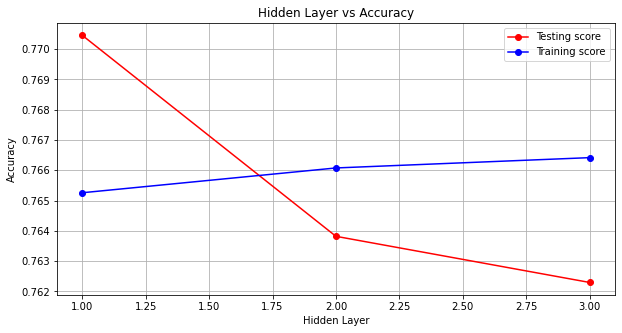

In [54]:
# Plot learning curve
fig, ax = plt.subplots(1, 1, figsize=(10, 5))
    
ax.set_title('Hidden Layer vs Accuracy')
ax.set_xlabel("Hidden Layer")
ax.set_ylabel("Accuracy")
ax.grid()

x = [1,2,3]

ax.plot(x, [Average_accuracy_1, Average_accuracy_2, Average_accuracy_3], 'o-', color="r", label="Testing score")
ax.plot(x, [Average_Unit_1, Average_Unit_2, Average_Unit_3], 'o-', color="b", label="Training score")
ax.legend(loc="best")

plt.show()

### Best Number of Epoch

In [56]:
X_wineWhite = np.asarray(X_wineWhite)
y_wineWhite = np.asarray(y_wineWhite)

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


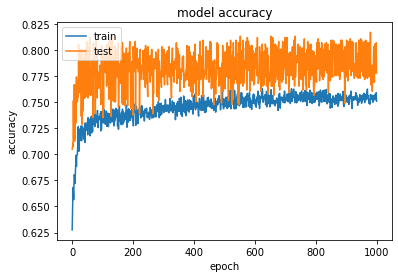

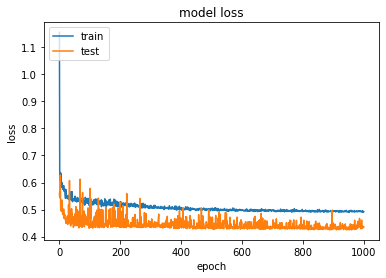

In [57]:
model_1 = keras.models.Sequential([
            keras.layers.Dense(17, activation = 'relu', input_shape=(11,)), 
            keras.layers.Dense(1, activation = 'sigmoid')])
# Compile model
model_1.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
# Fit the model
history = model_1.fit(X_wineWhite, y_wineWhite, epochs=1000, batch_size=10, verbose=0, validation_split=0.2,) 
# list all data in history
print(history.history.keys())
# summarize history for accuracy
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

### (b) Analysis of the effects of different activation functions, such as relu, tanh, and logistic functions. 

In [59]:
from sklearn import metrics
from sklearn.model_selection import KFold
from tensorflow import keras

kf = KFold(n_splits=10, random_state=None, shuffle=True)
i = 1
AverageTraining = []
AverageTesting = []

for train_index, test_index in kf.split(X_trainRed):
    print("CV: {:.1f}".format(i))  
    X_train_cv, X_test_cv = X_trainRed[train_index], X_trainRed[test_index]
    y_train_cv, y_test_cv = y_trainRed[train_index], y_trainRed[test_index]
    
    
    for j in ['relu','tanh','sigmoid']:
        print("Activation Function: ", j)
        model_1 = keras.models.Sequential([
            keras.layers.Dense(17, activation = 'relu', input_shape=(11,)), 
            keras.layers.Dense(1, activation = 'sigmoid')])
        
        model_1.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])  
        fit_score = model_1.fit(X_train_cv, y_train_cv, epochs=100, batch_size=10, verbose=1)
        model_1.evaluate(X_test_cv, y_test_cv,verbose=1)
        AverageTesting.append(model_1.evaluate(X_test_cv, y_test_cv,verbose=1))
        AverageTraining.append(Average(fit_score.history['accuracy']))
        print('\n')
    i = i + 1
print(AverageTraining)
print(AverageTesting)

CV: 1.0
Activation Function:  relu
Train on 978 samples
Epoch 1/100
978/978 [==============================] - 1s 1ms/sample - loss: 0.6843 - accuracy: 0.6462
Epoch 2/100
978/978 [==============================] - 0s 164us/sample - loss: 0.5918 - accuracy: 0.6933
Epoch 3/100
978/978 [==============================] - 0s 168us/sample - loss: 0.5576 - accuracy: 0.7178
Epoch 4/100
978/978 [==============================] - 0s 171us/sample - loss: 0.5417 - accuracy: 0.7209
Epoch 5/100
978/978 [==============================] - 0s 178us/sample - loss: 0.5323 - accuracy: 0.7331
Epoch 6/100
978/978 [==============================] - 0s 186us/sample - loss: 0.5258 - accuracy: 0.7301
Epoch 7/100
978/978 [==============================] - 0s 173us/sample - loss: 0.5196 - accuracy: 0.7331
Epoch 8/100
978/978 [==============================] - 0s 174us/sample - loss: 0.5146 - accuracy: 0.7362
Epoch 9/100
978/978 [==============================] - 0s 175us/sample - loss: 0.5107 - accuracy: 0.7485
E

978/978 [==============================] - 0s 170us/sample - loss: 0.4453 - accuracy: 0.7873
Epoch 78/100
978/978 [==============================] - 0s 156us/sample - loss: 0.4455 - accuracy: 0.7904
Epoch 79/100
978/978 [==============================] - 0s 159us/sample - loss: 0.4453 - accuracy: 0.7863
Epoch 80/100
978/978 [==============================] - 0s 156us/sample - loss: 0.4452 - accuracy: 0.7853
Epoch 81/100
978/978 [==============================] - 0s 154us/sample - loss: 0.4446 - accuracy: 0.7853
Epoch 82/100
978/978 [==============================] - 0s 171us/sample - loss: 0.4443 - accuracy: 0.7904
Epoch 83/100
978/978 [==============================] - 0s 157us/sample - loss: 0.4433 - accuracy: 0.7873
Epoch 84/100
978/978 [==============================] - 0s 160us/sample - loss: 0.4429 - accuracy: 0.7883
Epoch 85/100
978/978 [==============================] - 0s 158us/sample - loss: 0.4428 - accuracy: 0.7914
Epoch 86/100
978/978 [==============================] - 0s 



Activation Function:  tanh
Train on 978 samples
Epoch 1/100
978/978 [==============================] - 1s 866us/sample - loss: 0.7120 - accuracy: 0.5501
Epoch 2/100
978/978 [==============================] - 0s 164us/sample - loss: 0.6059 - accuracy: 0.6943
Epoch 3/100
978/978 [==============================] - 0s 188us/sample - loss: 0.5584 - accuracy: 0.7280
Epoch 4/100
978/978 [==============================] - 0s 172us/sample - loss: 0.5400 - accuracy: 0.7311
Epoch 5/100
978/978 [==============================] - 0s 163us/sample - loss: 0.5308 - accuracy: 0.7311
Epoch 6/100
978/978 [==============================] - 0s 167us/sample - loss: 0.5252 - accuracy: 0.7321
Epoch 7/100
978/978 [==============================] - 0s 173us/sample - loss: 0.5215 - accuracy: 0.7362
Epoch 8/100
978/978 [==============================] - 0s 166us/sample - loss: 0.5193 - accuracy: 0.7372
Epoch 9/100
978/978 [==============================] - 0s 165us/sample - loss: 0.5156 - accuracy: 0.7362
Epoch

978/978 [==============================] - 0s 231us/sample - loss: 0.4600 - accuracy: 0.7832
Epoch 78/100
978/978 [==============================] - 0s 223us/sample - loss: 0.4605 - accuracy: 0.7822
Epoch 79/100
978/978 [==============================] - 0s 247us/sample - loss: 0.4594 - accuracy: 0.7822
Epoch 80/100
978/978 [==============================] - 0s 226us/sample - loss: 0.4596 - accuracy: 0.7771
Epoch 81/100
978/978 [==============================] - 0s 235us/sample - loss: 0.4599 - accuracy: 0.7781
Epoch 82/100
978/978 [==============================] - 0s 229us/sample - loss: 0.4585 - accuracy: 0.7894
Epoch 83/100
978/978 [==============================] - 0s 221us/sample - loss: 0.4579 - accuracy: 0.7832
Epoch 84/100
978/978 [==============================] - 0s 234us/sample - loss: 0.4576 - accuracy: 0.7853
Epoch 85/100
978/978 [==============================] - 0s 223us/sample - loss: 0.4573 - accuracy: 0.7863
Epoch 86/100
978/978 [==============================] - 0s 



Activation Function:  sigmoid
Train on 978 samples
Epoch 1/100
978/978 [==============================] - 1s 1ms/sample - loss: 0.6773 - accuracy: 0.5757
Epoch 2/100
978/978 [==============================] - 0s 207us/sample - loss: 0.6069 - accuracy: 0.6994
Epoch 3/100
978/978 [==============================] - 0s 216us/sample - loss: 0.5690 - accuracy: 0.7270
Epoch 4/100
978/978 [==============================] - 0s 206us/sample - loss: 0.5479 - accuracy: 0.7362
Epoch 5/100
978/978 [==============================] - 0s 210us/sample - loss: 0.5363 - accuracy: 0.7393
Epoch 6/100
978/978 [==============================] - 0s 211us/sample - loss: 0.5280 - accuracy: 0.7423
Epoch 7/100
978/978 [==============================] - 0s 207us/sample - loss: 0.5218 - accuracy: 0.7454
Epoch 8/100
978/978 [==============================] - 0s 198us/sample - loss: 0.5177 - accuracy: 0.7485
Epoch 9/100
978/978 [==============================] - 0s 209us/sample - loss: 0.5146 - accuracy: 0.7505
Epoc

978/978 [==============================] - 0s 236us/sample - loss: 0.4528 - accuracy: 0.7822
Epoch 78/100
978/978 [==============================] - 0s 213us/sample - loss: 0.4517 - accuracy: 0.7832
Epoch 79/100
978/978 [==============================] - 0s 218us/sample - loss: 0.4512 - accuracy: 0.7832
Epoch 80/100
978/978 [==============================] - 0s 209us/sample - loss: 0.4507 - accuracy: 0.7873
Epoch 81/100
978/978 [==============================] - 0s 213us/sample - loss: 0.4509 - accuracy: 0.7863
Epoch 82/100
978/978 [==============================] - 0s 224us/sample - loss: 0.4501 - accuracy: 0.7843
Epoch 83/100
978/978 [==============================] - 0s 226us/sample - loss: 0.4495 - accuracy: 0.7843
Epoch 84/100
978/978 [==============================] - 0s 231us/sample - loss: 0.4503 - accuracy: 0.7812
Epoch 85/100
978/978 [==============================] - 0s 218us/sample - loss: 0.4495 - accuracy: 0.7822
Epoch 86/100
978/978 [==============================] - 0s 



CV: 2.0
Activation Function:  relu
Train on 978 samples
Epoch 1/100
978/978 [==============================] - 1s 1ms/sample - loss: 0.7043 - accuracy: 0.5051
Epoch 2/100
978/978 [==============================] - 0s 239us/sample - loss: 0.6229 - accuracy: 0.6483
Epoch 3/100
978/978 [==============================] - 0s 238us/sample - loss: 0.5848 - accuracy: 0.6984
Epoch 4/100
978/978 [==============================] - 0s 237us/sample - loss: 0.5615 - accuracy: 0.7188
Epoch 5/100
978/978 [==============================] - 0s 233us/sample - loss: 0.5462 - accuracy: 0.7260
Epoch 6/100
978/978 [==============================] - 0s 222us/sample - loss: 0.5362 - accuracy: 0.7362
Epoch 7/100
978/978 [==============================] - 0s 234us/sample - loss: 0.5299 - accuracy: 0.7382
Epoch 8/100
978/978 [==============================] - 0s 217us/sample - loss: 0.5246 - accuracy: 0.7434
Epoch 9/100
978/978 [==============================] - 0s 222us/sample - loss: 0.5220 - accuracy: 0.7423

978/978 [==============================] - 0s 208us/sample - loss: 0.4627 - accuracy: 0.7843
Epoch 78/100
978/978 [==============================] - 0s 208us/sample - loss: 0.4627 - accuracy: 0.7812
Epoch 79/100
978/978 [==============================] - 0s 197us/sample - loss: 0.4620 - accuracy: 0.7832
Epoch 80/100
978/978 [==============================] - 0s 202us/sample - loss: 0.4616 - accuracy: 0.7822
Epoch 81/100
978/978 [==============================] - 0s 199us/sample - loss: 0.4612 - accuracy: 0.7802
Epoch 82/100
978/978 [==============================] - 0s 192us/sample - loss: 0.4607 - accuracy: 0.7832
Epoch 83/100
978/978 [==============================] - 0s 204us/sample - loss: 0.4610 - accuracy: 0.7802
Epoch 84/100
978/978 [==============================] - 0s 209us/sample - loss: 0.4598 - accuracy: 0.7853
Epoch 85/100
978/978 [==============================] - 0s 206us/sample - loss: 0.4595 - accuracy: 0.7812
Epoch 86/100
978/978 [==============================] - 0s 



Activation Function:  tanh
Train on 978 samples
Epoch 1/100
978/978 [==============================] - 1s 1000us/sample - loss: 0.6461 - accuracy: 0.6196
Epoch 2/100
978/978 [==============================] - 0s 205us/sample - loss: 0.5681 - accuracy: 0.7157
Epoch 3/100
978/978 [==============================] - 0s 210us/sample - loss: 0.5423 - accuracy: 0.7260
Epoch 4/100
978/978 [==============================] - 0s 205us/sample - loss: 0.5296 - accuracy: 0.7321
Epoch 5/100
978/978 [==============================] - 0s 204us/sample - loss: 0.5215 - accuracy: 0.7352
Epoch 6/100
978/978 [==============================] - 0s 217us/sample - loss: 0.5165 - accuracy: 0.7352
Epoch 7/100
978/978 [==============================] - 0s 189us/sample - loss: 0.5117 - accuracy: 0.7434
Epoch 8/100
978/978 [==============================] - 0s 187us/sample - loss: 0.5089 - accuracy: 0.7434
Epoch 9/100
978/978 [==============================] - 0s 185us/sample - loss: 0.5054 - accuracy: 0.7485
Epoc

978/978 [==============================] - 0s 201us/sample - loss: 0.4554 - accuracy: 0.7740
Epoch 78/100
978/978 [==============================] - 0s 202us/sample - loss: 0.4540 - accuracy: 0.7720
Epoch 79/100
978/978 [==============================] - 0s 196us/sample - loss: 0.4544 - accuracy: 0.7802
Epoch 80/100
978/978 [==============================] - 0s 201us/sample - loss: 0.4541 - accuracy: 0.7751
Epoch 81/100
978/978 [==============================] - 0s 189us/sample - loss: 0.4536 - accuracy: 0.7720
Epoch 82/100
978/978 [==============================] - 0s 200us/sample - loss: 0.4537 - accuracy: 0.7751
Epoch 83/100
978/978 [==============================] - 0s 197us/sample - loss: 0.4533 - accuracy: 0.7740
Epoch 84/100
978/978 [==============================] - 0s 193us/sample - loss: 0.4525 - accuracy: 0.7761
Epoch 85/100
978/978 [==============================] - 0s 198us/sample - loss: 0.4524 - accuracy: 0.7710
Epoch 86/100
978/978 [==============================] - 0s 



Activation Function:  sigmoid
Train on 978 samples
Epoch 1/100
978/978 [==============================] - 1s 973us/sample - loss: 0.7206 - accuracy: 0.5102
Epoch 2/100
978/978 [==============================] - 0s 188us/sample - loss: 0.6096 - accuracy: 0.7025
Epoch 3/100
978/978 [==============================] - 0s 192us/sample - loss: 0.5643 - accuracy: 0.7331
Epoch 4/100
978/978 [==============================] - 0s 193us/sample - loss: 0.5441 - accuracy: 0.7260
Epoch 5/100
978/978 [==============================] - 0s 189us/sample - loss: 0.5332 - accuracy: 0.7372
Epoch 6/100
978/978 [==============================] - 0s 190us/sample - loss: 0.5281 - accuracy: 0.7352
Epoch 7/100
978/978 [==============================] - 0s 189us/sample - loss: 0.5232 - accuracy: 0.7393
Epoch 8/100
978/978 [==============================] - 0s 193us/sample - loss: 0.5198 - accuracy: 0.7372
Epoch 9/100
978/978 [==============================] - 0s 188us/sample - loss: 0.5174 - accuracy: 0.7413
Ep

978/978 [==============================] - 0s 212us/sample - loss: 0.4568 - accuracy: 0.7822
Epoch 78/100
978/978 [==============================] - 0s 216us/sample - loss: 0.4573 - accuracy: 0.7751
Epoch 79/100
978/978 [==============================] - 0s 209us/sample - loss: 0.4570 - accuracy: 0.7781
Epoch 80/100
978/978 [==============================] - 0s 214us/sample - loss: 0.4559 - accuracy: 0.7822
Epoch 81/100
978/978 [==============================] - 0s 201us/sample - loss: 0.4558 - accuracy: 0.7812
Epoch 82/100
978/978 [==============================] - 0s 196us/sample - loss: 0.4547 - accuracy: 0.7843
Epoch 83/100
978/978 [==============================] - 0s 210us/sample - loss: 0.4551 - accuracy: 0.7802
Epoch 84/100
978/978 [==============================] - 0s 201us/sample - loss: 0.4544 - accuracy: 0.7822
Epoch 85/100
978/978 [==============================] - 0s 212us/sample - loss: 0.4536 - accuracy: 0.7791
Epoch 86/100
978/978 [==============================] - 0s 



CV: 3.0
Activation Function:  relu
Train on 978 samples
Epoch 1/100
978/978 [==============================] - 1s 1ms/sample - loss: 0.7126 - accuracy: 0.5174
Epoch 2/100
978/978 [==============================] - 0s 221us/sample - loss: 0.6294 - accuracy: 0.6646
Epoch 3/100
978/978 [==============================] - 0s 220us/sample - loss: 0.5797 - accuracy: 0.7086
Epoch 4/100
978/978 [==============================] - 0s 226us/sample - loss: 0.5529 - accuracy: 0.7188
Epoch 5/100
978/978 [==============================] - 0s 212us/sample - loss: 0.5385 - accuracy: 0.7260
Epoch 6/100
978/978 [==============================] - 0s 213us/sample - loss: 0.5298 - accuracy: 0.7434
Epoch 7/100
978/978 [==============================] - 0s 218us/sample - loss: 0.5245 - accuracy: 0.7290
Epoch 8/100
978/978 [==============================] - 0s 212us/sample - loss: 0.5189 - accuracy: 0.7352
Epoch 9/100
978/978 [==============================] - 0s 211us/sample - loss: 0.5154 - accuracy: 0.7352

978/978 [==============================] - 0s 233us/sample - loss: 0.4466 - accuracy: 0.7965
Epoch 78/100
978/978 [==============================] - 0s 224us/sample - loss: 0.4459 - accuracy: 0.7945
Epoch 79/100
978/978 [==============================] - 0s 224us/sample - loss: 0.4453 - accuracy: 0.7986
Epoch 80/100
978/978 [==============================] - 0s 226us/sample - loss: 0.4448 - accuracy: 0.7904
Epoch 81/100
978/978 [==============================] - 0s 249us/sample - loss: 0.4445 - accuracy: 0.7914
Epoch 82/100
978/978 [==============================] - 0s 252us/sample - loss: 0.4432 - accuracy: 0.7935
Epoch 83/100
978/978 [==============================] - 0s 255us/sample - loss: 0.4428 - accuracy: 0.7914
Epoch 84/100
978/978 [==============================] - 0s 223us/sample - loss: 0.4426 - accuracy: 0.7955
Epoch 85/100
978/978 [==============================] - 0s 232us/sample - loss: 0.4421 - accuracy: 0.7945
Epoch 86/100
978/978 [==============================] - 0s 



Activation Function:  tanh
Train on 978 samples
Epoch 1/100
978/978 [==============================] - 1s 1ms/sample - loss: 0.7013 - accuracy: 0.5644
Epoch 2/100
978/978 [==============================] - 0s 235us/sample - loss: 0.6284 - accuracy: 0.6605
Epoch 3/100
978/978 [==============================] - 0s 230us/sample - loss: 0.5892 - accuracy: 0.6953
Epoch 4/100
978/978 [==============================] - 0s 232us/sample - loss: 0.5669 - accuracy: 0.7076
Epoch 5/100
978/978 [==============================] - 0s 224us/sample - loss: 0.5534 - accuracy: 0.7219
Epoch 6/100
978/978 [==============================] - 0s 213us/sample - loss: 0.5426 - accuracy: 0.7249
Epoch 7/100
978/978 [==============================] - 0s 209us/sample - loss: 0.5355 - accuracy: 0.7290
Epoch 8/100
978/978 [==============================] - 0s 218us/sample - loss: 0.5284 - accuracy: 0.7393
Epoch 9/100
978/978 [==============================] - 0s 217us/sample - loss: 0.5228 - accuracy: 0.7454
Epoch 1

Epoch 78/100
978/978 [==============================] - 0s 232us/sample - loss: 0.4494 - accuracy: 0.7894
Epoch 79/100
978/978 [==============================] - 0s 232us/sample - loss: 0.4503 - accuracy: 0.7843
Epoch 80/100
978/978 [==============================] - 0s 213us/sample - loss: 0.4498 - accuracy: 0.7843
Epoch 81/100
978/978 [==============================] - 0s 216us/sample - loss: 0.4489 - accuracy: 0.7904
Epoch 82/100
978/978 [==============================] - 0s 229us/sample - loss: 0.4479 - accuracy: 0.7904
Epoch 83/100
978/978 [==============================] - 0s 226us/sample - loss: 0.4479 - accuracy: 0.7822
Epoch 84/100
978/978 [==============================] - 0s 235us/sample - loss: 0.4473 - accuracy: 0.7914
Epoch 85/100
978/978 [==============================] - 0s 235us/sample - loss: 0.4471 - accuracy: 0.7894
Epoch 86/100
978/978 [==============================] - 0s 241us/sample - loss: 0.4464 - accuracy: 0.7904
Epoch 87/100
978/978 [========================



Activation Function:  sigmoid
Train on 978 samples
Epoch 1/100
978/978 [==============================] - 1s 1ms/sample - loss: 0.7988 - accuracy: 0.4867
Epoch 2/100
978/978 [==============================] - 0s 229us/sample - loss: 0.6768 - accuracy: 0.5665
Epoch 3/100
978/978 [==============================] - 0s 189us/sample - loss: 0.6224 - accuracy: 0.6462
Epoch 4/100
978/978 [==============================] - 0s 200us/sample - loss: 0.5888 - accuracy: 0.7127
Epoch 5/100
978/978 [==============================] - 0s 207us/sample - loss: 0.5649 - accuracy: 0.7321
Epoch 6/100
978/978 [==============================] - 0s 202us/sample - loss: 0.5478 - accuracy: 0.7423
Epoch 7/100
978/978 [==============================] - 0s 206us/sample - loss: 0.5360 - accuracy: 0.7526
Epoch 8/100
978/978 [==============================] - 0s 191us/sample - loss: 0.5265 - accuracy: 0.7587
Epoch 9/100
978/978 [==============================] - 0s 195us/sample - loss: 0.5204 - accuracy: 0.7515
Epoc

978/978 [==============================] - 0s 180us/sample - loss: 0.4547 - accuracy: 0.7894
Epoch 78/100
978/978 [==============================] - 0s 180us/sample - loss: 0.4548 - accuracy: 0.7914
Epoch 79/100
978/978 [==============================] - 0s 175us/sample - loss: 0.4540 - accuracy: 0.7894
Epoch 80/100
978/978 [==============================] - 0s 178us/sample - loss: 0.4533 - accuracy: 0.7904
Epoch 81/100
978/978 [==============================] - 0s 176us/sample - loss: 0.4534 - accuracy: 0.7883
Epoch 82/100
978/978 [==============================] - 0s 186us/sample - loss: 0.4524 - accuracy: 0.7914
Epoch 83/100
978/978 [==============================] - 0s 222us/sample - loss: 0.4523 - accuracy: 0.7894
Epoch 84/100
978/978 [==============================] - 0s 209us/sample - loss: 0.4509 - accuracy: 0.7863
Epoch 85/100
978/978 [==============================] - 0s 194us/sample - loss: 0.4511 - accuracy: 0.7914
Epoch 86/100
978/978 [==============================] - 0s 



CV: 4.0
Activation Function:  relu
Train on 978 samples
Epoch 1/100
978/978 [==============================] - 1s 956us/sample - loss: 0.7187 - accuracy: 0.5389
Epoch 2/100
978/978 [==============================] - 0s 184us/sample - loss: 0.6202 - accuracy: 0.6810
Epoch 3/100
978/978 [==============================] - 0s 186us/sample - loss: 0.5761 - accuracy: 0.7147
Epoch 4/100
978/978 [==============================] - 0s 183us/sample - loss: 0.5530 - accuracy: 0.7301
Epoch 5/100
978/978 [==============================] - 0s 180us/sample - loss: 0.5395 - accuracy: 0.7331
Epoch 6/100
978/978 [==============================] - 0s 180us/sample - loss: 0.5316 - accuracy: 0.7342
Epoch 7/100
978/978 [==============================] - 0s 176us/sample - loss: 0.5259 - accuracy: 0.7393
Epoch 8/100
978/978 [==============================] - 0s 183us/sample - loss: 0.5220 - accuracy: 0.7434
Epoch 9/100
978/978 [==============================] - 0s 185us/sample - loss: 0.5182 - accuracy: 0.74

978/978 [==============================] - 0s 176us/sample - loss: 0.4549 - accuracy: 0.7832
Epoch 78/100
978/978 [==============================] - 0s 173us/sample - loss: 0.4549 - accuracy: 0.7883
Epoch 79/100
978/978 [==============================] - 0s 171us/sample - loss: 0.4548 - accuracy: 0.7924
Epoch 80/100
978/978 [==============================] - 0s 176us/sample - loss: 0.4545 - accuracy: 0.7832
Epoch 81/100
978/978 [==============================] - 0s 172us/sample - loss: 0.4533 - accuracy: 0.7935
Epoch 82/100
978/978 [==============================] - 0s 175us/sample - loss: 0.4535 - accuracy: 0.7873
Epoch 83/100
978/978 [==============================] - 0s 173us/sample - loss: 0.4534 - accuracy: 0.7883
Epoch 84/100
978/978 [==============================] - 0s 173us/sample - loss: 0.4533 - accuracy: 0.7843
Epoch 85/100
978/978 [==============================] - 0s 172us/sample - loss: 0.4534 - accuracy: 0.7894
Epoch 86/100
978/978 [==============================] - 0s 



Activation Function:  tanh
Train on 978 samples
Epoch 1/100
978/978 [==============================] - 1s 991us/sample - loss: 0.6244 - accuracy: 0.6861
Epoch 2/100
978/978 [==============================] - 0s 192us/sample - loss: 0.5802 - accuracy: 0.7168
Epoch 3/100
978/978 [==============================] - 0s 188us/sample - loss: 0.5592 - accuracy: 0.7178
Epoch 4/100
978/978 [==============================] - 0s 184us/sample - loss: 0.5465 - accuracy: 0.7198
Epoch 5/100
978/978 [==============================] - 0s 169us/sample - loss: 0.5384 - accuracy: 0.7239
Epoch 6/100
978/978 [==============================] - 0s 167us/sample - loss: 0.5330 - accuracy: 0.7249
Epoch 7/100
978/978 [==============================] - 0s 171us/sample - loss: 0.5284 - accuracy: 0.7249
Epoch 8/100
978/978 [==============================] - 0s 176us/sample - loss: 0.5239 - accuracy: 0.7331
Epoch 9/100
978/978 [==============================] - 0s 169us/sample - loss: 0.5208 - accuracy: 0.7331
Epoch

978/978 [==============================] - 0s 178us/sample - loss: 0.4595 - accuracy: 0.7894
Epoch 78/100
978/978 [==============================] - 0s 177us/sample - loss: 0.4582 - accuracy: 0.7883
Epoch 79/100
978/978 [==============================] - 0s 175us/sample - loss: 0.4597 - accuracy: 0.7935
Epoch 80/100
978/978 [==============================] - 0s 171us/sample - loss: 0.4581 - accuracy: 0.7924
Epoch 81/100
978/978 [==============================] - 0s 167us/sample - loss: 0.4585 - accuracy: 0.7904
Epoch 82/100
978/978 [==============================] - 0s 170us/sample - loss: 0.4584 - accuracy: 0.7883
Epoch 83/100
978/978 [==============================] - 0s 169us/sample - loss: 0.4579 - accuracy: 0.7883
Epoch 84/100
978/978 [==============================] - 0s 171us/sample - loss: 0.4571 - accuracy: 0.7945
Epoch 85/100
978/978 [==============================] - 0s 168us/sample - loss: 0.4570 - accuracy: 0.7924
Epoch 86/100
978/978 [==============================] - 0s 



Activation Function:  sigmoid
Train on 978 samples
Epoch 1/100
978/978 [==============================] - 1s 982us/sample - loss: 0.7001 - accuracy: 0.5481
Epoch 2/100
978/978 [==============================] - 0s 207us/sample - loss: 0.6144 - accuracy: 0.6748
Epoch 3/100
978/978 [==============================] - 0s 196us/sample - loss: 0.5750 - accuracy: 0.7137
Epoch 4/100
978/978 [==============================] - 0s 177us/sample - loss: 0.5524 - accuracy: 0.7260
Epoch 5/100
978/978 [==============================] - 0s 178us/sample - loss: 0.5384 - accuracy: 0.7362
Epoch 6/100
978/978 [==============================] - 0s 202us/sample - loss: 0.5301 - accuracy: 0.7352
Epoch 7/100
978/978 [==============================] - 0s 194us/sample - loss: 0.5239 - accuracy: 0.7454
Epoch 8/100
978/978 [==============================] - 0s 204us/sample - loss: 0.5191 - accuracy: 0.7454
Epoch 9/100
978/978 [==============================] - 0s 193us/sample - loss: 0.5152 - accuracy: 0.7444
Ep

978/978 [==============================] - 0s 174us/sample - loss: 0.4467 - accuracy: 0.7955
Epoch 78/100
978/978 [==============================] - 0s 174us/sample - loss: 0.4475 - accuracy: 0.7975
Epoch 79/100
978/978 [==============================] - 0s 181us/sample - loss: 0.4468 - accuracy: 0.7955
Epoch 80/100
978/978 [==============================] - 0s 184us/sample - loss: 0.4467 - accuracy: 0.7945
Epoch 81/100
978/978 [==============================] - 0s 186us/sample - loss: 0.4462 - accuracy: 0.7965
Epoch 82/100
978/978 [==============================] - 0s 175us/sample - loss: 0.4452 - accuracy: 0.7986
Epoch 83/100
978/978 [==============================] - 0s 196us/sample - loss: 0.4450 - accuracy: 0.7955
Epoch 84/100
978/978 [==============================] - 0s 203us/sample - loss: 0.4456 - accuracy: 0.7935
Epoch 85/100
978/978 [==============================] - 0s 178us/sample - loss: 0.4446 - accuracy: 0.7975
Epoch 86/100
978/978 [==============================] - 0s 



CV: 5.0
Activation Function:  relu
Train on 978 samples
Epoch 1/100
978/978 [==============================] - 1s 972us/sample - loss: 0.6870 - accuracy: 0.5777
Epoch 2/100
978/978 [==============================] - 0s 183us/sample - loss: 0.5944 - accuracy: 0.6963
Epoch 3/100
978/978 [==============================] - 0s 178us/sample - loss: 0.5577 - accuracy: 0.7127
Epoch 4/100
978/978 [==============================] - 0s 172us/sample - loss: 0.5412 - accuracy: 0.7239
Epoch 5/100
978/978 [==============================] - 0s 174us/sample - loss: 0.5315 - accuracy: 0.7342
Epoch 6/100
978/978 [==============================] - 0s 176us/sample - loss: 0.5254 - accuracy: 0.7311
Epoch 7/100
978/978 [==============================] - 0s 172us/sample - loss: 0.5201 - accuracy: 0.7331
Epoch 8/100
978/978 [==============================] - 0s 176us/sample - loss: 0.5157 - accuracy: 0.7331
Epoch 9/100
978/978 [==============================] - 0s 175us/sample - loss: 0.5124 - accuracy: 0.73

978/978 [==============================] - 0s 180us/sample - loss: 0.4483 - accuracy: 0.7873
Epoch 78/100
978/978 [==============================] - 0s 183us/sample - loss: 0.4475 - accuracy: 0.7843
Epoch 79/100
978/978 [==============================] - 0s 186us/sample - loss: 0.4471 - accuracy: 0.7802
Epoch 80/100
978/978 [==============================] - 0s 177us/sample - loss: 0.4476 - accuracy: 0.7883
Epoch 81/100
978/978 [==============================] - 0s 197us/sample - loss: 0.4467 - accuracy: 0.7894
Epoch 82/100
978/978 [==============================] - 0s 182us/sample - loss: 0.4478 - accuracy: 0.7843
Epoch 83/100
978/978 [==============================] - 0s 181us/sample - loss: 0.4461 - accuracy: 0.7883
Epoch 84/100
978/978 [==============================] - 0s 184us/sample - loss: 0.4452 - accuracy: 0.7894
Epoch 85/100
978/978 [==============================] - 0s 180us/sample - loss: 0.4452 - accuracy: 0.7863
Epoch 86/100
978/978 [==============================] - 0s 



Activation Function:  tanh
Train on 978 samples
Epoch 1/100
978/978 [==============================] - 1s 958us/sample - loss: 0.7354 - accuracy: 0.5235
Epoch 2/100
978/978 [==============================] - 0s 175us/sample - loss: 0.6221 - accuracy: 0.6677
Epoch 3/100
978/978 [==============================] - 0s 168us/sample - loss: 0.5672 - accuracy: 0.7249
Epoch 4/100
978/978 [==============================] - 0s 171us/sample - loss: 0.5405 - accuracy: 0.7362
Epoch 5/100
978/978 [==============================] - 0s 172us/sample - loss: 0.5267 - accuracy: 0.7372
Epoch 6/100
978/978 [==============================] - 0s 167us/sample - loss: 0.5187 - accuracy: 0.7403
Epoch 7/100
978/978 [==============================] - 0s 170us/sample - loss: 0.5131 - accuracy: 0.7434
Epoch 8/100
978/978 [==============================] - 0s 169us/sample - loss: 0.5096 - accuracy: 0.7485
Epoch 9/100
978/978 [==============================] - 0s 169us/sample - loss: 0.5059 - accuracy: 0.7566
Epoch

978/978 [==============================] - 0s 173us/sample - loss: 0.4466 - accuracy: 0.7863
Epoch 78/100
978/978 [==============================] - 0s 171us/sample - loss: 0.4459 - accuracy: 0.7883
Epoch 79/100
978/978 [==============================] - 0s 175us/sample - loss: 0.4454 - accuracy: 0.7853
Epoch 80/100
978/978 [==============================] - 0s 177us/sample - loss: 0.4457 - accuracy: 0.7822
Epoch 81/100
978/978 [==============================] - 0s 172us/sample - loss: 0.4460 - accuracy: 0.7843
Epoch 82/100
978/978 [==============================] - 0s 178us/sample - loss: 0.4450 - accuracy: 0.7873
Epoch 83/100
978/978 [==============================] - 0s 175us/sample - loss: 0.4453 - accuracy: 0.7771
Epoch 84/100
978/978 [==============================] - 0s 175us/sample - loss: 0.4436 - accuracy: 0.7853
Epoch 85/100
978/978 [==============================] - 0s 172us/sample - loss: 0.4447 - accuracy: 0.7883
Epoch 86/100
978/978 [==============================] - 0s 



Activation Function:  sigmoid
Train on 978 samples
Epoch 1/100
978/978 [==============================] - 1s 939us/sample - loss: 0.6651 - accuracy: 0.6299
Epoch 2/100
978/978 [==============================] - 0s 173us/sample - loss: 0.5833 - accuracy: 0.7168
Epoch 3/100
978/978 [==============================] - 0s 171us/sample - loss: 0.5493 - accuracy: 0.7331
Epoch 4/100
978/978 [==============================] - 0s 170us/sample - loss: 0.5318 - accuracy: 0.7423
Epoch 5/100
978/978 [==============================] - 0s 169us/sample - loss: 0.5216 - accuracy: 0.7423
Epoch 6/100
978/978 [==============================] - 0s 168us/sample - loss: 0.5151 - accuracy: 0.7434
Epoch 7/100
978/978 [==============================] - 0s 171us/sample - loss: 0.5104 - accuracy: 0.7464
Epoch 8/100
978/978 [==============================] - 0s 171us/sample - loss: 0.5069 - accuracy: 0.7505
Epoch 9/100
978/978 [==============================] - 0s 169us/sample - loss: 0.5047 - accuracy: 0.7515
Ep

978/978 [==============================] - 0s 181us/sample - loss: 0.4436 - accuracy: 0.7986
Epoch 78/100
978/978 [==============================] - 0s 178us/sample - loss: 0.4431 - accuracy: 0.7945
Epoch 79/100
978/978 [==============================] - 0s 184us/sample - loss: 0.4424 - accuracy: 0.7996
Epoch 80/100
978/978 [==============================] - 0s 181us/sample - loss: 0.4429 - accuracy: 0.7975
Epoch 81/100
978/978 [==============================] - 0s 174us/sample - loss: 0.4421 - accuracy: 0.7924
Epoch 82/100
978/978 [==============================] - 0s 170us/sample - loss: 0.4422 - accuracy: 0.7955
Epoch 83/100
978/978 [==============================] - 0s 170us/sample - loss: 0.4419 - accuracy: 0.8016
Epoch 84/100
978/978 [==============================] - 0s 168us/sample - loss: 0.4409 - accuracy: 0.7914
Epoch 85/100
978/978 [==============================] - 0s 170us/sample - loss: 0.4407 - accuracy: 0.7955
Epoch 86/100
978/978 [==============================] - 0s 



CV: 6.0
Activation Function:  relu
Train on 978 samples
Epoch 1/100
978/978 [==============================] - 1s 936us/sample - loss: 0.7510 - accuracy: 0.4622
Epoch 2/100
978/978 [==============================] - 0s 169us/sample - loss: 0.6378 - accuracy: 0.6472
Epoch 3/100
978/978 [==============================] - 0s 168us/sample - loss: 0.5875 - accuracy: 0.7219
Epoch 4/100
978/978 [==============================] - 0s 171us/sample - loss: 0.5596 - accuracy: 0.7362
Epoch 5/100
978/978 [==============================] - 0s 169us/sample - loss: 0.5436 - accuracy: 0.7393
Epoch 6/100
978/978 [==============================] - 0s 171us/sample - loss: 0.5326 - accuracy: 0.7413
Epoch 7/100
978/978 [==============================] - 0s 171us/sample - loss: 0.5255 - accuracy: 0.7413
Epoch 8/100
978/978 [==============================] - 0s 169us/sample - loss: 0.5193 - accuracy: 0.7474
Epoch 9/100
978/978 [==============================] - 0s 171us/sample - loss: 0.5147 - accuracy: 0.75

978/978 [==============================] - 0s 157us/sample - loss: 0.4420 - accuracy: 0.7945
Epoch 78/100
978/978 [==============================] - 0s 155us/sample - loss: 0.4424 - accuracy: 0.7924
Epoch 79/100
978/978 [==============================] - 0s 157us/sample - loss: 0.4411 - accuracy: 0.7975
Epoch 80/100
978/978 [==============================] - 0s 159us/sample - loss: 0.4411 - accuracy: 0.7955
Epoch 81/100
978/978 [==============================] - 0s 160us/sample - loss: 0.4410 - accuracy: 0.7975
Epoch 82/100
978/978 [==============================] - 0s 158us/sample - loss: 0.4403 - accuracy: 0.7945
Epoch 83/100
978/978 [==============================] - 0s 157us/sample - loss: 0.4399 - accuracy: 0.7965
Epoch 84/100
978/978 [==============================] - 0s 160us/sample - loss: 0.4395 - accuracy: 0.7945
Epoch 85/100
978/978 [==============================] - 0s 157us/sample - loss: 0.4388 - accuracy: 0.7965
Epoch 86/100
978/978 [==============================] - 0s 



Activation Function:  tanh
Train on 978 samples
Epoch 1/100
978/978 [==============================] - 1s 861us/sample - loss: 0.6286 - accuracy: 0.6524
Epoch 2/100
978/978 [==============================] - 0s 160us/sample - loss: 0.5696 - accuracy: 0.7117
Epoch 3/100
978/978 [==============================] - 0s 160us/sample - loss: 0.5470 - accuracy: 0.7198
Epoch 4/100
978/978 [==============================] - 0s 157us/sample - loss: 0.5349 - accuracy: 0.7290
Epoch 5/100
978/978 [==============================] - 0s 157us/sample - loss: 0.5257 - accuracy: 0.7260
Epoch 6/100
978/978 [==============================] - 0s 160us/sample - loss: 0.5192 - accuracy: 0.7444
Epoch 7/100
978/978 [==============================] - 0s 157us/sample - loss: 0.5127 - accuracy: 0.7444
Epoch 8/100
978/978 [==============================] - 0s 157us/sample - loss: 0.5078 - accuracy: 0.7434
Epoch 9/100
978/978 [==============================] - 0s 157us/sample - loss: 0.5044 - accuracy: 0.7515
Epoch

978/978 [==============================] - 0s 169us/sample - loss: 0.4458 - accuracy: 0.8016
Epoch 78/100
978/978 [==============================] - 0s 169us/sample - loss: 0.4457 - accuracy: 0.7975
Epoch 79/100
978/978 [==============================] - 0s 176us/sample - loss: 0.4446 - accuracy: 0.7996
Epoch 80/100
978/978 [==============================] - 0s 169us/sample - loss: 0.4450 - accuracy: 0.8027
Epoch 81/100
978/978 [==============================] - 0s 175us/sample - loss: 0.4449 - accuracy: 0.7986
Epoch 82/100
978/978 [==============================] - 0s 169us/sample - loss: 0.4441 - accuracy: 0.8006
Epoch 83/100
978/978 [==============================] - 0s 168us/sample - loss: 0.4438 - accuracy: 0.7996
Epoch 84/100
978/978 [==============================] - 0s 169us/sample - loss: 0.4444 - accuracy: 0.8027
Epoch 85/100
978/978 [==============================] - 0s 172us/sample - loss: 0.4438 - accuracy: 0.8027
Epoch 86/100
978/978 [==============================] - 0s 



Activation Function:  sigmoid
Train on 978 samples
Epoch 1/100
978/978 [==============================] - 1s 908us/sample - loss: 0.6942 - accuracy: 0.6012
Epoch 2/100
978/978 [==============================] - 0s 167us/sample - loss: 0.6025 - accuracy: 0.7014
Epoch 3/100
978/978 [==============================] - 0s 163us/sample - loss: 0.5621 - accuracy: 0.7168
Epoch 4/100
978/978 [==============================] - 0s 165us/sample - loss: 0.5409 - accuracy: 0.7209
Epoch 5/100
978/978 [==============================] - 0s 169us/sample - loss: 0.5284 - accuracy: 0.7352
Epoch 6/100
978/978 [==============================] - 0s 186us/sample - loss: 0.5205 - accuracy: 0.7342
Epoch 7/100
978/978 [==============================] - 0s 166us/sample - loss: 0.5155 - accuracy: 0.7403
Epoch 8/100
978/978 [==============================] - 0s 168us/sample - loss: 0.5120 - accuracy: 0.7413
Epoch 9/100
978/978 [==============================] - 0s 164us/sample - loss: 0.5081 - accuracy: 0.7485
Ep

978/978 [==============================] - 0s 171us/sample - loss: 0.4399 - accuracy: 0.7945
Epoch 78/100
978/978 [==============================] - 0s 178us/sample - loss: 0.4388 - accuracy: 0.7955
Epoch 79/100
978/978 [==============================] - 0s 172us/sample - loss: 0.4398 - accuracy: 0.7935
Epoch 80/100
978/978 [==============================] - 0s 172us/sample - loss: 0.4386 - accuracy: 0.7965
Epoch 81/100
978/978 [==============================] - 0s 170us/sample - loss: 0.4384 - accuracy: 0.7986
Epoch 82/100
978/978 [==============================] - 0s 177us/sample - loss: 0.4374 - accuracy: 0.7935
Epoch 83/100
978/978 [==============================] - 0s 171us/sample - loss: 0.4368 - accuracy: 0.7965
Epoch 84/100
978/978 [==============================] - 0s 171us/sample - loss: 0.4369 - accuracy: 0.7986
Epoch 85/100
978/978 [==============================] - 0s 176us/sample - loss: 0.4362 - accuracy: 0.8027
Epoch 86/100
978/978 [==============================] - 0s 



CV: 7.0
Activation Function:  relu
Train on 978 samples
Epoch 1/100
978/978 [==============================] - 15s 16ms/sample - loss: 0.6209 - accuracy: 0.6564
Epoch 2/100
978/978 [==============================] - 0s 166us/sample - loss: 0.5869 - accuracy: 0.7004
Epoch 3/100
978/978 [==============================] - 0s 159us/sample - loss: 0.5662 - accuracy: 0.7239
Epoch 4/100
978/978 [==============================] - 0s 157us/sample - loss: 0.5521 - accuracy: 0.7301
Epoch 5/100
978/978 [==============================] - 0s 157us/sample - loss: 0.5426 - accuracy: 0.7270
Epoch 6/100
978/978 [==============================] - 0s 158us/sample - loss: 0.5346 - accuracy: 0.7290
Epoch 7/100
978/978 [==============================] - 0s 158us/sample - loss: 0.5281 - accuracy: 0.7311
Epoch 8/100
978/978 [==============================] - 0s 163us/sample - loss: 0.5244 - accuracy: 0.7280
Epoch 9/100
978/978 [==============================] - 0s 164us/sample - loss: 0.5195 - accuracy: 0.73

978/978 [==============================] - 0s 183us/sample - loss: 0.4628 - accuracy: 0.7812
Epoch 78/100
978/978 [==============================] - 0s 200us/sample - loss: 0.4614 - accuracy: 0.7822
Epoch 79/100
978/978 [==============================] - 0s 193us/sample - loss: 0.4616 - accuracy: 0.7781
Epoch 80/100
978/978 [==============================] - 0s 186us/sample - loss: 0.4615 - accuracy: 0.7781
Epoch 81/100
978/978 [==============================] - 0s 209us/sample - loss: 0.4600 - accuracy: 0.7863
Epoch 82/100
978/978 [==============================] - 0s 200us/sample - loss: 0.4597 - accuracy: 0.7853
Epoch 83/100
978/978 [==============================] - 0s 193us/sample - loss: 0.4590 - accuracy: 0.7802
Epoch 84/100
978/978 [==============================] - 0s 190us/sample - loss: 0.4589 - accuracy: 0.7802
Epoch 85/100
978/978 [==============================] - 0s 188us/sample - loss: 0.4591 - accuracy: 0.7812
Epoch 86/100
978/978 [==============================] - 0s 



Activation Function:  tanh
Train on 978 samples
Epoch 1/100
978/978 [==============================] - 1s 912us/sample - loss: 0.7649 - accuracy: 0.4611
Epoch 2/100
978/978 [==============================] - 0s 171us/sample - loss: 0.6403 - accuracy: 0.6411
Epoch 3/100
978/978 [==============================] - 0s 171us/sample - loss: 0.5826 - accuracy: 0.7045
Epoch 4/100
978/978 [==============================] - 0s 172us/sample - loss: 0.5542 - accuracy: 0.7209
Epoch 5/100
978/978 [==============================] - 0s 168us/sample - loss: 0.5423 - accuracy: 0.7270
Epoch 6/100
978/978 [==============================] - 0s 176us/sample - loss: 0.5336 - accuracy: 0.7290
Epoch 7/100
978/978 [==============================] - 0s 175us/sample - loss: 0.5294 - accuracy: 0.7352
Epoch 8/100
978/978 [==============================] - 0s 175us/sample - loss: 0.5265 - accuracy: 0.7362
Epoch 9/100
978/978 [==============================] - 0s 179us/sample - loss: 0.5234 - accuracy: 0.7423
Epoch

978/978 [==============================] - 0s 173us/sample - loss: 0.4609 - accuracy: 0.7740
Epoch 78/100
978/978 [==============================] - 0s 177us/sample - loss: 0.4616 - accuracy: 0.7761
Epoch 79/100
978/978 [==============================] - 0s 176us/sample - loss: 0.4612 - accuracy: 0.7771
Epoch 80/100
978/978 [==============================] - 0s 175us/sample - loss: 0.4601 - accuracy: 0.7720
Epoch 81/100
978/978 [==============================] - 0s 177us/sample - loss: 0.4599 - accuracy: 0.7720
Epoch 82/100
978/978 [==============================] - 0s 174us/sample - loss: 0.4600 - accuracy: 0.7730
Epoch 83/100
978/978 [==============================] - 0s 175us/sample - loss: 0.4591 - accuracy: 0.7751
Epoch 84/100
978/978 [==============================] - 0s 172us/sample - loss: 0.4597 - accuracy: 0.7730
Epoch 85/100
978/978 [==============================] - 0s 171us/sample - loss: 0.4580 - accuracy: 0.7771
Epoch 86/100
978/978 [==============================] - 0s 



Activation Function:  sigmoid
Train on 978 samples
Epoch 1/100
978/978 [==============================] - 1s 880us/sample - loss: 0.6278 - accuracy: 0.6370
Epoch 2/100
978/978 [==============================] - 0s 165us/sample - loss: 0.5785 - accuracy: 0.6912
Epoch 3/100
978/978 [==============================] - 0s 163us/sample - loss: 0.5576 - accuracy: 0.7086
Epoch 4/100
978/978 [==============================] - 0s 163us/sample - loss: 0.5471 - accuracy: 0.7147
Epoch 5/100
978/978 [==============================] - 0s 165us/sample - loss: 0.5390 - accuracy: 0.7168
Epoch 6/100
978/978 [==============================] - 0s 167us/sample - loss: 0.5333 - accuracy: 0.7249
Epoch 7/100
978/978 [==============================] - 0s 164us/sample - loss: 0.5278 - accuracy: 0.7301
Epoch 8/100
978/978 [==============================] - 0s 163us/sample - loss: 0.5250 - accuracy: 0.7342
Epoch 9/100
978/978 [==============================] - 0s 163us/sample - loss: 0.5214 - accuracy: 0.7321
Ep

978/978 [==============================] - 0s 172us/sample - loss: 0.4515 - accuracy: 0.7822
Epoch 78/100
978/978 [==============================] - 0s 176us/sample - loss: 0.4509 - accuracy: 0.7853
Epoch 79/100
978/978 [==============================] - 0s 179us/sample - loss: 0.4508 - accuracy: 0.7822
Epoch 80/100
978/978 [==============================] - 0s 171us/sample - loss: 0.4500 - accuracy: 0.7843
Epoch 81/100
978/978 [==============================] - 0s 172us/sample - loss: 0.4509 - accuracy: 0.7781
Epoch 82/100
978/978 [==============================] - 0s 181us/sample - loss: 0.4502 - accuracy: 0.7853
Epoch 83/100
978/978 [==============================] - 0s 169us/sample - loss: 0.4482 - accuracy: 0.7822
Epoch 84/100
978/978 [==============================] - 0s 172us/sample - loss: 0.4488 - accuracy: 0.7843
Epoch 85/100
978/978 [==============================] - 0s 173us/sample - loss: 0.4479 - accuracy: 0.7812
Epoch 86/100
978/978 [==============================] - 0s 



CV: 8.0
Activation Function:  relu
Train on 979 samples
Epoch 1/100
979/979 [==============================] - 1s 956us/sample - loss: 0.7396 - accuracy: 0.5434
Epoch 2/100
979/979 [==============================] - 0s 178us/sample - loss: 0.6299 - accuracy: 0.6670
Epoch 3/100
979/979 [==============================] - 0s 186us/sample - loss: 0.5804 - accuracy: 0.7171
Epoch 4/100
979/979 [==============================] - 0s 179us/sample - loss: 0.5567 - accuracy: 0.7334
Epoch 5/100
979/979 [==============================] - 0s 177us/sample - loss: 0.5438 - accuracy: 0.7365
Epoch 6/100
979/979 [==============================] - 0s 186us/sample - loss: 0.5365 - accuracy: 0.7395
Epoch 7/100
979/979 [==============================] - 0s 187us/sample - loss: 0.5313 - accuracy: 0.7385
Epoch 8/100
979/979 [==============================] - 0s 182us/sample - loss: 0.5268 - accuracy: 0.7365
Epoch 9/100
979/979 [==============================] - 0s 185us/sample - loss: 0.5228 - accuracy: 0.74

979/979 [==============================] - 0s 183us/sample - loss: 0.4520 - accuracy: 0.7865
Epoch 78/100
979/979 [==============================] - 0s 186us/sample - loss: 0.4518 - accuracy: 0.7845
Epoch 79/100
979/979 [==============================] - 0s 183us/sample - loss: 0.4513 - accuracy: 0.7886
Epoch 80/100
979/979 [==============================] - 0s 185us/sample - loss: 0.4516 - accuracy: 0.7926
Epoch 81/100
979/979 [==============================] - 0s 195us/sample - loss: 0.4509 - accuracy: 0.7906
Epoch 82/100
979/979 [==============================] - 0s 177us/sample - loss: 0.4504 - accuracy: 0.7875
Epoch 83/100
979/979 [==============================] - 0s 190us/sample - loss: 0.4496 - accuracy: 0.7875
Epoch 84/100
979/979 [==============================] - 0s 179us/sample - loss: 0.4505 - accuracy: 0.7855
Epoch 85/100
979/979 [==============================] - 0s 186us/sample - loss: 0.4492 - accuracy: 0.7886
Epoch 86/100
979/979 [==============================] - 0s 



Activation Function:  tanh
Train on 979 samples
Epoch 1/100
979/979 [==============================] - 1s 1ms/sample - loss: 0.6484 - accuracy: 0.6057
Epoch 2/100
979/979 [==============================] - 0s 205us/sample - loss: 0.5843 - accuracy: 0.6905
Epoch 3/100
979/979 [==============================] - 0s 229us/sample - loss: 0.5545 - accuracy: 0.7211
Epoch 4/100
979/979 [==============================] - 0s 278us/sample - loss: 0.5390 - accuracy: 0.7324
Epoch 5/100
979/979 [==============================] - 0s 333us/sample - loss: 0.5287 - accuracy: 0.7314
Epoch 6/100
979/979 [==============================] - 0s 251us/sample - loss: 0.5222 - accuracy: 0.7406
Epoch 7/100
979/979 [==============================] - 0s 192us/sample - loss: 0.5167 - accuracy: 0.7406
Epoch 8/100
979/979 [==============================] - 0s 192us/sample - loss: 0.5123 - accuracy: 0.7446
Epoch 9/100
979/979 [==============================] - 0s 200us/sample - loss: 0.5098 - accuracy: 0.7467
Epoch 1

Epoch 78/100
979/979 [==============================] - 0s 192us/sample - loss: 0.4535 - accuracy: 0.7865
Epoch 79/100
979/979 [==============================] - 0s 186us/sample - loss: 0.4525 - accuracy: 0.7814
Epoch 80/100
979/979 [==============================] - 0s 185us/sample - loss: 0.4533 - accuracy: 0.7845
Epoch 81/100
979/979 [==============================] - 0s 188us/sample - loss: 0.4526 - accuracy: 0.7773
Epoch 82/100
979/979 [==============================] - 0s 190us/sample - loss: 0.4527 - accuracy: 0.7835
Epoch 83/100
979/979 [==============================] - 0s 194us/sample - loss: 0.4519 - accuracy: 0.7814
Epoch 84/100
979/979 [==============================] - 0s 188us/sample - loss: 0.4517 - accuracy: 0.7824
Epoch 85/100
979/979 [==============================] - 0s 181us/sample - loss: 0.4509 - accuracy: 0.7804
Epoch 86/100
979/979 [==============================] - 0s 181us/sample - loss: 0.4508 - accuracy: 0.7814
Epoch 87/100
979/979 [========================



Activation Function:  sigmoid
Train on 979 samples
Epoch 1/100
979/979 [==============================] - 1s 919us/sample - loss: 0.6859 - accuracy: 0.5383
Epoch 2/100
979/979 [==============================] - 0s 177us/sample - loss: 0.6085 - accuracy: 0.7058
Epoch 3/100
979/979 [==============================] - 0s 171us/sample - loss: 0.5677 - accuracy: 0.7303
Epoch 4/100
979/979 [==============================] - 0s 172us/sample - loss: 0.5424 - accuracy: 0.7365
Epoch 5/100
979/979 [==============================] - 0s 175us/sample - loss: 0.5284 - accuracy: 0.7395
Epoch 6/100
979/979 [==============================] - 0s 175us/sample - loss: 0.5209 - accuracy: 0.7406
Epoch 7/100
979/979 [==============================] - 0s 171us/sample - loss: 0.5166 - accuracy: 0.7416
Epoch 8/100
979/979 [==============================] - 0s 170us/sample - loss: 0.5132 - accuracy: 0.7395
Epoch 9/100
979/979 [==============================] - 0s 171us/sample - loss: 0.5105 - accuracy: 0.7416
Ep

979/979 [==============================] - 0s 183us/sample - loss: 0.4591 - accuracy: 0.7845
Epoch 78/100
979/979 [==============================] - 0s 179us/sample - loss: 0.4583 - accuracy: 0.7865
Epoch 79/100
979/979 [==============================] - 0s 175us/sample - loss: 0.4579 - accuracy: 0.7845
Epoch 80/100
979/979 [==============================] - 0s 172us/sample - loss: 0.4574 - accuracy: 0.7824
Epoch 81/100
979/979 [==============================] - 0s 172us/sample - loss: 0.4584 - accuracy: 0.7804
Epoch 82/100
979/979 [==============================] - 0s 171us/sample - loss: 0.4571 - accuracy: 0.7824
Epoch 83/100
979/979 [==============================] - 0s 171us/sample - loss: 0.4568 - accuracy: 0.7804
Epoch 84/100
979/979 [==============================] - 0s 175us/sample - loss: 0.4576 - accuracy: 0.7804
Epoch 85/100
979/979 [==============================] - 0s 172us/sample - loss: 0.4561 - accuracy: 0.7824
Epoch 86/100
979/979 [==============================] - 0s 



CV: 9.0
Activation Function:  relu
Train on 979 samples
Epoch 1/100
979/979 [==============================] - 1s 899us/sample - loss: 0.7099 - accuracy: 0.5567
Epoch 2/100
979/979 [==============================] - 0s 163us/sample - loss: 0.6307 - accuracy: 0.6864
Epoch 3/100
979/979 [==============================] - 0s 164us/sample - loss: 0.5833 - accuracy: 0.7160
Epoch 4/100
979/979 [==============================] - 0s 160us/sample - loss: 0.5547 - accuracy: 0.7211
Epoch 5/100
979/979 [==============================] - 0s 160us/sample - loss: 0.5366 - accuracy: 0.7324
Epoch 6/100
979/979 [==============================] - 0s 164us/sample - loss: 0.5252 - accuracy: 0.7375
Epoch 7/100
979/979 [==============================] - 0s 157us/sample - loss: 0.5181 - accuracy: 0.7446
Epoch 8/100
979/979 [==============================] - 0s 159us/sample - loss: 0.5127 - accuracy: 0.7467
Epoch 9/100
979/979 [==============================] - 0s 157us/sample - loss: 0.5085 - accuracy: 0.75

979/979 [==============================] - 0s 175us/sample - loss: 0.4471 - accuracy: 0.7896
Epoch 78/100
979/979 [==============================] - 0s 178us/sample - loss: 0.4469 - accuracy: 0.7916
Epoch 79/100
979/979 [==============================] - 0s 173us/sample - loss: 0.4465 - accuracy: 0.7845
Epoch 80/100
979/979 [==============================] - 0s 176us/sample - loss: 0.4455 - accuracy: 0.7906
Epoch 81/100
979/979 [==============================] - 0s 178us/sample - loss: 0.4457 - accuracy: 0.7855
Epoch 82/100
979/979 [==============================] - 0s 179us/sample - loss: 0.4455 - accuracy: 0.7896
Epoch 83/100
979/979 [==============================] - 0s 175us/sample - loss: 0.4445 - accuracy: 0.7875
Epoch 84/100
979/979 [==============================] - 0s 177us/sample - loss: 0.4442 - accuracy: 0.7855
Epoch 85/100
979/979 [==============================] - 0s 182us/sample - loss: 0.4438 - accuracy: 0.7886
Epoch 86/100
979/979 [==============================] - 0s 



Activation Function:  tanh
Train on 979 samples
Epoch 1/100
979/979 [==============================] - 1s 916us/sample - loss: 0.6627 - accuracy: 0.6343
Epoch 2/100
979/979 [==============================] - 0s 171us/sample - loss: 0.5870 - accuracy: 0.7140
Epoch 3/100
979/979 [==============================] - 0s 173us/sample - loss: 0.5521 - accuracy: 0.7314
Epoch 4/100
979/979 [==============================] - 0s 174us/sample - loss: 0.5346 - accuracy: 0.7303
Epoch 5/100
979/979 [==============================] - 0s 169us/sample - loss: 0.5258 - accuracy: 0.7293
Epoch 6/100
979/979 [==============================] - 0s 180us/sample - loss: 0.5187 - accuracy: 0.7324
Epoch 7/100
979/979 [==============================] - 0s 176us/sample - loss: 0.5147 - accuracy: 0.7375
Epoch 8/100
979/979 [==============================] - 0s 180us/sample - loss: 0.5107 - accuracy: 0.7406
Epoch 9/100
979/979 [==============================] - 0s 171us/sample - loss: 0.5075 - accuracy: 0.7436
Epoch

979/979 [==============================] - 0s 211us/sample - loss: 0.4423 - accuracy: 0.7906
Epoch 78/100
979/979 [==============================] - 0s 173us/sample - loss: 0.4408 - accuracy: 0.7906
Epoch 79/100
979/979 [==============================] - 0s 169us/sample - loss: 0.4403 - accuracy: 0.7845
Epoch 80/100
979/979 [==============================] - 0s 168us/sample - loss: 0.4407 - accuracy: 0.7886
Epoch 81/100
979/979 [==============================] - 0s 172us/sample - loss: 0.4401 - accuracy: 0.7926
Epoch 82/100
979/979 [==============================] - 0s 169us/sample - loss: 0.4396 - accuracy: 0.7906
Epoch 83/100
979/979 [==============================] - 0s 173us/sample - loss: 0.4399 - accuracy: 0.7865
Epoch 84/100
979/979 [==============================] - 0s 181us/sample - loss: 0.4397 - accuracy: 0.7835
Epoch 85/100
979/979 [==============================] - 0s 181us/sample - loss: 0.4394 - accuracy: 0.7875
Epoch 86/100
979/979 [==============================] - 0s 



Activation Function:  sigmoid
Train on 979 samples
Epoch 1/100
979/979 [==============================] - 1s 954us/sample - loss: 0.6435 - accuracy: 0.6343
Epoch 2/100
979/979 [==============================] - 0s 186us/sample - loss: 0.5898 - accuracy: 0.7109
Epoch 3/100
979/979 [==============================] - 0s 177us/sample - loss: 0.5612 - accuracy: 0.7344
Epoch 4/100
979/979 [==============================] - 0s 175us/sample - loss: 0.5432 - accuracy: 0.7395
Epoch 5/100
979/979 [==============================] - 0s 196us/sample - loss: 0.5319 - accuracy: 0.7436
Epoch 6/100
979/979 [==============================] - 0s 179us/sample - loss: 0.5243 - accuracy: 0.7446
Epoch 7/100
979/979 [==============================] - 0s 176us/sample - loss: 0.5176 - accuracy: 0.7487
Epoch 8/100
979/979 [==============================] - 0s 170us/sample - loss: 0.5133 - accuracy: 0.7467
Epoch 9/100
979/979 [==============================] - 0s 182us/sample - loss: 0.5094 - accuracy: 0.7487
Ep

979/979 [==============================] - 0s 186us/sample - loss: 0.4478 - accuracy: 0.7916
Epoch 78/100
979/979 [==============================] - 0s 198us/sample - loss: 0.4477 - accuracy: 0.7824
Epoch 79/100
979/979 [==============================] - 0s 193us/sample - loss: 0.4467 - accuracy: 0.7916
Epoch 80/100
979/979 [==============================] - 0s 201us/sample - loss: 0.4466 - accuracy: 0.7835
Epoch 81/100
979/979 [==============================] - 0s 205us/sample - loss: 0.4465 - accuracy: 0.7855
Epoch 82/100
979/979 [==============================] - 0s 201us/sample - loss: 0.4459 - accuracy: 0.7886
Epoch 83/100
979/979 [==============================] - 0s 197us/sample - loss: 0.4459 - accuracy: 0.7906
Epoch 84/100
979/979 [==============================] - 0s 193us/sample - loss: 0.4457 - accuracy: 0.7855
Epoch 85/100
979/979 [==============================] - 0s 199us/sample - loss: 0.4454 - accuracy: 0.7835
Epoch 86/100
979/979 [==============================] - 0s 



CV: 10.0
Activation Function:  relu
Train on 979 samples
Epoch 1/100
979/979 [==============================] - 1s 958us/sample - loss: 0.6960 - accuracy: 0.5557
Epoch 2/100
979/979 [==============================] - 0s 180us/sample - loss: 0.6132 - accuracy: 0.6844
Epoch 3/100
979/979 [==============================] - 0s 177us/sample - loss: 0.5772 - accuracy: 0.7140
Epoch 4/100
979/979 [==============================] - 0s 175us/sample - loss: 0.5565 - accuracy: 0.7273
Epoch 5/100
979/979 [==============================] - 0s 182us/sample - loss: 0.5424 - accuracy: 0.7263
Epoch 6/100
979/979 [==============================] - 0s 177us/sample - loss: 0.5331 - accuracy: 0.7344
Epoch 7/100
979/979 [==============================] - 0s 190us/sample - loss: 0.5266 - accuracy: 0.7477
Epoch 8/100
979/979 [==============================] - 0s 194us/sample - loss: 0.5201 - accuracy: 0.7446
Epoch 9/100
979/979 [==============================] - 0s 174us/sample - loss: 0.5156 - accuracy: 0.7

979/979 [==============================] - 0s 191us/sample - loss: 0.4565 - accuracy: 0.7875
Epoch 78/100
979/979 [==============================] - 0s 176us/sample - loss: 0.4560 - accuracy: 0.7947
Epoch 79/100
979/979 [==============================] - 0s 179us/sample - loss: 0.4558 - accuracy: 0.7886
Epoch 80/100
979/979 [==============================] - 0s 190us/sample - loss: 0.4547 - accuracy: 0.7926
Epoch 81/100
979/979 [==============================] - 0s 176us/sample - loss: 0.4549 - accuracy: 0.7916
Epoch 82/100
979/979 [==============================] - 0s 173us/sample - loss: 0.4536 - accuracy: 0.7916
Epoch 83/100
979/979 [==============================] - 0s 181us/sample - loss: 0.4543 - accuracy: 0.7906
Epoch 84/100
979/979 [==============================] - 0s 175us/sample - loss: 0.4539 - accuracy: 0.7937
Epoch 85/100
979/979 [==============================] - 0s 173us/sample - loss: 0.4538 - accuracy: 0.7865
Epoch 86/100
979/979 [==============================] - 0s 



Activation Function:  tanh
Train on 979 samples
Epoch 1/100
979/979 [==============================] - 1s 908us/sample - loss: 0.7116 - accuracy: 0.5924
Epoch 2/100
979/979 [==============================] - 0s 170us/sample - loss: 0.6273 - accuracy: 0.6915
Epoch 3/100
979/979 [==============================] - 0s 170us/sample - loss: 0.5845 - accuracy: 0.7038
Epoch 4/100
979/979 [==============================] - 0s 175us/sample - loss: 0.5609 - accuracy: 0.7201
Epoch 5/100
979/979 [==============================] - 0s 171us/sample - loss: 0.5450 - accuracy: 0.7252
Epoch 6/100
979/979 [==============================] - 0s 172us/sample - loss: 0.5357 - accuracy: 0.7283
Epoch 7/100
979/979 [==============================] - 0s 175us/sample - loss: 0.5291 - accuracy: 0.7293
Epoch 8/100
979/979 [==============================] - 0s 168us/sample - loss: 0.5245 - accuracy: 0.7283
Epoch 9/100
979/979 [==============================] - 0s 169us/sample - loss: 0.5214 - accuracy: 0.7263
Epoch

979/979 [==============================] - 0s 168us/sample - loss: 0.4600 - accuracy: 0.7722
Epoch 78/100
979/979 [==============================] - 0s 168us/sample - loss: 0.4593 - accuracy: 0.7712
Epoch 79/100
979/979 [==============================] - 0s 178us/sample - loss: 0.4587 - accuracy: 0.7692
Epoch 80/100
979/979 [==============================] - 0s 171us/sample - loss: 0.4591 - accuracy: 0.7702
Epoch 81/100
979/979 [==============================] - 0s 173us/sample - loss: 0.4581 - accuracy: 0.7722
Epoch 82/100
979/979 [==============================] - 0s 176us/sample - loss: 0.4585 - accuracy: 0.7671
Epoch 83/100
979/979 [==============================] - 0s 178us/sample - loss: 0.4580 - accuracy: 0.7692
Epoch 84/100
979/979 [==============================] - 0s 172us/sample - loss: 0.4573 - accuracy: 0.7640
Epoch 85/100
979/979 [==============================] - 0s 178us/sample - loss: 0.4571 - accuracy: 0.7681
Epoch 86/100
979/979 [==============================] - 0s 



Activation Function:  sigmoid
Train on 979 samples
Epoch 1/100
979/979 [==============================] - 1s 994us/sample - loss: 0.7474 - accuracy: 0.5475
Epoch 2/100
979/979 [==============================] - 0s 192us/sample - loss: 0.6293 - accuracy: 0.6619
Epoch 3/100
979/979 [==============================] - 0s 195us/sample - loss: 0.5824 - accuracy: 0.7058
Epoch 4/100
979/979 [==============================] - 0s 194us/sample - loss: 0.5594 - accuracy: 0.7201
Epoch 5/100
979/979 [==============================] - 0s 187us/sample - loss: 0.5458 - accuracy: 0.7211
Epoch 6/100
979/979 [==============================] - 0s 184us/sample - loss: 0.5370 - accuracy: 0.7324
Epoch 7/100
979/979 [==============================] - 0s 190us/sample - loss: 0.5306 - accuracy: 0.7344
Epoch 8/100
979/979 [==============================] - 0s 187us/sample - loss: 0.5261 - accuracy: 0.7334
Epoch 9/100
979/979 [==============================] - 0s 174us/sample - loss: 0.5214 - accuracy: 0.7365
Ep

979/979 [==============================] - 0s 183us/sample - loss: 0.4590 - accuracy: 0.7763
Epoch 78/100
979/979 [==============================] - 0s 197us/sample - loss: 0.4589 - accuracy: 0.7794
Epoch 79/100
979/979 [==============================] - 0s 179us/sample - loss: 0.4588 - accuracy: 0.7824
Epoch 80/100
979/979 [==============================] - 0s 195us/sample - loss: 0.4584 - accuracy: 0.7814
Epoch 81/100
979/979 [==============================] - 0s 188us/sample - loss: 0.4592 - accuracy: 0.7824
Epoch 82/100
979/979 [==============================] - 0s 176us/sample - loss: 0.4579 - accuracy: 0.7773
Epoch 83/100
979/979 [==============================] - 0s 175us/sample - loss: 0.4584 - accuracy: 0.7804
Epoch 84/100
979/979 [==============================] - 0s 177us/sample - loss: 0.4564 - accuracy: 0.7835
Epoch 85/100
979/979 [==============================] - 0s 177us/sample - loss: 0.4577 - accuracy: 0.7814
Epoch 86/100
979/979 [==============================] - 0s 



[0.7755521494150162, 0.7631697338819504, 0.7712474435567855, 0.7644683027267456, 0.7638957065343857, 0.7667075663805007, 0.7726380342245102, 0.7674744355678559, 0.7710429459810257, 0.7706543982028962, 0.7710838443040848, 0.7767995882034302, 0.7700715732574462, 0.768957052230835, 0.7784560334682464, 0.7804907977581024, 0.7829038852453232, 0.7785276067256928, 0.7644478547573089, 0.7572801640629768, 0.7659202462434769, 0.7669458621740342, 0.7673340123891831, 0.7676098072528839, 0.7714095973968506, 0.7722369766235352, 0.7752298271656036, 0.7713993871212006, 0.7557814103364945, 0.7660878455638885]
[[0.5346960737070906, 0.7155963], [0.5239234544815273, 0.7614679], [0.5047414308294244, 0.78899086], [0.44521166999405676, 0.8165138], [0.44578127084522073, 0.80733943], [0.4494399499455723, 0.79816514], [0.5592980084069278, 0.73394495], [0.5801552851265723, 0.72477067], [0.5928273146305609, 0.72477067], [0.5765948607287276, 0.73394495], [0.5798824188906119, 0.7614679], [0.56013756908408, 0.7155

In [66]:
print(len(AverageTesting))

30


In [92]:
accuraciesTestAllFunction = []
for loss, accuracy in AverageTesting:
    accuraciesTestAllFunction.append(accuracy)
accuraciesTestAllFunction

[0.7155963,
 0.7614679,
 0.78899086,
 0.8165138,
 0.80733943,
 0.79816514,
 0.73394495,
 0.72477067,
 0.72477067,
 0.73394495,
 0.7614679,
 0.7155963,
 0.7614679,
 0.7614679,
 0.7614679,
 0.6972477,
 0.7155963,
 0.6972477,
 0.8165138,
 0.80733943,
 0.8165138,
 0.7222222,
 0.712963,
 0.7222222,
 0.712963,
 0.7222222,
 0.7314815,
 0.7592593,
 0.75,
 0.7685185]

In [69]:
print(len(AverageTraining))

30


In [70]:
print(AverageTraining)

[0.7755521494150162, 0.7631697338819504, 0.7712474435567855, 0.7644683027267456, 0.7638957065343857, 0.7667075663805007, 0.7726380342245102, 0.7674744355678559, 0.7710429459810257, 0.7706543982028962, 0.7710838443040848, 0.7767995882034302, 0.7700715732574462, 0.768957052230835, 0.7784560334682464, 0.7804907977581024, 0.7829038852453232, 0.7785276067256928, 0.7644478547573089, 0.7572801640629768, 0.7659202462434769, 0.7669458621740342, 0.7673340123891831, 0.7676098072528839, 0.7714095973968506, 0.7722369766235352, 0.7752298271656036, 0.7713993871212006, 0.7557814103364945, 0.7660878455638885]


In [95]:
accuracy_intermediate = []

reluTest = 0
tanhTest = 0
sigmoidTest = 0

for i in range(0, 10):
    accuracy_intermediate.append(accuraciesTestAllFunction[0+(3*i)])
reluTest = Average(accuracy_intermediate)
print(reluTest)

for i in range(0, 10):
    accuracy_intermediate.append(accuraciesTestAllFunction[1+(3*i)])
tanhTest = Average(accuracy_intermediate)
print(tanhTest)

for i in range(0, 10):
    accuracy_intermediate.append(accuraciesTestAllFunction[2+(3*i)])
sigmoidTest = Average(accuracy_intermediate)
print(sigmoidTest)

0.7469673812389374
0.7497154235839844
0.7506427665551504


In [96]:
accuracy_intermediate = []

reluTrain = 0
tanhTrain = 0
sigmoidTrain= 0

for i in range(0, 10):
    accuracy_intermediate.append(AverageTraining[0+(3*i)])
reluTrain = Average(accuracy_intermediate)
print(reluTrain)

for i in range(0, 10):
    accuracy_intermediate.append(AverageTraining[1+(3*i)])
tanhTrain = Average(accuracy_intermediate)
print(tanhTrain)

for i in range(0, 10):
    accuracy_intermediate.append(AverageTraining[2+(3*i)])
sigmoidTrain = Average(accuracy_intermediate)
print(sigmoidTrain)

0.7708077957034111
0.7689097589105368
0.7698608029584091


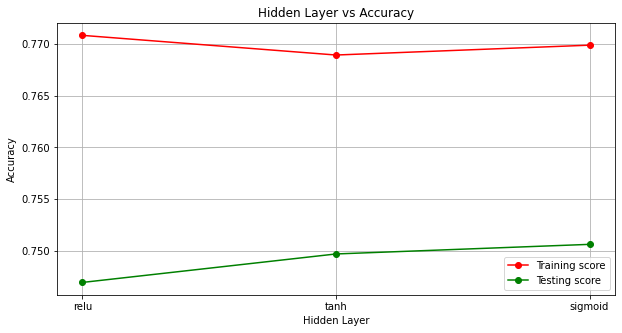

In [97]:
# Plot learning curve
fig, ax = plt.subplots(1, 1, figsize=(10, 5))
    
ax.set_title('Hidden Layer vs Accuracy')
ax.set_xlabel("Hidden Layer")
ax.set_ylabel("Accuracy")
ax.grid()

x = ["relu","tanh","sigmoid" ]

ax.plot(x, [reluTrain,tanhTrain,sigmoidTrain], 'o-', color="r", label="Training score")
ax.plot(x, [reluTest,tanhTest,sigmoidTest], 'o-', color="g", label="Testing score")
ax.legend(loc="best")

plt.show()

### (c) Analysis of optimal parameters and hyper-parameters, alpha value for regularization parameter, learning rate for gradient descent, the number of iterations, etc.

In [102]:
from sklearn import metrics
from sklearn.model_selection import KFold
from tensorflow import keras

kf = KFold(n_splits=10, random_state=None, shuffle=True)
i = 1
AverageTest = []
AverageTrain = []

for train_index, test_index in kf.split(X_trainWhite):
    print("CV: {:.1f}".format(i))  
    X_train_cv, X_test_cv = X_trainWhite[train_index], X_trainWhite[test_index]
    y_train_cv, y_test_cv = y_trainWhite[train_index], y_trainWhite[test_index]
    
    
    for j in ['adam','SGD','RMSprop','Adadelta','Adagrad','Adamax','Nadam','Ftrl']:
        print("Optimizer: ", j)
        model_1 = keras.models.Sequential([
            keras.layers.Dense(17, activation = 'tanh', input_shape=(11,)), 
            keras.layers.Dense(1, activation = 'sigmoid')])
        
        model_1.compile(loss='binary_crossentropy', optimizer=j, metrics=['accuracy'])  
        fit_score = model_1.fit(X_train_cv, y_train_cv, epochs=100, batch_size=10, verbose=1)
        model_1.evaluate(X_test_cv, y_test_cv,verbose=1)
        AverageTest.append(model_1.evaluate(X_test_cv, y_test_cv,verbose=1))
        AverageTrain.append(Average(fit_score.history['accuracy']))
        print('\n')
    i = i + 1
print(AverageTrain, '\n')
print(AverageTest)

CV: 1.0
Optimizer:  adam
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 1s 427us/sample - loss: 0.5605 - accuracy: 0.7075
Epoch 2/100
2851/2851 [==============================] - 0s 148us/sample - loss: 0.5058 - accuracy: 0.7524
Epoch 3/100
2851/2851 [==============================] - 0s 149us/sample - loss: 0.4987 - accuracy: 0.7545
Epoch 4/100
2851/2851 [==============================] - 0s 151us/sample - loss: 0.4959 - accuracy: 0.7604
Epoch 5/100
2851/2851 [==============================] - 0s 149us/sample - loss: 0.4942 - accuracy: 0.7583
Epoch 6/100
2851/2851 [==============================] - 0s 148us/sample - loss: 0.4933 - accuracy: 0.7601
Epoch 7/100
2851/2851 [==============================] - 0s 153us/sample - loss: 0.4916 - accuracy: 0.7625
Epoch 8/100
2851/2851 [==============================] - 0s 149us/sample - loss: 0.4905 - accuracy: 0.7646
Epoch 9/100
2851/2851 [==============================] - 0s 154us/sample - loss: 0.4892 - accurac

2851/2851 [==============================] - 0s 147us/sample - loss: 0.4372 - accuracy: 0.7969
Epoch 77/100
2851/2851 [==============================] - 0s 147us/sample - loss: 0.4373 - accuracy: 0.8032
Epoch 78/100
2851/2851 [==============================] - 0s 144us/sample - loss: 0.4359 - accuracy: 0.7969
Epoch 79/100
2851/2851 [==============================] - 0s 148us/sample - loss: 0.4359 - accuracy: 0.8025
Epoch 80/100
2851/2851 [==============================] - 0s 143us/sample - loss: 0.4351 - accuracy: 0.8039
Epoch 81/100
2851/2851 [==============================] - 0s 144us/sample - loss: 0.4349 - accuracy: 0.7962
Epoch 82/100
2851/2851 [==============================] - 0s 142us/sample - loss: 0.4342 - accuracy: 0.8036
Epoch 83/100
2851/2851 [==============================] - 0s 155us/sample - loss: 0.4342 - accuracy: 0.8015
Epoch 84/100
2851/2851 [==============================] - 0s 144us/sample - loss: 0.4343 - accuracy: 0.8011
Epoch 85/100
2851/2851 [=================

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  SGD
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 1s 388us/sample - loss: 0.6497 - accuracy: 0.6166
Epoch 2/100
2851/2851 [==============================] - 0s 134us/sample - loss: 0.5355 - accuracy: 0.7292
Epoch 3/100
2851/2851 [==============================] - 0s 135us/sample - loss: 0.5124 - accuracy: 0.7450
Epoch 4/100
2851/2851 [==============================] - 0s 132us/sample - loss: 0.5034 - accuracy: 0.7545
Epoch 5/100
2851/2851 [==============================] - 0s 136us/sample - loss: 0.4990 - accuracy: 0.7580
Epoch 6/100
2851/2851 [==============================] - 0s 134us/sample - loss: 0.4972 - accuracy: 0.7587
Epoch 7/100
2851/2851 [==============================] - 0s 139us/sample - loss: 0.4960 - accuracy: 0.7580
Epoch 8/100
2851/2851 [==============================] - 0s 133us/sample - loss: 0.4954 - accuracy: 0.7597
Epoch 9/100
2851/2851 [==============================] - 0s 135us/sample - loss: 0.4948 - accuracy: 0.75

2851/2851 [==============================] - 0s 169us/sample - loss: 0.4705 - accuracy: 0.7825
Epoch 77/100
2851/2851 [==============================] - 0s 166us/sample - loss: 0.4700 - accuracy: 0.7766
Epoch 78/100
2851/2851 [==============================] - 0s 166us/sample - loss: 0.4697 - accuracy: 0.7790
Epoch 79/100
2851/2851 [==============================] - 1s 177us/sample - loss: 0.4692 - accuracy: 0.7780
Epoch 80/100
2851/2851 [==============================] - 0s 171us/sample - loss: 0.4686 - accuracy: 0.7801
Epoch 81/100
2851/2851 [==============================] - 1s 179us/sample - loss: 0.4681 - accuracy: 0.7808
Epoch 82/100
2851/2851 [==============================] - 1s 177us/sample - loss: 0.4676 - accuracy: 0.7787
Epoch 83/100
2851/2851 [==============================] - 0s 169us/sample - loss: 0.4673 - accuracy: 0.7829
Epoch 84/100
2851/2851 [==============================] - 0s 158us/sample - loss: 0.4668 - accuracy: 0.7846
Epoch 85/100
2851/2851 [=================

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  RMSprop
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 1s 441us/sample - loss: 0.5740 - accuracy: 0.6934
Epoch 2/100
2851/2851 [==============================] - 0s 156us/sample - loss: 0.5086 - accuracy: 0.7482
Epoch 3/100
2851/2851 [==============================] - 0s 158us/sample - loss: 0.4981 - accuracy: 0.7559
Epoch 4/100
2851/2851 [==============================] - 0s 167us/sample - loss: 0.4950 - accuracy: 0.7545
Epoch 5/100
2851/2851 [==============================] - 0s 160us/sample - loss: 0.4928 - accuracy: 0.7583
Epoch 6/100
2851/2851 [==============================] - 0s 161us/sample - loss: 0.4917 - accuracy: 0.7583
Epoch 7/100
2851/2851 [==============================] - 0s 160us/sample - loss: 0.4908 - accuracy: 0.7618
Epoch 8/100
2851/2851 [==============================] - 0s 163us/sample - loss: 0.4899 - accuracy: 0.7587
Epoch 9/100
2851/2851 [==============================] - 0s 159us/sample - loss: 0.4886 - accuracy: 

2851/2851 [==============================] - 1s 184us/sample - loss: 0.4396 - accuracy: 0.7941
Epoch 77/100
2851/2851 [==============================] - 1s 186us/sample - loss: 0.4395 - accuracy: 0.7945
Epoch 78/100
2851/2851 [==============================] - 1s 184us/sample - loss: 0.4387 - accuracy: 0.7983
Epoch 79/100
2851/2851 [==============================] - 1s 190us/sample - loss: 0.4384 - accuracy: 0.7987
Epoch 80/100
2851/2851 [==============================] - 1s 194us/sample - loss: 0.4380 - accuracy: 0.7959
Epoch 81/100
2851/2851 [==============================] - 1s 202us/sample - loss: 0.4377 - accuracy: 0.7983
Epoch 82/100
2851/2851 [==============================] - 1s 204us/sample - loss: 0.4370 - accuracy: 0.8015
Epoch 83/100
2851/2851 [==============================] - 1s 214us/sample - loss: 0.4368 - accuracy: 0.7990
Epoch 84/100
2851/2851 [==============================] - 1s 213us/sample - loss: 0.4365 - accuracy: 0.7973
Epoch 85/100
2851/2851 [=================

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  Adadelta
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 1s 446us/sample - loss: 0.7734 - accuracy: 0.4104
Epoch 2/100
2851/2851 [==============================] - 1s 194us/sample - loss: 0.7722 - accuracy: 0.4111
Epoch 3/100
2851/2851 [==============================] - 1s 197us/sample - loss: 0.7710 - accuracy: 0.4118
Epoch 4/100
2851/2851 [==============================] - 1s 194us/sample - loss: 0.7698 - accuracy: 0.4135
Epoch 5/100
2851/2851 [==============================] - 0s 175us/sample - loss: 0.7686 - accuracy: 0.4142
Epoch 6/100
2851/2851 [==============================] - 1s 187us/sample - loss: 0.7675 - accuracy: 0.4160
Epoch 7/100
2851/2851 [==============================] - 1s 184us/sample - loss: 0.7663 - accuracy: 0.4170
Epoch 8/100
2851/2851 [==============================] - 1s 188us/sample - loss: 0.7651 - accuracy: 0.4181
Epoch 9/100
2851/2851 [==============================] - 0s 175us/sample - loss: 0.7639 - accuracy:

2851/2851 [==============================] - 0s 175us/sample - loss: 0.6960 - accuracy: 0.5524
Epoch 77/100
2851/2851 [==============================] - 1s 188us/sample - loss: 0.6952 - accuracy: 0.5559
Epoch 78/100
2851/2851 [==============================] - 1s 190us/sample - loss: 0.6943 - accuracy: 0.5577
Epoch 79/100
2851/2851 [==============================] - 1s 187us/sample - loss: 0.6934 - accuracy: 0.5602
Epoch 80/100
2851/2851 [==============================] - 1s 184us/sample - loss: 0.6926 - accuracy: 0.5623
Epoch 81/100
2851/2851 [==============================] - 1s 193us/sample - loss: 0.6918 - accuracy: 0.5665 - loss: 0.6950 - accuracy
Epoch 82/100
2851/2851 [==============================] - 1s 199us/sample - loss: 0.6910 - accuracy: 0.5675
Epoch 83/100
2851/2851 [==============================] - 1s 199us/sample - loss: 0.6901 - accuracy: 0.5693
Epoch 84/100
2851/2851 [==============================] - 1s 198us/sample - loss: 0.6893 - accuracy: 0.5710
Epoch 85/100
28

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  Adagrad
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 2s 534us/sample - loss: 0.6739 - accuracy: 0.5945
Epoch 2/100
2851/2851 [==============================] - 1s 218us/sample - loss: 0.6358 - accuracy: 0.6503
Epoch 3/100
2851/2851 [==============================] - 1s 197us/sample - loss: 0.6175 - accuracy: 0.6640
Epoch 4/100
2851/2851 [==============================] - 1s 205us/sample - loss: 0.6050 - accuracy: 0.6794
Epoch 5/100
2851/2851 [==============================] - 1s 195us/sample - loss: 0.5954 - accuracy: 0.6864
Epoch 6/100
2851/2851 [==============================] - 1s 202us/sample - loss: 0.5878 - accuracy: 0.6934
Epoch 7/100
2851/2851 [==============================] - 1s 207us/sample - loss: 0.5814 - accuracy: 0.6998
Epoch 8/100
2851/2851 [==============================] - 1s 228us/sample - loss: 0.5759 - accuracy: 0.7033
Epoch 9/100
2851/2851 [==============================] - 1s 225us/sample - loss: 0.5712 - accuracy: 

2851/2851 [==============================] - 1s 203us/sample - loss: 0.5072 - accuracy: 0.7471
Epoch 77/100
2851/2851 [==============================] - 1s 198us/sample - loss: 0.5070 - accuracy: 0.7475
Epoch 78/100
2851/2851 [==============================] - 1s 205us/sample - loss: 0.5068 - accuracy: 0.7475
Epoch 79/100
2851/2851 [==============================] - 1s 184us/sample - loss: 0.5066 - accuracy: 0.7475
Epoch 80/100
2851/2851 [==============================] - 1s 182us/sample - loss: 0.5064 - accuracy: 0.7471
Epoch 81/100
2851/2851 [==============================] - 1s 198us/sample - loss: 0.5062 - accuracy: 0.7475
Epoch 82/100
2851/2851 [==============================] - 1s 199us/sample - loss: 0.5060 - accuracy: 0.7478
Epoch 83/100
2851/2851 [==============================] - 1s 201us/sample - loss: 0.5058 - accuracy: 0.7475
Epoch 84/100
2851/2851 [==============================] - 1s 200us/sample - loss: 0.5056 - accuracy: 0.7482
Epoch 85/100
2851/2851 [=================

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  Adamax
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 1s 448us/sample - loss: 0.6425 - accuracy: 0.6387
Epoch 2/100
2851/2851 [==============================] - 1s 176us/sample - loss: 0.5553 - accuracy: 0.7141
Epoch 3/100
2851/2851 [==============================] - 0s 171us/sample - loss: 0.5210 - accuracy: 0.7373
Epoch 4/100
2851/2851 [==============================] - 0s 168us/sample - loss: 0.5070 - accuracy: 0.7432
Epoch 5/100
2851/2851 [==============================] - 0s 160us/sample - loss: 0.5012 - accuracy: 0.7496
Epoch 6/100
2851/2851 [==============================] - 0s 164us/sample - loss: 0.4984 - accuracy: 0.7545
Epoch 7/100
2851/2851 [==============================] - 0s 164us/sample - loss: 0.4970 - accuracy: 0.7541
Epoch 8/100
2851/2851 [==============================] - 0s 167us/sample - loss: 0.4956 - accuracy: 0.7555
Epoch 9/100
2851/2851 [==============================] - 0s 167us/sample - loss: 0.4948 - accuracy: 0

2851/2851 [==============================] - 0s 173us/sample - loss: 0.4701 - accuracy: 0.7780
Epoch 77/100
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4695 - accuracy: 0.7773
Epoch 78/100
2851/2851 [==============================] - 0s 173us/sample - loss: 0.4694 - accuracy: 0.7804
Epoch 79/100
2851/2851 [==============================] - 0s 172us/sample - loss: 0.4692 - accuracy: 0.7797
Epoch 80/100
2851/2851 [==============================] - 1s 182us/sample - loss: 0.4690 - accuracy: 0.7783
Epoch 81/100
2851/2851 [==============================] - 1s 177us/sample - loss: 0.4688 - accuracy: 0.7780
Epoch 82/100
2851/2851 [==============================] - 1s 179us/sample - loss: 0.4684 - accuracy: 0.7808
Epoch 83/100
2851/2851 [==============================] - 1s 177us/sample - loss: 0.4682 - accuracy: 0.7808
Epoch 84/100
2851/2851 [==============================] - 1s 176us/sample - loss: 0.4681 - accuracy: 0.7783
Epoch 85/100
2851/2851 [=================

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  Nadam
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 2s 687us/sample - loss: 0.6109 - accuracy: 0.6594
Epoch 2/100
2851/2851 [==============================] - 1s 215us/sample - loss: 0.5146 - accuracy: 0.7510
Epoch 3/100
2851/2851 [==============================] - 1s 215us/sample - loss: 0.4981 - accuracy: 0.7583
Epoch 4/100
2851/2851 [==============================] - 1s 221us/sample - loss: 0.4936 - accuracy: 0.7587
Epoch 5/100
2851/2851 [==============================] - 1s 221us/sample - loss: 0.4906 - accuracy: 0.7653
Epoch 6/100
2851/2851 [==============================] - 1s 217us/sample - loss: 0.4888 - accuracy: 0.7632
Epoch 7/100
2851/2851 [==============================] - 1s 213us/sample - loss: 0.4871 - accuracy: 0.7622
Epoch 8/100
2851/2851 [==============================] - 1s 213us/sample - loss: 0.4855 - accuracy: 0.7629
Epoch 9/100
2851/2851 [==============================] - 1s 213us/sample - loss: 0.4845 - accuracy: 0.

2851/2851 [==============================] - 1s 236us/sample - loss: 0.4326 - accuracy: 0.8071
Epoch 77/100
2851/2851 [==============================] - 1s 223us/sample - loss: 0.4327 - accuracy: 0.8074
Epoch 78/100
2851/2851 [==============================] - 1s 211us/sample - loss: 0.4320 - accuracy: 0.8088
Epoch 79/100
2851/2851 [==============================] - 1s 206us/sample - loss: 0.4316 - accuracy: 0.8060
Epoch 80/100
2851/2851 [==============================] - 1s 204us/sample - loss: 0.4311 - accuracy: 0.8064
Epoch 81/100
2851/2851 [==============================] - 1s 213us/sample - loss: 0.4307 - accuracy: 0.8022
Epoch 82/100
2851/2851 [==============================] - 1s 208us/sample - loss: 0.4307 - accuracy: 0.8092
Epoch 83/100
2851/2851 [==============================] - 1s 209us/sample - loss: 0.4302 - accuracy: 0.8064
Epoch 84/100
2851/2851 [==============================] - 1s 211us/sample - loss: 0.4300 - accuracy: 0.8095
Epoch 85/100
2851/2851 [=================

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  Ftrl
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 1s 428us/sample - loss: 0.6905 - accuracy: 0.6594
Epoch 2/100
2851/2851 [==============================] - 0s 166us/sample - loss: 0.6883 - accuracy: 0.6598
Epoch 3/100
2851/2851 [==============================] - 0s 164us/sample - loss: 0.6864 - accuracy: 0.6598
Epoch 4/100
2851/2851 [==============================] - 0s 168us/sample - loss: 0.6846 - accuracy: 0.6594
Epoch 5/100
2851/2851 [==============================] - 0s 158us/sample - loss: 0.6827 - accuracy: 0.6601
Epoch 6/100
2851/2851 [==============================] - 0s 160us/sample - loss: 0.6806 - accuracy: 0.6605
Epoch 7/100
2851/2851 [==============================] - 0s 159us/sample - loss: 0.6782 - accuracy: 0.6629
Epoch 8/100
2851/2851 [==============================] - 0s 159us/sample - loss: 0.6757 - accuracy: 0.6668
Epoch 9/100
2851/2851 [==============================] - 0s 158us/sample - loss: 0.6728 - accuracy: 0.6

2851/2851 [==============================] - 0s 155us/sample - loss: 0.5232 - accuracy: 0.7411
Epoch 77/100
2851/2851 [==============================] - 0s 157us/sample - loss: 0.5226 - accuracy: 0.7411
Epoch 78/100
2851/2851 [==============================] - 0s 160us/sample - loss: 0.5221 - accuracy: 0.7418
Epoch 79/100
2851/2851 [==============================] - 0s 162us/sample - loss: 0.5216 - accuracy: 0.7418
Epoch 80/100
2851/2851 [==============================] - 1s 180us/sample - loss: 0.5211 - accuracy: 0.7415
Epoch 81/100
2851/2851 [==============================] - 0s 159us/sample - loss: 0.5207 - accuracy: 0.7415
Epoch 82/100
2851/2851 [==============================] - 0s 158us/sample - loss: 0.5202 - accuracy: 0.7429
Epoch 83/100
2851/2851 [==============================] - 0s 157us/sample - loss: 0.5197 - accuracy: 0.7425
Epoch 84/100
2851/2851 [==============================] - 0s 172us/sample - loss: 0.5193 - accuracy: 0.7432
Epoch 85/100
2851/2851 [=================

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



CV: 2.0
Optimizer:  adam
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 1s 469us/sample - loss: 0.5694 - accuracy: 0.6913
Epoch 2/100
2851/2851 [==============================] - 1s 184us/sample - loss: 0.5043 - accuracy: 0.7492
Epoch 3/100
2851/2851 [==============================] - 1s 186us/sample - loss: 0.4938 - accuracy: 0.7629
Epoch 4/100
2851/2851 [==============================] - 1s 186us/sample - loss: 0.4901 - accuracy: 0.7625
Epoch 5/100
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4872 - accuracy: 0.7657
Epoch 6/100
2851/2851 [==============================] - 1s 176us/sample - loss: 0.4851 - accuracy: 0.7692
Epoch 7/100
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4830 - accuracy: 0.7738
Epoch 8/100
2851/2851 [==============================] - 1s 179us/sample - loss: 0.4814 - accuracy: 0.7720
Epoch 9/100
2851/2851 [==============================] - 1s 177us/sample - loss: 0.4796 - accur

2851/2851 [==============================] - 0s 168us/sample - loss: 0.4334 - accuracy: 0.7948
Epoch 77/100
2851/2851 [==============================] - 1s 190us/sample - loss: 0.4320 - accuracy: 0.7973
Epoch 78/100
2851/2851 [==============================] - 1s 182us/sample - loss: 0.4320 - accuracy: 0.7952
Epoch 79/100
2851/2851 [==============================] - 1s 181us/sample - loss: 0.4320 - accuracy: 0.7990
Epoch 80/100
2851/2851 [==============================] - 0s 172us/sample - loss: 0.4313 - accuracy: 0.7938
Epoch 81/100
2851/2851 [==============================] - 0s 165us/sample - loss: 0.4312 - accuracy: 0.8001
Epoch 82/100
2851/2851 [==============================] - 0s 173us/sample - loss: 0.4309 - accuracy: 0.7955
Epoch 83/100
2851/2851 [==============================] - 0s 173us/sample - loss: 0.4302 - accuracy: 0.7969
Epoch 84/100
2851/2851 [==============================] - 0s 172us/sample - loss: 0.4302 - accuracy: 0.7994
Epoch 85/100
2851/2851 [=================

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  SGD
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 1s 382us/sample - loss: 0.6146 - accuracy: 0.6713
Epoch 2/100
2851/2851 [==============================] - 0s 154us/sample - loss: 0.5462 - accuracy: 0.7306
Epoch 3/100
2851/2851 [==============================] - 0s 143us/sample - loss: 0.5201 - accuracy: 0.7520
Epoch 4/100
2851/2851 [==============================] - 0s 147us/sample - loss: 0.5072 - accuracy: 0.7594
Epoch 5/100
2851/2851 [==============================] - 0s 146us/sample - loss: 0.5006 - accuracy: 0.7569
Epoch 6/100
2851/2851 [==============================] - 0s 147us/sample - loss: 0.4968 - accuracy: 0.7573
Epoch 7/100
2851/2851 [==============================] - 0s 148us/sample - loss: 0.4945 - accuracy: 0.7573
Epoch 8/100
2851/2851 [==============================] - 0s 142us/sample - loss: 0.4933 - accuracy: 0.7604
Epoch 9/100
2851/2851 [==============================] - 0s 151us/sample - loss: 0.4921 - accuracy: 0.76

2851/2851 [==============================] - 0s 165us/sample - loss: 0.4667 - accuracy: 0.7780
Epoch 77/100
2851/2851 [==============================] - 0s 164us/sample - loss: 0.4662 - accuracy: 0.7804
Epoch 78/100
2851/2851 [==============================] - 0s 165us/sample - loss: 0.4658 - accuracy: 0.7822
Epoch 79/100
2851/2851 [==============================] - 0s 160us/sample - loss: 0.4655 - accuracy: 0.7780
Epoch 80/100
2851/2851 [==============================] - 0s 164us/sample - loss: 0.4650 - accuracy: 0.7783
Epoch 81/100
2851/2851 [==============================] - 0s 156us/sample - loss: 0.4647 - accuracy: 0.7766
Epoch 82/100
2851/2851 [==============================] - 0s 158us/sample - loss: 0.4642 - accuracy: 0.7776
Epoch 83/100
2851/2851 [==============================] - 0s 166us/sample - loss: 0.4638 - accuracy: 0.7787
Epoch 84/100
2851/2851 [==============================] - 0s 164us/sample - loss: 0.4634 - accuracy: 0.7811
Epoch 85/100
2851/2851 [=================

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  RMSprop
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 1s 484us/sample - loss: 0.6033 - accuracy: 0.6633
Epoch 2/100
2851/2851 [==============================] - 0s 167us/sample - loss: 0.5092 - accuracy: 0.7475
Epoch 3/100
2851/2851 [==============================] - 0s 166us/sample - loss: 0.4978 - accuracy: 0.7566
Epoch 4/100
2851/2851 [==============================] - 0s 162us/sample - loss: 0.4932 - accuracy: 0.7569
Epoch 5/100
2851/2851 [==============================] - 0s 166us/sample - loss: 0.4909 - accuracy: 0.7590
Epoch 6/100
2851/2851 [==============================] - 0s 169us/sample - loss: 0.4888 - accuracy: 0.7643
Epoch 7/100
2851/2851 [==============================] - 0s 166us/sample - loss: 0.4878 - accuracy: 0.7604
Epoch 8/100
2851/2851 [==============================] - 0s 160us/sample - loss: 0.4863 - accuracy: 0.7632
Epoch 9/100
2851/2851 [==============================] - 0s 160us/sample - loss: 0.4844 - accuracy: 

2851/2851 [==============================] - 1s 200us/sample - loss: 0.4369 - accuracy: 0.7966
Epoch 77/100
2851/2851 [==============================] - 1s 206us/sample - loss: 0.4374 - accuracy: 0.8001
Epoch 78/100
2851/2851 [==============================] - 1s 206us/sample - loss: 0.4368 - accuracy: 0.7987
Epoch 79/100
2851/2851 [==============================] - 1s 196us/sample - loss: 0.4366 - accuracy: 0.7983
Epoch 80/100
2851/2851 [==============================] - 1s 184us/sample - loss: 0.4361 - accuracy: 0.7983
Epoch 81/100
2851/2851 [==============================] - 1s 183us/sample - loss: 0.4358 - accuracy: 0.8011
Epoch 82/100
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4356 - accuracy: 0.8011
Epoch 83/100
2851/2851 [==============================] - 1s 177us/sample - loss: 0.4350 - accuracy: 0.8004
Epoch 84/100
2851/2851 [==============================] - 0s 172us/sample - loss: 0.4350 - accuracy: 0.8011
Epoch 85/100
2851/2851 [=================

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  Adadelta
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 1s 414us/sample - loss: 0.7946 - accuracy: 0.4574
Epoch 2/100
2851/2851 [==============================] - 0s 161us/sample - loss: 0.7934 - accuracy: 0.4581
Epoch 3/100
2851/2851 [==============================] - 0s 162us/sample - loss: 0.7924 - accuracy: 0.4591
Epoch 4/100
2851/2851 [==============================] - 0s 160us/sample - loss: 0.7913 - accuracy: 0.4602
Epoch 5/100
2851/2851 [==============================] - 0s 162us/sample - loss: 0.7903 - accuracy: 0.4602
Epoch 6/100
2851/2851 [==============================] - 0s 163us/sample - loss: 0.7892 - accuracy: 0.4609
Epoch 7/100
2851/2851 [==============================] - 0s 160us/sample - loss: 0.7882 - accuracy: 0.4626
Epoch 8/100
2851/2851 [==============================] - 0s 163us/sample - loss: 0.7872 - accuracy: 0.4655
Epoch 9/100
2851/2851 [==============================] - 0s 162us/sample - loss: 0.7862 - accuracy:

Epoch 76/100
2851/2851 [==============================] - 1s 186us/sample - loss: 0.7284 - accuracy: 0.5139
Epoch 77/100
2851/2851 [==============================] - 1s 185us/sample - loss: 0.7276 - accuracy: 0.5142
Epoch 78/100
2851/2851 [==============================] - 1s 194us/sample - loss: 0.7269 - accuracy: 0.5170
Epoch 79/100
2851/2851 [==============================] - 1s 206us/sample - loss: 0.7261 - accuracy: 0.5170
Epoch 80/100
2851/2851 [==============================] - 1s 200us/sample - loss: 0.7254 - accuracy: 0.5160
Epoch 81/100
2851/2851 [==============================] - 1s 194us/sample - loss: 0.7247 - accuracy: 0.5181
Epoch 82/100
2851/2851 [==============================] - 1s 191us/sample - loss: 0.7239 - accuracy: 0.5184
Epoch 83/100
2851/2851 [==============================] - 1s 189us/sample - loss: 0.7232 - accuracy: 0.5191
Epoch 84/100
2851/2851 [==============================] - 1s 198us/sample - loss: 0.7225 - accuracy: 0.5191
Epoch 85/100
2851/2851 [====

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  Adagrad
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 2s 545us/sample - loss: 0.6356 - accuracy: 0.6384
Epoch 2/100
2851/2851 [==============================] - 1s 192us/sample - loss: 0.6074 - accuracy: 0.6731
Epoch 3/100
2851/2851 [==============================] - 1s 184us/sample - loss: 0.5934 - accuracy: 0.6917
Epoch 4/100
2851/2851 [==============================] - 0s 163us/sample - loss: 0.5836 - accuracy: 0.6994
Epoch 5/100
2851/2851 [==============================] - 0s 161us/sample - loss: 0.5763 - accuracy: 0.7082
Epoch 6/100
2851/2851 [==============================] - 0s 161us/sample - loss: 0.5703 - accuracy: 0.7176
Epoch 7/100
2851/2851 [==============================] - 0s 164us/sample - loss: 0.5654 - accuracy: 0.7197
Epoch 8/100
2851/2851 [==============================] - 0s 165us/sample - loss: 0.5612 - accuracy: 0.7219
Epoch 9/100
2851/2851 [==============================] - 0s 174us/sample - loss: 0.5575 - accuracy: 

2851/2851 [==============================] - 1s 184us/sample - loss: 0.5056 - accuracy: 0.7601
Epoch 77/100
2851/2851 [==============================] - 1s 183us/sample - loss: 0.5054 - accuracy: 0.7587
Epoch 78/100
2851/2851 [==============================] - 1s 183us/sample - loss: 0.5052 - accuracy: 0.7594
Epoch 79/100
2851/2851 [==============================] - 1s 184us/sample - loss: 0.5050 - accuracy: 0.7601
Epoch 80/100
2851/2851 [==============================] - 1s 183us/sample - loss: 0.5048 - accuracy: 0.7590
Epoch 81/100
2851/2851 [==============================] - 1s 184us/sample - loss: 0.5046 - accuracy: 0.7594
Epoch 82/100
2851/2851 [==============================] - 1s 185us/sample - loss: 0.5044 - accuracy: 0.7587
Epoch 83/100
2851/2851 [==============================] - 1s 182us/sample - loss: 0.5043 - accuracy: 0.7587
Epoch 84/100
2851/2851 [==============================] - 1s 178us/sample - loss: 0.5041 - accuracy: 0.7587
Epoch 85/100
2851/2851 [=================

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  Adamax
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 1s 419us/sample - loss: 0.6389 - accuracy: 0.6377
Epoch 2/100
2851/2851 [==============================] - 0s 161us/sample - loss: 0.5652 - accuracy: 0.7050
Epoch 3/100
2851/2851 [==============================] - 0s 158us/sample - loss: 0.5281 - accuracy: 0.7338
Epoch 4/100
2851/2851 [==============================] - 0s 156us/sample - loss: 0.5077 - accuracy: 0.7475
Epoch 5/100
2851/2851 [==============================] - 0s 156us/sample - loss: 0.4977 - accuracy: 0.7548
Epoch 6/100
2851/2851 [==============================] - 0s 159us/sample - loss: 0.4923 - accuracy: 0.7566
Epoch 7/100
2851/2851 [==============================] - 0s 161us/sample - loss: 0.4895 - accuracy: 0.7555
Epoch 8/100
2851/2851 [==============================] - 0s 163us/sample - loss: 0.4877 - accuracy: 0.7562 - loss: 0.4795 - accura
Epoch 9/100
2851/2851 [==============================] - 0s 161us/sample - lo

2851/2851 [==============================] - 1s 178us/sample - loss: 0.4652 - accuracy: 0.7832
Epoch 77/100
2851/2851 [==============================] - 0s 172us/sample - loss: 0.4650 - accuracy: 0.7850
Epoch 78/100
2851/2851 [==============================] - 0s 173us/sample - loss: 0.4648 - accuracy: 0.7832
Epoch 79/100
2851/2851 [==============================] - 0s 170us/sample - loss: 0.4646 - accuracy: 0.7843 - loss: 0.4727 - accura
Epoch 80/100
2851/2851 [==============================] - 0s 159us/sample - loss: 0.4644 - accuracy: 0.7857
Epoch 81/100
2851/2851 [==============================] - 0s 167us/sample - loss: 0.4641 - accuracy: 0.7850
Epoch 82/100
2851/2851 [==============================] - 0s 165us/sample - loss: 0.4637 - accuracy: 0.7864
Epoch 83/100
2851/2851 [==============================] - 0s 164us/sample - loss: 0.4635 - accuracy: 0.7881
Epoch 84/100
2851/2851 [==============================] - 0s 163us/sample - loss: 0.4630 - accuracy: 0.7874
Epoch 85/100
2851

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  Nadam
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 2s 620us/sample - loss: 0.5773 - accuracy: 0.6934
Epoch 2/100
2851/2851 [==============================] - 1s 189us/sample - loss: 0.4997 - accuracy: 0.7541
Epoch 3/100
2851/2851 [==============================] - 1s 191us/sample - loss: 0.4896 - accuracy: 0.7583
Epoch 4/100
2851/2851 [==============================] - 1s 188us/sample - loss: 0.4860 - accuracy: 0.7636
Epoch 5/100
2851/2851 [==============================] - 1s 190us/sample - loss: 0.4838 - accuracy: 0.7720
Epoch 6/100
2851/2851 [==============================] - 1s 193us/sample - loss: 0.4831 - accuracy: 0.7618
Epoch 7/100
2851/2851 [==============================] - 1s 192us/sample - loss: 0.4815 - accuracy: 0.7625
Epoch 8/100
2851/2851 [==============================] - 1s 195us/sample - loss: 0.4799 - accuracy: 0.7682
Epoch 9/100
2851/2851 [==============================] - 1s 194us/sample - loss: 0.4788 - accuracy: 0.

2851/2851 [==============================] - 1s 205us/sample - loss: 0.4338 - accuracy: 0.7983
Epoch 77/100
2851/2851 [==============================] - 1s 206us/sample - loss: 0.4333 - accuracy: 0.7962
Epoch 78/100
2851/2851 [==============================] - 1s 204us/sample - loss: 0.4329 - accuracy: 0.7938
Epoch 79/100
2851/2851 [==============================] - 1s 196us/sample - loss: 0.4333 - accuracy: 0.7924 - loss: 0.4310 - accura
Epoch 80/100
2851/2851 [==============================] - 1s 210us/sample - loss: 0.4325 - accuracy: 0.7980
Epoch 81/100
2851/2851 [==============================] - 1s 202us/sample - loss: 0.4330 - accuracy: 0.7952
Epoch 82/100
2851/2851 [==============================] - 1s 198us/sample - loss: 0.4326 - accuracy: 0.7997
Epoch 83/100
2851/2851 [==============================] - 1s 206us/sample - loss: 0.4322 - accuracy: 0.7969
Epoch 84/100
2851/2851 [==============================] - 1s 204us/sample - loss: 0.4320 - accuracy: 0.7920
Epoch 85/100
2851

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  Ftrl
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 1s 441us/sample - loss: 0.6906 - accuracy: 0.6556
Epoch 2/100
2851/2851 [==============================] - 1s 175us/sample - loss: 0.6885 - accuracy: 0.6563
Epoch 3/100
2851/2851 [==============================] - 1s 180us/sample - loss: 0.6868 - accuracy: 0.6563
Epoch 4/100
2851/2851 [==============================] - 1s 178us/sample - loss: 0.6850 - accuracy: 0.6559
Epoch 5/100
2851/2851 [==============================] - 1s 175us/sample - loss: 0.6832 - accuracy: 0.6559
Epoch 6/100
2851/2851 [==============================] - 1s 176us/sample - loss: 0.6811 - accuracy: 0.6566
Epoch 7/100
2851/2851 [==============================] - 1s 176us/sample - loss: 0.6788 - accuracy: 0.6594
Epoch 8/100
2851/2851 [==============================] - 0s 174us/sample - loss: 0.6760 - accuracy: 0.6657
Epoch 9/100
2851/2851 [==============================] - 0s 173us/sample - loss: 0.6729 - accuracy: 0.6

2851/2851 [==============================] - 0s 161us/sample - loss: 0.5166 - accuracy: 0.7468
Epoch 76/100
2851/2851 [==============================] - 0s 167us/sample - loss: 0.5161 - accuracy: 0.7461 - loss: 0.5112 - accuracy
Epoch 77/100
2851/2851 [==============================] - 0s 167us/sample - loss: 0.5157 - accuracy: 0.7468
Epoch 78/100
2851/2851 [==============================] - 0s 162us/sample - loss: 0.5152 - accuracy: 0.7468
Epoch 79/100
2851/2851 [==============================] - 0s 161us/sample - loss: 0.5148 - accuracy: 0.7464
Epoch 80/100
2851/2851 [==============================] - 0s 166us/sample - loss: 0.5144 - accuracy: 0.7461
Epoch 81/100
2851/2851 [==============================] - 0s 159us/sample - loss: 0.5140 - accuracy: 0.7461
Epoch 82/100
2851/2851 [==============================] - 0s 168us/sample - loss: 0.5136 - accuracy: 0.7454
Epoch 83/100
2851/2851 [==============================] - 0s 166us/sample - loss: 0.5132 - accuracy: 0.7461
Epoch 84/100
28

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



CV: 3.0
Optimizer:  adam
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 1s 453us/sample - loss: 0.5895 - accuracy: 0.6906
Epoch 2/100
2851/2851 [==============================] - 1s 177us/sample - loss: 0.5018 - accuracy: 0.7594
Epoch 3/100
2851/2851 [==============================] - 0s 170us/sample - loss: 0.4933 - accuracy: 0.7513
Epoch 4/100
2851/2851 [==============================] - 0s 172us/sample - loss: 0.4906 - accuracy: 0.7590
Epoch 5/100
2851/2851 [==============================] - 1s 177us/sample - loss: 0.4896 - accuracy: 0.7639
Epoch 6/100
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4882 - accuracy: 0.7653
Epoch 7/100
2851/2851 [==============================] - 0s 171us/sample - loss: 0.4872 - accuracy: 0.7646
Epoch 8/100
2851/2851 [==============================] - 0s 170us/sample - loss: 0.4856 - accuracy: 0.7664
Epoch 9/100
2851/2851 [==============================] - 0s 163us/sample - loss: 0.4845 - accur

2851/2851 [==============================] - 1s 212us/sample - loss: 0.4377 - accuracy: 0.8001
Epoch 77/100
2851/2851 [==============================] - 1s 184us/sample - loss: 0.4373 - accuracy: 0.7980
Epoch 78/100
2851/2851 [==============================] - 1s 177us/sample - loss: 0.4372 - accuracy: 0.7980
Epoch 79/100
2851/2851 [==============================] - 1s 180us/sample - loss: 0.4368 - accuracy: 0.7959
Epoch 80/100
2851/2851 [==============================] - 1s 181us/sample - loss: 0.4367 - accuracy: 0.7973
Epoch 81/100
2851/2851 [==============================] - 1s 189us/sample - loss: 0.4366 - accuracy: 0.7969
Epoch 82/100
2851/2851 [==============================] - 1s 183us/sample - loss: 0.4358 - accuracy: 0.8032
Epoch 83/100
2851/2851 [==============================] - 1s 180us/sample - loss: 0.4361 - accuracy: 0.8018
Epoch 84/100
2851/2851 [==============================] - 1s 180us/sample - loss: 0.4360 - accuracy: 0.7976
Epoch 85/100
2851/2851 [=================

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  SGD
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 1s 408us/sample - loss: 0.6205 - accuracy: 0.6454
Epoch 2/100
2851/2851 [==============================] - 1s 191us/sample - loss: 0.5269 - accuracy: 0.7415
Epoch 3/100
2851/2851 [==============================] - 1s 203us/sample - loss: 0.5032 - accuracy: 0.7548
Epoch 4/100
2851/2851 [==============================] - 1s 205us/sample - loss: 0.4940 - accuracy: 0.7587
Epoch 5/100
2851/2851 [==============================] - 1s 181us/sample - loss: 0.4898 - accuracy: 0.7636
Epoch 6/100
2851/2851 [==============================] - 0s 175us/sample - loss: 0.4873 - accuracy: 0.7636
Epoch 7/100
2851/2851 [==============================] - 0s 167us/sample - loss: 0.4864 - accuracy: 0.7667
Epoch 8/100
2851/2851 [==============================] - 0s 172us/sample - loss: 0.4855 - accuracy: 0.7664
Epoch 9/100
2851/2851 [==============================] - 0s 170us/sample - loss: 0.4848 - accuracy: 0.76

2851/2851 [==============================] - 0s 145us/sample - loss: 0.4600 - accuracy: 0.7801
Epoch 77/100
2851/2851 [==============================] - 0s 145us/sample - loss: 0.4599 - accuracy: 0.7801
Epoch 78/100
2851/2851 [==============================] - 0s 147us/sample - loss: 0.4595 - accuracy: 0.7776
Epoch 79/100
2851/2851 [==============================] - 0s 143us/sample - loss: 0.4595 - accuracy: 0.7776
Epoch 80/100
2851/2851 [==============================] - 0s 143us/sample - loss: 0.4592 - accuracy: 0.7801
Epoch 81/100
2851/2851 [==============================] - 0s 143us/sample - loss: 0.4589 - accuracy: 0.7797
Epoch 82/100
2851/2851 [==============================] - 0s 144us/sample - loss: 0.4587 - accuracy: 0.7787
Epoch 83/100
2851/2851 [==============================] - 0s 148us/sample - loss: 0.4586 - accuracy: 0.7776
Epoch 84/100
2851/2851 [==============================] - 0s 148us/sample - loss: 0.4584 - accuracy: 0.7787
Epoch 85/100
2851/2851 [=================

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  RMSprop
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 1s 484us/sample - loss: 0.5559 - accuracy: 0.7159
Epoch 2/100
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4998 - accuracy: 0.7552
Epoch 3/100
2851/2851 [==============================] - 0s 167us/sample - loss: 0.4923 - accuracy: 0.7573
Epoch 4/100
2851/2851 [==============================] - 0s 166us/sample - loss: 0.4894 - accuracy: 0.7601
Epoch 5/100
2851/2851 [==============================] - 0s 170us/sample - loss: 0.4875 - accuracy: 0.7615
Epoch 6/100
2851/2851 [==============================] - 0s 168us/sample - loss: 0.4854 - accuracy: 0.7622
Epoch 7/100
2851/2851 [==============================] - 0s 166us/sample - loss: 0.4844 - accuracy: 0.7682
Epoch 8/100
2851/2851 [==============================] - 0s 170us/sample - loss: 0.4831 - accuracy: 0.7629
Epoch 9/100
2851/2851 [==============================] - 0s 168us/sample - loss: 0.4821 - accuracy: 

2851/2851 [==============================] - 0s 173us/sample - loss: 0.4360 - accuracy: 0.7983
Epoch 77/100
2851/2851 [==============================] - 0s 165us/sample - loss: 0.4358 - accuracy: 0.8004
Epoch 78/100
2851/2851 [==============================] - 0s 163us/sample - loss: 0.4356 - accuracy: 0.7990
Epoch 79/100
2851/2851 [==============================] - 0s 164us/sample - loss: 0.4352 - accuracy: 0.7966
Epoch 80/100
2851/2851 [==============================] - 0s 162us/sample - loss: 0.4344 - accuracy: 0.8022
Epoch 81/100
2851/2851 [==============================] - 0s 165us/sample - loss: 0.4347 - accuracy: 0.7969
Epoch 82/100
2851/2851 [==============================] - 0s 164us/sample - loss: 0.4345 - accuracy: 0.8015
Epoch 83/100
2851/2851 [==============================] - 0s 172us/sample - loss: 0.4335 - accuracy: 0.8011
Epoch 84/100
2851/2851 [==============================] - 1s 260us/sample - loss: 0.4328 - accuracy: 0.8039
Epoch 85/100
2851/2851 [=================

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  Adadelta
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 1s 390us/sample - loss: 0.6730 - accuracy: 0.5970
Epoch 2/100
2851/2851 [==============================] - 0s 158us/sample - loss: 0.6725 - accuracy: 0.5970
Epoch 3/100
2851/2851 [==============================] - 0s 154us/sample - loss: 0.6721 - accuracy: 0.5970
Epoch 4/100
2851/2851 [==============================] - 0s 153us/sample - loss: 0.6718 - accuracy: 0.5966
Epoch 5/100
2851/2851 [==============================] - 0s 152us/sample - loss: 0.6714 - accuracy: 0.5970
Epoch 6/100
2851/2851 [==============================] - 0s 149us/sample - loss: 0.6710 - accuracy: 0.5977
Epoch 7/100
2851/2851 [==============================] - 0s 147us/sample - loss: 0.6706 - accuracy: 0.5977
Epoch 8/100
2851/2851 [==============================] - 0s 148us/sample - loss: 0.6702 - accuracy: 0.5984
Epoch 9/100
2851/2851 [==============================] - 0s 147us/sample - loss: 0.6698 - accuracy:

2851/2851 [==============================] - 0s 161us/sample - loss: 0.6463 - accuracy: 0.6250
Epoch 77/100
2851/2851 [==============================] - 0s 164us/sample - loss: 0.6460 - accuracy: 0.6254
Epoch 78/100
2851/2851 [==============================] - 0s 162us/sample - loss: 0.6457 - accuracy: 0.6271
Epoch 79/100
2851/2851 [==============================] - 0s 162us/sample - loss: 0.6453 - accuracy: 0.6271
Epoch 80/100
2851/2851 [==============================] - 0s 159us/sample - loss: 0.6450 - accuracy: 0.6271
Epoch 81/100
2851/2851 [==============================] - 0s 157us/sample - loss: 0.6447 - accuracy: 0.6278
Epoch 82/100
2851/2851 [==============================] - 0s 154us/sample - loss: 0.6444 - accuracy: 0.6286
Epoch 83/100
2851/2851 [==============================] - 0s 150us/sample - loss: 0.6441 - accuracy: 0.6286
Epoch 84/100
2851/2851 [==============================] - 0s 147us/sample - loss: 0.6438 - accuracy: 0.6286
Epoch 85/100
2851/2851 [=================

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  Adagrad
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 1s 409us/sample - loss: 0.7232 - accuracy: 0.5605
Epoch 2/100
2851/2851 [==============================] - 0s 166us/sample - loss: 0.6720 - accuracy: 0.6128
Epoch 3/100
2851/2851 [==============================] - 1s 189us/sample - loss: 0.6468 - accuracy: 0.6422
Epoch 4/100
2851/2851 [==============================] - 0s 172us/sample - loss: 0.6299 - accuracy: 0.6559
Epoch 5/100
2851/2851 [==============================] - 1s 198us/sample - loss: 0.6172 - accuracy: 0.6717
Epoch 6/100
2851/2851 [==============================] - 1s 187us/sample - loss: 0.6073 - accuracy: 0.6850
Epoch 7/100
2851/2851 [==============================] - 1s 186us/sample - loss: 0.5990 - accuracy: 0.6896
Epoch 8/100
2851/2851 [==============================] - 0s 168us/sample - loss: 0.5920 - accuracy: 0.6980
Epoch 9/100
2851/2851 [==============================] - 0s 168us/sample - loss: 0.5860 - accuracy: 

2851/2851 [==============================] - 0s 153us/sample - loss: 0.5082 - accuracy: 0.7545
Epoch 77/100
2851/2851 [==============================] - 0s 150us/sample - loss: 0.5080 - accuracy: 0.7541
Epoch 78/100
2851/2851 [==============================] - 0s 152us/sample - loss: 0.5077 - accuracy: 0.7548
Epoch 79/100
2851/2851 [==============================] - 0s 151us/sample - loss: 0.5075 - accuracy: 0.7545
Epoch 80/100
2851/2851 [==============================] - 0s 156us/sample - loss: 0.5072 - accuracy: 0.7548
Epoch 81/100
2851/2851 [==============================] - 0s 153us/sample - loss: 0.5070 - accuracy: 0.7545
Epoch 82/100
2851/2851 [==============================] - 0s 151us/sample - loss: 0.5067 - accuracy: 0.7548
Epoch 83/100
2851/2851 [==============================] - 0s 150us/sample - loss: 0.5065 - accuracy: 0.7545
Epoch 84/100
2851/2851 [==============================] - 0s 150us/sample - loss: 0.5062 - accuracy: 0.7555
Epoch 85/100
2851/2851 [=================

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  Adamax
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 1s 395us/sample - loss: 0.6166 - accuracy: 0.6594
Epoch 2/100
2851/2851 [==============================] - 0s 147us/sample - loss: 0.5414 - accuracy: 0.7313
Epoch 3/100
2851/2851 [==============================] - 0s 146us/sample - loss: 0.5172 - accuracy: 0.7425
Epoch 4/100
2851/2851 [==============================] - 0s 146us/sample - loss: 0.5047 - accuracy: 0.7513
Epoch 5/100
2851/2851 [==============================] - 0s 146us/sample - loss: 0.4982 - accuracy: 0.7527
Epoch 6/100
2851/2851 [==============================] - 0s 146us/sample - loss: 0.4943 - accuracy: 0.7541
Epoch 7/100
2851/2851 [==============================] - 0s 146us/sample - loss: 0.4921 - accuracy: 0.7576
Epoch 8/100
2851/2851 [==============================] - 0s 146us/sample - loss: 0.4908 - accuracy: 0.7594
Epoch 9/100
2851/2851 [==============================] - 0s 146us/sample - loss: 0.4896 - accuracy: 0

2851/2851 [==============================] - 0s 154us/sample - loss: 0.4662 - accuracy: 0.7874
Epoch 77/100
2851/2851 [==============================] - 0s 161us/sample - loss: 0.4659 - accuracy: 0.7888
Epoch 78/100
2851/2851 [==============================] - 0s 160us/sample - loss: 0.4657 - accuracy: 0.7857
Epoch 79/100
2851/2851 [==============================] - 0s 157us/sample - loss: 0.4653 - accuracy: 0.7864
Epoch 80/100
2851/2851 [==============================] - 0s 152us/sample - loss: 0.4647 - accuracy: 0.7857
Epoch 81/100
2851/2851 [==============================] - 0s 153us/sample - loss: 0.4646 - accuracy: 0.7843
Epoch 82/100
2851/2851 [==============================] - 0s 160us/sample - loss: 0.4643 - accuracy: 0.7843
Epoch 83/100
2851/2851 [==============================] - 0s 153us/sample - loss: 0.4639 - accuracy: 0.7867
Epoch 84/100
2851/2851 [==============================] - 0s 157us/sample - loss: 0.4635 - accuracy: 0.7860
Epoch 85/100
2851/2851 [=================

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  Nadam
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 2s 619us/sample - loss: 0.5523 - accuracy: 0.7187
Epoch 2/100
2851/2851 [==============================] - 1s 201us/sample - loss: 0.4964 - accuracy: 0.7513
Epoch 3/100
2851/2851 [==============================] - 1s 205us/sample - loss: 0.4906 - accuracy: 0.7590
Epoch 4/100
2851/2851 [==============================] - 1s 190us/sample - loss: 0.4880 - accuracy: 0.7604
Epoch 5/100
2851/2851 [==============================] - 1s 191us/sample - loss: 0.4866 - accuracy: 0.7573
Epoch 6/100
2851/2851 [==============================] - 1s 187us/sample - loss: 0.4850 - accuracy: 0.7597
Epoch 7/100
2851/2851 [==============================] - 1s 186us/sample - loss: 0.4842 - accuracy: 0.7636
Epoch 8/100
2851/2851 [==============================] - 1s 188us/sample - loss: 0.4830 - accuracy: 0.7657
Epoch 9/100
2851/2851 [==============================] - 1s 185us/sample - loss: 0.4816 - accuracy: 0.

2851/2851 [==============================] - 1s 222us/sample - loss: 0.4388 - accuracy: 0.8015
Epoch 77/100
2851/2851 [==============================] - 1s 220us/sample - loss: 0.4389 - accuracy: 0.8015
Epoch 78/100
2851/2851 [==============================] - 1s 222us/sample - loss: 0.4383 - accuracy: 0.8032
Epoch 79/100
2851/2851 [==============================] - 1s 222us/sample - loss: 0.4381 - accuracy: 0.8004
Epoch 80/100
2851/2851 [==============================] - 1s 222us/sample - loss: 0.4374 - accuracy: 0.8036
Epoch 81/100
2851/2851 [==============================] - 1s 221us/sample - loss: 0.4375 - accuracy: 0.7980
Epoch 82/100
2851/2851 [==============================] - 1s 221us/sample - loss: 0.4366 - accuracy: 0.8039
Epoch 83/100
2851/2851 [==============================] - 1s 249us/sample - loss: 0.4371 - accuracy: 0.8036
Epoch 84/100
2851/2851 [==============================] - 1s 263us/sample - loss: 0.4359 - accuracy: 0.8032
Epoch 85/100
2851/2851 [=================

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  Ftrl
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 2s 604us/sample - loss: 0.6909 - accuracy: 0.6549
Epoch 2/100
2851/2851 [==============================] - 1s 252us/sample - loss: 0.6868 - accuracy: 0.6605
Epoch 3/100
2851/2851 [==============================] - 1s 193us/sample - loss: 0.6837 - accuracy: 0.6626
Epoch 4/100
2851/2851 [==============================] - 1s 198us/sample - loss: 0.6804 - accuracy: 0.6713
Epoch 5/100
2851/2851 [==============================] - 1s 193us/sample - loss: 0.6768 - accuracy: 0.6815
Epoch 6/100
2851/2851 [==============================] - 1s 210us/sample - loss: 0.6727 - accuracy: 0.6889
Epoch 7/100
2851/2851 [==============================] - 1s 190us/sample - loss: 0.6683 - accuracy: 0.6980
Epoch 8/100
2851/2851 [==============================] - 1s 178us/sample - loss: 0.6637 - accuracy: 0.7001
Epoch 9/100
2851/2851 [==============================] - 0s 171us/sample - loss: 0.6588 - accuracy: 0.7

2851/2851 [==============================] - 0s 161us/sample - loss: 0.5145 - accuracy: 0.7482
Epoch 77/100
2851/2851 [==============================] - 0s 155us/sample - loss: 0.5141 - accuracy: 0.7489
Epoch 78/100
2851/2851 [==============================] - 0s 157us/sample - loss: 0.5137 - accuracy: 0.7485
Epoch 79/100
2851/2851 [==============================] - 0s 151us/sample - loss: 0.5133 - accuracy: 0.7489
Epoch 80/100
2851/2851 [==============================] - 0s 152us/sample - loss: 0.5129 - accuracy: 0.7489
Epoch 81/100
2851/2851 [==============================] - 0s 155us/sample - loss: 0.5125 - accuracy: 0.7489
Epoch 82/100
2851/2851 [==============================] - 0s 155us/sample - loss: 0.5121 - accuracy: 0.7485
Epoch 83/100
2851/2851 [==============================] - 0s 148us/sample - loss: 0.5118 - accuracy: 0.7482
Epoch 84/100
2851/2851 [==============================] - 0s 152us/sample - loss: 0.5114 - accuracy: 0.7482
Epoch 85/100
2851/2851 [=================

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



CV: 4.0
Optimizer:  adam
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 1s 392us/sample - loss: 0.5662 - accuracy: 0.6934
Epoch 2/100
2851/2851 [==============================] - 0s 149us/sample - loss: 0.5024 - accuracy: 0.7450
Epoch 3/100
2851/2851 [==============================] - 0s 149us/sample - loss: 0.4947 - accuracy: 0.7534
Epoch 4/100
2851/2851 [==============================] - 0s 151us/sample - loss: 0.4921 - accuracy: 0.7569
Epoch 5/100
2851/2851 [==============================] - 0s 162us/sample - loss: 0.4903 - accuracy: 0.7580
Epoch 6/100
2851/2851 [==============================] - 1s 287us/sample - loss: 0.4890 - accuracy: 0.7608
Epoch 7/100
2851/2851 [==============================] - 1s 242us/sample - loss: 0.4881 - accuracy: 0.7629 - loss: 0.4756 - ac
Epoch 8/100
2851/2851 [==============================] - 1s 232us/sample - loss: 0.4859 - accuracy: 0.7650
Epoch 9/100
2851/2851 [==============================] - 0s 157us/sample - 

2851/2851 [==============================] - 1s 186us/sample - loss: 0.4321 - accuracy: 0.7983
Epoch 77/100
2851/2851 [==============================] - 1s 178us/sample - loss: 0.4316 - accuracy: 0.7941
Epoch 78/100
2851/2851 [==============================] - 0s 175us/sample - loss: 0.4317 - accuracy: 0.7959
Epoch 79/100
2851/2851 [==============================] - 0s 173us/sample - loss: 0.4314 - accuracy: 0.7980
Epoch 80/100
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4305 - accuracy: 0.8018
Epoch 81/100
2851/2851 [==============================] - 1s 178us/sample - loss: 0.4305 - accuracy: 0.7983
Epoch 82/100
2851/2851 [==============================] - 1s 177us/sample - loss: 0.4296 - accuracy: 0.7969
Epoch 83/100
2851/2851 [==============================] - 1s 179us/sample - loss: 0.4291 - accuracy: 0.7980
Epoch 84/100
2851/2851 [==============================] - 0s 175us/sample - loss: 0.4289 - accuracy: 0.7983
Epoch 85/100
2851/2851 [=================

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  SGD
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 1s 370us/sample - loss: 0.6130 - accuracy: 0.6741
Epoch 2/100
2851/2851 [==============================] - 0s 151us/sample - loss: 0.5287 - accuracy: 0.7478
Epoch 3/100
2851/2851 [==============================] - 0s 150us/sample - loss: 0.5094 - accuracy: 0.7471
Epoch 4/100
2851/2851 [==============================] - 0s 150us/sample - loss: 0.5023 - accuracy: 0.7450
Epoch 5/100
2851/2851 [==============================] - 0s 150us/sample - loss: 0.4985 - accuracy: 0.7510
Epoch 6/100
2851/2851 [==============================] - 0s 152us/sample - loss: 0.4970 - accuracy: 0.7524
Epoch 7/100
2851/2851 [==============================] - 0s 151us/sample - loss: 0.4955 - accuracy: 0.7503
Epoch 8/100
2851/2851 [==============================] - 0s 166us/sample - loss: 0.4946 - accuracy: 0.7527
Epoch 9/100
2851/2851 [==============================] - 1s 180us/sample - loss: 0.4938 - accuracy: 0.75

2851/2851 [==============================] - 0s 152us/sample - loss: 0.4627 - accuracy: 0.7818
Epoch 77/100
2851/2851 [==============================] - 0s 159us/sample - loss: 0.4626 - accuracy: 0.7794
Epoch 78/100
2851/2851 [==============================] - 0s 161us/sample - loss: 0.4622 - accuracy: 0.7787
Epoch 79/100
2851/2851 [==============================] - 0s 158us/sample - loss: 0.4617 - accuracy: 0.7811
Epoch 80/100
2851/2851 [==============================] - 0s 160us/sample - loss: 0.4616 - accuracy: 0.7811
Epoch 81/100
2851/2851 [==============================] - 0s 159us/sample - loss: 0.4612 - accuracy: 0.7804
Epoch 82/100
2851/2851 [==============================] - 0s 161us/sample - loss: 0.4609 - accuracy: 0.7818
Epoch 83/100
2851/2851 [==============================] - 0s 159us/sample - loss: 0.4607 - accuracy: 0.7811
Epoch 84/100
2851/2851 [==============================] - 0s 158us/sample - loss: 0.4603 - accuracy: 0.7843
Epoch 85/100
2851/2851 [=================

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  RMSprop
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 1s 498us/sample - loss: 0.5954 - accuracy: 0.6899
Epoch 2/100
2851/2851 [==============================] - 1s 182us/sample - loss: 0.5149 - accuracy: 0.7552
Epoch 3/100
2851/2851 [==============================] - 1s 180us/sample - loss: 0.5002 - accuracy: 0.7597
Epoch 4/100
2851/2851 [==============================] - 1s 182us/sample - loss: 0.4935 - accuracy: 0.7559
Epoch 5/100
2851/2851 [==============================] - 1s 184us/sample - loss: 0.4907 - accuracy: 0.7611
Epoch 6/100
2851/2851 [==============================] - 1s 181us/sample - loss: 0.4885 - accuracy: 0.7597 - loss: 0.4857 - accura
Epoch 7/100
2851/2851 [==============================] - 1s 180us/sample - loss: 0.4870 - accuracy: 0.7629
Epoch 8/100
2851/2851 [==============================] - 1s 178us/sample - loss: 0.4852 - accuracy: 0.7653
Epoch 9/100
2851/2851 [==============================] - 1s 177us/sample - l

2851/2851 [==============================] - 0s 168us/sample - loss: 0.4370 - accuracy: 0.7973
Epoch 77/100
2851/2851 [==============================] - 0s 170us/sample - loss: 0.4364 - accuracy: 0.8001
Epoch 78/100
2851/2851 [==============================] - 0s 166us/sample - loss: 0.4359 - accuracy: 0.8004
Epoch 79/100
2851/2851 [==============================] - 0s 169us/sample - loss: 0.4361 - accuracy: 0.7976
Epoch 80/100
2851/2851 [==============================] - 0s 167us/sample - loss: 0.4352 - accuracy: 0.8025
Epoch 81/100
2851/2851 [==============================] - 0s 166us/sample - loss: 0.4351 - accuracy: 0.7983
Epoch 82/100
2851/2851 [==============================] - 0s 169us/sample - loss: 0.4345 - accuracy: 0.8018
Epoch 83/100
2851/2851 [==============================] - 0s 171us/sample - loss: 0.4335 - accuracy: 0.8001
Epoch 84/100
2851/2851 [==============================] - 0s 165us/sample - loss: 0.4337 - accuracy: 0.8018
Epoch 85/100
2851/2851 [=================

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  Adadelta
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 1s 383us/sample - loss: 0.7014 - accuracy: 0.5977
Epoch 2/100
2851/2851 [==============================] - 0s 150us/sample - loss: 0.7007 - accuracy: 0.5980
Epoch 3/100
2851/2851 [==============================] - 0s 151us/sample - loss: 0.7001 - accuracy: 0.5987
Epoch 4/100
2851/2851 [==============================] - 0s 150us/sample - loss: 0.6995 - accuracy: 0.5998
Epoch 5/100
2851/2851 [==============================] - 0s 152us/sample - loss: 0.6989 - accuracy: 0.6012
Epoch 6/100
2851/2851 [==============================] - 0s 149us/sample - loss: 0.6983 - accuracy: 0.6019
Epoch 7/100
2851/2851 [==============================] - 0s 151us/sample - loss: 0.6977 - accuracy: 0.6029
Epoch 8/100
2851/2851 [==============================] - 0s 153us/sample - loss: 0.6971 - accuracy: 0.6033
Epoch 9/100
2851/2851 [==============================] - 0s 153us/sample - loss: 0.6965 - accuracy:

2851/2851 [==============================] - 0s 150us/sample - loss: 0.6613 - accuracy: 0.6317
Epoch 77/100
2851/2851 [==============================] - 0s 152us/sample - loss: 0.6608 - accuracy: 0.6324
Epoch 78/100
2851/2851 [==============================] - 0s 149us/sample - loss: 0.6604 - accuracy: 0.6331
Epoch 79/100
2851/2851 [==============================] - 0s 151us/sample - loss: 0.6599 - accuracy: 0.6342
Epoch 80/100
2851/2851 [==============================] - 0s 149us/sample - loss: 0.6594 - accuracy: 0.6345
Epoch 81/100
2851/2851 [==============================] - 0s 152us/sample - loss: 0.6589 - accuracy: 0.6356
Epoch 82/100
2851/2851 [==============================] - 0s 154us/sample - loss: 0.6585 - accuracy: 0.6356
Epoch 83/100
2851/2851 [==============================] - 0s 149us/sample - loss: 0.6580 - accuracy: 0.6359
Epoch 84/100
2851/2851 [==============================] - 1s 185us/sample - loss: 0.6576 - accuracy: 0.6363
Epoch 85/100
2851/2851 [=================

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  Adagrad
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 1s 407us/sample - loss: 0.6615 - accuracy: 0.6117
Epoch 2/100
2851/2851 [==============================] - 0s 157us/sample - loss: 0.6362 - accuracy: 0.6499
Epoch 3/100
2851/2851 [==============================] - 0s 159us/sample - loss: 0.6227 - accuracy: 0.6647
Epoch 4/100
2851/2851 [==============================] - 0s 153us/sample - loss: 0.6131 - accuracy: 0.6738
Epoch 5/100
2851/2851 [==============================] - 0s 158us/sample - loss: 0.6054 - accuracy: 0.6808
Epoch 6/100
2851/2851 [==============================] - 0s 155us/sample - loss: 0.5992 - accuracy: 0.6899
Epoch 7/100
2851/2851 [==============================] - 0s 155us/sample - loss: 0.5939 - accuracy: 0.6938
Epoch 8/100
2851/2851 [==============================] - 0s 156us/sample - loss: 0.5892 - accuracy: 0.6966
Epoch 9/100
2851/2851 [==============================] - 0s 156us/sample - loss: 0.5853 - accuracy: 

2851/2851 [==============================] - 0s 163us/sample - loss: 0.5157 - accuracy: 0.7447
Epoch 77/100
2851/2851 [==============================] - 0s 164us/sample - loss: 0.5153 - accuracy: 0.7443
Epoch 78/100
2851/2851 [==============================] - 0s 160us/sample - loss: 0.5150 - accuracy: 0.7436
Epoch 79/100
2851/2851 [==============================] - 0s 159us/sample - loss: 0.5147 - accuracy: 0.7436
Epoch 80/100
2851/2851 [==============================] - 0s 160us/sample - loss: 0.5144 - accuracy: 0.7422
Epoch 81/100
2851/2851 [==============================] - 0s 158us/sample - loss: 0.5141 - accuracy: 0.7429
Epoch 82/100
2851/2851 [==============================] - 0s 159us/sample - loss: 0.5138 - accuracy: 0.7429
Epoch 83/100
2851/2851 [==============================] - 0s 160us/sample - loss: 0.5135 - accuracy: 0.7432
Epoch 84/100
2851/2851 [==============================] - 0s 159us/sample - loss: 0.5132 - accuracy: 0.7429
Epoch 85/100
2851/2851 [=================

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  Adamax
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 1s 447us/sample - loss: 0.6117 - accuracy: 0.6854
Epoch 2/100
2851/2851 [==============================] - 1s 175us/sample - loss: 0.5430 - accuracy: 0.7355
Epoch 3/100
2851/2851 [==============================] - 0s 174us/sample - loss: 0.5208 - accuracy: 0.7492
Epoch 4/100
2851/2851 [==============================] - 1s 178us/sample - loss: 0.5098 - accuracy: 0.7534
Epoch 5/100
2851/2851 [==============================] - 1s 180us/sample - loss: 0.5033 - accuracy: 0.7531
Epoch 6/100
2851/2851 [==============================] - 0s 173us/sample - loss: 0.4991 - accuracy: 0.7541
Epoch 7/100
2851/2851 [==============================] - 0s 171us/sample - loss: 0.4967 - accuracy: 0.7559
Epoch 8/100
2851/2851 [==============================] - 1s 177us/sample - loss: 0.4950 - accuracy: 0.7566
Epoch 9/100
2851/2851 [==============================] - 0s 173us/sample - loss: 0.4938 - accuracy: 0

2851/2851 [==============================] - 1s 181us/sample - loss: 0.4660 - accuracy: 0.7766
Epoch 77/100
2851/2851 [==============================] - 1s 181us/sample - loss: 0.4658 - accuracy: 0.7780
Epoch 78/100
2851/2851 [==============================] - 1s 181us/sample - loss: 0.4658 - accuracy: 0.7769
Epoch 79/100
2851/2851 [==============================] - 1s 193us/sample - loss: 0.4654 - accuracy: 0.7773
Epoch 80/100
2851/2851 [==============================] - 1s 207us/sample - loss: 0.4651 - accuracy: 0.7776
Epoch 81/100
2851/2851 [==============================] - 1s 208us/sample - loss: 0.4646 - accuracy: 0.7780
Epoch 82/100
2851/2851 [==============================] - 1s 226us/sample - loss: 0.4643 - accuracy: 0.7787
Epoch 83/100
2851/2851 [==============================] - 1s 186us/sample - loss: 0.4642 - accuracy: 0.7783
Epoch 84/100
2851/2851 [==============================] - 1s 177us/sample - loss: 0.4640 - accuracy: 0.7804
Epoch 85/100
2851/2851 [=================

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  Nadam
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 19s 7ms/sample - loss: 0.5783 - accuracy: 0.7026
Epoch 2/100
2851/2851 [==============================] - 1s 178us/sample - loss: 0.5073 - accuracy: 0.7471
Epoch 3/100
2851/2851 [==============================] - 1s 187us/sample - loss: 0.4969 - accuracy: 0.7534
Epoch 4/100
2851/2851 [==============================] - 1s 198us/sample - loss: 0.4938 - accuracy: 0.7552
Epoch 5/100
2851/2851 [==============================] - 1s 212us/sample - loss: 0.4916 - accuracy: 0.7583
Epoch 6/100
2851/2851 [==============================] - 1s 202us/sample - loss: 0.4902 - accuracy: 0.7580
Epoch 7/100
2851/2851 [==============================] - 1s 214us/sample - loss: 0.4890 - accuracy: 0.7580
Epoch 8/100
2851/2851 [==============================] - 1s 214us/sample - loss: 0.4878 - accuracy: 0.7639
Epoch 9/100
2851/2851 [==============================] - 1s 211us/sample - loss: 0.4871 - accuracy: 0.7

2851/2851 [==============================] - 1s 201us/sample - loss: 0.4311 - accuracy: 0.8032
Epoch 77/100
2851/2851 [==============================] - 1s 211us/sample - loss: 0.4304 - accuracy: 0.8018
Epoch 78/100
2851/2851 [==============================] - 1s 198us/sample - loss: 0.4305 - accuracy: 0.8001 - loss: 0.4316 - accuracy: 
Epoch 79/100
2851/2851 [==============================] - 1s 197us/sample - loss: 0.4301 - accuracy: 0.8022
Epoch 80/100
2851/2851 [==============================] - 1s 196us/sample - loss: 0.4292 - accuracy: 0.8050
Epoch 81/100
2851/2851 [==============================] - 1s 196us/sample - loss: 0.4293 - accuracy: 0.8015
Epoch 82/100
2851/2851 [==============================] - 1s 198us/sample - loss: 0.4271 - accuracy: 0.8036
Epoch 83/100
2851/2851 [==============================] - 1s 199us/sample - loss: 0.4289 - accuracy: 0.8036
Epoch 84/100
2851/2851 [==============================] - 1s 189us/sample - loss: 0.4280 - accuracy: 0.8046
Epoch 85/100


317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  Ftrl
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 1s 405us/sample - loss: 0.6905 - accuracy: 0.6626
Epoch 2/100
2851/2851 [==============================] - 0s 158us/sample - loss: 0.6882 - accuracy: 0.6605
Epoch 3/100
2851/2851 [==============================] - 0s 154us/sample - loss: 0.6864 - accuracy: 0.6605
Epoch 4/100
2851/2851 [==============================] - 0s 163us/sample - loss: 0.6845 - accuracy: 0.6601
Epoch 5/100
2851/2851 [==============================] - 0s 158us/sample - loss: 0.6824 - accuracy: 0.6608
Epoch 6/100
2851/2851 [==============================] - 0s 163us/sample - loss: 0.6799 - accuracy: 0.6636
Epoch 7/100
2851/2851 [==============================] - 0s 165us/sample - loss: 0.6771 - accuracy: 0.6678
Epoch 8/100
2851/2851 [==============================] - 0s 171us/sample - loss: 0.6737 - accuracy: 0.6770
Epoch 9/100
2851/2851 [==============================] - 0s 161us/sample - loss: 0.6699 - accuracy: 0.6

2851/2851 [==============================] - 1s 181us/sample - loss: 0.5189 - accuracy: 0.7436
Epoch 77/100
2851/2851 [==============================] - 1s 179us/sample - loss: 0.5185 - accuracy: 0.7436
Epoch 78/100
2851/2851 [==============================] - 1s 179us/sample - loss: 0.5180 - accuracy: 0.7432
Epoch 79/100
2851/2851 [==============================] - 1s 179us/sample - loss: 0.5176 - accuracy: 0.7443
Epoch 80/100
2851/2851 [==============================] - 1s 179us/sample - loss: 0.5172 - accuracy: 0.7443
Epoch 81/100
2851/2851 [==============================] - 1s 178us/sample - loss: 0.5168 - accuracy: 0.7443
Epoch 82/100
2851/2851 [==============================] - 0s 173us/sample - loss: 0.5164 - accuracy: 0.7436
Epoch 83/100
2851/2851 [==============================] - 0s 163us/sample - loss: 0.5160 - accuracy: 0.7450
Epoch 84/100
2851/2851 [==============================] - 0s 160us/sample - loss: 0.5156 - accuracy: 0.7450
Epoch 85/100
2851/2851 [=================

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



CV: 5.0
Optimizer:  adam
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 1s 413us/sample - loss: 0.5546 - accuracy: 0.7324
Epoch 2/100
2851/2851 [==============================] - 0s 156us/sample - loss: 0.5020 - accuracy: 0.7636
Epoch 3/100
2851/2851 [==============================] - 0s 161us/sample - loss: 0.4942 - accuracy: 0.7636
Epoch 4/100
2851/2851 [==============================] - 0s 161us/sample - loss: 0.4917 - accuracy: 0.7653
Epoch 5/100
2851/2851 [==============================] - 0s 158us/sample - loss: 0.4896 - accuracy: 0.7618
Epoch 6/100
2851/2851 [==============================] - 0s 159us/sample - loss: 0.4883 - accuracy: 0.7660
Epoch 7/100
2851/2851 [==============================] - 0s 160us/sample - loss: 0.4870 - accuracy: 0.7632
Epoch 8/100
2851/2851 [==============================] - 0s 158us/sample - loss: 0.4849 - accuracy: 0.7713
Epoch 9/100
2851/2851 [==============================] - 0s 157us/sample - loss: 0.4832 - accur

2851/2851 [==============================] - 0s 144us/sample - loss: 0.4291 - accuracy: 0.8008
Epoch 77/100
2851/2851 [==============================] - 0s 143us/sample - loss: 0.4290 - accuracy: 0.8001
Epoch 78/100
2851/2851 [==============================] - 0s 137us/sample - loss: 0.4288 - accuracy: 0.7976
Epoch 79/100
2851/2851 [==============================] - 0s 139us/sample - loss: 0.4283 - accuracy: 0.7966
Epoch 80/100
2851/2851 [==============================] - 0s 136us/sample - loss: 0.4282 - accuracy: 0.7980
Epoch 81/100
2851/2851 [==============================] - 0s 137us/sample - loss: 0.4280 - accuracy: 0.8004
Epoch 82/100
2851/2851 [==============================] - 0s 138us/sample - loss: 0.4273 - accuracy: 0.8036
Epoch 83/100
2851/2851 [==============================] - 0s 140us/sample - loss: 0.4266 - accuracy: 0.7997
Epoch 84/100
2851/2851 [==============================] - 0s 144us/sample - loss: 0.4274 - accuracy: 0.8015
Epoch 85/100
2851/2851 [=================

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  SGD
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 1s 329us/sample - loss: 0.6615 - accuracy: 0.6300
Epoch 2/100
2851/2851 [==============================] - 0s 132us/sample - loss: 0.5367 - accuracy: 0.7264
Epoch 3/100
2851/2851 [==============================] - 0s 131us/sample - loss: 0.5108 - accuracy: 0.7482
Epoch 4/100
2851/2851 [==============================] - 0s 131us/sample - loss: 0.5021 - accuracy: 0.7555
Epoch 5/100
2851/2851 [==============================] - 0s 131us/sample - loss: 0.4984 - accuracy: 0.7555
Epoch 6/100
2851/2851 [==============================] - 0s 134us/sample - loss: 0.4964 - accuracy: 0.7545
Epoch 7/100
2851/2851 [==============================] - 0s 135us/sample - loss: 0.4953 - accuracy: 0.7534
Epoch 8/100
2851/2851 [==============================] - 0s 135us/sample - loss: 0.4947 - accuracy: 0.7538
Epoch 9/100
2851/2851 [==============================] - 0s 134us/sample - loss: 0.4938 - accuracy: 0.75

2851/2851 [==============================] - 0s 132us/sample - loss: 0.4653 - accuracy: 0.7808
Epoch 77/100
2851/2851 [==============================] - 0s 134us/sample - loss: 0.4649 - accuracy: 0.7843
Epoch 78/100
2851/2851 [==============================] - 0s 133us/sample - loss: 0.4646 - accuracy: 0.7804
Epoch 79/100
2851/2851 [==============================] - 0s 139us/sample - loss: 0.4642 - accuracy: 0.7832
Epoch 80/100
2851/2851 [==============================] - 0s 134us/sample - loss: 0.4639 - accuracy: 0.7818
Epoch 81/100
2851/2851 [==============================] - 0s 134us/sample - loss: 0.4636 - accuracy: 0.7846
Epoch 82/100
2851/2851 [==============================] - 0s 134us/sample - loss: 0.4631 - accuracy: 0.7829
Epoch 83/100
2851/2851 [==============================] - 0s 132us/sample - loss: 0.4632 - accuracy: 0.7822
Epoch 84/100
2851/2851 [==============================] - 0s 133us/sample - loss: 0.4629 - accuracy: 0.7832
Epoch 85/100
2851/2851 [=================

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  RMSprop
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 1s 414us/sample - loss: 0.5774 - accuracy: 0.6973
Epoch 2/100
2851/2851 [==============================] - 0s 153us/sample - loss: 0.5061 - accuracy: 0.7513
Epoch 3/100
2851/2851 [==============================] - 0s 152us/sample - loss: 0.4968 - accuracy: 0.7569
Epoch 4/100
2851/2851 [==============================] - 0s 169us/sample - loss: 0.4939 - accuracy: 0.7566
Epoch 5/100
2851/2851 [==============================] - 0s 171us/sample - loss: 0.4914 - accuracy: 0.7587
Epoch 6/100
2851/2851 [==============================] - 0s 148us/sample - loss: 0.4906 - accuracy: 0.7583
Epoch 7/100
2851/2851 [==============================] - 0s 145us/sample - loss: 0.4889 - accuracy: 0.7597
Epoch 8/100
2851/2851 [==============================] - 0s 132us/sample - loss: 0.4887 - accuracy: 0.7632
Epoch 9/100
2851/2851 [==============================] - 0s 131us/sample - loss: 0.4872 - accuracy: 

2851/2851 [==============================] - 1s 206us/sample - loss: 0.4360 - accuracy: 0.7983
Epoch 77/100
2851/2851 [==============================] - 1s 209us/sample - loss: 0.4360 - accuracy: 0.8001
Epoch 78/100
2851/2851 [==============================] - 1s 211us/sample - loss: 0.4360 - accuracy: 0.8029
Epoch 79/100
2851/2851 [==============================] - 1s 213us/sample - loss: 0.4350 - accuracy: 0.7980
Epoch 80/100
2851/2851 [==============================] - 1s 205us/sample - loss: 0.4349 - accuracy: 0.8053
Epoch 81/100
2851/2851 [==============================] - 1s 198us/sample - loss: 0.4344 - accuracy: 0.8011
Epoch 82/100
2851/2851 [==============================] - 1s 198us/sample - loss: 0.4341 - accuracy: 0.8032
Epoch 83/100
2851/2851 [==============================] - 1s 197us/sample - loss: 0.4339 - accuracy: 0.8039
Epoch 84/100
2851/2851 [==============================] - 1s 204us/sample - loss: 0.4338 - accuracy: 0.7990
Epoch 85/100
2851/2851 [=================

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  Adadelta
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 1s 434us/sample - loss: 0.8069 - accuracy: 0.4111
Epoch 2/100
2851/2851 [==============================] - 0s 168us/sample - loss: 0.8059 - accuracy: 0.4114
Epoch 3/100
2851/2851 [==============================] - 0s 168us/sample - loss: 0.8049 - accuracy: 0.4111
Epoch 4/100
2851/2851 [==============================] - 0s 168us/sample - loss: 0.8040 - accuracy: 0.4125
Epoch 5/100
2851/2851 [==============================] - 0s 168us/sample - loss: 0.8030 - accuracy: 0.4125
Epoch 6/100
2851/2851 [==============================] - 0s 167us/sample - loss: 0.8020 - accuracy: 0.4142
Epoch 7/100
2851/2851 [==============================] - 0s 163us/sample - loss: 0.8010 - accuracy: 0.4153
Epoch 8/100
2851/2851 [==============================] - 0s 162us/sample - loss: 0.8001 - accuracy: 0.4156
Epoch 9/100
2851/2851 [==============================] - 0s 162us/sample - loss: 0.7992 - accuracy:

2851/2851 [==============================] - 0s 152us/sample - loss: 0.7433 - accuracy: 0.4826
Epoch 77/100
2851/2851 [==============================] - 0s 153us/sample - loss: 0.7426 - accuracy: 0.4844
Epoch 78/100
2851/2851 [==============================] - 0s 153us/sample - loss: 0.7419 - accuracy: 0.4851
Epoch 79/100
2851/2851 [==============================] - 0s 152us/sample - loss: 0.7412 - accuracy: 0.4858
Epoch 80/100
2851/2851 [==============================] - 0s 151us/sample - loss: 0.7404 - accuracy: 0.4868
Epoch 81/100
2851/2851 [==============================] - 0s 153us/sample - loss: 0.7397 - accuracy: 0.4886
Epoch 82/100
2851/2851 [==============================] - 0s 154us/sample - loss: 0.7390 - accuracy: 0.4882
Epoch 83/100
2851/2851 [==============================] - 0s 152us/sample - loss: 0.7383 - accuracy: 0.4886
Epoch 84/100
2851/2851 [==============================] - 0s 156us/sample - loss: 0.7376 - accuracy: 0.4897
Epoch 85/100
2851/2851 [=================

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  Adagrad
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 1s 412us/sample - loss: 0.8732 - accuracy: 0.3897
Epoch 2/100
2851/2851 [==============================] - 0s 148us/sample - loss: 0.8035 - accuracy: 0.4188
Epoch 3/100
2851/2851 [==============================] - 0s 152us/sample - loss: 0.7665 - accuracy: 0.4504
Epoch 4/100
2851/2851 [==============================] - 0s 151us/sample - loss: 0.7412 - accuracy: 0.4746
Epoch 5/100
2851/2851 [==============================] - 0s 151us/sample - loss: 0.7216 - accuracy: 0.5065
Epoch 6/100
2851/2851 [==============================] - 0s 153us/sample - loss: 0.7058 - accuracy: 0.5254
Epoch 7/100
2851/2851 [==============================] - 0s 150us/sample - loss: 0.6926 - accuracy: 0.5556
Epoch 8/100
2851/2851 [==============================] - 0s 147us/sample - loss: 0.6814 - accuracy: 0.5794
Epoch 9/100
2851/2851 [==============================] - 0s 150us/sample - loss: 0.6717 - accuracy: 

2851/2851 [==============================] - 1s 179us/sample - loss: 0.5395 - accuracy: 0.7243
Epoch 77/100
2851/2851 [==============================] - 0s 175us/sample - loss: 0.5389 - accuracy: 0.7247
Epoch 78/100
2851/2851 [==============================] - 1s 176us/sample - loss: 0.5384 - accuracy: 0.7247
Epoch 79/100
2851/2851 [==============================] - 1s 179us/sample - loss: 0.5378 - accuracy: 0.7247
Epoch 80/100
2851/2851 [==============================] - 1s 184us/sample - loss: 0.5373 - accuracy: 0.7250
Epoch 81/100
2851/2851 [==============================] - 1s 190us/sample - loss: 0.5368 - accuracy: 0.7247
Epoch 82/100
2851/2851 [==============================] - 1s 183us/sample - loss: 0.5363 - accuracy: 0.7250
Epoch 83/100
2851/2851 [==============================] - 1s 185us/sample - loss: 0.5358 - accuracy: 0.7250
Epoch 84/100
2851/2851 [==============================] - 1s 178us/sample - loss: 0.5353 - accuracy: 0.7254
Epoch 85/100
2851/2851 [=================

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  Adamax
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 1s 472us/sample - loss: 0.5787 - accuracy: 0.7092
Epoch 2/100
2851/2851 [==============================] - 0s 170us/sample - loss: 0.5366 - accuracy: 0.7362
Epoch 3/100
2851/2851 [==============================] - 0s 169us/sample - loss: 0.5198 - accuracy: 0.7450
Epoch 4/100
2851/2851 [==============================] - 0s 174us/sample - loss: 0.5106 - accuracy: 0.7471
Epoch 5/100
2851/2851 [==============================] - 1s 178us/sample - loss: 0.5053 - accuracy: 0.7489
Epoch 6/100
2851/2851 [==============================] - 0s 174us/sample - loss: 0.5020 - accuracy: 0.7503
Epoch 7/100
2851/2851 [==============================] - 1s 177us/sample - loss: 0.4998 - accuracy: 0.7517
Epoch 8/100
2851/2851 [==============================] - 0s 173us/sample - loss: 0.4980 - accuracy: 0.7506
Epoch 9/100
2851/2851 [==============================] - 0s 172us/sample - loss: 0.4968 - accuracy: 0

2851/2851 [==============================] - 0s 163us/sample - loss: 0.4714 - accuracy: 0.7706
Epoch 77/100
2851/2851 [==============================] - 1s 177us/sample - loss: 0.4713 - accuracy: 0.7734
Epoch 78/100
2851/2851 [==============================] - 0s 173us/sample - loss: 0.4708 - accuracy: 0.7727
Epoch 79/100
2851/2851 [==============================] - 0s 171us/sample - loss: 0.4705 - accuracy: 0.7734
Epoch 80/100
2851/2851 [==============================] - 0s 170us/sample - loss: 0.4705 - accuracy: 0.7720
Epoch 81/100
2851/2851 [==============================] - 0s 166us/sample - loss: 0.4702 - accuracy: 0.7748
Epoch 82/100
2851/2851 [==============================] - 0s 169us/sample - loss: 0.4699 - accuracy: 0.7759
Epoch 83/100
2851/2851 [==============================] - 0s 165us/sample - loss: 0.4697 - accuracy: 0.7755
Epoch 84/100
2851/2851 [==============================] - 0s 167us/sample - loss: 0.4694 - accuracy: 0.7766
Epoch 85/100
2851/2851 [=================

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  Nadam
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 2s 693us/sample - loss: 0.5869 - accuracy: 0.6903
Epoch 2/100
2851/2851 [==============================] - 1s 184us/sample - loss: 0.5106 - accuracy: 0.7492
Epoch 3/100
2851/2851 [==============================] - 1s 180us/sample - loss: 0.4987 - accuracy: 0.7531
Epoch 4/100
2851/2851 [==============================] - 1s 184us/sample - loss: 0.4937 - accuracy: 0.7503
Epoch 5/100
2851/2851 [==============================] - 1s 193us/sample - loss: 0.4917 - accuracy: 0.7555
Epoch 6/100
2851/2851 [==============================] - 1s 188us/sample - loss: 0.4899 - accuracy: 0.7580
Epoch 7/100
2851/2851 [==============================] - 1s 189us/sample - loss: 0.4876 - accuracy: 0.7615
Epoch 8/100
2851/2851 [==============================] - 1s 190us/sample - loss: 0.4860 - accuracy: 0.7639
Epoch 9/100
2851/2851 [==============================] - 1s 198us/sample - loss: 0.4839 - accuracy: 0.

2851/2851 [==============================] - 1s 208us/sample - loss: 0.4363 - accuracy: 0.7983
Epoch 77/100
2851/2851 [==============================] - 1s 213us/sample - loss: 0.4361 - accuracy: 0.7948
Epoch 78/100
2851/2851 [==============================] - 1s 206us/sample - loss: 0.4363 - accuracy: 0.8011
Epoch 79/100
2851/2851 [==============================] - 1s 206us/sample - loss: 0.4356 - accuracy: 0.7952
Epoch 80/100
2851/2851 [==============================] - 1s 217us/sample - loss: 0.4354 - accuracy: 0.7969
Epoch 81/100
2851/2851 [==============================] - 1s 216us/sample - loss: 0.4350 - accuracy: 0.8029
Epoch 82/100
2851/2851 [==============================] - 1s 213us/sample - loss: 0.4347 - accuracy: 0.7973
Epoch 83/100
2851/2851 [==============================] - 1s 213us/sample - loss: 0.4349 - accuracy: 0.8029
Epoch 84/100
2851/2851 [==============================] - 1s 220us/sample - loss: 0.4340 - accuracy: 0.8008
Epoch 85/100
2851/2851 [=================

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  Ftrl
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 1s 441us/sample - loss: 0.6896 - accuracy: 0.6580
Epoch 2/100
2851/2851 [==============================] - 0s 172us/sample - loss: 0.6862 - accuracy: 0.6636
Epoch 3/100
2851/2851 [==============================] - 0s 172us/sample - loss: 0.6828 - accuracy: 0.6675
Epoch 4/100
2851/2851 [==============================] - 0s 169us/sample - loss: 0.6791 - accuracy: 0.6777
Epoch 5/100
2851/2851 [==============================] - 0s 168us/sample - loss: 0.6750 - accuracy: 0.6875
Epoch 6/100
2851/2851 [==============================] - 0s 167us/sample - loss: 0.6704 - accuracy: 0.6938
Epoch 7/100
2851/2851 [==============================] - 0s 167us/sample - loss: 0.6654 - accuracy: 0.6980
Epoch 8/100
2851/2851 [==============================] - 0s 167us/sample - loss: 0.6600 - accuracy: 0.6987
Epoch 9/100
2851/2851 [==============================] - 0s 166us/sample - loss: 0.6544 - accuracy: 0.7

2851/2851 [==============================] - 0s 167us/sample - loss: 0.5158 - accuracy: 0.7447
Epoch 77/100
2851/2851 [==============================] - 0s 168us/sample - loss: 0.5154 - accuracy: 0.7447
Epoch 78/100
2851/2851 [==============================] - 0s 166us/sample - loss: 0.5151 - accuracy: 0.7447
Epoch 79/100
2851/2851 [==============================] - 0s 167us/sample - loss: 0.5147 - accuracy: 0.7443
Epoch 80/100
2851/2851 [==============================] - 0s 175us/sample - loss: 0.5144 - accuracy: 0.7454
Epoch 81/100
2851/2851 [==============================] - 0s 167us/sample - loss: 0.5141 - accuracy: 0.7454
Epoch 82/100
2851/2851 [==============================] - 0s 167us/sample - loss: 0.5138 - accuracy: 0.7468
Epoch 83/100
2851/2851 [==============================] - 0s 167us/sample - loss: 0.5134 - accuracy: 0.7468
Epoch 84/100
2851/2851 [==============================] - 0s 166us/sample - loss: 0.5131 - accuracy: 0.7471
Epoch 85/100
2851/2851 [=================

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



CV: 6.0
Optimizer:  adam
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 1s 445us/sample - loss: 0.6011 - accuracy: 0.6710
Epoch 2/100
2851/2851 [==============================] - 0s 172us/sample - loss: 0.5242 - accuracy: 0.7355
Epoch 3/100
2851/2851 [==============================] - 0s 172us/sample - loss: 0.5069 - accuracy: 0.7450
Epoch 4/100
2851/2851 [==============================] - 0s 167us/sample - loss: 0.4995 - accuracy: 0.7566
Epoch 5/100
2851/2851 [==============================] - 0s 167us/sample - loss: 0.4979 - accuracy: 0.7562
Epoch 6/100
2851/2851 [==============================] - 0s 171us/sample - loss: 0.4951 - accuracy: 0.7590
Epoch 7/100
2851/2851 [==============================] - 1s 179us/sample - loss: 0.4924 - accuracy: 0.7632
Epoch 8/100
2851/2851 [==============================] - 0s 172us/sample - loss: 0.4905 - accuracy: 0.7639
Epoch 9/100
2851/2851 [==============================] - 0s 166us/sample - loss: 0.4884 - accur

2851/2851 [==============================] - 1s 180us/sample - loss: 0.4415 - accuracy: 0.7920
Epoch 77/100
2851/2851 [==============================] - 1s 178us/sample - loss: 0.4404 - accuracy: 0.7899
Epoch 78/100
2851/2851 [==============================] - 1s 178us/sample - loss: 0.4402 - accuracy: 0.7934
Epoch 79/100
2851/2851 [==============================] - 1s 177us/sample - loss: 0.4400 - accuracy: 0.7924
Epoch 80/100
2851/2851 [==============================] - 1s 177us/sample - loss: 0.4398 - accuracy: 0.7941
Epoch 81/100
2851/2851 [==============================] - 1s 178us/sample - loss: 0.4389 - accuracy: 0.7924
Epoch 82/100
2851/2851 [==============================] - 1s 176us/sample - loss: 0.4394 - accuracy: 0.7910
Epoch 83/100
2851/2851 [==============================] - 0s 175us/sample - loss: 0.4380 - accuracy: 0.7945
Epoch 84/100
2851/2851 [==============================] - 1s 180us/sample - loss: 0.4381 - accuracy: 0.7917
Epoch 85/100
2851/2851 [=================

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  SGD
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 1s 379us/sample - loss: 0.5736 - accuracy: 0.7089
Epoch 2/100
2851/2851 [==============================] - 0s 151us/sample - loss: 0.5142 - accuracy: 0.7555
Epoch 3/100
2851/2851 [==============================] - 0s 153us/sample - loss: 0.5026 - accuracy: 0.7573
Epoch 4/100
2851/2851 [==============================] - 0s 152us/sample - loss: 0.4988 - accuracy: 0.7587
Epoch 5/100
2851/2851 [==============================] - 0s 159us/sample - loss: 0.4965 - accuracy: 0.7615
Epoch 6/100
2851/2851 [==============================] - 0s 152us/sample - loss: 0.4951 - accuracy: 0.7615
Epoch 7/100
2851/2851 [==============================] - 0s 152us/sample - loss: 0.4942 - accuracy: 0.7608
Epoch 8/100
2851/2851 [==============================] - 0s 152us/sample - loss: 0.4930 - accuracy: 0.7608
Epoch 9/100
2851/2851 [==============================] - 0s 149us/sample - loss: 0.4922 - accuracy: 0.76

2851/2851 [==============================] - 0s 165us/sample - loss: 0.4564 - accuracy: 0.7867
Epoch 77/100
2851/2851 [==============================] - 0s 161us/sample - loss: 0.4558 - accuracy: 0.7881
Epoch 78/100
2851/2851 [==============================] - 0s 169us/sample - loss: 0.4555 - accuracy: 0.7881
Epoch 79/100
2851/2851 [==============================] - 0s 165us/sample - loss: 0.4549 - accuracy: 0.7927
Epoch 80/100
2851/2851 [==============================] - 0s 164us/sample - loss: 0.4558 - accuracy: 0.7867
Epoch 81/100
2851/2851 [==============================] - 0s 165us/sample - loss: 0.4549 - accuracy: 0.7895
Epoch 82/100
2851/2851 [==============================] - 0s 168us/sample - loss: 0.4548 - accuracy: 0.7895
Epoch 83/100
2851/2851 [==============================] - 0s 172us/sample - loss: 0.4544 - accuracy: 0.7920
Epoch 84/100
2851/2851 [==============================] - 0s 167us/sample - loss: 0.4543 - accuracy: 0.7895
Epoch 85/100
2851/2851 [=================

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  RMSprop
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 1s 464us/sample - loss: 0.5714 - accuracy: 0.6938
Epoch 2/100
2851/2851 [==============================] - 1s 209us/sample - loss: 0.5085 - accuracy: 0.7499
Epoch 3/100
2851/2851 [==============================] - 0s 170us/sample - loss: 0.4989 - accuracy: 0.7485
Epoch 4/100
2851/2851 [==============================] - 0s 170us/sample - loss: 0.4960 - accuracy: 0.7520
Epoch 5/100
2851/2851 [==============================] - 0s 161us/sample - loss: 0.4940 - accuracy: 0.7506
Epoch 6/100
2851/2851 [==============================] - 0s 164us/sample - loss: 0.4922 - accuracy: 0.7604
Epoch 7/100
2851/2851 [==============================] - 0s 160us/sample - loss: 0.4912 - accuracy: 0.7594
Epoch 8/100
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4899 - accuracy: 0.7594
Epoch 9/100
2851/2851 [==============================] - 0s 173us/sample - loss: 0.4887 - accuracy: 

2851/2851 [==============================] - 1s 180us/sample - loss: 0.4392 - accuracy: 0.7969
Epoch 77/100
2851/2851 [==============================] - 1s 176us/sample - loss: 0.4388 - accuracy: 0.7980
Epoch 78/100
2851/2851 [==============================] - 1s 176us/sample - loss: 0.4384 - accuracy: 0.7927
Epoch 79/100
2851/2851 [==============================] - 1s 177us/sample - loss: 0.4386 - accuracy: 0.7927
Epoch 80/100
2851/2851 [==============================] - 1s 177us/sample - loss: 0.4375 - accuracy: 0.7990
Epoch 81/100
2851/2851 [==============================] - 1s 185us/sample - loss: 0.4377 - accuracy: 0.7927
Epoch 82/100
2851/2851 [==============================] - 1s 178us/sample - loss: 0.4373 - accuracy: 0.7920
Epoch 83/100
2851/2851 [==============================] - 1s 177us/sample - loss: 0.4373 - accuracy: 0.7959
Epoch 84/100
2851/2851 [==============================] - 1s 176us/sample - loss: 0.4368 - accuracy: 0.7934
Epoch 85/100
2851/2851 [=================

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  Adadelta
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 1s 430us/sample - loss: 0.6958 - accuracy: 0.5770
Epoch 2/100
2851/2851 [==============================] - 0s 171us/sample - loss: 0.6951 - accuracy: 0.5766
Epoch 3/100
2851/2851 [==============================] - 0s 169us/sample - loss: 0.6945 - accuracy: 0.5766
Epoch 4/100
2851/2851 [==============================] - 0s 171us/sample - loss: 0.6938 - accuracy: 0.5766
Epoch 5/100
2851/2851 [==============================] - 1s 176us/sample - loss: 0.6933 - accuracy: 0.5777
Epoch 6/100
2851/2851 [==============================] - 0s 173us/sample - loss: 0.6927 - accuracy: 0.5784
Epoch 7/100
2851/2851 [==============================] - 0s 168us/sample - loss: 0.6921 - accuracy: 0.5787
Epoch 8/100
2851/2851 [==============================] - 0s 168us/sample - loss: 0.6915 - accuracy: 0.5816
Epoch 9/100
2851/2851 [==============================] - 0s 172us/sample - loss: 0.6909 - accuracy:

2851/2851 [==============================] - 0s 169us/sample - loss: 0.6563 - accuracy: 0.6201
Epoch 77/100
2851/2851 [==============================] - 0s 172us/sample - loss: 0.6559 - accuracy: 0.6208
Epoch 78/100
2851/2851 [==============================] - 0s 172us/sample - loss: 0.6554 - accuracy: 0.6208
Epoch 79/100
2851/2851 [==============================] - 0s 167us/sample - loss: 0.6549 - accuracy: 0.6212
Epoch 80/100
2851/2851 [==============================] - 0s 166us/sample - loss: 0.6545 - accuracy: 0.6222
Epoch 81/100
2851/2851 [==============================] - 0s 166us/sample - loss: 0.6540 - accuracy: 0.6226
Epoch 82/100
2851/2851 [==============================] - 0s 170us/sample - loss: 0.6536 - accuracy: 0.6236
Epoch 83/100
2851/2851 [==============================] - 0s 157us/sample - loss: 0.6532 - accuracy: 0.6240
Epoch 84/100
2851/2851 [==============================] - 0s 158us/sample - loss: 0.6527 - accuracy: 0.6243
Epoch 85/100
2851/2851 [=================

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  Adagrad
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 1s 410us/sample - loss: 0.6118 - accuracy: 0.6682
Epoch 2/100
2851/2851 [==============================] - 0s 158us/sample - loss: 0.5957 - accuracy: 0.6801
Epoch 3/100
2851/2851 [==============================] - 0s 158us/sample - loss: 0.5871 - accuracy: 0.6843
Epoch 4/100
2851/2851 [==============================] - 0s 158us/sample - loss: 0.5809 - accuracy: 0.6903
Epoch 5/100
2851/2851 [==============================] - 0s 157us/sample - loss: 0.5759 - accuracy: 0.6917
Epoch 6/100
2851/2851 [==============================] - 0s 158us/sample - loss: 0.5718 - accuracy: 0.6962
Epoch 7/100
2851/2851 [==============================] - 0s 155us/sample - loss: 0.5683 - accuracy: 0.7005
Epoch 8/100
2851/2851 [==============================] - 0s 155us/sample - loss: 0.5652 - accuracy: 0.7043
Epoch 9/100
2851/2851 [==============================] - 0s 154us/sample - loss: 0.5625 - accuracy: 

2851/2851 [==============================] - 0s 175us/sample - loss: 0.5175 - accuracy: 0.7454
Epoch 77/100
2851/2851 [==============================] - 1s 178us/sample - loss: 0.5173 - accuracy: 0.7454
Epoch 78/100
2851/2851 [==============================] - 0s 174us/sample - loss: 0.5171 - accuracy: 0.7454
Epoch 79/100
2851/2851 [==============================] - 0s 169us/sample - loss: 0.5169 - accuracy: 0.7454
Epoch 80/100
2851/2851 [==============================] - 0s 173us/sample - loss: 0.5167 - accuracy: 0.7457
Epoch 81/100
2851/2851 [==============================] - 0s 171us/sample - loss: 0.5165 - accuracy: 0.7454
Epoch 82/100
2851/2851 [==============================] - 0s 169us/sample - loss: 0.5163 - accuracy: 0.7457
Epoch 83/100
2851/2851 [==============================] - 0s 169us/sample - loss: 0.5161 - accuracy: 0.7457
Epoch 84/100
2851/2851 [==============================] - 0s 167us/sample - loss: 0.5159 - accuracy: 0.7461
Epoch 85/100
2851/2851 [=================

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  Adamax
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 1s 347us/sample - loss: 0.6919 - accuracy: 0.5637
Epoch 2/100
2851/2851 [==============================] - 0s 133us/sample - loss: 0.5778 - accuracy: 0.6984
Epoch 3/100
2851/2851 [==============================] - 0s 133us/sample - loss: 0.5341 - accuracy: 0.7282
Epoch 4/100
2851/2851 [==============================] - 0s 133us/sample - loss: 0.5143 - accuracy: 0.7425
Epoch 5/100
2851/2851 [==============================] - 0s 133us/sample - loss: 0.5050 - accuracy: 0.7499
Epoch 6/100
2851/2851 [==============================] - 0s 133us/sample - loss: 0.5002 - accuracy: 0.7524
Epoch 7/100
2851/2851 [==============================] - 0s 133us/sample - loss: 0.4979 - accuracy: 0.7531
Epoch 8/100
2851/2851 [==============================] - 0s 133us/sample - loss: 0.4965 - accuracy: 0.7559
Epoch 9/100
2851/2851 [==============================] - 0s 133us/sample - loss: 0.4953 - accuracy: 0

2851/2851 [==============================] - 0s 137us/sample - loss: 0.4682 - accuracy: 0.7801
Epoch 77/100
2851/2851 [==============================] - 0s 138us/sample - loss: 0.4681 - accuracy: 0.7790
Epoch 78/100
2851/2851 [==============================] - 0s 139us/sample - loss: 0.4680 - accuracy: 0.7822
Epoch 79/100
2851/2851 [==============================] - 0s 137us/sample - loss: 0.4674 - accuracy: 0.7839
Epoch 80/100
2851/2851 [==============================] - 0s 135us/sample - loss: 0.4672 - accuracy: 0.7811
Epoch 81/100
2851/2851 [==============================] - 0s 138us/sample - loss: 0.4670 - accuracy: 0.7829
Epoch 82/100
2851/2851 [==============================] - 0s 136us/sample - loss: 0.4669 - accuracy: 0.7839
Epoch 83/100
2851/2851 [==============================] - 0s 138us/sample - loss: 0.4666 - accuracy: 0.7825
Epoch 84/100
2851/2851 [==============================] - 0s 136us/sample - loss: 0.4665 - accuracy: 0.7839
Epoch 85/100
2851/2851 [=================

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  Nadam
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 1s 514us/sample - loss: 0.5856 - accuracy: 0.6899
Epoch 2/100
2851/2851 [==============================] - 0s 175us/sample - loss: 0.5038 - accuracy: 0.7583
Epoch 3/100
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4969 - accuracy: 0.7541
Epoch 4/100
2851/2851 [==============================] - 0s 173us/sample - loss: 0.4940 - accuracy: 0.7555
Epoch 5/100
2851/2851 [==============================] - 1s 187us/sample - loss: 0.4925 - accuracy: 0.7583
Epoch 6/100
2851/2851 [==============================] - 1s 176us/sample - loss: 0.4919 - accuracy: 0.7597
Epoch 7/100
2851/2851 [==============================] - 0s 173us/sample - loss: 0.4897 - accuracy: 0.7622
Epoch 8/100
2851/2851 [==============================] - 1s 175us/sample - loss: 0.4887 - accuracy: 0.7632
Epoch 9/100
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4873 - accuracy: 0.

2851/2851 [==============================] - 0s 154us/sample - loss: 0.4387 - accuracy: 0.7969
Epoch 77/100
2851/2851 [==============================] - 0s 155us/sample - loss: 0.4392 - accuracy: 0.8018
Epoch 78/100
2851/2851 [==============================] - 0s 153us/sample - loss: 0.4387 - accuracy: 0.7983
Epoch 79/100
2851/2851 [==============================] - 0s 153us/sample - loss: 0.4379 - accuracy: 0.7973
Epoch 80/100
2851/2851 [==============================] - 0s 151us/sample - loss: 0.4377 - accuracy: 0.8001
Epoch 81/100
2851/2851 [==============================] - 0s 153us/sample - loss: 0.4383 - accuracy: 0.7969
Epoch 82/100
2851/2851 [==============================] - 0s 154us/sample - loss: 0.4371 - accuracy: 0.7973
Epoch 83/100
2851/2851 [==============================] - 0s 148us/sample - loss: 0.4370 - accuracy: 0.7983
Epoch 84/100
2851/2851 [==============================] - 0s 152us/sample - loss: 0.4362 - accuracy: 0.7973
Epoch 85/100
2851/2851 [=================

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  Ftrl
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 1s 371us/sample - loss: 0.6909 - accuracy: 0.6566
Epoch 2/100
2851/2851 [==============================] - 0s 142us/sample - loss: 0.6887 - accuracy: 0.6598
Epoch 3/100
2851/2851 [==============================] - 0s 139us/sample - loss: 0.6872 - accuracy: 0.6598
Epoch 4/100
2851/2851 [==============================] - 0s 139us/sample - loss: 0.6859 - accuracy: 0.6598
Epoch 5/100
2851/2851 [==============================] - 0s 142us/sample - loss: 0.6846 - accuracy: 0.6598
Epoch 6/100
2851/2851 [==============================] - 0s 147us/sample - loss: 0.6832 - accuracy: 0.6598
Epoch 7/100
2851/2851 [==============================] - 0s 148us/sample - loss: 0.6816 - accuracy: 0.6594
Epoch 8/100
2851/2851 [==============================] - 0s 145us/sample - loss: 0.6797 - accuracy: 0.6601
Epoch 9/100
2851/2851 [==============================] - 0s 139us/sample - loss: 0.6775 - accuracy: 0.6

2851/2851 [==============================] - 0s 138us/sample - loss: 0.5235 - accuracy: 0.7404
Epoch 77/100
2851/2851 [==============================] - 0s 141us/sample - loss: 0.5230 - accuracy: 0.7425
Epoch 78/100
2851/2851 [==============================] - 0s 139us/sample - loss: 0.5225 - accuracy: 0.7422
Epoch 79/100
2851/2851 [==============================] - 0s 135us/sample - loss: 0.5220 - accuracy: 0.7415
Epoch 80/100
2851/2851 [==============================] - 0s 137us/sample - loss: 0.5216 - accuracy: 0.7422
Epoch 81/100
2851/2851 [==============================] - 0s 137us/sample - loss: 0.5211 - accuracy: 0.7425
Epoch 82/100
2851/2851 [==============================] - 0s 136us/sample - loss: 0.5207 - accuracy: 0.7415
Epoch 83/100
2851/2851 [==============================] - 0s 138us/sample - loss: 0.5203 - accuracy: 0.7418
Epoch 84/100
2851/2851 [==============================] - 0s 138us/sample - loss: 0.5199 - accuracy: 0.7422
Epoch 85/100
2851/2851 [=================

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



CV: 7.0
Optimizer:  adam
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 1s 368us/sample - loss: 0.5636 - accuracy: 0.7113
Epoch 2/100
2851/2851 [==============================] - 0s 149us/sample - loss: 0.4973 - accuracy: 0.7566
Epoch 3/100
2851/2851 [==============================] - 0s 149us/sample - loss: 0.4868 - accuracy: 0.7608
Epoch 4/100
2851/2851 [==============================] - 0s 149us/sample - loss: 0.4838 - accuracy: 0.7594
Epoch 5/100
2851/2851 [==============================] - 0s 148us/sample - loss: 0.4814 - accuracy: 0.7618
Epoch 6/100
2851/2851 [==============================] - 0s 149us/sample - loss: 0.4796 - accuracy: 0.7650
Epoch 7/100
2851/2851 [==============================] - 0s 149us/sample - loss: 0.4782 - accuracy: 0.7650
Epoch 8/100
2851/2851 [==============================] - 0s 149us/sample - loss: 0.4771 - accuracy: 0.7706
Epoch 9/100
2851/2851 [==============================] - 0s 147us/sample - loss: 0.4758 - accur

2851/2851 [==============================] - 0s 145us/sample - loss: 0.4339 - accuracy: 0.8022
Epoch 77/100
2851/2851 [==============================] - 0s 149us/sample - loss: 0.4332 - accuracy: 0.8004
Epoch 78/100
2851/2851 [==============================] - 0s 145us/sample - loss: 0.4336 - accuracy: 0.8008
Epoch 79/100
2851/2851 [==============================] - 0s 139us/sample - loss: 0.4331 - accuracy: 0.8032
Epoch 80/100
2851/2851 [==============================] - 0s 134us/sample - loss: 0.4328 - accuracy: 0.7983
Epoch 81/100
2851/2851 [==============================] - 0s 134us/sample - loss: 0.4325 - accuracy: 0.8001
Epoch 82/100
2851/2851 [==============================] - 0s 135us/sample - loss: 0.4319 - accuracy: 0.8036
Epoch 83/100
2851/2851 [==============================] - 0s 140us/sample - loss: 0.4320 - accuracy: 0.8004
Epoch 84/100
2851/2851 [==============================] - 0s 137us/sample - loss: 0.4320 - accuracy: 0.8025
Epoch 85/100
2851/2851 [=================

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  SGD
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 1s 352us/sample - loss: 0.6302 - accuracy: 0.6492
Epoch 2/100
2851/2851 [==============================] - 0s 149us/sample - loss: 0.5235 - accuracy: 0.7418
Epoch 3/100
2851/2851 [==============================] - 0s 145us/sample - loss: 0.5010 - accuracy: 0.7520
Epoch 4/100
2851/2851 [==============================] - 0s 154us/sample - loss: 0.4927 - accuracy: 0.7534
Epoch 5/100
2851/2851 [==============================] - 0s 153us/sample - loss: 0.4890 - accuracy: 0.7576
Epoch 6/100
2851/2851 [==============================] - 0s 152us/sample - loss: 0.4869 - accuracy: 0.7590
Epoch 7/100
2851/2851 [==============================] - 0s 150us/sample - loss: 0.4860 - accuracy: 0.7566
Epoch 8/100
2851/2851 [==============================] - 0s 161us/sample - loss: 0.4851 - accuracy: 0.7643
Epoch 9/100
2851/2851 [==============================] - 0s 145us/sample - loss: 0.4843 - accuracy: 0.76

2851/2851 [==============================] - 0s 131us/sample - loss: 0.4589 - accuracy: 0.7780
Epoch 77/100
2851/2851 [==============================] - 0s 128us/sample - loss: 0.4585 - accuracy: 0.7801
Epoch 78/100
2851/2851 [==============================] - 0s 130us/sample - loss: 0.4583 - accuracy: 0.7808
Epoch 79/100
2851/2851 [==============================] - 0s 134us/sample - loss: 0.4581 - accuracy: 0.7787
Epoch 80/100
2851/2851 [==============================] - 0s 136us/sample - loss: 0.4579 - accuracy: 0.7818
Epoch 81/100
2851/2851 [==============================] - 0s 134us/sample - loss: 0.4576 - accuracy: 0.7780
Epoch 82/100
2851/2851 [==============================] - 0s 135us/sample - loss: 0.4573 - accuracy: 0.7804
Epoch 83/100
2851/2851 [==============================] - 0s 132us/sample - loss: 0.4573 - accuracy: 0.7818
Epoch 84/100
2851/2851 [==============================] - 0s 133us/sample - loss: 0.4568 - accuracy: 0.7818
Epoch 85/100
2851/2851 [=================

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  RMSprop
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 1s 434us/sample - loss: 0.5580 - accuracy: 0.7201
Epoch 2/100
2851/2851 [==============================] - 0s 151us/sample - loss: 0.4950 - accuracy: 0.7611
Epoch 3/100
2851/2851 [==============================] - 0s 149us/sample - loss: 0.4881 - accuracy: 0.7580
Epoch 4/100
2851/2851 [==============================] - 0s 134us/sample - loss: 0.4855 - accuracy: 0.7601
Epoch 5/100
2851/2851 [==============================] - 0s 131us/sample - loss: 0.4844 - accuracy: 0.7639
Epoch 6/100
2851/2851 [==============================] - 0s 130us/sample - loss: 0.4829 - accuracy: 0.7611
Epoch 7/100
2851/2851 [==============================] - 0s 131us/sample - loss: 0.4813 - accuracy: 0.7685
Epoch 8/100
2851/2851 [==============================] - 0s 132us/sample - loss: 0.4800 - accuracy: 0.7667
Epoch 9/100
2851/2851 [==============================] - 0s 147us/sample - loss: 0.4793 - accuracy: 

2851/2851 [==============================] - 0s 140us/sample - loss: 0.4385 - accuracy: 0.8004
Epoch 77/100
2851/2851 [==============================] - 0s 132us/sample - loss: 0.4373 - accuracy: 0.8029
Epoch 78/100
2851/2851 [==============================] - 0s 129us/sample - loss: 0.4374 - accuracy: 0.8022
Epoch 79/100
2851/2851 [==============================] - 0s 136us/sample - loss: 0.4371 - accuracy: 0.7994
Epoch 80/100
2851/2851 [==============================] - 0s 138us/sample - loss: 0.4367 - accuracy: 0.8008
Epoch 81/100
2851/2851 [==============================] - 0s 135us/sample - loss: 0.4366 - accuracy: 0.8008
Epoch 82/100
2851/2851 [==============================] - 0s 128us/sample - loss: 0.4358 - accuracy: 0.8050
Epoch 83/100
2851/2851 [==============================] - 0s 129us/sample - loss: 0.4354 - accuracy: 0.8025
Epoch 84/100
2851/2851 [==============================] - 0s 135us/sample - loss: 0.4348 - accuracy: 0.8032
Epoch 85/100
2851/2851 [=================

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  Adadelta
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 1s 381us/sample - loss: 0.7814 - accuracy: 0.4995
Epoch 2/100
2851/2851 [==============================] - 0s 148us/sample - loss: 0.7801 - accuracy: 0.5002
Epoch 3/100
2851/2851 [==============================] - 0s 146us/sample - loss: 0.7789 - accuracy: 0.4998
Epoch 4/100
2851/2851 [==============================] - 0s 143us/sample - loss: 0.7777 - accuracy: 0.5009
Epoch 5/100
2851/2851 [==============================] - 0s 145us/sample - loss: 0.7765 - accuracy: 0.5019
Epoch 6/100
2851/2851 [==============================] - 0s 148us/sample - loss: 0.7754 - accuracy: 0.5026
Epoch 7/100
2851/2851 [==============================] - 0s 147us/sample - loss: 0.7742 - accuracy: 0.5051
Epoch 8/100
2851/2851 [==============================] - 0s 148us/sample - loss: 0.7731 - accuracy: 0.5061
Epoch 9/100
2851/2851 [==============================] - 0s 138us/sample - loss: 0.7720 - accuracy:

2851/2851 [==============================] - 0s 136us/sample - loss: 0.7065 - accuracy: 0.5668
Epoch 77/100
2851/2851 [==============================] - 0s 135us/sample - loss: 0.7057 - accuracy: 0.5679
Epoch 78/100
2851/2851 [==============================] - 0s 136us/sample - loss: 0.7049 - accuracy: 0.5686
Epoch 79/100
2851/2851 [==============================] - 0s 136us/sample - loss: 0.7040 - accuracy: 0.5686
Epoch 80/100
2851/2851 [==============================] - 0s 136us/sample - loss: 0.7032 - accuracy: 0.5689
Epoch 81/100
2851/2851 [==============================] - 0s 141us/sample - loss: 0.7024 - accuracy: 0.5689
Epoch 82/100
2851/2851 [==============================] - 0s 136us/sample - loss: 0.7016 - accuracy: 0.5707
Epoch 83/100
2851/2851 [==============================] - 0s 135us/sample - loss: 0.7008 - accuracy: 0.5714
Epoch 84/100
2851/2851 [==============================] - 0s 136us/sample - loss: 0.7000 - accuracy: 0.5703
Epoch 85/100
2851/2851 [=================

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  Adagrad
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 1s 356us/sample - loss: 0.6956 - accuracy: 0.5538
Epoch 2/100
2851/2851 [==============================] - 0s 128us/sample - loss: 0.6655 - accuracy: 0.6047
Epoch 3/100
2851/2851 [==============================] - 0s 137us/sample - loss: 0.6490 - accuracy: 0.6366
Epoch 4/100
2851/2851 [==============================] - 0s 139us/sample - loss: 0.6371 - accuracy: 0.6457
Epoch 5/100
2851/2851 [==============================] - 0s 155us/sample - loss: 0.6277 - accuracy: 0.6531
Epoch 6/100
2851/2851 [==============================] - 0s 143us/sample - loss: 0.6198 - accuracy: 0.6612
Epoch 7/100
2851/2851 [==============================] - 0s 139us/sample - loss: 0.6130 - accuracy: 0.6696
Epoch 8/100
2851/2851 [==============================] - 0s 139us/sample - loss: 0.6071 - accuracy: 0.6727
Epoch 9/100
2851/2851 [==============================] - 0s 129us/sample - loss: 0.6019 - accuracy: 

2851/2851 [==============================] - 0s 150us/sample - loss: 0.5152 - accuracy: 0.7454
Epoch 77/100
2851/2851 [==============================] - 0s 131us/sample - loss: 0.5148 - accuracy: 0.7461
Epoch 78/100
2851/2851 [==============================] - 0s 127us/sample - loss: 0.5144 - accuracy: 0.7457
Epoch 79/100
2851/2851 [==============================] - 0s 130us/sample - loss: 0.5141 - accuracy: 0.7454
Epoch 80/100
2851/2851 [==============================] - 0s 130us/sample - loss: 0.5137 - accuracy: 0.7454
Epoch 81/100
2851/2851 [==============================] - 0s 128us/sample - loss: 0.5133 - accuracy: 0.7464
Epoch 82/100
2851/2851 [==============================] - 0s 130us/sample - loss: 0.5130 - accuracy: 0.7464
Epoch 83/100
2851/2851 [==============================] - 0s 132us/sample - loss: 0.5126 - accuracy: 0.7464
Epoch 84/100
2851/2851 [==============================] - 0s 130us/sample - loss: 0.5123 - accuracy: 0.7457
Epoch 85/100
2851/2851 [=================

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  Adamax
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 1s 363us/sample - loss: 0.6596 - accuracy: 0.6047
Epoch 2/100
2851/2851 [==============================] - 0s 145us/sample - loss: 0.5532 - accuracy: 0.7099
Epoch 3/100
2851/2851 [==============================] - 0s 144us/sample - loss: 0.5175 - accuracy: 0.7394
Epoch 4/100
2851/2851 [==============================] - 0s 145us/sample - loss: 0.5037 - accuracy: 0.7471
Epoch 5/100
2851/2851 [==============================] - 0s 149us/sample - loss: 0.4966 - accuracy: 0.7517
Epoch 6/100
2851/2851 [==============================] - 0s 148us/sample - loss: 0.4925 - accuracy: 0.7527
Epoch 7/100
2851/2851 [==============================] - 0s 146us/sample - loss: 0.4898 - accuracy: 0.7513
Epoch 8/100
2851/2851 [==============================] - 0s 141us/sample - loss: 0.4879 - accuracy: 0.7566
Epoch 9/100
2851/2851 [==============================] - 0s 138us/sample - loss: 0.4862 - accuracy: 0

2851/2851 [==============================] - 0s 137us/sample - loss: 0.4591 - accuracy: 0.7815
Epoch 77/100
2851/2851 [==============================] - 0s 136us/sample - loss: 0.4590 - accuracy: 0.7815
Epoch 78/100
2851/2851 [==============================] - 0s 137us/sample - loss: 0.4589 - accuracy: 0.7832
Epoch 79/100
2851/2851 [==============================] - 0s 136us/sample - loss: 0.4585 - accuracy: 0.7825
Epoch 80/100
2851/2851 [==============================] - 0s 137us/sample - loss: 0.4580 - accuracy: 0.7857
Epoch 81/100
2851/2851 [==============================] - 0s 135us/sample - loss: 0.4579 - accuracy: 0.7832
Epoch 82/100
2851/2851 [==============================] - 0s 136us/sample - loss: 0.4577 - accuracy: 0.7832
Epoch 83/100
2851/2851 [==============================] - 0s 135us/sample - loss: 0.4575 - accuracy: 0.7836
Epoch 84/100
2851/2851 [==============================] - 0s 137us/sample - loss: 0.4570 - accuracy: 0.7818
Epoch 85/100
2851/2851 [=================

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  Nadam
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 1s 522us/sample - loss: 0.6791 - accuracy: 0.5998
Epoch 2/100
2851/2851 [==============================] - 0s 145us/sample - loss: 0.5181 - accuracy: 0.7489
Epoch 3/100
2851/2851 [==============================] - 0s 151us/sample - loss: 0.4923 - accuracy: 0.7629
Epoch 4/100
2851/2851 [==============================] - 0s 146us/sample - loss: 0.4856 - accuracy: 0.7643
Epoch 5/100
2851/2851 [==============================] - 0s 153us/sample - loss: 0.4832 - accuracy: 0.7615
Epoch 6/100
2851/2851 [==============================] - 0s 154us/sample - loss: 0.4816 - accuracy: 0.7650
Epoch 7/100
2851/2851 [==============================] - 0s 148us/sample - loss: 0.4805 - accuracy: 0.7675
Epoch 8/100
2851/2851 [==============================] - 0s 148us/sample - loss: 0.4788 - accuracy: 0.7671
Epoch 9/100
2851/2851 [==============================] - 0s 149us/sample - loss: 0.4774 - accuracy: 0.

2851/2851 [==============================] - 0s 149us/sample - loss: 0.4289 - accuracy: 0.7976
Epoch 77/100
2851/2851 [==============================] - 0s 148us/sample - loss: 0.4286 - accuracy: 0.7976
Epoch 78/100
2851/2851 [==============================] - 0s 150us/sample - loss: 0.4284 - accuracy: 0.7997
Epoch 79/100
2851/2851 [==============================] - 0s 148us/sample - loss: 0.4283 - accuracy: 0.7997
Epoch 80/100
2851/2851 [==============================] - 0s 148us/sample - loss: 0.4274 - accuracy: 0.7980
Epoch 81/100
2851/2851 [==============================] - 0s 154us/sample - loss: 0.4275 - accuracy: 0.7969
Epoch 82/100
2851/2851 [==============================] - 0s 157us/sample - loss: 0.4270 - accuracy: 0.7973
Epoch 83/100
2851/2851 [==============================] - 0s 164us/sample - loss: 0.4266 - accuracy: 0.7952
Epoch 84/100
2851/2851 [==============================] - 0s 165us/sample - loss: 0.4265 - accuracy: 0.8004
Epoch 85/100
2851/2851 [=================

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  Ftrl
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 1s 379us/sample - loss: 0.6914 - accuracy: 0.6563
Epoch 2/100
2851/2851 [==============================] - 0s 145us/sample - loss: 0.6883 - accuracy: 0.6605
Epoch 3/100
2851/2851 [==============================] - 0s 154us/sample - loss: 0.6864 - accuracy: 0.6605
Epoch 4/100
2851/2851 [==============================] - 0s 146us/sample - loss: 0.6845 - accuracy: 0.6601
Epoch 5/100
2851/2851 [==============================] - 0s 142us/sample - loss: 0.6824 - accuracy: 0.6608
Epoch 6/100
2851/2851 [==============================] - 0s 140us/sample - loss: 0.6799 - accuracy: 0.6608
Epoch 7/100
2851/2851 [==============================] - 0s 139us/sample - loss: 0.6771 - accuracy: 0.6636
Epoch 8/100
2851/2851 [==============================] - 0s 137us/sample - loss: 0.6738 - accuracy: 0.6749
Epoch 9/100
2851/2851 [==============================] - 0s 140us/sample - loss: 0.6701 - accuracy: 0.6

2851/2851 [==============================] - 0s 136us/sample - loss: 0.5125 - accuracy: 0.7471
Epoch 77/100
2851/2851 [==============================] - 0s 142us/sample - loss: 0.5121 - accuracy: 0.7475
Epoch 78/100
2851/2851 [==============================] - 0s 140us/sample - loss: 0.5116 - accuracy: 0.7482
Epoch 79/100
2851/2851 [==============================] - 0s 138us/sample - loss: 0.5112 - accuracy: 0.7485
Epoch 80/100
2851/2851 [==============================] - 0s 138us/sample - loss: 0.5108 - accuracy: 0.7485
Epoch 81/100
2851/2851 [==============================] - 0s 136us/sample - loss: 0.5103 - accuracy: 0.7496
Epoch 82/100
2851/2851 [==============================] - 0s 137us/sample - loss: 0.5099 - accuracy: 0.7496
Epoch 83/100
2851/2851 [==============================] - 0s 146us/sample - loss: 0.5096 - accuracy: 0.7492
Epoch 84/100
2851/2851 [==============================] - 0s 136us/sample - loss: 0.5092 - accuracy: 0.7499
Epoch 85/100
2851/2851 [=================

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



CV: 8.0
Optimizer:  adam
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 1s 357us/sample - loss: 0.6089 - accuracy: 0.6535
Epoch 2/100
2851/2851 [==============================] - 0s 142us/sample - loss: 0.5067 - accuracy: 0.7482
Epoch 3/100
2851/2851 [==============================] - 0s 147us/sample - loss: 0.4943 - accuracy: 0.7590
Epoch 4/100
2851/2851 [==============================] - 0s 140us/sample - loss: 0.4907 - accuracy: 0.7608
Epoch 5/100
2851/2851 [==============================] - 0s 137us/sample - loss: 0.4889 - accuracy: 0.7611
Epoch 6/100
2851/2851 [==============================] - 0s 137us/sample - loss: 0.4867 - accuracy: 0.7636
Epoch 7/100
2851/2851 [==============================] - 0s 140us/sample - loss: 0.4853 - accuracy: 0.7682
Epoch 8/100
2851/2851 [==============================] - 0s 134us/sample - loss: 0.4846 - accuracy: 0.7696
Epoch 9/100
2851/2851 [==============================] - 0s 135us/sample - loss: 0.4828 - accur

2851/2851 [==============================] - 0s 164us/sample - loss: 0.4338 - accuracy: 0.8022
Epoch 77/100
2851/2851 [==============================] - 0s 159us/sample - loss: 0.4337 - accuracy: 0.8029
Epoch 78/100
2851/2851 [==============================] - 0s 159us/sample - loss: 0.4335 - accuracy: 0.8011
Epoch 79/100
2851/2851 [==============================] - 0s 146us/sample - loss: 0.4323 - accuracy: 0.8057
Epoch 80/100
2851/2851 [==============================] - 0s 146us/sample - loss: 0.4325 - accuracy: 0.8029
Epoch 81/100
2851/2851 [==============================] - 0s 152us/sample - loss: 0.4317 - accuracy: 0.8046
Epoch 82/100
2851/2851 [==============================] - 0s 149us/sample - loss: 0.4313 - accuracy: 0.8064
Epoch 83/100
2851/2851 [==============================] - 0s 151us/sample - loss: 0.4307 - accuracy: 0.8022
Epoch 84/100
2851/2851 [==============================] - 0s 159us/sample - loss: 0.4299 - accuracy: 0.8025 - loss: 0.4354 - accuracy
Epoch 85/100
28

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  SGD
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 1s 337us/sample - loss: 0.5892 - accuracy: 0.6763
Epoch 2/100
2851/2851 [==============================] - 0s 135us/sample - loss: 0.5136 - accuracy: 0.7524
Epoch 3/100
2851/2851 [==============================] - 0s 135us/sample - loss: 0.5015 - accuracy: 0.7555
Epoch 4/100
2851/2851 [==============================] - 0s 139us/sample - loss: 0.4974 - accuracy: 0.7559
Epoch 5/100
2851/2851 [==============================] - 0s 138us/sample - loss: 0.4952 - accuracy: 0.7545
Epoch 6/100
2851/2851 [==============================] - 0s 134us/sample - loss: 0.4942 - accuracy: 0.7594
Epoch 7/100
2851/2851 [==============================] - 0s 135us/sample - loss: 0.4931 - accuracy: 0.7611
Epoch 8/100
2851/2851 [==============================] - 0s 133us/sample - loss: 0.4918 - accuracy: 0.7576
Epoch 9/100
2851/2851 [==============================] - 0s 130us/sample - loss: 0.4911 - accuracy: 0.76

2851/2851 [==============================] - 0s 134us/sample - loss: 0.4573 - accuracy: 0.7938
Epoch 77/100
2851/2851 [==============================] - 0s 131us/sample - loss: 0.4573 - accuracy: 0.7938
Epoch 78/100
2851/2851 [==============================] - 0s 126us/sample - loss: 0.4568 - accuracy: 0.7917
Epoch 79/100
2851/2851 [==============================] - 0s 126us/sample - loss: 0.4563 - accuracy: 0.7966
Epoch 80/100
2851/2851 [==============================] - 0s 130us/sample - loss: 0.4560 - accuracy: 0.7917
Epoch 81/100
2851/2851 [==============================] - 0s 134us/sample - loss: 0.4554 - accuracy: 0.8018
Epoch 82/100
2851/2851 [==============================] - 0s 136us/sample - loss: 0.4552 - accuracy: 0.7948
Epoch 83/100
2851/2851 [==============================] - 0s 134us/sample - loss: 0.4550 - accuracy: 0.7927
Epoch 84/100
2851/2851 [==============================] - 0s 130us/sample - loss: 0.4547 - accuracy: 0.7966
Epoch 85/100
2851/2851 [=================

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  RMSprop
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 1s 399us/sample - loss: 0.5598 - accuracy: 0.7040
Epoch 2/100
2851/2851 [==============================] - 0s 140us/sample - loss: 0.4967 - accuracy: 0.7583
Epoch 3/100
2851/2851 [==============================] - 0s 132us/sample - loss: 0.4887 - accuracy: 0.7667
Epoch 4/100
2851/2851 [==============================] - 0s 139us/sample - loss: 0.4852 - accuracy: 0.7689
Epoch 5/100
2851/2851 [==============================] - 0s 141us/sample - loss: 0.4834 - accuracy: 0.7689
Epoch 6/100
2851/2851 [==============================] - 0s 148us/sample - loss: 0.4821 - accuracy: 0.7699
Epoch 7/100
2851/2851 [==============================] - 0s 141us/sample - loss: 0.4807 - accuracy: 0.7720
Epoch 8/100
2851/2851 [==============================] - 0s 138us/sample - loss: 0.4798 - accuracy: 0.7759
Epoch 9/100
2851/2851 [==============================] - 0s 131us/sample - loss: 0.4781 - accuracy: 

2851/2851 [==============================] - 0s 148us/sample - loss: 0.4312 - accuracy: 0.8018
Epoch 77/100
2851/2851 [==============================] - 0s 150us/sample - loss: 0.4316 - accuracy: 0.8057
Epoch 78/100
2851/2851 [==============================] - 0s 148us/sample - loss: 0.4304 - accuracy: 0.8053
Epoch 79/100
2851/2851 [==============================] - 0s 141us/sample - loss: 0.4306 - accuracy: 0.8032
Epoch 80/100
2851/2851 [==============================] - 0s 150us/sample - loss: 0.4298 - accuracy: 0.8018
Epoch 81/100
2851/2851 [==============================] - 0s 148us/sample - loss: 0.4297 - accuracy: 0.8008
Epoch 82/100
2851/2851 [==============================] - 0s 148us/sample - loss: 0.4299 - accuracy: 0.8046
Epoch 83/100
2851/2851 [==============================] - 0s 144us/sample - loss: 0.4291 - accuracy: 0.8018
Epoch 84/100
2851/2851 [==============================] - 0s 146us/sample - loss: 0.4292 - accuracy: 0.8032
Epoch 85/100
2851/2851 [=================

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  Adadelta
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 1s 391us/sample - loss: 0.8021 - accuracy: 0.4409
Epoch 2/100
2851/2851 [==============================] - 0s 155us/sample - loss: 0.8002 - accuracy: 0.4416
Epoch 3/100
2851/2851 [==============================] - 0s 135us/sample - loss: 0.7985 - accuracy: 0.4434
Epoch 4/100
2851/2851 [==============================] - 0s 141us/sample - loss: 0.7969 - accuracy: 0.4434
Epoch 5/100
2851/2851 [==============================] - 0s 139us/sample - loss: 0.7953 - accuracy: 0.4448
Epoch 6/100
2851/2851 [==============================] - 0s 164us/sample - loss: 0.7938 - accuracy: 0.4455
Epoch 7/100
2851/2851 [==============================] - 0s 152us/sample - loss: 0.7922 - accuracy: 0.4462
Epoch 8/100
2851/2851 [==============================] - 0s 154us/sample - loss: 0.7907 - accuracy: 0.4479
Epoch 9/100
2851/2851 [==============================] - 0s 142us/sample - loss: 0.7891 - accuracy:

2851/2851 [==============================] - 0s 144us/sample - loss: 0.7022 - accuracy: 0.5356
Epoch 77/100
2851/2851 [==============================] - 0s 145us/sample - loss: 0.7011 - accuracy: 0.5360
Epoch 78/100
2851/2851 [==============================] - 0s 144us/sample - loss: 0.7000 - accuracy: 0.5391
Epoch 79/100
2851/2851 [==============================] - 0s 143us/sample - loss: 0.6989 - accuracy: 0.5398
Epoch 80/100
2851/2851 [==============================] - 0s 149us/sample - loss: 0.6979 - accuracy: 0.5412
Epoch 81/100
2851/2851 [==============================] - 0s 141us/sample - loss: 0.6968 - accuracy: 0.5423
Epoch 82/100
2851/2851 [==============================] - 0s 138us/sample - loss: 0.6957 - accuracy: 0.5447
Epoch 83/100
2851/2851 [==============================] - 0s 139us/sample - loss: 0.6947 - accuracy: 0.5465
Epoch 84/100
2851/2851 [==============================] - 0s 138us/sample - loss: 0.6936 - accuracy: 0.5489
Epoch 85/100
2851/2851 [=================

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  Adagrad
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 1s 393us/sample - loss: 0.7969 - accuracy: 0.4823
Epoch 2/100
2851/2851 [==============================] - 0s 147us/sample - loss: 0.7575 - accuracy: 0.5184
Epoch 3/100
2851/2851 [==============================] - 0s 134us/sample - loss: 0.7348 - accuracy: 0.5426
Epoch 4/100
2851/2851 [==============================] - 0s 150us/sample - loss: 0.7181 - accuracy: 0.5633
Epoch 5/100
2851/2851 [==============================] - 0s 150us/sample - loss: 0.7045 - accuracy: 0.5773
Epoch 6/100
2851/2851 [==============================] - 0s 143us/sample - loss: 0.6931 - accuracy: 0.5882
Epoch 7/100
2851/2851 [==============================] - 0s 144us/sample - loss: 0.6833 - accuracy: 0.5973
Epoch 8/100
2851/2851 [==============================] - 0s 150us/sample - loss: 0.6746 - accuracy: 0.6029
Epoch 9/100
2851/2851 [==============================] - 0s 147us/sample - loss: 0.6669 - accuracy: 

2851/2851 [==============================] - 0s 147us/sample - loss: 0.5366 - accuracy: 0.7282
Epoch 77/100
2851/2851 [==============================] - 0s 148us/sample - loss: 0.5361 - accuracy: 0.7285
Epoch 78/100
2851/2851 [==============================] - 0s 148us/sample - loss: 0.5355 - accuracy: 0.7292
Epoch 79/100
2851/2851 [==============================] - 0s 148us/sample - loss: 0.5349 - accuracy: 0.7303
Epoch 80/100
2851/2851 [==============================] - 0s 150us/sample - loss: 0.5344 - accuracy: 0.7306
Epoch 81/100
2851/2851 [==============================] - 0s 148us/sample - loss: 0.5339 - accuracy: 0.7306
Epoch 82/100
2851/2851 [==============================] - 0s 146us/sample - loss: 0.5333 - accuracy: 0.7320
Epoch 83/100
2851/2851 [==============================] - 0s 144us/sample - loss: 0.5328 - accuracy: 0.7310
Epoch 84/100
2851/2851 [==============================] - 0s 144us/sample - loss: 0.5323 - accuracy: 0.7310
Epoch 85/100
2851/2851 [=================

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  Adamax
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 1s 365us/sample - loss: 0.7107 - accuracy: 0.5538
Epoch 2/100
2851/2851 [==============================] - 0s 137us/sample - loss: 0.5872 - accuracy: 0.6962
Epoch 3/100
2851/2851 [==============================] - 0s 136us/sample - loss: 0.5398 - accuracy: 0.7355
Epoch 4/100
2851/2851 [==============================] - 0s 137us/sample - loss: 0.5163 - accuracy: 0.7531
Epoch 5/100
2851/2851 [==============================] - 0s 137us/sample - loss: 0.5046 - accuracy: 0.7653
Epoch 6/100
2851/2851 [==============================] - 0s 137us/sample - loss: 0.4982 - accuracy: 0.7692
Epoch 7/100
2851/2851 [==============================] - 0s 137us/sample - loss: 0.4939 - accuracy: 0.7664
Epoch 8/100
2851/2851 [==============================] - 0s 134us/sample - loss: 0.4914 - accuracy: 0.7682
Epoch 9/100
2851/2851 [==============================] - 0s 137us/sample - loss: 0.4899 - accuracy: 0

2851/2851 [==============================] - 0s 138us/sample - loss: 0.4626 - accuracy: 0.7860
Epoch 77/100
2851/2851 [==============================] - 0s 134us/sample - loss: 0.4623 - accuracy: 0.7853
Epoch 78/100
2851/2851 [==============================] - 0s 137us/sample - loss: 0.4622 - accuracy: 0.7885
Epoch 79/100
2851/2851 [==============================] - 0s 136us/sample - loss: 0.4621 - accuracy: 0.7902
Epoch 80/100
2851/2851 [==============================] - 0s 134us/sample - loss: 0.4618 - accuracy: 0.7867
Epoch 81/100
2851/2851 [==============================] - 0s 135us/sample - loss: 0.4615 - accuracy: 0.7850
Epoch 82/100
2851/2851 [==============================] - 0s 138us/sample - loss: 0.4612 - accuracy: 0.7864
Epoch 83/100
2851/2851 [==============================] - 0s 138us/sample - loss: 0.4610 - accuracy: 0.7864
Epoch 84/100
2851/2851 [==============================] - 0s 136us/sample - loss: 0.4610 - accuracy: 0.7888
Epoch 85/100
2851/2851 [=================

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  Nadam
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 2s 532us/sample - loss: 0.5921 - accuracy: 0.6703
Epoch 2/100
2851/2851 [==============================] - 1s 176us/sample - loss: 0.5013 - accuracy: 0.7517
Epoch 3/100
2851/2851 [==============================] - 1s 181us/sample - loss: 0.4916 - accuracy: 0.7622
Epoch 4/100
2851/2851 [==============================] - 0s 172us/sample - loss: 0.4879 - accuracy: 0.7689
Epoch 5/100
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4858 - accuracy: 0.7710
Epoch 6/100
2851/2851 [==============================] - 1s 178us/sample - loss: 0.4844 - accuracy: 0.7696
Epoch 7/100
2851/2851 [==============================] - 0s 172us/sample - loss: 0.4824 - accuracy: 0.7706
Epoch 8/100
2851/2851 [==============================] - 1s 179us/sample - loss: 0.4812 - accuracy: 0.7713
Epoch 9/100
2851/2851 [==============================] - 0s 174us/sample - loss: 0.4794 - accuracy: 0.

2851/2851 [==============================] - 0s 166us/sample - loss: 0.4280 - accuracy: 0.8032
Epoch 77/100
2851/2851 [==============================] - 0s 168us/sample - loss: 0.4270 - accuracy: 0.8039
Epoch 78/100
2851/2851 [==============================] - 0s 163us/sample - loss: 0.4269 - accuracy: 0.7990
Epoch 79/100
2851/2851 [==============================] - 0s 163us/sample - loss: 0.4259 - accuracy: 0.8015
Epoch 80/100
2851/2851 [==============================] - 0s 166us/sample - loss: 0.4267 - accuracy: 0.8043
Epoch 81/100
2851/2851 [==============================] - 0s 161us/sample - loss: 0.4259 - accuracy: 0.8029
Epoch 82/100
2851/2851 [==============================] - 0s 161us/sample - loss: 0.4258 - accuracy: 0.8025
Epoch 83/100
2851/2851 [==============================] - 0s 165us/sample - loss: 0.4253 - accuracy: 0.8043
Epoch 84/100
2851/2851 [==============================] - 0s 167us/sample - loss: 0.4252 - accuracy: 0.8046
Epoch 85/100
2851/2851 [=================

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  Ftrl
Train on 2851 samples
Epoch 1/100
2851/2851 [==============================] - 1s 384us/sample - loss: 0.6907 - accuracy: 0.6584
Epoch 2/100
2851/2851 [==============================] - 0s 148us/sample - loss: 0.6876 - accuracy: 0.6577
Epoch 3/100
2851/2851 [==============================] - 0s 149us/sample - loss: 0.6852 - accuracy: 0.6580
Epoch 4/100
2851/2851 [==============================] - 0s 147us/sample - loss: 0.6828 - accuracy: 0.6594
Epoch 5/100
2851/2851 [==============================] - 0s 148us/sample - loss: 0.6799 - accuracy: 0.6636
Epoch 6/100
2851/2851 [==============================] - 0s 146us/sample - loss: 0.6766 - accuracy: 0.6741
Epoch 7/100
2851/2851 [==============================] - 0s 148us/sample - loss: 0.6728 - accuracy: 0.6819
Epoch 8/100
2851/2851 [==============================] - 0s 149us/sample - loss: 0.6684 - accuracy: 0.6938
Epoch 9/100
2851/2851 [==============================] - 0s 149us/sample - loss: 0.6635 - accuracy: 0.7

2851/2851 [==============================] - 0s 148us/sample - loss: 0.5155 - accuracy: 0.7499
Epoch 77/100
2851/2851 [==============================] - 0s 151us/sample - loss: 0.5151 - accuracy: 0.7503
Epoch 78/100
2851/2851 [==============================] - 0s 151us/sample - loss: 0.5147 - accuracy: 0.7503
Epoch 79/100
2851/2851 [==============================] - 0s 148us/sample - loss: 0.5143 - accuracy: 0.7517
Epoch 80/100
2851/2851 [==============================] - 0s 145us/sample - loss: 0.5139 - accuracy: 0.7517
Epoch 81/100
2851/2851 [==============================] - 0s 150us/sample - loss: 0.5135 - accuracy: 0.7513
Epoch 82/100
2851/2851 [==============================] - 0s 144us/sample - loss: 0.5132 - accuracy: 0.7513
Epoch 83/100
2851/2851 [==============================] - 0s 139us/sample - loss: 0.5128 - accuracy: 0.7513
Epoch 84/100
2851/2851 [==============================] - 0s 140us/sample - loss: 0.5125 - accuracy: 0.7520
Epoch 85/100
2851/2851 [=================

317/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



CV: 9.0
Optimizer:  adam
Train on 2852 samples
Epoch 1/100
2852/2852 [==============================] - 1s 381us/sample - loss: 0.5812 - accuracy: 0.6957
Epoch 2/100
2852/2852 [==============================] - 0s 152us/sample - loss: 0.5089 - accuracy: 0.7472
Epoch 3/100
2852/2852 [==============================] - 0s 152us/sample - loss: 0.5010 - accuracy: 0.7468
Epoch 4/100
2852/2852 [==============================] - 0s 154us/sample - loss: 0.4972 - accuracy: 0.7500
Epoch 5/100
2852/2852 [==============================] - 0s 154us/sample - loss: 0.4957 - accuracy: 0.7633
Epoch 6/100
2852/2852 [==============================] - 0s 144us/sample - loss: 0.4939 - accuracy: 0.7591
Epoch 7/100
2852/2852 [==============================] - 0s 140us/sample - loss: 0.4932 - accuracy: 0.7577
Epoch 8/100
2852/2852 [==============================] - 0s 141us/sample - loss: 0.4909 - accuracy: 0.7605
Epoch 9/100
2852/2852 [==============================] - 0s 149us/sample - loss: 0.4904 - accur

2852/2852 [==============================] - 0s 145us/sample - loss: 0.4370 - accuracy: 0.8015
Epoch 77/100
2852/2852 [==============================] - 0s 151us/sample - loss: 0.4367 - accuracy: 0.8019
Epoch 78/100
2852/2852 [==============================] - 0s 146us/sample - loss: 0.4360 - accuracy: 0.8008
Epoch 79/100
2852/2852 [==============================] - 0s 147us/sample - loss: 0.4357 - accuracy: 0.8033
Epoch 80/100
2852/2852 [==============================] - 0s 154us/sample - loss: 0.4352 - accuracy: 0.8019
Epoch 81/100
2852/2852 [==============================] - 0s 158us/sample - loss: 0.4349 - accuracy: 0.7994
Epoch 82/100
2852/2852 [==============================] - 0s 150us/sample - loss: 0.4347 - accuracy: 0.8019
Epoch 83/100
2852/2852 [==============================] - 0s 156us/sample - loss: 0.4347 - accuracy: 0.7991
Epoch 84/100
2852/2852 [==============================] - 0s 142us/sample - loss: 0.4343 - accuracy: 0.8001
Epoch 85/100
2852/2852 [=================

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  SGD
Train on 2852 samples
Epoch 1/100
2852/2852 [==============================] - 1s 340us/sample - loss: 0.6138 - accuracy: 0.6553
Epoch 2/100
2852/2852 [==============================] - 0s 134us/sample - loss: 0.5247 - accuracy: 0.7342
Epoch 3/100
2852/2852 [==============================] - 0s 138us/sample - loss: 0.5084 - accuracy: 0.7444
Epoch 4/100
2852/2852 [==============================] - 0s 138us/sample - loss: 0.5015 - accuracy: 0.7525
Epoch 5/100
2852/2852 [==============================] - 0s 137us/sample - loss: 0.4975 - accuracy: 0.7553
Epoch 6/100
2852/2852 [==============================] - 0s 135us/sample - loss: 0.4956 - accuracy: 0.7567
Epoch 7/100
2852/2852 [==============================] - 0s 138us/sample - loss: 0.4938 - accuracy: 0.7595
Epoch 8/100
2852/2852 [==============================] - 0s 141us/sample - loss: 0.4925 - accuracy: 0.7595
Epoch 9/100
2852/2852 [==============================] - 0s 129us/sample - loss: 0.4917 - accuracy: 0.75

2852/2852 [==============================] - 0s 128us/sample - loss: 0.4549 - accuracy: 0.7928
Epoch 77/100
2852/2852 [==============================] - 0s 133us/sample - loss: 0.4541 - accuracy: 0.7917
Epoch 78/100
2852/2852 [==============================] - 0s 132us/sample - loss: 0.4542 - accuracy: 0.7900
Epoch 79/100
2852/2852 [==============================] - 0s 131us/sample - loss: 0.4538 - accuracy: 0.7938
Epoch 80/100
2852/2852 [==============================] - 0s 129us/sample - loss: 0.4534 - accuracy: 0.7928
Epoch 81/100
2852/2852 [==============================] - 0s 126us/sample - loss: 0.4532 - accuracy: 0.7914
Epoch 82/100
2852/2852 [==============================] - 0s 129us/sample - loss: 0.4533 - accuracy: 0.7931
Epoch 83/100
2852/2852 [==============================] - 0s 130us/sample - loss: 0.4527 - accuracy: 0.7924
Epoch 84/100
2852/2852 [==============================] - 0s 125us/sample - loss: 0.4523 - accuracy: 0.7942
Epoch 85/100
2852/2852 [=================

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  RMSprop
Train on 2852 samples
Epoch 1/100
2852/2852 [==============================] - 1s 395us/sample - loss: 0.5776 - accuracy: 0.7023
Epoch 2/100
2852/2852 [==============================] - 0s 130us/sample - loss: 0.5043 - accuracy: 0.7595
Epoch 3/100
2852/2852 [==============================] - 0s 130us/sample - loss: 0.4968 - accuracy: 0.7563
Epoch 4/100
2852/2852 [==============================] - 0s 131us/sample - loss: 0.4937 - accuracy: 0.7588
Epoch 5/100
2852/2852 [==============================] - 0s 130us/sample - loss: 0.4917 - accuracy: 0.7616
Epoch 6/100
2852/2852 [==============================] - 0s 129us/sample - loss: 0.4906 - accuracy: 0.7619
Epoch 7/100
2852/2852 [==============================] - 0s 128us/sample - loss: 0.4895 - accuracy: 0.7637
Epoch 8/100
2852/2852 [==============================] - 0s 138us/sample - loss: 0.4880 - accuracy: 0.7644
Epoch 9/100
2852/2852 [==============================] - 0s 133us/sample - loss: 0.4867 - accuracy: 

2852/2852 [==============================] - 0s 135us/sample - loss: 0.4422 - accuracy: 0.7966
Epoch 77/100
2852/2852 [==============================] - 0s 137us/sample - loss: 0.4420 - accuracy: 0.7970
Epoch 78/100
2852/2852 [==============================] - 0s 134us/sample - loss: 0.4414 - accuracy: 0.7987
Epoch 79/100
2852/2852 [==============================] - 0s 134us/sample - loss: 0.4412 - accuracy: 0.8008
Epoch 80/100
2852/2852 [==============================] - 0s 134us/sample - loss: 0.4402 - accuracy: 0.8008
Epoch 81/100
2852/2852 [==============================] - 0s 144us/sample - loss: 0.4402 - accuracy: 0.7991
Epoch 82/100
2852/2852 [==============================] - 0s 141us/sample - loss: 0.4398 - accuracy: 0.8015
Epoch 83/100
2852/2852 [==============================] - 0s 144us/sample - loss: 0.4393 - accuracy: 0.8019
Epoch 84/100
2852/2852 [==============================] - 0s 139us/sample - loss: 0.4387 - accuracy: 0.8040
Epoch 85/100
2852/2852 [=================

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  Adadelta
Train on 2852 samples
Epoch 1/100
2852/2852 [==============================] - 1s 351us/sample - loss: 0.7021 - accuracy: 0.5487
Epoch 2/100
2852/2852 [==============================] - 0s 134us/sample - loss: 0.7013 - accuracy: 0.5505
Epoch 3/100
2852/2852 [==============================] - 0s 139us/sample - loss: 0.7006 - accuracy: 0.5515
Epoch 4/100
2852/2852 [==============================] - 0s 144us/sample - loss: 0.6999 - accuracy: 0.5526
Epoch 5/100
2852/2852 [==============================] - 0s 134us/sample - loss: 0.6992 - accuracy: 0.5547
Epoch 6/100
2852/2852 [==============================] - 0s 135us/sample - loss: 0.6985 - accuracy: 0.5558
Epoch 7/100
2852/2852 [==============================] - 0s 137us/sample - loss: 0.6978 - accuracy: 0.5561
Epoch 8/100
2852/2852 [==============================] - 0s 137us/sample - loss: 0.6971 - accuracy: 0.5565
Epoch 9/100
2852/2852 [==============================] - 0s 135us/sample - loss: 0.6964 - accuracy:

2852/2852 [==============================] - 0s 136us/sample - loss: 0.6568 - accuracy: 0.6112
Epoch 77/100
2852/2852 [==============================] - 0s 139us/sample - loss: 0.6563 - accuracy: 0.6133
Epoch 78/100
2852/2852 [==============================] - 0s 139us/sample - loss: 0.6558 - accuracy: 0.6154
Epoch 79/100
2852/2852 [==============================] - 0s 136us/sample - loss: 0.6553 - accuracy: 0.6168
Epoch 80/100
2852/2852 [==============================] - 0s 138us/sample - loss: 0.6548 - accuracy: 0.6164
Epoch 81/100
2852/2852 [==============================] - 0s 141us/sample - loss: 0.6543 - accuracy: 0.6168
Epoch 82/100
2852/2852 [==============================] - 0s 141us/sample - loss: 0.6538 - accuracy: 0.6171
Epoch 83/100
2852/2852 [==============================] - 0s 140us/sample - loss: 0.6533 - accuracy: 0.6175
Epoch 84/100
2852/2852 [==============================] - 0s 144us/sample - loss: 0.6528 - accuracy: 0.6178
Epoch 85/100
2852/2852 [=================

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  Adagrad
Train on 2852 samples
Epoch 1/100
2852/2852 [==============================] - 1s 371us/sample - loss: 0.9189 - accuracy: 0.3896
Epoch 2/100
2852/2852 [==============================] - 0s 144us/sample - loss: 0.8328 - accuracy: 0.4151
Epoch 3/100
2852/2852 [==============================] - 0s 141us/sample - loss: 0.7863 - accuracy: 0.4390
Epoch 4/100
2852/2852 [==============================] - 0s 141us/sample - loss: 0.7536 - accuracy: 0.4569
Epoch 5/100
2852/2852 [==============================] - 0s 150us/sample - loss: 0.7285 - accuracy: 0.4818
Epoch 6/100
2852/2852 [==============================] - 0s 144us/sample - loss: 0.7084 - accuracy: 0.5196
Epoch 7/100
2852/2852 [==============================] - 0s 149us/sample - loss: 0.6918 - accuracy: 0.5505
Epoch 8/100
2852/2852 [==============================] - 0s 146us/sample - loss: 0.6780 - accuracy: 0.5750
Epoch 9/100
2852/2852 [==============================] - 0s 142us/sample - loss: 0.6660 - accuracy: 

2852/2852 [==============================] - 0s 140us/sample - loss: 0.5335 - accuracy: 0.7430
Epoch 77/100
2852/2852 [==============================] - 0s 138us/sample - loss: 0.5331 - accuracy: 0.7430
Epoch 78/100
2852/2852 [==============================] - 0s 144us/sample - loss: 0.5327 - accuracy: 0.7426
Epoch 79/100
2852/2852 [==============================] - 0s 139us/sample - loss: 0.5323 - accuracy: 0.7430
Epoch 80/100
2852/2852 [==============================] - 0s 144us/sample - loss: 0.5319 - accuracy: 0.7433
Epoch 81/100
2852/2852 [==============================] - 0s 149us/sample - loss: 0.5315 - accuracy: 0.7433
Epoch 82/100
2852/2852 [==============================] - 0s 146us/sample - loss: 0.5312 - accuracy: 0.7437
Epoch 83/100
2852/2852 [==============================] - 0s 150us/sample - loss: 0.5308 - accuracy: 0.7437
Epoch 84/100
2852/2852 [==============================] - 0s 147us/sample - loss: 0.5304 - accuracy: 0.7440
Epoch 85/100
2852/2852 [=================

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  Adamax
Train on 2852 samples
Epoch 1/100
2852/2852 [==============================] - 1s 380us/sample - loss: 0.6330 - accuracy: 0.6329
Epoch 2/100
2852/2852 [==============================] - 0s 152us/sample - loss: 0.5580 - accuracy: 0.7114
Epoch 3/100
2852/2852 [==============================] - 0s 145us/sample - loss: 0.5267 - accuracy: 0.7339
Epoch 4/100
2852/2852 [==============================] - 0s 147us/sample - loss: 0.5115 - accuracy: 0.7479
Epoch 5/100
2852/2852 [==============================] - 0s 153us/sample - loss: 0.5037 - accuracy: 0.7465
Epoch 6/100
2852/2852 [==============================] - 0s 145us/sample - loss: 0.4994 - accuracy: 0.7518
Epoch 7/100
2852/2852 [==============================] - 0s 149us/sample - loss: 0.4967 - accuracy: 0.7539
Epoch 8/100
2852/2852 [==============================] - 0s 143us/sample - loss: 0.4949 - accuracy: 0.7518
Epoch 9/100
2852/2852 [==============================] - 0s 144us/sample - loss: 0.4934 - accuracy: 0

2852/2852 [==============================] - 0s 129us/sample - loss: 0.4655 - accuracy: 0.7833
Epoch 77/100
2852/2852 [==============================] - 0s 134us/sample - loss: 0.4653 - accuracy: 0.7854
Epoch 78/100
2852/2852 [==============================] - 0s 133us/sample - loss: 0.4651 - accuracy: 0.7844
Epoch 79/100
2852/2852 [==============================] - 0s 133us/sample - loss: 0.4650 - accuracy: 0.7844
Epoch 80/100
2852/2852 [==============================] - 0s 141us/sample - loss: 0.4646 - accuracy: 0.7854
Epoch 81/100
2852/2852 [==============================] - 0s 139us/sample - loss: 0.4644 - accuracy: 0.7851
Epoch 82/100
2852/2852 [==============================] - 0s 141us/sample - loss: 0.4640 - accuracy: 0.7833
Epoch 83/100
2852/2852 [==============================] - 0s 145us/sample - loss: 0.4638 - accuracy: 0.7854
Epoch 84/100
2852/2852 [==============================] - 0s 138us/sample - loss: 0.4636 - accuracy: 0.7847
Epoch 85/100
2852/2852 [=================

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  Nadam
Train on 2852 samples
Epoch 1/100
2852/2852 [==============================] - 1s 510us/sample - loss: 0.5995 - accuracy: 0.6813
Epoch 2/100
2852/2852 [==============================] - 0s 144us/sample - loss: 0.5100 - accuracy: 0.7461
Epoch 3/100
2852/2852 [==============================] - 0s 145us/sample - loss: 0.4974 - accuracy: 0.7556
Epoch 4/100
2852/2852 [==============================] - 0s 145us/sample - loss: 0.4948 - accuracy: 0.7546
Epoch 5/100
2852/2852 [==============================] - 0s 146us/sample - loss: 0.4929 - accuracy: 0.7528
Epoch 6/100
2852/2852 [==============================] - 0s 143us/sample - loss: 0.4911 - accuracy: 0.7602
Epoch 7/100
2852/2852 [==============================] - 0s 148us/sample - loss: 0.4897 - accuracy: 0.7616
Epoch 8/100
2852/2852 [==============================] - 0s 156us/sample - loss: 0.4889 - accuracy: 0.7619
Epoch 9/100
2852/2852 [==============================] - 0s 146us/sample - loss: 0.4875 - accuracy: 0.

2852/2852 [==============================] - 0s 168us/sample - loss: 0.4417 - accuracy: 0.7977
Epoch 77/100
2852/2852 [==============================] - 0s 167us/sample - loss: 0.4407 - accuracy: 0.7980
Epoch 78/100
2852/2852 [==============================] - 0s 161us/sample - loss: 0.4401 - accuracy: 0.7977
Epoch 79/100
2852/2852 [==============================] - 0s 173us/sample - loss: 0.4407 - accuracy: 0.7970
Epoch 80/100
2852/2852 [==============================] - 0s 162us/sample - loss: 0.4395 - accuracy: 0.7966
Epoch 81/100
2852/2852 [==============================] - 0s 165us/sample - loss: 0.4387 - accuracy: 0.7994
Epoch 82/100
2852/2852 [==============================] - 0s 155us/sample - loss: 0.4392 - accuracy: 0.7970
Epoch 83/100
2852/2852 [==============================] - 0s 165us/sample - loss: 0.4388 - accuracy: 0.7973
Epoch 84/100
2852/2852 [==============================] - 0s 159us/sample - loss: 0.4383 - accuracy: 0.7994
Epoch 85/100
2852/2852 [=================

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  Ftrl
Train on 2852 samples
Epoch 1/100
2852/2852 [==============================] - 1s 360us/sample - loss: 0.6903 - accuracy: 0.6620
Epoch 2/100
2852/2852 [==============================] - 0s 138us/sample - loss: 0.6879 - accuracy: 0.6627
Epoch 3/100
2852/2852 [==============================] - 0s 137us/sample - loss: 0.6858 - accuracy: 0.6630
Epoch 4/100
2852/2852 [==============================] - 0s 139us/sample - loss: 0.6836 - accuracy: 0.6634
Epoch 5/100
2852/2852 [==============================] - 0s 139us/sample - loss: 0.6812 - accuracy: 0.6637
Epoch 6/100
2852/2852 [==============================] - 0s 138us/sample - loss: 0.6786 - accuracy: 0.6680
Epoch 7/100
2852/2852 [==============================] - 0s 138us/sample - loss: 0.6756 - accuracy: 0.6753
Epoch 8/100
2852/2852 [==============================] - 0s 137us/sample - loss: 0.6722 - accuracy: 0.6834
Epoch 9/100
2852/2852 [==============================] - 0s 139us/sample - loss: 0.6685 - accuracy: 0.6

2852/2852 [==============================] - 0s 156us/sample - loss: 0.5196 - accuracy: 0.7423
Epoch 77/100
2852/2852 [==============================] - 0s 157us/sample - loss: 0.5192 - accuracy: 0.7419
Epoch 78/100
2852/2852 [==============================] - 0s 149us/sample - loss: 0.5187 - accuracy: 0.7423
Epoch 79/100
2852/2852 [==============================] - 0s 148us/sample - loss: 0.5183 - accuracy: 0.7433
Epoch 80/100
2852/2852 [==============================] - 0s 140us/sample - loss: 0.5179 - accuracy: 0.7433
Epoch 81/100
2852/2852 [==============================] - 0s 138us/sample - loss: 0.5175 - accuracy: 0.7437
Epoch 82/100
2852/2852 [==============================] - 0s 139us/sample - loss: 0.5171 - accuracy: 0.7440
Epoch 83/100
2852/2852 [==============================] - 0s 141us/sample - loss: 0.5167 - accuracy: 0.7451
Epoch 84/100
2852/2852 [==============================] - 0s 152us/sample - loss: 0.5164 - accuracy: 0.7454
Epoch 85/100
2852/2852 [=================

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



CV: 10.0
Optimizer:  adam
Train on 2852 samples
Epoch 1/100
2852/2852 [==============================] - 1s 368us/sample - loss: 0.6138 - accuracy: 0.6623
Epoch 2/100
2852/2852 [==============================] - 0s 151us/sample - loss: 0.5080 - accuracy: 0.7507
Epoch 3/100
2852/2852 [==============================] - 0s 149us/sample - loss: 0.4970 - accuracy: 0.7609
Epoch 4/100
2852/2852 [==============================] - 0s 145us/sample - loss: 0.4938 - accuracy: 0.7612
Epoch 5/100
2852/2852 [==============================] - 0s 137us/sample - loss: 0.4928 - accuracy: 0.7637
Epoch 6/100
2852/2852 [==============================] - 0s 134us/sample - loss: 0.4907 - accuracy: 0.7633
Epoch 7/100
2852/2852 [==============================] - 0s 132us/sample - loss: 0.4888 - accuracy: 0.7640
Epoch 8/100
2852/2852 [==============================] - 0s 131us/sample - loss: 0.4881 - accuracy: 0.7693
Epoch 9/100
2852/2852 [==============================] - 0s 132us/sample - loss: 0.4862 - accu

2852/2852 [==============================] - 0s 157us/sample - loss: 0.4374 - accuracy: 0.7973
Epoch 77/100
2852/2852 [==============================] - 0s 136us/sample - loss: 0.4364 - accuracy: 0.8015
Epoch 78/100
2852/2852 [==============================] - 0s 135us/sample - loss: 0.4371 - accuracy: 0.7987
Epoch 79/100
2852/2852 [==============================] - 0s 146us/sample - loss: 0.4356 - accuracy: 0.8008
Epoch 80/100
2852/2852 [==============================] - 0s 167us/sample - loss: 0.4354 - accuracy: 0.8036
Epoch 81/100
2852/2852 [==============================] - 0s 167us/sample - loss: 0.4342 - accuracy: 0.7977
Epoch 82/100
2852/2852 [==============================] - 0s 159us/sample - loss: 0.4352 - accuracy: 0.8019
Epoch 83/100
2852/2852 [==============================] - 0s 137us/sample - loss: 0.4351 - accuracy: 0.8005
Epoch 84/100
2852/2852 [==============================] - 0s 141us/sample - loss: 0.4344 - accuracy: 0.8008
Epoch 85/100
2852/2852 [=================

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  SGD
Train on 2852 samples
Epoch 1/100
2852/2852 [==============================] - 1s 321us/sample - loss: 0.6231 - accuracy: 0.6276
Epoch 2/100
2852/2852 [==============================] - 0s 130us/sample - loss: 0.5385 - accuracy: 0.7251
Epoch 3/100
2852/2852 [==============================] - 0s 134us/sample - loss: 0.5164 - accuracy: 0.7370
Epoch 4/100
2852/2852 [==============================] - 0s 129us/sample - loss: 0.5064 - accuracy: 0.7472
Epoch 5/100
2852/2852 [==============================] - 0s 128us/sample - loss: 0.5017 - accuracy: 0.7535
Epoch 6/100
2852/2852 [==============================] - 0s 128us/sample - loss: 0.4986 - accuracy: 0.7553
Epoch 7/100
2852/2852 [==============================] - 0s 130us/sample - loss: 0.4967 - accuracy: 0.7553
Epoch 8/100
2852/2852 [==============================] - 0s 130us/sample - loss: 0.4955 - accuracy: 0.7581
Epoch 9/100
2852/2852 [==============================] - 0s 129us/sample - loss: 0.4947 - accuracy: 0.75

2852/2852 [==============================] - 0s 142us/sample - loss: 0.4671 - accuracy: 0.7788 - loss: 0.4787 - accuracy: 
Epoch 77/100
2852/2852 [==============================] - 0s 142us/sample - loss: 0.4672 - accuracy: 0.7784
Epoch 78/100
2852/2852 [==============================] - 0s 145us/sample - loss: 0.4663 - accuracy: 0.7812
Epoch 79/100
2852/2852 [==============================] - 0s 152us/sample - loss: 0.4664 - accuracy: 0.7809
Epoch 80/100
2852/2852 [==============================] - 0s 136us/sample - loss: 0.4659 - accuracy: 0.7788
Epoch 81/100
2852/2852 [==============================] - 0s 145us/sample - loss: 0.4657 - accuracy: 0.7788
Epoch 82/100
2852/2852 [==============================] - 0s 144us/sample - loss: 0.4649 - accuracy: 0.7802
Epoch 83/100
2852/2852 [==============================] - 0s 156us/sample - loss: 0.4650 - accuracy: 0.7812
Epoch 84/100
2852/2852 [==============================] - 0s 150us/sample - loss: 0.4643 - accuracy: 0.7802
Epoch 85/100


316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  RMSprop
Train on 2852 samples
Epoch 1/100
2852/2852 [==============================] - 1s 506us/sample - loss: 0.5927 - accuracy: 0.6851
Epoch 2/100
2852/2852 [==============================] - 0s 175us/sample - loss: 0.5153 - accuracy: 0.7472
Epoch 3/100
2852/2852 [==============================] - 0s 165us/sample - loss: 0.5008 - accuracy: 0.7567
Epoch 4/100
2852/2852 [==============================] - 0s 165us/sample - loss: 0.4967 - accuracy: 0.7602
Epoch 5/100
2852/2852 [==============================] - 0s 171us/sample - loss: 0.4939 - accuracy: 0.7584
Epoch 6/100
2852/2852 [==============================] - 0s 165us/sample - loss: 0.4918 - accuracy: 0.7651
Epoch 7/100
2852/2852 [==============================] - 0s 168us/sample - loss: 0.4897 - accuracy: 0.7682
Epoch 8/100
2852/2852 [==============================] - 0s 156us/sample - loss: 0.4888 - accuracy: 0.7619
Epoch 9/100
2852/2852 [==============================] - 0s 151us/sample - loss: 0.4874 - accuracy: 

2852/2852 [==============================] - 0s 149us/sample - loss: 0.4443 - accuracy: 0.7949
Epoch 77/100
2852/2852 [==============================] - 0s 157us/sample - loss: 0.4439 - accuracy: 0.7980
Epoch 78/100
2852/2852 [==============================] - 0s 173us/sample - loss: 0.4434 - accuracy: 0.7984
Epoch 79/100
2852/2852 [==============================] - 0s 169us/sample - loss: 0.4430 - accuracy: 0.7991
Epoch 80/100
2852/2852 [==============================] - 0s 167us/sample - loss: 0.4427 - accuracy: 0.8001
Epoch 81/100
2852/2852 [==============================] - 0s 166us/sample - loss: 0.4420 - accuracy: 0.7977
Epoch 82/100
2852/2852 [==============================] - 0s 169us/sample - loss: 0.4419 - accuracy: 0.7998
Epoch 83/100
2852/2852 [==============================] - 0s 158us/sample - loss: 0.4411 - accuracy: 0.7994
Epoch 84/100
2852/2852 [==============================] - 0s 161us/sample - loss: 0.4414 - accuracy: 0.7998
Epoch 85/100
2852/2852 [=================

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  Adadelta
Train on 2852 samples
Epoch 1/100
2852/2852 [==============================] - 1s 348us/sample - loss: 0.6143 - accuracy: 0.6792
Epoch 2/100
2852/2852 [==============================] - 0s 134us/sample - loss: 0.6137 - accuracy: 0.6795
Epoch 3/100
2852/2852 [==============================] - 0s 136us/sample - loss: 0.6131 - accuracy: 0.6792
Epoch 4/100
2852/2852 [==============================] - 0s 135us/sample - loss: 0.6125 - accuracy: 0.6788
Epoch 5/100
2852/2852 [==============================] - 0s 156us/sample - loss: 0.6120 - accuracy: 0.6802
Epoch 6/100
2852/2852 [==============================] - 0s 157us/sample - loss: 0.6114 - accuracy: 0.6792
Epoch 7/100
2852/2852 [==============================] - 0s 172us/sample - loss: 0.6109 - accuracy: 0.6792
Epoch 8/100
2852/2852 [==============================] - 0s 143us/sample - loss: 0.6103 - accuracy: 0.6802
Epoch 9/100
2852/2852 [==============================] - 0s 163us/sample - loss: 0.6098 - accuracy:

2852/2852 [==============================] - 0s 160us/sample - loss: 0.5804 - accuracy: 0.7100
Epoch 77/100
2852/2852 [==============================] - 0s 173us/sample - loss: 0.5801 - accuracy: 0.7104
Epoch 78/100
2852/2852 [==============================] - 0s 136us/sample - loss: 0.5797 - accuracy: 0.7107
Epoch 79/100
2852/2852 [==============================] - 0s 167us/sample - loss: 0.5794 - accuracy: 0.7111
Epoch 80/100
2852/2852 [==============================] - 0s 169us/sample - loss: 0.5790 - accuracy: 0.7121
Epoch 81/100
2852/2852 [==============================] - 0s 149us/sample - loss: 0.5787 - accuracy: 0.7121
Epoch 82/100
2852/2852 [==============================] - 0s 145us/sample - loss: 0.5783 - accuracy: 0.7125
Epoch 83/100
2852/2852 [==============================] - 0s 138us/sample - loss: 0.5780 - accuracy: 0.7118
Epoch 84/100
2852/2852 [==============================] - 0s 134us/sample - loss: 0.5777 - accuracy: 0.7121
Epoch 85/100
2852/2852 [=================

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  Adagrad
Train on 2852 samples
Epoch 1/100
2852/2852 [==============================] - 1s 365us/sample - loss: 0.7303 - accuracy: 0.4898
Epoch 2/100
2852/2852 [==============================] - 0s 141us/sample - loss: 0.6849 - accuracy: 0.5694
Epoch 3/100
2852/2852 [==============================] - 0s 137us/sample - loss: 0.6624 - accuracy: 0.6133
Epoch 4/100
2852/2852 [==============================] - 0s 142us/sample - loss: 0.6471 - accuracy: 0.6396
Epoch 5/100
2852/2852 [==============================] - 0s 142us/sample - loss: 0.6355 - accuracy: 0.6543
Epoch 6/100
2852/2852 [==============================] - 0s 146us/sample - loss: 0.6262 - accuracy: 0.6630 - loss: 0.6280 - accuracy: 
Epoch 7/100
2852/2852 [==============================] - 0s 153us/sample - loss: 0.6184 - accuracy: 0.6757
Epoch 8/100
2852/2852 [==============================] - 0s 146us/sample - loss: 0.6119 - accuracy: 0.6813
Epoch 9/100
2852/2852 [==============================] - 0s 146us/sample

2852/2852 [==============================] - 0s 129us/sample - loss: 0.5239 - accuracy: 0.7398
Epoch 77/100
2852/2852 [==============================] - 0s 128us/sample - loss: 0.5236 - accuracy: 0.7395
Epoch 78/100
2852/2852 [==============================] - 0s 139us/sample - loss: 0.5232 - accuracy: 0.7402
Epoch 79/100
2852/2852 [==============================] - 0s 138us/sample - loss: 0.5229 - accuracy: 0.7395
Epoch 80/100
2852/2852 [==============================] - 0s 141us/sample - loss: 0.5226 - accuracy: 0.7395
Epoch 81/100
2852/2852 [==============================] - 0s 144us/sample - loss: 0.5223 - accuracy: 0.7395
Epoch 82/100
2852/2852 [==============================] - 0s 137us/sample - loss: 0.5220 - accuracy: 0.7388
Epoch 83/100
2852/2852 [==============================] - 0s 143us/sample - loss: 0.5217 - accuracy: 0.7391
Epoch 84/100
2852/2852 [==============================] - 0s 145us/sample - loss: 0.5214 - accuracy: 0.7391
Epoch 85/100
2852/2852 [=================

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  Adamax
Train on 2852 samples
Epoch 1/100
2852/2852 [==============================] - 1s 388us/sample - loss: 0.6690 - accuracy: 0.5849
Epoch 2/100
2852/2852 [==============================] - 0s 141us/sample - loss: 0.5672 - accuracy: 0.7142
Epoch 3/100
2852/2852 [==============================] - 0s 142us/sample - loss: 0.5313 - accuracy: 0.7395
Epoch 4/100
2852/2852 [==============================] - 0s 164us/sample - loss: 0.5130 - accuracy: 0.7556
Epoch 5/100
2852/2852 [==============================] - 0s 159us/sample - loss: 0.5033 - accuracy: 0.7612
Epoch 6/100
2852/2852 [==============================] - 1s 189us/sample - loss: 0.4990 - accuracy: 0.7584
Epoch 7/100
2852/2852 [==============================] - 1s 193us/sample - loss: 0.4963 - accuracy: 0.7577
Epoch 8/100
2852/2852 [==============================] - 0s 143us/sample - loss: 0.4944 - accuracy: 0.7574
Epoch 9/100
2852/2852 [==============================] - 0s 143us/sample - loss: 0.4930 - accuracy: 0

2852/2852 [==============================] - 0s 155us/sample - loss: 0.4648 - accuracy: 0.7823
Epoch 77/100
2852/2852 [==============================] - 0s 162us/sample - loss: 0.4643 - accuracy: 0.7795
Epoch 78/100
2852/2852 [==============================] - 0s 158us/sample - loss: 0.4640 - accuracy: 0.7816
Epoch 79/100
2852/2852 [==============================] - 1s 189us/sample - loss: 0.4636 - accuracy: 0.7840
Epoch 80/100
2852/2852 [==============================] - 0s 170us/sample - loss: 0.4632 - accuracy: 0.7830
Epoch 81/100
2852/2852 [==============================] - 0s 156us/sample - loss: 0.4630 - accuracy: 0.7851
Epoch 82/100
2852/2852 [==============================] - 0s 160us/sample - loss: 0.4627 - accuracy: 0.7844
Epoch 83/100
2852/2852 [==============================] - 0s 164us/sample - loss: 0.4621 - accuracy: 0.7847
Epoch 84/100
2852/2852 [==============================] - 0s 149us/sample - loss: 0.4619 - accuracy: 0.7847
Epoch 85/100
2852/2852 [=================

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  Nadam
Train on 2852 samples
Epoch 1/100
2852/2852 [==============================] - 2s 575us/sample - loss: 0.6005 - accuracy: 0.6718
Epoch 2/100
2852/2852 [==============================] - 1s 212us/sample - loss: 0.5086 - accuracy: 0.7535
Epoch 3/100
2852/2852 [==============================] - 1s 224us/sample - loss: 0.4974 - accuracy: 0.7595
Epoch 4/100
2852/2852 [==============================] - 0s 168us/sample - loss: 0.4938 - accuracy: 0.7588
Epoch 5/100
2852/2852 [==============================] - 1s 189us/sample - loss: 0.4913 - accuracy: 0.7672
Epoch 6/100
2852/2852 [==============================] - 1s 186us/sample - loss: 0.4903 - accuracy: 0.7637
Epoch 7/100
2852/2852 [==============================] - 1s 206us/sample - loss: 0.4888 - accuracy: 0.7651
Epoch 8/100
2852/2852 [==============================] - 1s 201us/sample - loss: 0.4869 - accuracy: 0.7707
Epoch 9/100
2852/2852 [==============================] - 0s 166us/sample - loss: 0.4853 - accuracy: 0.

2852/2852 [==============================] - 0s 163us/sample - loss: 0.4355 - accuracy: 0.7966
Epoch 77/100
2852/2852 [==============================] - 0s 158us/sample - loss: 0.4362 - accuracy: 0.7980
Epoch 78/100
2852/2852 [==============================] - 0s 167us/sample - loss: 0.4346 - accuracy: 0.8015
Epoch 79/100
2852/2852 [==============================] - 0s 155us/sample - loss: 0.4345 - accuracy: 0.8001
Epoch 80/100
2852/2852 [==============================] - 0s 156us/sample - loss: 0.4345 - accuracy: 0.7977
Epoch 81/100
2852/2852 [==============================] - 0s 156us/sample - loss: 0.4338 - accuracy: 0.7952
Epoch 82/100
2852/2852 [==============================] - 1s 235us/sample - loss: 0.4336 - accuracy: 0.7977
Epoch 83/100
2852/2852 [==============================] - 1s 234us/sample - loss: 0.4325 - accuracy: 0.8068
Epoch 84/100
2852/2852 [==============================] - 0s 172us/sample - loss: 0.4322 - accuracy: 0.8005
Epoch 85/100
2852/2852 [=================

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



Optimizer:  Ftrl
Train on 2852 samples
Epoch 1/100
2852/2852 [==============================] - 1s 465us/sample - loss: 0.6912 - accuracy: 0.6525
Epoch 2/100
2852/2852 [==============================] - 1s 176us/sample - loss: 0.6871 - accuracy: 0.6574
Epoch 3/100
2852/2852 [==============================] - 0s 143us/sample - loss: 0.6844 - accuracy: 0.6574
Epoch 4/100
2852/2852 [==============================] - 0s 141us/sample - loss: 0.6815 - accuracy: 0.6623
Epoch 5/100
2852/2852 [==============================] - 0s 141us/sample - loss: 0.6783 - accuracy: 0.6715
Epoch 6/100
2852/2852 [==============================] - 0s 139us/sample - loss: 0.6746 - accuracy: 0.6802
Epoch 7/100
2852/2852 [==============================] - 0s 141us/sample - loss: 0.6705 - accuracy: 0.6911
Epoch 8/100
2852/2852 [==============================] - 0s 142us/sample - loss: 0.6659 - accuracy: 0.6925
Epoch 9/100
2852/2852 [==============================] - 0s 138us/sample - loss: 0.6610 - accuracy: 0.6

2852/2852 [==============================] - 0s 145us/sample - loss: 0.5180 - accuracy: 0.7447
Epoch 77/100
2852/2852 [==============================] - 0s 145us/sample - loss: 0.5175 - accuracy: 0.7447
Epoch 78/100
2852/2852 [==============================] - 0s 142us/sample - loss: 0.5172 - accuracy: 0.7458
Epoch 79/100
2852/2852 [==============================] - 0s 149us/sample - loss: 0.5168 - accuracy: 0.7468
Epoch 80/100
2852/2852 [==============================] - 0s 141us/sample - loss: 0.5164 - accuracy: 0.7465
Epoch 81/100
2852/2852 [==============================] - 0s 162us/sample - loss: 0.5160 - accuracy: 0.7468
Epoch 82/100
2852/2852 [==============================] - 0s 162us/sample - loss: 0.5157 - accuracy: 0.7472
Epoch 83/100
2852/2852 [==============================] - 0s 170us/sample - loss: 0.5153 - accuracy: 0.7472
Epoch 84/100
2852/2852 [==============================] - 0s 151us/sample - loss: 0.5150 - accuracy: 0.7479
Epoch 85/100
2852/2852 [=================

316/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================



[0.7878148037195206, 0.7693440872430801, 0.7847246557474137, 0.49418098777532576, 0.7373658347129822, 0.7677060681581497, 0.7914626467227935, 0.7259137153625488, 0.7900385797023773, 0.7709470361471176, 0.7867309731245041, 0.4968326908349991, 0.7481409972906112, 0.7735215711593628, 0.7869589620828629, 0.7290985608100891, 0.7854296743869782, 0.772998948097229, 0.7882181692123413, 0.6144405454397202, 0.7381620514392853, 0.7733356708288193, 0.7875552433729172, 0.7352542966604233, 0.7856716942787171, 0.7701858985424042, 0.7854857969284058, 0.6227779716253281, 0.7307786774635315, 0.770112242102623, 0.788155032992363, 0.7301332885026932, 0.7899859702587128, 0.7695510363578797, 0.7882777971029281, 0.4538232198357582, 0.684545772075653, 0.7636127662658692, 0.7867590290307999, 0.73313924908638, 0.7833812671899796, 0.7790038567781449, 0.7815047383308411, 0.6067344778776169, 0.734878990650177, 0.7679445791244507, 0.7865941774845123, 0.7243212926387786, 0.7901332861185074, 0.772360572218895, 0.78

In [105]:
accuraciesTestAllFunction = []
for loss, accuracy in AverageTest:
    accuraciesTestAllFunction.append(accuracy)
accuraciesTestAllFunction

[0.77287066,
 0.7697161,
 0.7697161,
 0.6025237,
 0.7697161,
 0.7917981,
 0.7823344,
 0.77602524,
 0.76025236,
 0.7539432,
 0.7318612,
 0.5488959,
 0.7318612,
 0.7570978,
 0.7539432,
 0.725552,
 0.7791798,
 0.7823344,
 0.77602524,
 0.62776023,
 0.7413249,
 0.7444795,
 0.78548896,
 0.725552,
 0.7823344,
 0.7949527,
 0.81072557,
 0.6466877,
 0.78548896,
 0.7949527,
 0.7791798,
 0.77602524,
 0.7697161,
 0.7791798,
 0.7917981,
 0.52681386,
 0.7381703,
 0.7949527,
 0.77602524,
 0.7539432,
 0.77602524,
 0.78864354,
 0.7917981,
 0.66561514,
 0.77602524,
 0.7917981,
 0.76025236,
 0.7665615,
 0.7444795,
 0.7444795,
 0.74763405,
 0.60567826,
 0.7318612,
 0.7539432,
 0.74763405,
 0.72239745,
 0.74763405,
 0.71608835,
 0.74763405,
 0.60883284,
 0.6971609,
 0.7318612,
 0.73501575,
 0.71608835,
 0.76582277,
 0.76898736,
 0.76265824,
 0.62974685,
 0.7563291,
 0.7563291,
 0.74050635,
 0.7531645,
 0.7848101,
 0.7721519,
 0.7848101,
 0.75949365,
 0.7436709,
 0.7721519,
 0.806962,
 0.7531645]

In [106]:
accuracy_intermediate = []

adamTest = 0
SGDTest = 0
RMSpropTest = 0
AdadeltaTest = 0
AdagradTest = 0
AdamaxTest = 0 
NadamTest = 0
FtrlTest = 0 

for i in range(0, 10):
    accuracy_intermediate.append(accuraciesTestAllFunction[0+(8*i)])
adamTest = Average(accuracy_intermediate)
print(adamTest)

for i in range(0, 10):
    accuracy_intermediate.append(accuraciesTestAllFunction[1+(8*i)])
SGDTest = Average(accuracy_intermediate)
print(SGDTest)

for i in range(0, 10):
    accuracy_intermediate.append(accuraciesTestAllFunction[2+(8*i)])
RMSpropTest = Average(accuracy_intermediate)
print(RMSpropTest)

for i in range(0, 10):
    accuracy_intermediate.append(accuraciesTestAllFunction[3+(8*i)])
AdadeltaTest = Average(accuracy_intermediate)
print(AdadeltaTest)

for i in range(0, 10):
    accuracy_intermediate.append(accuraciesTestAllFunction[4+(8*i)])
AdagradTest = Average(accuracy_intermediate)
print(AdagradTest)

for i in range(0, 10):
    accuracy_intermediate.append(accuraciesTestAllFunction[5+(8*i)])
AdamaxTest = Average(accuracy_intermediate)
print(AdamaxTest)

for i in range(0, 10):
    accuracy_intermediate.append(accuraciesTestAllFunction[6+(8*i)])
NadamTest = Average(accuracy_intermediate)
print(NadamTest)

for i in range(0, 10):
    accuracy_intermediate.append(accuraciesTestAllFunction[7+(8*i)])
FtrlTest = Average(accuracy_intermediate)
print(FtrlTest)


0.7683124959468841
0.767680087685585
0.7689420839150747
0.7322577655315399
0.7352383875846863
0.7408547272284826
0.744551796572549
0.7448387481272221


In [107]:
accuracy_intermediate = []

adamTrain = 0
SGDTrain = 0
RMSpropTrain = 0
AdadeltaTrain = 0
AdagradTrain = 0
AdamaxTrain = 0 
NadamTrain = 0
FtrlTrain = 0 

for i in range(0, 10):
    accuracy_intermediate.append(AverageTrain[0+(8*i)])
adamTrain = Average(accuracy_intermediate)
print(adamTrain)

for i in range(0, 10):
    accuracy_intermediate.append(AverageTrain[1+(8*i)])
SGDTrain = Average(accuracy_intermediate)
print(SGDTrain)

for i in range(0, 10):
    accuracy_intermediate.append(AverageTrain[2+(8*i)])
RMSpropTrain = Average(accuracy_intermediate)
print(RMSpropTrain)

for i in range(0, 10):
    accuracy_intermediate.append(AverageTrain[3+(8*i)])
AdadeltaTrain = Average(accuracy_intermediate)
print(AdadeltaTrain)

for i in range(0, 10):
    accuracy_intermediate.append(AverageTrain[4+(8*i)])
AdagradTrain = Average(accuracy_intermediate)
print(AdagradTrain)

for i in range(0, 10):
    accuracy_intermediate.append(AverageTrain[5+(8*i)])
AdamaxTrain = Average(accuracy_intermediate)
print(AdamaxTrain)

for i in range(0, 10):
    accuracy_intermediate.append(AverageTrain[6+(8*i)])
NadamTrain = Average(accuracy_intermediate)
print(NadamTrain)

for i in range(0, 10):
    accuracy_intermediate.append(AverageTrain[7+(8*i)])
FtrlTrain = Average(accuracy_intermediate)
print(FtrlTrain)

0.7878984549045562
0.7808257229626178
0.7827804558475813
0.7276910924240948
0.7265685064315796
0.7340040619969368
0.7416974099959645
0.740350315839052


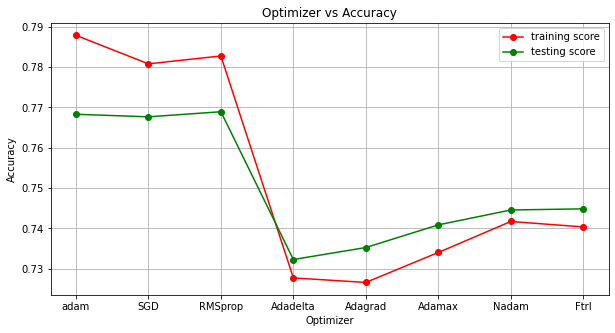

In [108]:
# Plot learning curve
fig, ax = plt.subplots(1, 1, figsize=(10, 5))
    
ax.set_title('Optimizer vs Accuracy')
ax.set_xlabel("Optimizer")
ax.set_ylabel("Accuracy")
ax.grid()

x = ['adam','SGD','RMSprop','Adadelta','Adagrad','Adamax','Nadam','Ftrl']

ax.plot(x, [adamTrain, SGDTrain, RMSpropTrain, AdadeltaTrain, AdagradTrain, AdamaxTrain, NadamTrain, FtrlTrain], 'o-', color="r", label='training score')
ax.plot(x, [adamTest, SGDTest, RMSpropTest, AdadeltaTest, AdagradTest, AdamaxTest, NadamTest, FtrlTest], 'o-', color="g", label='testing score')
ax.legend(loc="best")

plt.show()

### Final Model Using Testing Set

In [111]:
from sklearn import metrics
from sklearn.model_selection import KFold
from tensorflow import keras

model_1 = keras.models.Sequential([
    keras.layers.Dense(17, activation = 'tanh', input_shape=(11,)), 
    keras.layers.Dense(1, activation = 'sigmoid')])

model_1.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])  
fit_score = model_1.fit(X_trainWhite, y_trainWhite, epochs=100, batch_size=10, verbose=1)
model_1.evaluate(X_testWhite, y_testWhite,verbose=1)
Average(fit_score.history['accuracy'])
print('\n')
   


Train on 3168 samples
Epoch 1/100
3168/3168 [==============================] - 1s 341us/sample - loss: 0.5635 - accuracy: 0.7042
Epoch 2/100
3168/3168 [==============================] - 1s 191us/sample - loss: 0.5014 - accuracy: 0.7503
Epoch 3/100
3168/3168 [==============================] - 1s 172us/sample - loss: 0.4938 - accuracy: 0.7610
Epoch 4/100
3168/3168 [==============================] - 1s 167us/sample - loss: 0.4900 - accuracy: 0.7604
Epoch 5/100
3168/3168 [==============================] - 1s 199us/sample - loss: 0.4882 - accuracy: 0.7642
Epoch 6/100
3168/3168 [==============================] - 1s 184us/sample - loss: 0.4860 - accuracy: 0.7648
Epoch 7/100
3168/3168 [==============================] - 1s 170us/sample - loss: 0.4846 - accuracy: 0.7689
Epoch 8/100
3168/3168 [==============================] - 1s 183us/sample - loss: 0.4826 - accuracy: 0.7699
Epoch 9/100
3168/3168 [==============================] - 1s 170us/sample - loss: 0.4812 - accuracy: 0.7699
Epoch 10/100
31

3168/3168 [==============================] - 0s 148us/sample - loss: 0.4385 - accuracy: 0.7970
Epoch 77/100
3168/3168 [==============================] - 0s 151us/sample - loss: 0.4384 - accuracy: 0.8011
Epoch 78/100
3168/3168 [==============================] - 0s 148us/sample - loss: 0.4379 - accuracy: 0.7970
Epoch 79/100
3168/3168 [==============================] - 0s 146us/sample - loss: 0.4376 - accuracy: 0.7996
Epoch 80/100
3168/3168 [==============================] - 0s 148us/sample - loss: 0.4369 - accuracy: 0.8018
Epoch 81/100
3168/3168 [==============================] - 0s 154us/sample - loss: 0.4368 - accuracy: 0.7989
Epoch 82/100
3168/3168 [==============================] - 0s 152us/sample - loss: 0.4366 - accuracy: 0.8021
Epoch 83/100
3168/3168 [==============================] - 0s 151us/sample - loss: 0.4360 - accuracy: 0.7980
Epoch 84/100
3168/3168 [==============================] - 0s 149us/sample - loss: 0.4354 - accuracy: 0.8030
Epoch 85/100
3168/3168 [=================

In [112]:
print(Average(fit_score.history['accuracy']))

0.7898011338710785
